# 03 — Training Conditional DCGAN (Hero Portrait Generator)

В этом ноутбуке мы запускаем обучение **Conditional DCGAN** для генерации пиксельных портретов героев (64×64).

### Исходные данные

- Используем датасет, подготовленный в `02_build_final_dataset.ipynb`:
  - `data/sprites_train.csv`
  - `data/sprites_val.csv`
  - `data/dataset_config.json`
  - `data/label_mappings.json`

- Размер изображений для модели: **64×64** (исходные спрайты 128×128, но в пайплайне мы делаем downscale до 64×64 для ускорения и стабильности обучения).

### Цели ноутбука

1. Загрузить конфиг датасета и мэппинги меток.
2. Собрать PyTorch `DataLoader` для `train` и `val`.
3. Реализовать:
   - `ConditionalGenerator` (z + условие → картинка 64×64),
   - `ConditionalDiscriminator` (картинка + условие → вероятность real/fake).
4. Проверить корректность формы тензоров:
   - прогнать один батч через G и D,
   - убедиться, что градиенты считаются.
5. Подготовить оо
6. Обучить несколько вариантов моделей и оценить результате отладки архитектуры).


In [18]:
import json
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import random
import sys
import torch
import torch.nn as nn
import torchvision.transforms as T
import torchvision.utils as vutils

from datetime import datetime
from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm
from utils.config import DATASET_CONFIG, CDC_GAN_CONFIG

In [2]:
PROJECT_ROOT = Path(r"D:\ML\LS\Deep_learning\GAN\hero_portrait_generator")
DATA_DIR = PROJECT_ROOT / "data"

print("PROJECT_ROOT:", PROJECT_ROOT)
print("DATA_DIR:", DATA_DIR, "exists:", DATA_DIR.exists())

PROJECT_ROOT: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator
DATA_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\data exists: True


In [3]:
sys.path.append(str(PROJECT_ROOT / "src"))
DATASET_CONFIG, CDC_GAN_CONFIG

({'image_size': 64,
  'channels': 3,
  'cond_dim': 16,
  'num_gender_classes': 2,
  'num_hero_classes': 9,
  'num_palette_classes': 5},
 {'image_size': 64,
  'channels': 3,
  'cond_dim': 16,
  'nz': 128,
  'ngf': 64,
  'ndf': 64})

In [4]:
train_csv = DATA_DIR / "sprites_train.csv"
val_csv = DATA_DIR / "sprites_val.csv"

train_df = pd.read_csv(train_csv)
val_df = pd.read_csv(val_csv)

train_df.shape, val_df.shape

((6077, 12), (1519, 12))

In [5]:
with open(DATA_DIR / "label_mappings.json", "r", encoding="utf-8") as f:
    label_mappings = json.load(f)

gender_classes = label_mappings["gender_classes"]
gender_to_idx = label_mappings["gender_to_idx"]
hero_classes = label_mappings["hero_classes"]
hero_to_idx = label_mappings["hero_to_idx"]
palette_classes = label_mappings["palette_classes"]
palette_to_idx = label_mappings["palette_to_idx"]

gender_classes, hero_classes, palette_classes

(['feminine', 'masculine'],
 ['barbarian',
  'bard',
  'cavalry',
  'cleric',
  'knight',
  'mage',
  'ranger',
  'rogue',
  'warrior'],
 ['cool', 'dark', 'muted', 'neutral', 'warm'])

In [6]:
def one_hot(index: int, num_classes: int) -> np.ndarray:
    vec = np.zeros(num_classes, dtype=np.float32)
    vec[index] = 1.0
    return vec

class HeroPortraitDataset(Dataset):
    def __init__(
        self,
        df: pd.DataFrame,
        project_root: Path,
        image_size: int = 64,
        normalize: bool = True,
    ):
        """
        df: DataFrame с колонками:
            - rel_path
            - gender_idx
            - hero_idx
            - palette_idx
            - group_id
            - filename
        """
        self.df = df.reset_index(drop=True)
        self.project_root = Path(project_root)

        self.n_gender = len(gender_classes)
        self.n_hero = len(hero_classes)
        self.n_palette = len(palette_classes)

        tfs = [
            T.Resize((image_size, image_size), interpolation=T.InterpolationMode.NEAREST),
            T.ToTensor(),
        ]
        if normalize:
            # [-1, 1] для DCGAN
            tfs.append(T.Normalize(mean=[0.5, 0.5, 0.5],
                                   std=[0.5, 0.5, 0.5]))
        self.transform = T.Compose(tfs)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        img_path = self.project_root / row["rel_path"]
        img = Image.open(img_path).convert("RGBA")

        if img.mode == "RGBA":
            bg = Image.new("RGBA", img.size, (255, 255, 255, 255))
            img = Image.alpha_composite(bg, img).convert("RGB")
        else:
            img = img.convert("RGB")

        img_tensor = self.transform(img)

        g_idx = int(row["gender_idx"])
        h_idx = int(row["hero_idx"])
        p_idx = int(row["palette_idx"])

        gender_oh = one_hot(g_idx, self.n_gender)
        hero_oh = one_hot(h_idx, self.n_hero)
        palette_oh = one_hot(p_idx, self.n_palette)

        cond_vec = np.concatenate([gender_oh, hero_oh, palette_oh]).astype(np.float32)
        cond_tensor = torch.from_numpy(cond_vec)

        sample = {
            "image": img_tensor,
            "cond": cond_tensor,
            "gender_idx": g_idx,
            "hero_idx": h_idx,
            "palette_idx": p_idx,
            "group_id": int(row["group_id"]),
            "filename": row["filename"],
        }
        return sample


In [7]:
BATCH_SIZE = 64
IMAGE_SIZE = CDC_GAN_CONFIG["image_size"]

train_dataset = HeroPortraitDataset(train_df, project_root=PROJECT_ROOT, image_size=IMAGE_SIZE)
val_dataset = HeroPortraitDataset(val_df, project_root=PROJECT_ROOT, image_size=IMAGE_SIZE)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=0, pin_memory=False)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=False)

len(train_dataset), len(val_dataset)


(6077, 1519)

## Модели: Conditional Generator и Conditional Discriminator

Используем простой подход к условности:
- в генераторе: конкатенируем `z` и `cond` и подаём в полносвязный слой, далее — upsampling через ConvTranspose2d;
- в дискриминаторе: конкатенируем `image` и картинку из условия (`cond` развёрнутое в карту признаков) по каналам.

In [8]:
class ConditionalGenerator(nn.Module):
    def __init__(self, nz: int, cond_dim: int, ngf: int = 64, nc: int = 3):
        super().__init__()
        self.nz = nz
        self.cond_dim = cond_dim

        input_dim = nz + cond_dim  # конкат z и cond

        self.fc = nn.Linear(input_dim, ngf * 8 * 4 * 4)

        self.net = nn.Sequential(
            # 4x4 -> 8x8
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),

            # 8x8 -> 16x16
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),

            # 16x16 -> 32x32
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            # 32x32 -> 64x64
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh(),  # выход в диапазоне [-1, 1]
        )

    def forward(self, z, cond):
        """
        z:    [B, nz]
        cond: [B, cond_dim]
        """
        x = torch.cat([z, cond], dim=1)    # [B, nz+cond_dim]
        x = self.fc(x)                     # [B, ngf*8*4*4]
        x = x.view(x.size(0), -1, 4, 4)    # [B, ngf*8, 4, 4]
        out = self.net(x)                  # [B, 3, 64, 64]
        return out

In [9]:
class ConditionalDiscriminator(nn.Module):
    def __init__(self, cond_dim: int, ndf: int = 64, nc: int = 3):
        super().__init__()
        self.cond_dim = cond_dim

        in_channels = nc + cond_dim  # 3 + 16

        self.net = nn.Sequential(
            # 64x64 -> 32x32
            nn.Conv2d(in_channels, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # 32x32 -> 16x16
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),

            # 16x16 -> 8x8
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),

            # 8x8 -> 4x4
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),

            # 4x4 -> 1x1
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid(),
        )

    def forward(self, img, cond):
        """
        img:   [B, 3, 64, 64]
        cond:  [B, cond_dim]
        """
        B = img.size(0)
        cond_map = cond.view(B, self.cond_dim, 1, 1).expand(-1, -1, img.size(2), img.size(3))
        x = torch.cat([img, cond_map], dim=1)  # [B, 3+cond_dim, 64, 64]
        out = self.net(x)                      # [B, 1, 1, 1]
        return out.view(-1)                    # [B]

In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [11]:
nz = CDC_GAN_CONFIG["nz"]
cond_dim = CDC_GAN_CONFIG["cond_dim"]
ngf = CDC_GAN_CONFIG["ngf"]
ndf = CDC_GAN_CONFIG["ndf"]
nc = CDC_GAN_CONFIG["channels"]

G = ConditionalGenerator(nz=nz, cond_dim=cond_dim, ngf=ngf, nc=nc).to(device)
D = ConditionalDiscriminator(cond_dim=cond_dim, ndf=ndf, nc=nc).to(device)

sum(p.numel() for p in G.parameters()), sum(p.numel() for p in D.parameters())

(3944320, 2781952)

In [12]:
batch = next(iter(train_loader))
real_images = batch["image"].to(device)     # [B, 3, 64, 64]
conds = batch["cond"].to(device)            # [B, 16]
B = real_images.size(0)

z = torch.randn(B, nz, device=device)       # шум

fake_images = G(z, conds)                   # [B, 3, 64, 64]
real_scores = D(real_images, conds)         # [B]
fake_scores = D(fake_images.detach(), conds)

print("real_images:", real_images.shape)
print("fake_images:", fake_images.shape)
print("real_scores:", real_scores.shape)
print("fake_scores:", fake_scores.shape)

real_images: torch.Size([64, 3, 64, 64])
fake_images: torch.Size([64, 3, 64, 64])
real_scores: torch.Size([64])
fake_scores: torch.Size([64])


In [13]:
criterion = nn.BCELoss()
optimizerD = torch.optim.Adam(D.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizerG = torch.optim.Adam(G.parameters(), lr=2e-4, betas=(0.5, 0.999))

# Метим лейблы
real_label = 1.0
fake_label = 0.0

# шаг для D
D.zero_grad(set_to_none=True)

label_real = torch.full((B,), real_label, device=device)
label_fake = torch.full((B,), fake_label, device=device)

output_real = D(real_images, conds)
loss_D_real = criterion(output_real, label_real)

output_fake = D(fake_images.detach(), conds)
loss_D_fake = criterion(output_fake, label_fake)

loss_D = loss_D_real + loss_D_fake
loss_D.backward()
optimizerD.step()

# шаг для G
G.zero_grad(set_to_none=True)

output_fake_for_G = D(fake_images, conds)
loss_G = criterion(output_fake_for_G, label_real)  # хотим, чтобы D принял фейки за real
loss_G.backward()
optimizerG.step()

loss_D.item(), loss_G.item()

(1.4459233283996582, 1.260332703590393)

In [14]:
num_epochs = 50
batch_size = BATCH_SIZE          
lr = 2e-4
beta1 = 0.5
beta2 = 0.999

nz = CDC_GAN_CONFIG["nz"]
cond_dim = CDC_GAN_CONFIG["cond_dim"]

RUN_ID = datetime.now().strftime("%Y%m%d-%H%M%S")
ARTIFACTS_DIR = PROJECT_ROOT / "artifacts_gan"
SAMPLES_DIR = ARTIFACTS_DIR / "samples" / RUN_ID
CKPT_DIR = ARTIFACTS_DIR / "checkpoints" / RUN_ID

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
CKPT_DIR.mkdir(parents=True, exist_ok=True)

print("RUN_ID:", RUN_ID)
print("SAMPLES_DIR:", SAMPLES_DIR)
print("CKPT_DIR:", CKPT_DIR)

RUN_ID: 20251118-210225
SAMPLES_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225
CKPT_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-210225


In [15]:
# Фиксируем несколько условий из train
num_preview = 16
preview_batch = next(iter(train_loader))

fixed_conds = preview_batch["cond"][:num_preview].to(device)  # [16, cond_dim]
fixed_labels = {
    "gender_idx": preview_batch["gender_idx"][:num_preview].tolist(),
    "hero_idx": preview_batch["hero_idx"][:num_preview].tolist(),
    "palette_idx": preview_batch["palette_idx"][:num_preview].tolist(),
}

fixed_noise = torch.randn(num_preview, nz, device=device)

fixed_conds.shape, fixed_noise.shape, fixed_labels

(torch.Size([16, 16]),
 torch.Size([16, 128]),
 {'gender_idx': [1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0],
  'hero_idx': [1, 8, 6, 8, 8, 8, 4, 2, 2, 8, 8, 5, 3, 0, 8, 7],
  'palette_idx': [1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 0, 3, 1, 0, 1]})

In [16]:
criterion = nn.BCELoss()

optimizerD = torch.optim.Adam(D.parameters(), lr=lr, betas=(beta1, beta2))
optimizerG = torch.optim.Adam(G.parameters(), lr=lr, betas=(beta1, beta2))

In [17]:
def denorm(img_batch):
    return (img_batch * 0.5) + 0.5  # [-1,1] -> [0,1]

def save_sample_images(epoch, G, fixed_noise, fixed_conds, samples_dir: Path):
    G.eval()
    with torch.no_grad():
        fake = G(fixed_noise, fixed_conds).detach().cpu()
    G.train()

    fake_denorm = denorm(fake)
    grid = vutils.make_grid(fake_denorm, nrow=4, padding=2)
    out_path = samples_dir / f"epoch_{epoch:03d}.png"

    plt.figure(figsize=(6, 6))
    plt.axis("off")
    plt.imshow(grid.permute(1, 2, 0).numpy())
    plt.tight_layout()
    plt.savefig(out_path, dpi=150)
    plt.close()

    print(f"[samples] Saved: {out_path}")


In [19]:
real_label = 1.0
fake_label = 0.0

G.train()
D.train()

losses_G = []
losses_D = []

for epoch in range(1, num_epochs + 1):
    G.train()
    D.train()

    epoch_loss_G = 0.0
    epoch_loss_D = 0.0
    num_batches = 0

    pbar = tqdm(
        train_loader,
        desc=f"Epoch [{epoch}/{num_epochs}]",
        leave=False
    )

    for batch in pbar:
        real_images = batch["image"].to(device)     # [B, 3, 64, 64]
        conds = batch["cond"].to(device)            # [B, 16]
        B = real_images.size(0)

        # Лейблы
        label_real = torch.full((B,), real_label, device=device)
        label_fake = torch.full((B,), fake_label, device=device)

        # Обновление D
        D.zero_grad(set_to_none=True)

        # Реальные
        output_real = D(real_images, conds)
        loss_D_real = criterion(output_real, label_real)

        # Фейковые
        z = torch.randn(B, nz, device=device)
        fake_images = G(z, conds)

        output_fake = D(fake_images.detach(), conds)
        loss_D_fake = criterion(output_fake, label_fake)

        loss_D = loss_D_real + loss_D_fake
        loss_D.backward()
        optimizerD.step()

        # Обновление G
        G.zero_grad(set_to_none=True)

        output_fake_for_G = D(fake_images, conds)
        loss_G = criterion(output_fake_for_G, label_real)  # хотим, чтобы D принял фейки за real
        loss_G.backward()
        optimizerG.step()

        epoch_loss_D += loss_D.item()
        epoch_loss_G += loss_G.item()
        num_batches += 1

        # обновляем строку прогрессбара текущими лоссами
        pbar.set_postfix({
            "loss_D": f"{loss_D.item():.3f}",
            "loss_G": f"{loss_G.item():.3f}"
        })

    # средние по эпохе
    epoch_loss_D /= num_batches
    epoch_loss_G /= num_batches
    losses_D.append(epoch_loss_D)
    losses_G.append(epoch_loss_G)

    # сводка по эпохе
    print(
        f"[Epoch {epoch:03d}/{num_epochs}] "
        f"mean loss_D: {epoch_loss_D:.4f} | "
        f"mean loss_G: {epoch_loss_G:.4f} | "
        f"remaining: {num_epochs - epoch} epochs"
    )

    # Сохранение сэмплов
    if epoch % 5 == 0 or epoch == 1:
        save_sample_images(epoch, G, fixed_noise, fixed_conds, SAMPLES_DIR)

    # Сохранение чекпоинта
    if epoch % 10 == 0 or epoch == num_epochs:
        ckpt_path = CKPT_DIR / f"cdcgan_epoch_{epoch:03d}.pth"
        torch.save(
            {
                "epoch": epoch,
                "G_state_dict": G.state_dict(),
                "D_state_dict": D.state_dict(),
                "optimizerG_state_dict": optimizerG.state_dict(),
                "optimizerD_state_dict": optimizerD.state_dict(),
                "losses_G": losses_G,
                "losses_D": losses_D,
                "config": CDC_GAN_CONFIG,
            },
            ckpt_path,
        )
        print(f"[ckpt] Saved: {ckpt_path}")

Epoch [1/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 001/50] mean loss_D: 0.5905 | mean loss_G: 4.0972 | remaining: 49 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_001.png


Epoch [2/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 002/50] mean loss_D: 0.6321 | mean loss_G: 3.7888 | remaining: 48 epochs


Epoch [3/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 003/50] mean loss_D: 0.4810 | mean loss_G: 4.2870 | remaining: 47 epochs


Epoch [4/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 004/50] mean loss_D: 0.2413 | mean loss_G: 4.9054 | remaining: 46 epochs


Epoch [5/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 005/50] mean loss_D: 0.2352 | mean loss_G: 5.5969 | remaining: 45 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_005.png


Epoch [6/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 006/50] mean loss_D: 0.2218 | mean loss_G: 5.6689 | remaining: 44 epochs


Epoch [7/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 007/50] mean loss_D: 0.2071 | mean loss_G: 5.6337 | remaining: 43 epochs


Epoch [8/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 008/50] mean loss_D: 0.2702 | mean loss_G: 5.9267 | remaining: 42 epochs


Epoch [9/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 009/50] mean loss_D: 0.0975 | mean loss_G: 5.2480 | remaining: 41 epochs


Epoch [10/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 010/50] mean loss_D: 0.2638 | mean loss_G: 6.0695 | remaining: 40 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_010.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-210225\cdcgan_epoch_010.pth


Epoch [11/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 011/50] mean loss_D: 0.1393 | mean loss_G: 5.7035 | remaining: 39 epochs


Epoch [12/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 012/50] mean loss_D: 0.0489 | mean loss_G: 5.4527 | remaining: 38 epochs


Epoch [13/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 013/50] mean loss_D: 0.0296 | mean loss_G: 5.5838 | remaining: 37 epochs


Epoch [14/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 014/50] mean loss_D: 0.0353 | mean loss_G: 6.0932 | remaining: 36 epochs


Epoch [15/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 015/50] mean loss_D: 0.5835 | mean loss_G: 6.7574 | remaining: 35 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_015.png


Epoch [16/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 016/50] mean loss_D: 0.1960 | mean loss_G: 7.6453 | remaining: 34 epochs


Epoch [17/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 017/50] mean loss_D: 0.0914 | mean loss_G: 5.8333 | remaining: 33 epochs


Epoch [18/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 018/50] mean loss_D: 0.2054 | mean loss_G: 6.4477 | remaining: 32 epochs


Epoch [19/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 019/50] mean loss_D: 0.0516 | mean loss_G: 6.4263 | remaining: 31 epochs


Epoch [20/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 020/50] mean loss_D: 0.0265 | mean loss_G: 5.7080 | remaining: 30 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_020.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-210225\cdcgan_epoch_020.pth


Epoch [21/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 021/50] mean loss_D: 0.0223 | mean loss_G: 5.7037 | remaining: 29 epochs


Epoch [22/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 022/50] mean loss_D: 0.0278 | mean loss_G: 6.0439 | remaining: 28 epochs


Epoch [23/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 023/50] mean loss_D: 0.0167 | mean loss_G: 6.0467 | remaining: 27 epochs


Epoch [24/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 024/50] mean loss_D: 0.4615 | mean loss_G: 7.2725 | remaining: 26 epochs


Epoch [25/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 025/50] mean loss_D: 0.0941 | mean loss_G: 6.8044 | remaining: 25 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_025.png


Epoch [26/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 026/50] mean loss_D: 0.0494 | mean loss_G: 5.6482 | remaining: 24 epochs


Epoch [27/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 027/50] mean loss_D: 0.0406 | mean loss_G: 5.6582 | remaining: 23 epochs


Epoch [28/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 028/50] mean loss_D: 0.2033 | mean loss_G: 6.0830 | remaining: 22 epochs


Epoch [29/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 029/50] mean loss_D: 0.1179 | mean loss_G: 7.9271 | remaining: 21 epochs


Epoch [30/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 030/50] mean loss_D: 0.0323 | mean loss_G: 5.9696 | remaining: 20 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_030.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-210225\cdcgan_epoch_030.pth


Epoch [31/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 031/50] mean loss_D: 0.0744 | mean loss_G: 7.1623 | remaining: 19 epochs


Epoch [32/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 032/50] mean loss_D: 0.0417 | mean loss_G: 8.4245 | remaining: 18 epochs


Epoch [33/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 033/50] mean loss_D: 0.0462 | mean loss_G: 6.5271 | remaining: 17 epochs


Epoch [34/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 034/50] mean loss_D: 0.0219 | mean loss_G: 5.9068 | remaining: 16 epochs


Epoch [35/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 035/50] mean loss_D: 0.0205 | mean loss_G: 6.0205 | remaining: 15 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_035.png


Epoch [36/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 036/50] mean loss_D: 0.0199 | mean loss_G: 6.3199 | remaining: 14 epochs


Epoch [37/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 037/50] mean loss_D: 0.0360 | mean loss_G: 8.5347 | remaining: 13 epochs


Epoch [38/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 038/50] mean loss_D: 0.0136 | mean loss_G: 6.2375 | remaining: 12 epochs


Epoch [39/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 039/50] mean loss_D: 0.3777 | mean loss_G: 7.8653 | remaining: 11 epochs


Epoch [40/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 040/50] mean loss_D: 0.0365 | mean loss_G: 6.5640 | remaining: 10 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_040.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-210225\cdcgan_epoch_040.pth


Epoch [41/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 041/50] mean loss_D: 0.0247 | mean loss_G: 5.8632 | remaining: 9 epochs


Epoch [42/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 042/50] mean loss_D: 0.2671 | mean loss_G: 7.9530 | remaining: 8 epochs


Epoch [43/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 043/50] mean loss_D: 0.0339 | mean loss_G: 6.1391 | remaining: 7 epochs


Epoch [44/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 044/50] mean loss_D: 0.0336 | mean loss_G: 6.0611 | remaining: 6 epochs


Epoch [45/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 045/50] mean loss_D: 0.0263 | mean loss_G: 5.9909 | remaining: 5 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_045.png


Epoch [46/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 046/50] mean loss_D: 0.0139 | mean loss_G: 5.8171 | remaining: 4 epochs


Epoch [47/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 047/50] mean loss_D: 0.0168 | mean loss_G: 6.3528 | remaining: 3 epochs


Epoch [48/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 048/50] mean loss_D: 0.3089 | mean loss_G: 8.2527 | remaining: 2 epochs


Epoch [49/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 049/50] mean loss_D: 0.1219 | mean loss_G: 8.1428 | remaining: 1 epochs


Epoch [50/50]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 050/50] mean loss_D: 0.0322 | mean loss_G: 5.9023 | remaining: 0 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_050.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-210225\cdcgan_epoch_050.pth


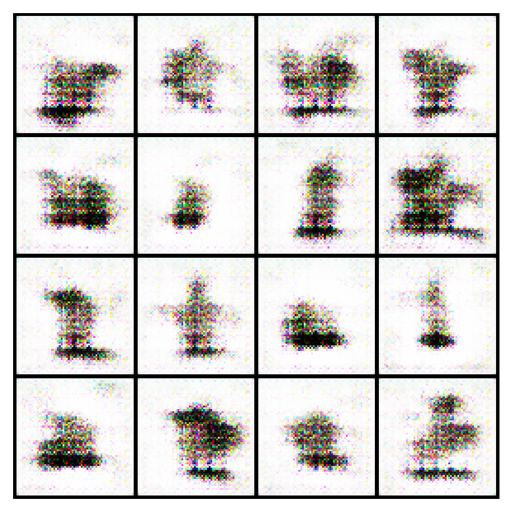

Epoch 1 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_001.png


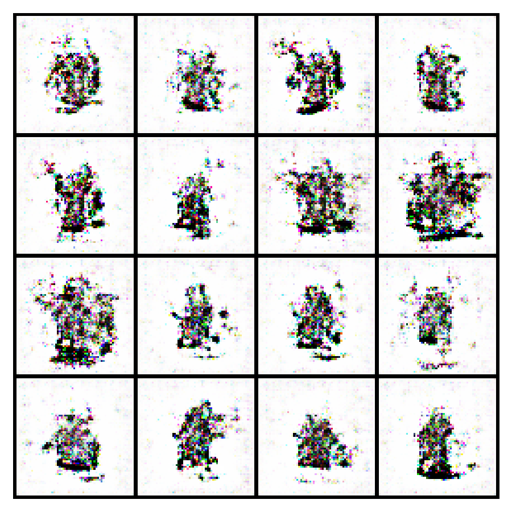

Epoch 5 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_005.png


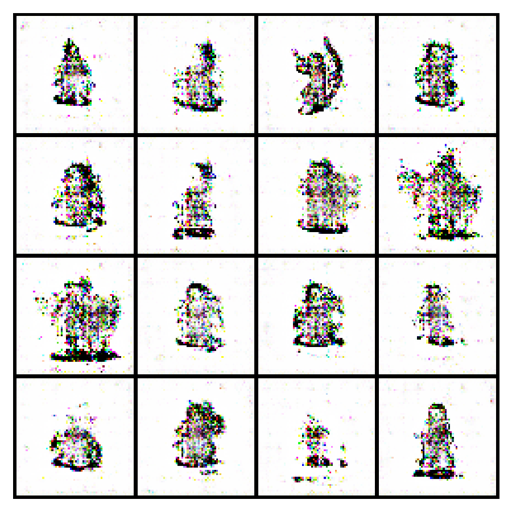

Epoch 10 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_010.png


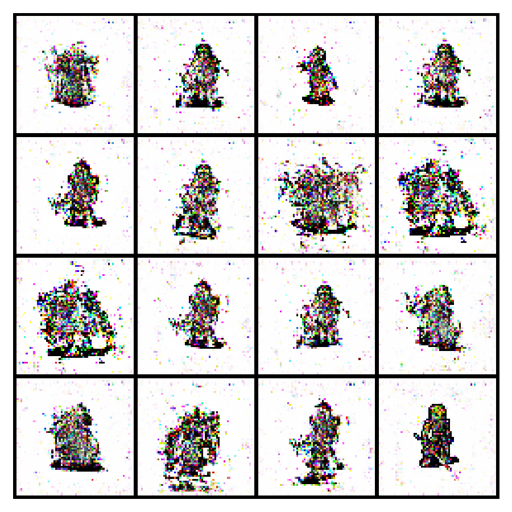

Epoch 20 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_020.png


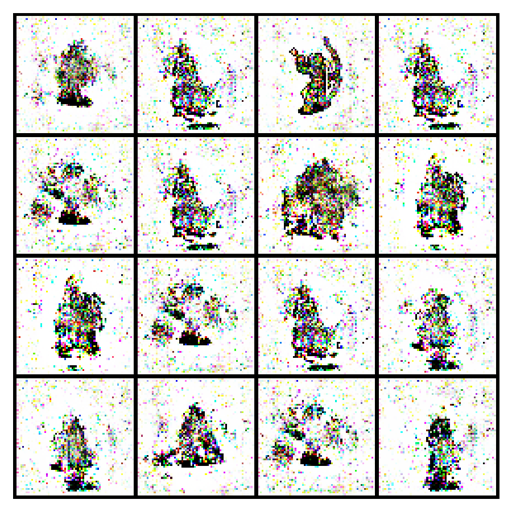

Epoch 30 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_030.png


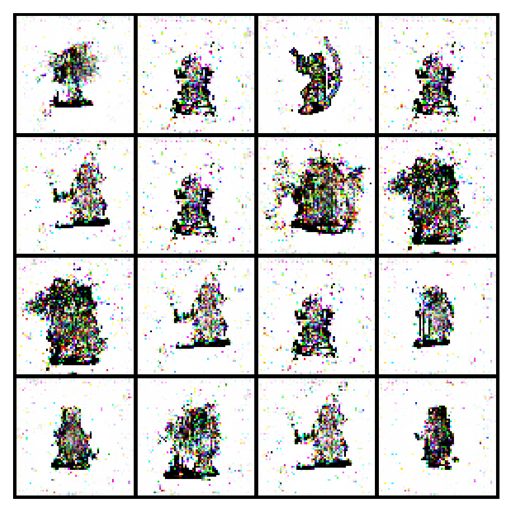

Epoch 40 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_040.png


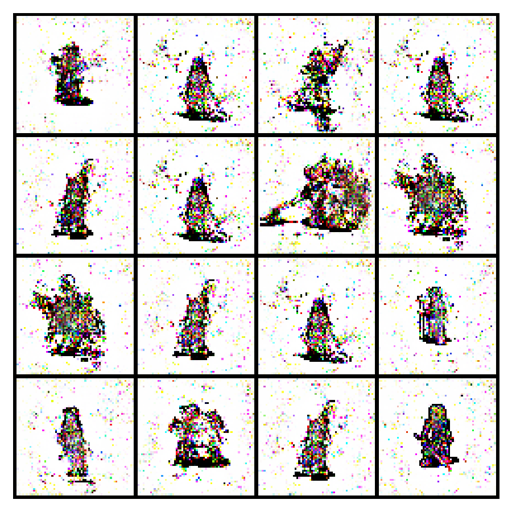

Epoch 50 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-210225\epoch_050.png


In [20]:
run_id = "20251118-210225" 
samples_root = PROJECT_ROOT / "artifacts_gan" / "samples" / run_id

for epoch in [1, 5, 10, 20, 30, 40, 50]:
    img_path = samples_root / f"epoch_{epoch:03d}.png"
    if img_path.exists():
        display(Image.open(img_path).resize((512, 512)))
        print("Epoch", epoch, "→", img_path)
    else:
        print("No image for epoch", epoch)

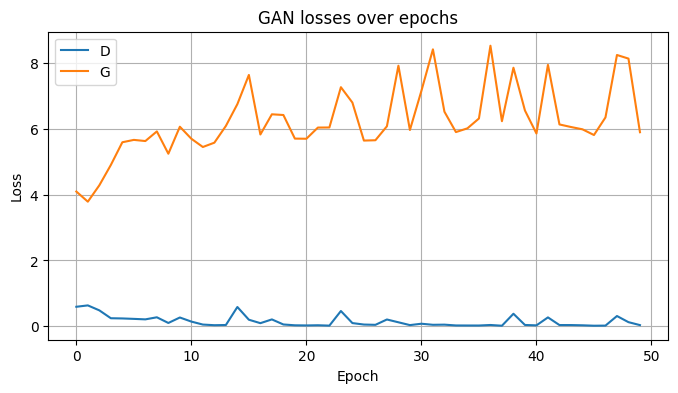

In [21]:
plt.figure(figsize=(8, 4))
plt.plot(losses_D, label="D")
plt.plot(losses_G, label="G")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.title("GAN losses over epochs")
plt.show()

In [22]:
def build_cond_vector(g_idx: int, h_idx: int, p_idx: int) -> torch.Tensor:
    gender_oh = one_hot(g_idx, len(gender_classes))
    hero_oh = one_hot(h_idx, len(hero_classes))
    palette_oh = one_hot(p_idx, len(palette_classes))
    cond_vec = np.concatenate([gender_oh, hero_oh, palette_oh]).astype(np.float32)
    return torch.from_numpy(cond_vec)

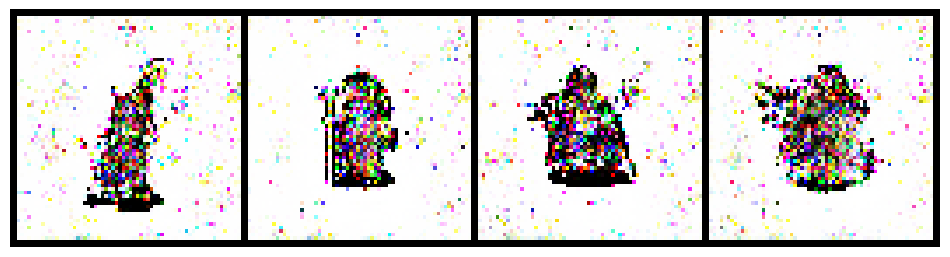

['masculine, warrior, warm',
 'masculine, mage, warm',
 'masculine, rogue, warm',
 'masculine, cleric, warm']

In [23]:
G.eval()

rows = ["warrior", "mage", "rogue", "cleric"]
palette_name = "warm"
gender_name = "masculine"

g_idx = gender_to_idx[gender_name]
p_idx = palette_to_idx[palette_name]

conds_list = []
labels = []

for hero_name in rows:
    h_idx = hero_to_idx[hero_name]
    cond = build_cond_vector(g_idx, h_idx, p_idx)
    conds_list.append(cond)
    labels.append(f"{gender_name}, {hero_name}, {palette_name}")

conds_tensor = torch.stack(conds_list, dim=0).to(device)  # [4, cond_dim]
z = torch.randn(len(rows), nz, device=device)

with torch.no_grad():
    fake = G(z, conds_tensor).cpu()

fake_denorm = denorm(fake)
grid = vutils.make_grid(fake_denorm, nrow=len(rows), padding=2)

plt.figure(figsize=(12, 4))
plt.axis("off")
plt.imshow(grid.permute(1, 2, 0).numpy())
plt.show()

labels

In [24]:
final_G_path = CKPT_DIR / "cdcgan_G_final.pth"
torch.save(G.state_dict(), final_G_path)
final_G_path

WindowsPath('D:/ML/LS/Deep_learning/GAN/hero_portrait_generator/artifacts_gan/checkpoints/20251118-210225/cdcgan_G_final.pth')

In [25]:
num_epochs = 100          # увеличили до 100
batch_size = BATCH_SIZE   # 64
lr = 2e-4
beta1 = 0.5
beta2 = 0.999

nz = CDC_GAN_CONFIG["nz"]
cond_dim = CDC_GAN_CONFIG["cond_dim"]

# Новый RUN_ID
RUN_ID = datetime.now().strftime("%Y%m%d-%H%M%S")
ARTIFACTS_DIR = PROJECT_ROOT / "artifacts_gan"
SAMPLES_DIR = ARTIFACTS_DIR / "samples" / RUN_ID
CKPT_DIR = ARTIFACTS_DIR / "checkpoints" / RUN_ID

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
CKPT_DIR.mkdir(parents=True, exist_ok=True)

print("RUN_ID:", RUN_ID)
print("SAMPLES_DIR:", SAMPLES_DIR)
print("CKPT_DIR:", CKPT_DIR)

RUN_ID: 20251118-222741
SAMPLES_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741
CKPT_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741


In [26]:
# Переинициализируем модели с нуля
G = ConditionalGenerator(
    nz=nz,
    cond_dim=cond_dim,
    ngf=CDC_GAN_CONFIG["ngf"],
    nc=CDC_GAN_CONFIG["channels"]
).to(device)

D = ConditionalDiscriminator(
    cond_dim=cond_dim,
    ndf=CDC_GAN_CONFIG["ndf"],
    nc=CDC_GAN_CONFIG["channels"]
).to(device)

print("Params G:", sum(p.numel() for p in G.parameters()))
print("Params D:", sum(p.numel() for p in D.parameters()))

criterion = nn.BCELoss()

optimizerD = torch.optim.Adam(D.parameters(), lr=lr, betas=(beta1, beta2))
optimizerG = torch.optim.Adam(G.parameters(), lr=lr, betas=(beta1, beta2))

Params G: 3944320
Params D: 2781952


In [27]:
# Фиксируем небольшой набор условий и шума для мониторинга качества
num_preview = 16
preview_batch = next(iter(train_loader))

fixed_conds = preview_batch["cond"][:num_preview].to(device)  # [16, cond_dim]
fixed_labels = {
    "gender_idx": preview_batch["gender_idx"][:num_preview].tolist(),
    "hero_idx": preview_batch["hero_idx"][:num_preview].tolist(),
    "palette_idx": preview_batch["palette_idx"][:num_preview].tolist(),
}

fixed_noise = torch.randn(num_preview, nz, device=device)

fixed_conds.shape, fixed_noise.shape

(torch.Size([16, 16]), torch.Size([16, 128]))

In [29]:
def add_instance_noise(x, epoch, max_epochs, sigma_start=0.1, sigma_end=0.0):
    """
    Добавляем немного гауссовского шума к входу дискриминатора.
    σ линейно уменьшается от sigma_start до sigma_end по эпохам.
    """
    t = epoch / max_epochs
    sigma = sigma_start * (1 - t) + sigma_end * t
    if sigma <= 0:
        return x
    noise = torch.randn_like(x) * sigma
    return x + noise


def save_sample_images(epoch, G, fixed_noise, fixed_conds, samples_dir: Path):
    G.eval()
    with torch.no_grad():
        fake = G(fixed_noise, fixed_conds).detach().cpu()
    G.train()

    fake_denorm = denorm(fake)
    grid = vutils.make_grid(fake_denorm, nrow=4, padding=2)
    out_path = samples_dir / f"epoch_{epoch:03d}.png"

    plt.figure(figsize=(6, 6))
    plt.axis("off")
    plt.imshow(grid.permute(1, 2, 0).numpy())
    plt.tight_layout()
    plt.savefig(out_path, dpi=150)
    plt.close()

    print(f"[samples] Saved: {out_path}")


In [31]:
num_epochs = 500

In [32]:
real_label = 0.9   # label smoothing для real
fake_label = 0.0

G.train()
D.train()

losses_G = []
losses_D = []

for epoch in range(1, num_epochs + 1):
    G.train()
    D.train()

    epoch_loss_G = 0.0
    epoch_loss_D = 0.0
    num_batches = 0

    pbar = tqdm(
        train_loader,
        desc=f"Epoch [{epoch}/{num_epochs}]",
        leave=False
    )

    for batch in pbar:
        real_images = batch["image"].to(device)  # [B, 3, 64, 64]
        conds = batch["cond"].to(device)         # [B, cond_dim]
        B = real_images.size(0)

        # Лейблы
        label_real = torch.full((B,), real_label, device=device)
        label_fake = torch.full((B,), fake_label, device=device)

        # Обновляем D
        D.zero_grad(set_to_none=True)

        # Instance noise
        real_images_noisy = add_instance_noise(real_images, epoch, num_epochs)

        # Реальные
        output_real = D(real_images_noisy, conds)
        loss_D_real = criterion(output_real, label_real)

        # Фейковые
        z = torch.randn(B, nz, device=device)
        fake_images = G(z, conds)

        fake_images_noisy = add_instance_noise(fake_images.detach(), epoch, num_epochs)
        output_fake = D(fake_images_noisy, conds)
        loss_D_fake = criterion(output_fake, label_fake)

        loss_D = loss_D_real + loss_D_fake
        loss_D.backward()
        optimizerD.step()

        # Обновляем G
        G.zero_grad(set_to_none=True)

        output_fake_for_G = D(fake_images, conds)
        loss_G = criterion(output_fake_for_G, label_real)
        loss_G.backward()
        optimizerG.step()

        epoch_loss_D += loss_D.item()
        epoch_loss_G += loss_G.item()
        num_batches += 1

        pbar.set_postfix({
            "loss_D": f"{loss_D.item():.3f}",
            "loss_G": f"{loss_G.item():.3f}"
        })

    epoch_loss_D /= num_batches
    epoch_loss_G /= num_batches
    losses_D.append(epoch_loss_D)
    losses_G.append(epoch_loss_G)

    print(
        f"[Epoch {epoch:03d}/{num_epochs}] "
        f"mean loss_D: {epoch_loss_D:.4f} | "
        f"mean loss_G: {epoch_loss_G:.4f} | "
        f"remaining: {num_epochs - epoch} epochs"
    )

    # Сэмплы
    if epoch % 5 == 0 or epoch == 1:
        save_sample_images(epoch, G, fixed_noise, fixed_conds, SAMPLES_DIR)

    # Чекпоинт
    if epoch % 10 == 0 or epoch == num_epochs:
        ckpt_path = CKPT_DIR / f"cdcgan_epoch_{epoch:03d}.pth"
        torch.save(
            {
                "epoch": epoch,
                "G_state_dict": G.state_dict(),
                "D_state_dict": D.state_dict(),
                "optimizerG_state_dict": optimizerG.state_dict(),
                "optimizerD_state_dict": optimizerD.state_dict(),
                "losses_G": losses_G,
                "losses_D": losses_D,
                "config": CDC_GAN_CONFIG,
            },
            ckpt_path,
        )
        print(f"[ckpt] Saved: {ckpt_path}")


Epoch [1/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 001/500] mean loss_D: 0.3495 | mean loss_G: 5.0846 | remaining: 499 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_001.png


Epoch [2/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 002/500] mean loss_D: 0.3658 | mean loss_G: 5.2887 | remaining: 498 epochs


Epoch [3/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 003/500] mean loss_D: 0.3547 | mean loss_G: 5.1435 | remaining: 497 epochs


Epoch [4/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 004/500] mean loss_D: 0.3562 | mean loss_G: 5.2585 | remaining: 496 epochs


Epoch [5/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 005/500] mean loss_D: 0.3552 | mean loss_G: 5.1844 | remaining: 495 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_005.png


Epoch [6/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 006/500] mean loss_D: 0.3528 | mean loss_G: 5.2211 | remaining: 494 epochs


Epoch [7/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 007/500] mean loss_D: 0.3455 | mean loss_G: 5.3112 | remaining: 493 epochs


Epoch [8/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 008/500] mean loss_D: 0.3499 | mean loss_G: 5.3492 | remaining: 492 epochs


Epoch [9/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 009/500] mean loss_D: 0.3582 | mean loss_G: 5.3007 | remaining: 491 epochs


Epoch [10/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 010/500] mean loss_D: 0.3578 | mean loss_G: 5.5110 | remaining: 490 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_010.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_010.pth


Epoch [11/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 011/500] mean loss_D: 0.3588 | mean loss_G: 5.3349 | remaining: 489 epochs


Epoch [12/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 012/500] mean loss_D: 0.3594 | mean loss_G: 5.2992 | remaining: 488 epochs


Epoch [13/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 013/500] mean loss_D: 0.3604 | mean loss_G: 5.2589 | remaining: 487 epochs


Epoch [14/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 014/500] mean loss_D: 0.3515 | mean loss_G: 5.2573 | remaining: 486 epochs


Epoch [15/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 015/500] mean loss_D: 0.4022 | mean loss_G: 5.7608 | remaining: 485 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_015.png


Epoch [16/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 016/500] mean loss_D: 0.3574 | mean loss_G: 5.2380 | remaining: 484 epochs


Epoch [17/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 017/500] mean loss_D: 0.3491 | mean loss_G: 5.1716 | remaining: 483 epochs


Epoch [18/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 018/500] mean loss_D: 0.3544 | mean loss_G: 5.3021 | remaining: 482 epochs


Epoch [19/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 019/500] mean loss_D: 0.3494 | mean loss_G: 5.2192 | remaining: 481 epochs


Epoch [20/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 020/500] mean loss_D: 0.3451 | mean loss_G: 5.3048 | remaining: 480 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_020.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_020.pth


Epoch [21/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 021/500] mean loss_D: 0.5340 | mean loss_G: 5.4892 | remaining: 479 epochs


Epoch [22/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 022/500] mean loss_D: 0.4002 | mean loss_G: 5.4402 | remaining: 478 epochs


Epoch [23/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 023/500] mean loss_D: 0.3607 | mean loss_G: 4.7650 | remaining: 477 epochs


Epoch [24/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 024/500] mean loss_D: 0.3706 | mean loss_G: 5.0267 | remaining: 476 epochs


Epoch [25/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 025/500] mean loss_D: 0.3648 | mean loss_G: 5.0122 | remaining: 475 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_025.png


Epoch [26/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 026/500] mean loss_D: 0.3483 | mean loss_G: 4.9272 | remaining: 474 epochs


Epoch [27/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 027/500] mean loss_D: 0.3571 | mean loss_G: 5.0585 | remaining: 473 epochs


Epoch [28/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 028/500] mean loss_D: 0.3601 | mean loss_G: 4.9856 | remaining: 472 epochs


Epoch [29/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 029/500] mean loss_D: 0.3501 | mean loss_G: 5.0781 | remaining: 471 epochs


Epoch [30/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 030/500] mean loss_D: 0.3546 | mean loss_G: 5.1045 | remaining: 470 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_030.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_030.pth


Epoch [31/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 031/500] mean loss_D: 0.3615 | mean loss_G: 5.2226 | remaining: 469 epochs


Epoch [32/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 032/500] mean loss_D: 0.3489 | mean loss_G: 5.1043 | remaining: 468 epochs


Epoch [33/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 033/500] mean loss_D: 0.3494 | mean loss_G: 5.2220 | remaining: 467 epochs


Epoch [34/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 034/500] mean loss_D: 0.3492 | mean loss_G: 5.3029 | remaining: 466 epochs


Epoch [35/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 035/500] mean loss_D: 0.3444 | mean loss_G: 5.3576 | remaining: 465 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_035.png


Epoch [36/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 036/500] mean loss_D: 0.3552 | mean loss_G: 5.3778 | remaining: 464 epochs


Epoch [37/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 037/500] mean loss_D: 0.3651 | mean loss_G: 5.2001 | remaining: 463 epochs


Epoch [38/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 038/500] mean loss_D: 0.3505 | mean loss_G: 5.3754 | remaining: 462 epochs


Epoch [39/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 039/500] mean loss_D: 0.3450 | mean loss_G: 5.3876 | remaining: 461 epochs


Epoch [40/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 040/500] mean loss_D: 0.3433 | mean loss_G: 5.5053 | remaining: 460 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_040.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_040.pth


Epoch [41/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 041/500] mean loss_D: 0.3503 | mean loss_G: 5.5806 | remaining: 459 epochs


Epoch [42/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 042/500] mean loss_D: 0.3485 | mean loss_G: 5.5136 | remaining: 458 epochs


Epoch [43/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 043/500] mean loss_D: 0.3486 | mean loss_G: 5.3575 | remaining: 457 epochs


Epoch [44/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 044/500] mean loss_D: 0.3547 | mean loss_G: 5.4265 | remaining: 456 epochs


Epoch [45/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 045/500] mean loss_D: 0.3479 | mean loss_G: 5.5655 | remaining: 455 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_045.png


Epoch [46/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 046/500] mean loss_D: 0.3610 | mean loss_G: 5.4726 | remaining: 454 epochs


Epoch [47/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 047/500] mean loss_D: 0.3463 | mean loss_G: 5.5647 | remaining: 453 epochs


Epoch [48/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 048/500] mean loss_D: 0.3615 | mean loss_G: 5.6931 | remaining: 452 epochs


Epoch [49/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 049/500] mean loss_D: 0.3510 | mean loss_G: 5.4163 | remaining: 451 epochs


Epoch [50/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 050/500] mean loss_D: 0.3493 | mean loss_G: 5.4583 | remaining: 450 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_050.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_050.pth


Epoch [51/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 051/500] mean loss_D: 0.3709 | mean loss_G: 6.3416 | remaining: 449 epochs


Epoch [52/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 052/500] mean loss_D: 0.3493 | mean loss_G: 5.4892 | remaining: 448 epochs


Epoch [53/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 053/500] mean loss_D: 0.3487 | mean loss_G: 5.4753 | remaining: 447 epochs


Epoch [54/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 054/500] mean loss_D: 0.3436 | mean loss_G: 5.4533 | remaining: 446 epochs


Epoch [55/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 055/500] mean loss_D: 0.3438 | mean loss_G: 5.5125 | remaining: 445 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_055.png


Epoch [56/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 056/500] mean loss_D: 0.3437 | mean loss_G: 5.5177 | remaining: 444 epochs


Epoch [57/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 057/500] mean loss_D: 0.3425 | mean loss_G: 5.6281 | remaining: 443 epochs


Epoch [58/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 058/500] mean loss_D: 0.3397 | mean loss_G: 5.6434 | remaining: 442 epochs


Epoch [59/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 059/500] mean loss_D: 0.3575 | mean loss_G: 5.7312 | remaining: 441 epochs


Epoch [60/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 060/500] mean loss_D: 0.3477 | mean loss_G: 5.6229 | remaining: 440 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_060.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_060.pth


Epoch [61/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 061/500] mean loss_D: 0.3404 | mean loss_G: 5.6648 | remaining: 439 epochs


Epoch [62/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 062/500] mean loss_D: 0.3436 | mean loss_G: 5.7024 | remaining: 438 epochs


Epoch [63/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 063/500] mean loss_D: 0.3415 | mean loss_G: 5.7196 | remaining: 437 epochs


Epoch [64/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 064/500] mean loss_D: 0.3449 | mean loss_G: 5.7794 | remaining: 436 epochs


Epoch [65/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 065/500] mean loss_D: 0.3431 | mean loss_G: 5.7908 | remaining: 435 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_065.png


Epoch [66/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 066/500] mean loss_D: 0.3373 | mean loss_G: 5.9540 | remaining: 434 epochs


Epoch [67/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 067/500] mean loss_D: 0.3494 | mean loss_G: 5.7273 | remaining: 433 epochs


Epoch [68/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 068/500] mean loss_D: 0.3426 | mean loss_G: 5.8386 | remaining: 432 epochs


Epoch [69/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 069/500] mean loss_D: 0.3455 | mean loss_G: 5.9792 | remaining: 431 epochs


Epoch [70/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 070/500] mean loss_D: 0.3407 | mean loss_G: 5.8840 | remaining: 430 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_070.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_070.pth


Epoch [71/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 071/500] mean loss_D: 0.3448 | mean loss_G: 5.9865 | remaining: 429 epochs


Epoch [72/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 072/500] mean loss_D: 0.3464 | mean loss_G: 5.7866 | remaining: 428 epochs


Epoch [73/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 073/500] mean loss_D: 0.3432 | mean loss_G: 5.8285 | remaining: 427 epochs


Epoch [74/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 074/500] mean loss_D: 0.3403 | mean loss_G: 5.8854 | remaining: 426 epochs


Epoch [75/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 075/500] mean loss_D: 0.3480 | mean loss_G: 5.9092 | remaining: 425 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_075.png


Epoch [76/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 076/500] mean loss_D: 0.3392 | mean loss_G: 5.9526 | remaining: 424 epochs


Epoch [77/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 077/500] mean loss_D: 0.3440 | mean loss_G: 5.7936 | remaining: 423 epochs


Epoch [78/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 078/500] mean loss_D: 0.3679 | mean loss_G: 6.0184 | remaining: 422 epochs


Epoch [79/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 079/500] mean loss_D: 0.3408 | mean loss_G: 5.7117 | remaining: 421 epochs


Epoch [80/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 080/500] mean loss_D: 0.3419 | mean loss_G: 5.7977 | remaining: 420 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_080.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_080.pth


Epoch [81/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 081/500] mean loss_D: 0.3389 | mean loss_G: 5.8836 | remaining: 419 epochs


Epoch [82/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 082/500] mean loss_D: 0.3368 | mean loss_G: 6.0663 | remaining: 418 epochs


Epoch [83/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 083/500] mean loss_D: 0.3368 | mean loss_G: 6.0590 | remaining: 417 epochs


Epoch [84/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 084/500] mean loss_D: 0.3385 | mean loss_G: 6.0411 | remaining: 416 epochs


Epoch [85/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 085/500] mean loss_D: 0.3389 | mean loss_G: 5.9518 | remaining: 415 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_085.png


Epoch [86/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 086/500] mean loss_D: 0.3405 | mean loss_G: 6.0954 | remaining: 414 epochs


Epoch [87/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 087/500] mean loss_D: 0.3415 | mean loss_G: 6.0753 | remaining: 413 epochs


Epoch [88/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 088/500] mean loss_D: 0.3505 | mean loss_G: 6.0530 | remaining: 412 epochs


Epoch [89/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 089/500] mean loss_D: 0.3395 | mean loss_G: 6.0116 | remaining: 411 epochs


Epoch [90/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 090/500] mean loss_D: 0.3446 | mean loss_G: 6.0471 | remaining: 410 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_090.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_090.pth


Epoch [91/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 091/500] mean loss_D: 0.3399 | mean loss_G: 5.9416 | remaining: 409 epochs


Epoch [92/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 092/500] mean loss_D: 0.3379 | mean loss_G: 6.0186 | remaining: 408 epochs


Epoch [93/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 093/500] mean loss_D: 0.3388 | mean loss_G: 5.9648 | remaining: 407 epochs


Epoch [94/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 094/500] mean loss_D: 0.3450 | mean loss_G: 5.9038 | remaining: 406 epochs


Epoch [95/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 095/500] mean loss_D: 0.3402 | mean loss_G: 6.0207 | remaining: 405 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_095.png


Epoch [96/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 096/500] mean loss_D: 0.3429 | mean loss_G: 5.9314 | remaining: 404 epochs


Epoch [97/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 097/500] mean loss_D: 0.3529 | mean loss_G: 6.0442 | remaining: 403 epochs


Epoch [98/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 098/500] mean loss_D: 0.3411 | mean loss_G: 5.9556 | remaining: 402 epochs


Epoch [99/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 099/500] mean loss_D: 0.3384 | mean loss_G: 5.9616 | remaining: 401 epochs


Epoch [100/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 100/500] mean loss_D: 0.3357 | mean loss_G: 5.9296 | remaining: 400 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_100.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_100.pth


Epoch [101/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 101/500] mean loss_D: 0.3589 | mean loss_G: 6.0172 | remaining: 399 epochs


Epoch [102/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 102/500] mean loss_D: 0.3425 | mean loss_G: 5.7690 | remaining: 398 epochs


Epoch [103/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 103/500] mean loss_D: 0.3370 | mean loss_G: 6.0211 | remaining: 397 epochs


Epoch [104/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 104/500] mean loss_D: 0.3330 | mean loss_G: 6.1722 | remaining: 396 epochs


Epoch [105/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 105/500] mean loss_D: 0.3392 | mean loss_G: 6.0991 | remaining: 395 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_105.png


Epoch [106/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 106/500] mean loss_D: 0.3464 | mean loss_G: 6.0346 | remaining: 394 epochs


Epoch [107/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 107/500] mean loss_D: 0.3391 | mean loss_G: 6.1080 | remaining: 393 epochs


Epoch [108/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 108/500] mean loss_D: 0.3363 | mean loss_G: 6.1045 | remaining: 392 epochs


Epoch [109/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 109/500] mean loss_D: 0.3394 | mean loss_G: 6.0425 | remaining: 391 epochs


Epoch [110/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 110/500] mean loss_D: 0.3424 | mean loss_G: 6.2216 | remaining: 390 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_110.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_110.pth


Epoch [111/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 111/500] mean loss_D: 0.3357 | mean loss_G: 6.1782 | remaining: 389 epochs


Epoch [112/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 112/500] mean loss_D: 0.3360 | mean loss_G: 6.2338 | remaining: 388 epochs


Epoch [113/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 113/500] mean loss_D: 0.3337 | mean loss_G: 6.1230 | remaining: 387 epochs


Epoch [114/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 114/500] mean loss_D: 0.3351 | mean loss_G: 6.3126 | remaining: 386 epochs


Epoch [115/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 115/500] mean loss_D: 0.3344 | mean loss_G: 6.4455 | remaining: 385 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_115.png


Epoch [116/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 116/500] mean loss_D: 0.3330 | mean loss_G: 6.3448 | remaining: 384 epochs


Epoch [117/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 117/500] mean loss_D: 0.3329 | mean loss_G: 6.5011 | remaining: 383 epochs


Epoch [118/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 118/500] mean loss_D: 0.3363 | mean loss_G: 6.3009 | remaining: 382 epochs


Epoch [119/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 119/500] mean loss_D: 0.3344 | mean loss_G: 6.4665 | remaining: 381 epochs


Epoch [120/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 120/500] mean loss_D: 0.3363 | mean loss_G: 6.5938 | remaining: 380 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_120.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_120.pth


Epoch [121/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 121/500] mean loss_D: 0.3331 | mean loss_G: 6.4440 | remaining: 379 epochs


Epoch [122/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 122/500] mean loss_D: 0.3394 | mean loss_G: 6.2887 | remaining: 378 epochs


Epoch [123/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 123/500] mean loss_D: 0.3400 | mean loss_G: 6.5191 | remaining: 377 epochs


Epoch [124/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 124/500] mean loss_D: 0.3363 | mean loss_G: 6.3165 | remaining: 376 epochs


Epoch [125/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 125/500] mean loss_D: 0.3376 | mean loss_G: 6.3235 | remaining: 375 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_125.png


Epoch [126/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 126/500] mean loss_D: 0.3468 | mean loss_G: 6.1860 | remaining: 374 epochs


Epoch [127/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 127/500] mean loss_D: 0.3450 | mean loss_G: 6.1128 | remaining: 373 epochs


Epoch [128/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 128/500] mean loss_D: 0.3456 | mean loss_G: 6.4954 | remaining: 372 epochs


Epoch [129/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 129/500] mean loss_D: 0.3386 | mean loss_G: 6.1698 | remaining: 371 epochs


Epoch [130/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 130/500] mean loss_D: 0.3327 | mean loss_G: 6.3458 | remaining: 370 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_130.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_130.pth


Epoch [131/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 131/500] mean loss_D: 0.3345 | mean loss_G: 6.3211 | remaining: 369 epochs


Epoch [132/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 132/500] mean loss_D: 0.3383 | mean loss_G: 6.4738 | remaining: 368 epochs


Epoch [133/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 133/500] mean loss_D: 0.3358 | mean loss_G: 6.4853 | remaining: 367 epochs


Epoch [134/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 134/500] mean loss_D: 0.3352 | mean loss_G: 6.4043 | remaining: 366 epochs


Epoch [135/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 135/500] mean loss_D: 0.3308 | mean loss_G: 6.5541 | remaining: 365 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_135.png


Epoch [136/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 136/500] mean loss_D: 0.3318 | mean loss_G: 6.6024 | remaining: 364 epochs


Epoch [137/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 137/500] mean loss_D: 0.3337 | mean loss_G: 6.3513 | remaining: 363 epochs


Epoch [138/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 138/500] mean loss_D: 0.3318 | mean loss_G: 6.6918 | remaining: 362 epochs


Epoch [139/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 139/500] mean loss_D: 0.3332 | mean loss_G: 6.5537 | remaining: 361 epochs


Epoch [140/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 140/500] mean loss_D: 0.3538 | mean loss_G: 6.3746 | remaining: 360 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_140.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_140.pth


Epoch [141/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 141/500] mean loss_D: 0.3395 | mean loss_G: 6.1562 | remaining: 359 epochs


Epoch [142/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 142/500] mean loss_D: 0.3386 | mean loss_G: 6.2903 | remaining: 358 epochs


Epoch [143/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 143/500] mean loss_D: 0.3351 | mean loss_G: 6.1793 | remaining: 357 epochs


Epoch [144/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 144/500] mean loss_D: 0.3322 | mean loss_G: 6.4661 | remaining: 356 epochs


Epoch [145/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 145/500] mean loss_D: 0.3713 | mean loss_G: 6.3959 | remaining: 355 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_145.png


Epoch [146/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 146/500] mean loss_D: 0.3385 | mean loss_G: 5.7362 | remaining: 354 epochs


Epoch [147/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 147/500] mean loss_D: 0.3445 | mean loss_G: 6.0358 | remaining: 353 epochs


Epoch [148/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 148/500] mean loss_D: 0.3378 | mean loss_G: 6.1327 | remaining: 352 epochs


Epoch [149/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 149/500] mean loss_D: 0.3342 | mean loss_G: 6.3660 | remaining: 351 epochs


Epoch [150/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 150/500] mean loss_D: 0.3336 | mean loss_G: 6.1960 | remaining: 350 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_150.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_150.pth


Epoch [151/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 151/500] mean loss_D: 0.3336 | mean loss_G: 6.4128 | remaining: 349 epochs


Epoch [152/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 152/500] mean loss_D: 0.3325 | mean loss_G: 6.6274 | remaining: 348 epochs


Epoch [153/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 153/500] mean loss_D: 0.3336 | mean loss_G: 6.5503 | remaining: 347 epochs


Epoch [154/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 154/500] mean loss_D: 0.3331 | mean loss_G: 6.6128 | remaining: 346 epochs


Epoch [155/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 155/500] mean loss_D: 0.3304 | mean loss_G: 6.7828 | remaining: 345 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_155.png


Epoch [156/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 156/500] mean loss_D: 0.3304 | mean loss_G: 6.7408 | remaining: 344 epochs


Epoch [157/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 157/500] mean loss_D: 0.3310 | mean loss_G: 6.6371 | remaining: 343 epochs


Epoch [158/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 158/500] mean loss_D: 0.3317 | mean loss_G: 6.6756 | remaining: 342 epochs


Epoch [159/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 159/500] mean loss_D: 0.3310 | mean loss_G: 6.6673 | remaining: 341 epochs


Epoch [160/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 160/500] mean loss_D: 0.3337 | mean loss_G: 6.6261 | remaining: 340 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_160.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_160.pth


Epoch [161/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 161/500] mean loss_D: 0.3327 | mean loss_G: 6.7270 | remaining: 339 epochs


Epoch [162/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 162/500] mean loss_D: 0.3305 | mean loss_G: 6.8013 | remaining: 338 epochs


Epoch [163/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 163/500] mean loss_D: 0.3299 | mean loss_G: 6.8874 | remaining: 337 epochs


Epoch [164/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 164/500] mean loss_D: 0.3389 | mean loss_G: 6.8325 | remaining: 336 epochs


Epoch [165/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 165/500] mean loss_D: 0.3348 | mean loss_G: 6.7303 | remaining: 335 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_165.png


Epoch [166/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 166/500] mean loss_D: 0.3331 | mean loss_G: 6.7142 | remaining: 334 epochs


Epoch [167/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 167/500] mean loss_D: 0.3364 | mean loss_G: 6.7293 | remaining: 333 epochs


Epoch [168/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 168/500] mean loss_D: 0.3361 | mean loss_G: 6.5369 | remaining: 332 epochs


Epoch [169/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 169/500] mean loss_D: 0.3335 | mean loss_G: 6.7184 | remaining: 331 epochs


Epoch [170/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 170/500] mean loss_D: 0.3323 | mean loss_G: 6.5698 | remaining: 330 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_170.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_170.pth


Epoch [171/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 171/500] mean loss_D: 0.3356 | mean loss_G: 6.7668 | remaining: 329 epochs


Epoch [172/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 172/500] mean loss_D: 0.3337 | mean loss_G: 6.8379 | remaining: 328 epochs


Epoch [173/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 173/500] mean loss_D: 0.3317 | mean loss_G: 6.9105 | remaining: 327 epochs


Epoch [174/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 174/500] mean loss_D: 0.3322 | mean loss_G: 6.8379 | remaining: 326 epochs


Epoch [175/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 175/500] mean loss_D: 0.3327 | mean loss_G: 6.8409 | remaining: 325 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_175.png


Epoch [176/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 176/500] mean loss_D: 0.3322 | mean loss_G: 6.8722 | remaining: 324 epochs


Epoch [177/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 177/500] mean loss_D: 0.3312 | mean loss_G: 6.8190 | remaining: 323 epochs


Epoch [178/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 178/500] mean loss_D: 0.3312 | mean loss_G: 6.8701 | remaining: 322 epochs


Epoch [179/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 179/500] mean loss_D: 0.3362 | mean loss_G: 6.7607 | remaining: 321 epochs


Epoch [180/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 180/500] mean loss_D: 0.3315 | mean loss_G: 6.8863 | remaining: 320 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_180.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_180.pth


Epoch [181/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 181/500] mean loss_D: 0.3322 | mean loss_G: 6.8373 | remaining: 319 epochs


Epoch [182/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 182/500] mean loss_D: 0.3297 | mean loss_G: 6.9882 | remaining: 318 epochs


Epoch [183/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 183/500] mean loss_D: 0.3328 | mean loss_G: 6.9745 | remaining: 317 epochs


Epoch [184/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 184/500] mean loss_D: 0.3337 | mean loss_G: 7.0824 | remaining: 316 epochs


Epoch [185/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 185/500] mean loss_D: 0.3349 | mean loss_G: 6.8239 | remaining: 315 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_185.png


Epoch [186/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 186/500] mean loss_D: 0.3359 | mean loss_G: 6.9806 | remaining: 314 epochs


Epoch [187/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 187/500] mean loss_D: 0.3338 | mean loss_G: 6.8072 | remaining: 313 epochs


Epoch [188/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 188/500] mean loss_D: 0.3325 | mean loss_G: 6.8647 | remaining: 312 epochs


Epoch [189/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 189/500] mean loss_D: 0.3307 | mean loss_G: 6.8368 | remaining: 311 epochs


Epoch [190/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 190/500] mean loss_D: 0.3528 | mean loss_G: 6.5917 | remaining: 310 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_190.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_190.pth


Epoch [191/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 191/500] mean loss_D: 0.3332 | mean loss_G: 6.4912 | remaining: 309 epochs


Epoch [192/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 192/500] mean loss_D: 0.3289 | mean loss_G: 6.7546 | remaining: 308 epochs


Epoch [193/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 193/500] mean loss_D: 0.3302 | mean loss_G: 6.7451 | remaining: 307 epochs


Epoch [194/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 194/500] mean loss_D: 0.3294 | mean loss_G: 6.8990 | remaining: 306 epochs


Epoch [195/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 195/500] mean loss_D: 0.3297 | mean loss_G: 7.0726 | remaining: 305 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_195.png


Epoch [196/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 196/500] mean loss_D: 0.3289 | mean loss_G: 7.0425 | remaining: 304 epochs


Epoch [197/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 197/500] mean loss_D: 0.3288 | mean loss_G: 7.1705 | remaining: 303 epochs


Epoch [198/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 198/500] mean loss_D: 0.3281 | mean loss_G: 7.3221 | remaining: 302 epochs


Epoch [199/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 199/500] mean loss_D: 0.3283 | mean loss_G: 7.5475 | remaining: 301 epochs


Epoch [200/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 200/500] mean loss_D: 0.3277 | mean loss_G: 7.4250 | remaining: 300 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_200.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_200.pth


Epoch [201/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 201/500] mean loss_D: 0.3291 | mean loss_G: 7.2794 | remaining: 299 epochs


Epoch [202/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 202/500] mean loss_D: 0.3313 | mean loss_G: 7.4370 | remaining: 298 epochs


Epoch [203/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 203/500] mean loss_D: 0.3292 | mean loss_G: 7.2979 | remaining: 297 epochs


Epoch [204/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 204/500] mean loss_D: 0.3999 | mean loss_G: 7.5203 | remaining: 296 epochs


Epoch [205/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 205/500] mean loss_D: 0.3411 | mean loss_G: 5.8030 | remaining: 295 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_205.png


Epoch [206/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 206/500] mean loss_D: 0.3330 | mean loss_G: 6.0824 | remaining: 294 epochs


Epoch [207/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 207/500] mean loss_D: 0.3360 | mean loss_G: 6.3812 | remaining: 293 epochs


Epoch [208/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 208/500] mean loss_D: 0.3305 | mean loss_G: 6.5178 | remaining: 292 epochs


Epoch [209/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 209/500] mean loss_D: 0.3303 | mean loss_G: 6.5439 | remaining: 291 epochs


Epoch [210/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 210/500] mean loss_D: 0.3307 | mean loss_G: 6.4982 | remaining: 290 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_210.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_210.pth


Epoch [211/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 211/500] mean loss_D: 0.3288 | mean loss_G: 6.7018 | remaining: 289 epochs


Epoch [212/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 212/500] mean loss_D: 0.3296 | mean loss_G: 6.6916 | remaining: 288 epochs


Epoch [213/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 213/500] mean loss_D: 0.3296 | mean loss_G: 6.8781 | remaining: 287 epochs


Epoch [214/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 214/500] mean loss_D: 0.3290 | mean loss_G: 6.8549 | remaining: 286 epochs


Epoch [215/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 215/500] mean loss_D: 0.3285 | mean loss_G: 6.9543 | remaining: 285 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_215.png


Epoch [216/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 216/500] mean loss_D: 0.3297 | mean loss_G: 7.1022 | remaining: 284 epochs


Epoch [217/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 217/500] mean loss_D: 0.3281 | mean loss_G: 7.3088 | remaining: 283 epochs


Epoch [218/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 218/500] mean loss_D: 0.3287 | mean loss_G: 7.0151 | remaining: 282 epochs


Epoch [219/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 219/500] mean loss_D: 0.3308 | mean loss_G: 6.9928 | remaining: 281 epochs


Epoch [220/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 220/500] mean loss_D: 0.3324 | mean loss_G: 7.0124 | remaining: 280 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_220.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_220.pth


Epoch [221/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 221/500] mean loss_D: 0.3308 | mean loss_G: 7.0569 | remaining: 279 epochs


Epoch [222/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 222/500] mean loss_D: 0.3303 | mean loss_G: 7.1562 | remaining: 278 epochs


Epoch [223/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 223/500] mean loss_D: 0.3355 | mean loss_G: 7.3212 | remaining: 277 epochs


Epoch [224/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 224/500] mean loss_D: 0.3293 | mean loss_G: 7.0782 | remaining: 276 epochs


Epoch [225/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 225/500] mean loss_D: 0.3290 | mean loss_G: 7.0828 | remaining: 275 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_225.png


Epoch [226/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 226/500] mean loss_D: 0.3310 | mean loss_G: 7.0202 | remaining: 274 epochs


Epoch [227/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 227/500] mean loss_D: 0.3304 | mean loss_G: 7.1097 | remaining: 273 epochs


Epoch [228/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 228/500] mean loss_D: 0.3311 | mean loss_G: 7.0718 | remaining: 272 epochs


Epoch [229/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 229/500] mean loss_D: 0.3365 | mean loss_G: 7.0864 | remaining: 271 epochs


Epoch [230/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 230/500] mean loss_D: 0.3298 | mean loss_G: 7.1068 | remaining: 270 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_230.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_230.pth


Epoch [231/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 231/500] mean loss_D: 0.3288 | mean loss_G: 7.1743 | remaining: 269 epochs


Epoch [232/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 232/500] mean loss_D: 0.3304 | mean loss_G: 7.1094 | remaining: 268 epochs


Epoch [233/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 233/500] mean loss_D: 0.3296 | mean loss_G: 7.1864 | remaining: 267 epochs


Epoch [234/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 234/500] mean loss_D: 0.3345 | mean loss_G: 7.5898 | remaining: 266 epochs


Epoch [235/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 235/500] mean loss_D: 0.3367 | mean loss_G: 6.8372 | remaining: 265 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_235.png


Epoch [236/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 236/500] mean loss_D: 0.3320 | mean loss_G: 7.0194 | remaining: 264 epochs


Epoch [237/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 237/500] mean loss_D: 0.3297 | mean loss_G: 7.3009 | remaining: 263 epochs


Epoch [238/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 238/500] mean loss_D: 0.3287 | mean loss_G: 7.4163 | remaining: 262 epochs


Epoch [239/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 239/500] mean loss_D: 0.3279 | mean loss_G: 7.4519 | remaining: 261 epochs


Epoch [240/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 240/500] mean loss_D: 0.3333 | mean loss_G: 7.5017 | remaining: 260 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_240.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_240.pth


Epoch [241/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 241/500] mean loss_D: 0.3289 | mean loss_G: 7.2598 | remaining: 259 epochs


Epoch [242/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 242/500] mean loss_D: 0.3275 | mean loss_G: 7.5794 | remaining: 258 epochs


Epoch [243/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 243/500] mean loss_D: 0.3272 | mean loss_G: 7.6058 | remaining: 257 epochs


Epoch [244/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 244/500] mean loss_D: 0.3278 | mean loss_G: 7.4437 | remaining: 256 epochs


Epoch [245/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 245/500] mean loss_D: 0.3295 | mean loss_G: 7.4710 | remaining: 255 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_245.png


Epoch [246/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 246/500] mean loss_D: 0.3286 | mean loss_G: 7.5336 | remaining: 254 epochs


Epoch [247/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 247/500] mean loss_D: 0.3292 | mean loss_G: 7.6534 | remaining: 253 epochs


Epoch [248/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 248/500] mean loss_D: 0.3287 | mean loss_G: 7.8293 | remaining: 252 epochs


Epoch [249/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 249/500] mean loss_D: 0.3298 | mean loss_G: 7.6518 | remaining: 251 epochs


Epoch [250/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 250/500] mean loss_D: 0.3335 | mean loss_G: 7.3161 | remaining: 250 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_250.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_250.pth


Epoch [251/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 251/500] mean loss_D: 0.3298 | mean loss_G: 7.4958 | remaining: 249 epochs


Epoch [252/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 252/500] mean loss_D: 0.3276 | mean loss_G: 7.6468 | remaining: 248 epochs


Epoch [253/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 253/500] mean loss_D: 0.3290 | mean loss_G: 7.6125 | remaining: 247 epochs


Epoch [254/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 254/500] mean loss_D: 0.3284 | mean loss_G: 7.5620 | remaining: 246 epochs


Epoch [255/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 255/500] mean loss_D: 0.3400 | mean loss_G: 7.3247 | remaining: 245 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_255.png


Epoch [256/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 256/500] mean loss_D: 0.3295 | mean loss_G: 7.3706 | remaining: 244 epochs


Epoch [257/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 257/500] mean loss_D: 0.3301 | mean loss_G: 7.3877 | remaining: 243 epochs


Epoch [258/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 258/500] mean loss_D: 0.3292 | mean loss_G: 7.5365 | remaining: 242 epochs


Epoch [259/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 259/500] mean loss_D: 0.3283 | mean loss_G: 7.5845 | remaining: 241 epochs


Epoch [260/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 260/500] mean loss_D: 0.3293 | mean loss_G: 7.2510 | remaining: 240 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_260.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_260.pth


Epoch [261/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 261/500] mean loss_D: 0.3282 | mean loss_G: 7.5550 | remaining: 239 epochs


Epoch [262/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 262/500] mean loss_D: 0.3330 | mean loss_G: 7.2705 | remaining: 238 epochs


Epoch [263/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 263/500] mean loss_D: 0.3411 | mean loss_G: 6.7678 | remaining: 237 epochs


Epoch [264/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 264/500] mean loss_D: 0.3292 | mean loss_G: 7.1145 | remaining: 236 epochs


Epoch [265/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 265/500] mean loss_D: 0.3289 | mean loss_G: 7.5929 | remaining: 235 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_265.png


Epoch [266/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 266/500] mean loss_D: 0.3280 | mean loss_G: 7.8779 | remaining: 234 epochs


Epoch [267/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 267/500] mean loss_D: 0.3274 | mean loss_G: 7.8245 | remaining: 233 epochs


Epoch [268/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 268/500] mean loss_D: 0.3303 | mean loss_G: 7.4819 | remaining: 232 epochs


Epoch [269/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 269/500] mean loss_D: 0.3411 | mean loss_G: 8.7167 | remaining: 231 epochs


Epoch [270/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 270/500] mean loss_D: 0.3290 | mean loss_G: 7.4524 | remaining: 230 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_270.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_270.pth


Epoch [271/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 271/500] mean loss_D: 0.3274 | mean loss_G: 7.7866 | remaining: 229 epochs


Epoch [272/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 272/500] mean loss_D: 0.3281 | mean loss_G: 8.1257 | remaining: 228 epochs


Epoch [273/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 273/500] mean loss_D: 0.3276 | mean loss_G: 7.7645 | remaining: 227 epochs


Epoch [274/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 274/500] mean loss_D: 0.3282 | mean loss_G: 7.6521 | remaining: 226 epochs


Epoch [275/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 275/500] mean loss_D: 0.3288 | mean loss_G: 7.5479 | remaining: 225 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_275.png


Epoch [276/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 276/500] mean loss_D: 0.3288 | mean loss_G: 7.7052 | remaining: 224 epochs


Epoch [277/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 277/500] mean loss_D: 0.3290 | mean loss_G: 7.6714 | remaining: 223 epochs


Epoch [278/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 278/500] mean loss_D: 0.3285 | mean loss_G: 7.6226 | remaining: 222 epochs


Epoch [279/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 279/500] mean loss_D: 0.3282 | mean loss_G: 7.4799 | remaining: 221 epochs


Epoch [280/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 280/500] mean loss_D: 0.3277 | mean loss_G: 7.7951 | remaining: 220 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_280.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_280.pth


Epoch [281/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 281/500] mean loss_D: 0.3295 | mean loss_G: 7.7487 | remaining: 219 epochs


Epoch [282/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 282/500] mean loss_D: 0.3288 | mean loss_G: 7.8277 | remaining: 218 epochs


Epoch [283/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 283/500] mean loss_D: 0.3294 | mean loss_G: 7.6334 | remaining: 217 epochs


Epoch [284/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 284/500] mean loss_D: 0.3285 | mean loss_G: 7.5866 | remaining: 216 epochs


Epoch [285/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 285/500] mean loss_D: 0.3279 | mean loss_G: 7.7859 | remaining: 215 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_285.png


Epoch [286/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 286/500] mean loss_D: 0.3297 | mean loss_G: 7.7812 | remaining: 214 epochs


Epoch [287/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 287/500] mean loss_D: 0.3278 | mean loss_G: 7.8215 | remaining: 213 epochs


Epoch [288/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 288/500] mean loss_D: 0.3280 | mean loss_G: 7.8782 | remaining: 212 epochs


Epoch [289/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 289/500] mean loss_D: 0.3275 | mean loss_G: 8.4250 | remaining: 211 epochs


Epoch [290/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 290/500] mean loss_D: 0.3278 | mean loss_G: 8.1917 | remaining: 210 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_290.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_290.pth


Epoch [291/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 291/500] mean loss_D: 0.3280 | mean loss_G: 8.0203 | remaining: 209 epochs


Epoch [292/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 292/500] mean loss_D: 0.3274 | mean loss_G: 8.0760 | remaining: 208 epochs


Epoch [293/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 293/500] mean loss_D: 0.3287 | mean loss_G: 8.0056 | remaining: 207 epochs


Epoch [294/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 294/500] mean loss_D: 0.3286 | mean loss_G: 7.9961 | remaining: 206 epochs


Epoch [295/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 295/500] mean loss_D: 0.3293 | mean loss_G: 7.8255 | remaining: 205 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_295.png


Epoch [296/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 296/500] mean loss_D: 0.3275 | mean loss_G: 8.0462 | remaining: 204 epochs


Epoch [297/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 297/500] mean loss_D: 0.3269 | mean loss_G: 8.2122 | remaining: 203 epochs


Epoch [298/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 298/500] mean loss_D: 0.3294 | mean loss_G: 8.1889 | remaining: 202 epochs


Epoch [299/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 299/500] mean loss_D: 0.3276 | mean loss_G: 8.2065 | remaining: 201 epochs


Epoch [300/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 300/500] mean loss_D: 0.3275 | mean loss_G: 8.1825 | remaining: 200 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_300.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_300.pth


Epoch [301/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 301/500] mean loss_D: 0.3275 | mean loss_G: 8.2242 | remaining: 199 epochs


Epoch [302/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 302/500] mean loss_D: 0.3276 | mean loss_G: 8.1531 | remaining: 198 epochs


Epoch [303/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 303/500] mean loss_D: 0.3276 | mean loss_G: 8.4661 | remaining: 197 epochs


Epoch [304/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 304/500] mean loss_D: 0.3273 | mean loss_G: 8.3934 | remaining: 196 epochs


Epoch [305/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 305/500] mean loss_D: 0.3277 | mean loss_G: 8.3462 | remaining: 195 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_305.png


Epoch [306/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 306/500] mean loss_D: 0.3290 | mean loss_G: 8.5497 | remaining: 194 epochs


Epoch [307/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 307/500] mean loss_D: 0.3278 | mean loss_G: 8.3255 | remaining: 193 epochs


Epoch [308/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 308/500] mean loss_D: 0.3279 | mean loss_G: 8.4415 | remaining: 192 epochs


Epoch [309/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 309/500] mean loss_D: 0.3280 | mean loss_G: 8.2748 | remaining: 191 epochs


Epoch [310/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 310/500] mean loss_D: 0.3273 | mean loss_G: 8.2020 | remaining: 190 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_310.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_310.pth


Epoch [311/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 311/500] mean loss_D: 0.3272 | mean loss_G: 8.5774 | remaining: 189 epochs


Epoch [312/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 312/500] mean loss_D: 0.3267 | mean loss_G: 8.3755 | remaining: 188 epochs


Epoch [313/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 313/500] mean loss_D: 0.3273 | mean loss_G: 8.2984 | remaining: 187 epochs


Epoch [314/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 314/500] mean loss_D: 0.3272 | mean loss_G: 8.4454 | remaining: 186 epochs


Epoch [315/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 315/500] mean loss_D: 0.3272 | mean loss_G: 8.4196 | remaining: 185 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_315.png


Epoch [316/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 316/500] mean loss_D: 0.3288 | mean loss_G: 8.4617 | remaining: 184 epochs


Epoch [317/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 317/500] mean loss_D: 0.3274 | mean loss_G: 8.1875 | remaining: 183 epochs


Epoch [318/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 318/500] mean loss_D: 0.3846 | mean loss_G: 6.7219 | remaining: 182 epochs


Epoch [319/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 319/500] mean loss_D: 0.3340 | mean loss_G: 6.2780 | remaining: 181 epochs


Epoch [320/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 320/500] mean loss_D: 0.3313 | mean loss_G: 6.4356 | remaining: 180 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_320.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_320.pth


Epoch [321/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 321/500] mean loss_D: 0.3295 | mean loss_G: 6.7433 | remaining: 179 epochs


Epoch [322/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 322/500] mean loss_D: 0.3293 | mean loss_G: 6.9660 | remaining: 178 epochs


Epoch [323/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 323/500] mean loss_D: 0.3304 | mean loss_G: 7.2504 | remaining: 177 epochs


Epoch [324/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 324/500] mean loss_D: 0.3287 | mean loss_G: 7.2087 | remaining: 176 epochs


Epoch [325/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 325/500] mean loss_D: 0.3402 | mean loss_G: 7.0120 | remaining: 175 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_325.png


Epoch [326/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 326/500] mean loss_D: 0.3325 | mean loss_G: 6.3754 | remaining: 174 epochs


Epoch [327/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 327/500] mean loss_D: 0.3303 | mean loss_G: 6.8918 | remaining: 173 epochs


Epoch [328/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 328/500] mean loss_D: 0.3281 | mean loss_G: 7.2011 | remaining: 172 epochs


Epoch [329/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 329/500] mean loss_D: 0.3274 | mean loss_G: 7.2953 | remaining: 171 epochs


Epoch [330/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 330/500] mean loss_D: 0.3274 | mean loss_G: 7.5928 | remaining: 170 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_330.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_330.pth


Epoch [331/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 331/500] mean loss_D: 0.3268 | mean loss_G: 7.4547 | remaining: 169 epochs


Epoch [332/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 332/500] mean loss_D: 0.3271 | mean loss_G: 7.3947 | remaining: 168 epochs


Epoch [333/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 333/500] mean loss_D: 0.3272 | mean loss_G: 7.5533 | remaining: 167 epochs


Epoch [334/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 334/500] mean loss_D: 0.3281 | mean loss_G: 7.6656 | remaining: 166 epochs


Epoch [335/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 335/500] mean loss_D: 0.3283 | mean loss_G: 7.6031 | remaining: 165 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_335.png


Epoch [336/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 336/500] mean loss_D: 0.3269 | mean loss_G: 8.0840 | remaining: 164 epochs


Epoch [337/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 337/500] mean loss_D: 0.3269 | mean loss_G: 8.0417 | remaining: 163 epochs


Epoch [338/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 338/500] mean loss_D: 0.3268 | mean loss_G: 7.9741 | remaining: 162 epochs


Epoch [339/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 339/500] mean loss_D: 0.3274 | mean loss_G: 7.9961 | remaining: 161 epochs


Epoch [340/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 340/500] mean loss_D: 0.3466 | mean loss_G: 7.7835 | remaining: 160 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_340.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_340.pth


Epoch [341/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 341/500] mean loss_D: 0.3307 | mean loss_G: 7.1143 | remaining: 159 epochs


Epoch [342/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 342/500] mean loss_D: 0.3291 | mean loss_G: 7.1926 | remaining: 158 epochs


Epoch [343/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 343/500] mean loss_D: 0.3283 | mean loss_G: 7.5065 | remaining: 157 epochs


Epoch [344/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 344/500] mean loss_D: 0.3266 | mean loss_G: 7.7307 | remaining: 156 epochs


Epoch [345/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 345/500] mean loss_D: 0.3271 | mean loss_G: 7.6846 | remaining: 155 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_345.png


Epoch [346/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 346/500] mean loss_D: 0.3274 | mean loss_G: 7.5700 | remaining: 154 epochs


Epoch [347/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 347/500] mean loss_D: 0.3302 | mean loss_G: 7.6461 | remaining: 153 epochs


Epoch [348/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 348/500] mean loss_D: 0.3293 | mean loss_G: 7.6372 | remaining: 152 epochs


Epoch [349/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 349/500] mean loss_D: 0.3290 | mean loss_G: 7.5676 | remaining: 151 epochs


Epoch [350/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 350/500] mean loss_D: 0.3287 | mean loss_G: 7.6786 | remaining: 150 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_350.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_350.pth


Epoch [351/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 351/500] mean loss_D: 0.3278 | mean loss_G: 7.7805 | remaining: 149 epochs


Epoch [352/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 352/500] mean loss_D: 0.3276 | mean loss_G: 7.9051 | remaining: 148 epochs


Epoch [353/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 353/500] mean loss_D: 0.3278 | mean loss_G: 8.0811 | remaining: 147 epochs


Epoch [354/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 354/500] mean loss_D: 0.3300 | mean loss_G: 8.1503 | remaining: 146 epochs


Epoch [355/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 355/500] mean loss_D: 0.3272 | mean loss_G: 7.8265 | remaining: 145 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_355.png


Epoch [356/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 356/500] mean loss_D: 0.3274 | mean loss_G: 7.8065 | remaining: 144 epochs


Epoch [357/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 357/500] mean loss_D: 0.3267 | mean loss_G: 8.0888 | remaining: 143 epochs


Epoch [358/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 358/500] mean loss_D: 0.3274 | mean loss_G: 8.3734 | remaining: 142 epochs


Epoch [359/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 359/500] mean loss_D: 0.3268 | mean loss_G: 8.5070 | remaining: 141 epochs


Epoch [360/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 360/500] mean loss_D: 0.3264 | mean loss_G: 8.4388 | remaining: 140 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_360.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_360.pth


Epoch [361/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 361/500] mean loss_D: 0.3272 | mean loss_G: 8.5435 | remaining: 139 epochs


Epoch [362/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 362/500] mean loss_D: 0.3268 | mean loss_G: 8.3204 | remaining: 138 epochs


Epoch [363/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 363/500] mean loss_D: 0.3269 | mean loss_G: 8.5914 | remaining: 137 epochs


Epoch [364/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 364/500] mean loss_D: 0.3269 | mean loss_G: 8.5079 | remaining: 136 epochs


Epoch [365/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 365/500] mean loss_D: 0.3266 | mean loss_G: 8.5704 | remaining: 135 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_365.png


Epoch [366/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 366/500] mean loss_D: 0.3264 | mean loss_G: 8.7069 | remaining: 134 epochs


Epoch [367/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 367/500] mean loss_D: 0.3278 | mean loss_G: 8.6694 | remaining: 133 epochs


Epoch [368/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 368/500] mean loss_D: 0.3270 | mean loss_G: 8.6591 | remaining: 132 epochs


Epoch [369/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 369/500] mean loss_D: 0.3265 | mean loss_G: 8.6548 | remaining: 131 epochs


Epoch [370/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 370/500] mean loss_D: 0.3273 | mean loss_G: 8.4739 | remaining: 130 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_370.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_370.pth


Epoch [371/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 371/500] mean loss_D: 0.3274 | mean loss_G: 8.3725 | remaining: 129 epochs


Epoch [372/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 372/500] mean loss_D: 0.3281 | mean loss_G: 8.8353 | remaining: 128 epochs


Epoch [373/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 373/500] mean loss_D: 0.3275 | mean loss_G: 8.3325 | remaining: 127 epochs


Epoch [374/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 374/500] mean loss_D: 0.3268 | mean loss_G: 8.3992 | remaining: 126 epochs


Epoch [375/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 375/500] mean loss_D: 0.3268 | mean loss_G: 8.4892 | remaining: 125 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_375.png


Epoch [376/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 376/500] mean loss_D: 0.3271 | mean loss_G: 8.4765 | remaining: 124 epochs


Epoch [377/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 377/500] mean loss_D: 0.3272 | mean loss_G: 8.6442 | remaining: 123 epochs


Epoch [378/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 378/500] mean loss_D: 0.3277 | mean loss_G: 8.4925 | remaining: 122 epochs


Epoch [379/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 379/500] mean loss_D: 0.3293 | mean loss_G: 8.5042 | remaining: 121 epochs


Epoch [380/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 380/500] mean loss_D: 0.3272 | mean loss_G: 8.5728 | remaining: 120 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_380.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_380.pth


Epoch [381/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 381/500] mean loss_D: 0.3261 | mean loss_G: 8.9431 | remaining: 119 epochs


Epoch [382/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 382/500] mean loss_D: 0.3265 | mean loss_G: 8.7761 | remaining: 118 epochs


Epoch [383/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 383/500] mean loss_D: 0.3262 | mean loss_G: 8.8780 | remaining: 117 epochs


Epoch [384/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 384/500] mean loss_D: 0.3267 | mean loss_G: 8.7321 | remaining: 116 epochs


Epoch [385/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 385/500] mean loss_D: 0.3262 | mean loss_G: 8.8433 | remaining: 115 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_385.png


Epoch [386/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 386/500] mean loss_D: 0.3260 | mean loss_G: 9.1974 | remaining: 114 epochs


Epoch [387/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 387/500] mean loss_D: 0.3268 | mean loss_G: 9.2620 | remaining: 113 epochs


Epoch [388/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 388/500] mean loss_D: 0.3262 | mean loss_G: 8.9319 | remaining: 112 epochs


Epoch [389/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 389/500] mean loss_D: 0.3261 | mean loss_G: 8.8922 | remaining: 111 epochs


Epoch [390/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 390/500] mean loss_D: 0.3269 | mean loss_G: 8.9618 | remaining: 110 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_390.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_390.pth


Epoch [391/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 391/500] mean loss_D: 0.3266 | mean loss_G: 8.8756 | remaining: 109 epochs


Epoch [392/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 392/500] mean loss_D: 0.3275 | mean loss_G: 8.8500 | remaining: 108 epochs


Epoch [393/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 393/500] mean loss_D: 0.3266 | mean loss_G: 9.0131 | remaining: 107 epochs


Epoch [394/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 394/500] mean loss_D: 0.3269 | mean loss_G: 9.2696 | remaining: 106 epochs


Epoch [395/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 395/500] mean loss_D: 0.3268 | mean loss_G: 9.0632 | remaining: 105 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_395.png


Epoch [396/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 396/500] mean loss_D: 0.3265 | mean loss_G: 8.9055 | remaining: 104 epochs


Epoch [397/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 397/500] mean loss_D: 0.3269 | mean loss_G: 8.9081 | remaining: 103 epochs


Epoch [398/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 398/500] mean loss_D: 0.3350 | mean loss_G: 8.6581 | remaining: 102 epochs


Epoch [399/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 399/500] mean loss_D: 0.3394 | mean loss_G: 7.3433 | remaining: 101 epochs


Epoch [400/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 400/500] mean loss_D: 0.3280 | mean loss_G: 7.5991 | remaining: 100 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_400.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_400.pth


Epoch [401/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 401/500] mean loss_D: 0.3271 | mean loss_G: 7.6723 | remaining: 99 epochs


Epoch [402/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 402/500] mean loss_D: 0.3271 | mean loss_G: 7.7746 | remaining: 98 epochs


Epoch [403/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 403/500] mean loss_D: 0.3269 | mean loss_G: 7.9549 | remaining: 97 epochs


Epoch [404/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 404/500] mean loss_D: 0.3273 | mean loss_G: 7.8378 | remaining: 96 epochs


Epoch [405/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 405/500] mean loss_D: 0.3286 | mean loss_G: 8.0382 | remaining: 95 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_405.png


Epoch [406/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 406/500] mean loss_D: 0.3273 | mean loss_G: 8.4994 | remaining: 94 epochs


Epoch [407/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 407/500] mean loss_D: 0.3275 | mean loss_G: 8.1933 | remaining: 93 epochs


Epoch [408/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 408/500] mean loss_D: 0.3277 | mean loss_G: 8.0784 | remaining: 92 epochs


Epoch [409/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 409/500] mean loss_D: 0.3273 | mean loss_G: 8.1173 | remaining: 91 epochs


Epoch [410/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 410/500] mean loss_D: 0.3268 | mean loss_G: 8.2654 | remaining: 90 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_410.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_410.pth


Epoch [411/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 411/500] mean loss_D: 0.3270 | mean loss_G: 8.4545 | remaining: 89 epochs


Epoch [412/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 412/500] mean loss_D: 0.3260 | mean loss_G: 8.7516 | remaining: 88 epochs


Epoch [413/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 413/500] mean loss_D: 0.3264 | mean loss_G: 8.8592 | remaining: 87 epochs


Epoch [414/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 414/500] mean loss_D: 0.3261 | mean loss_G: 8.8114 | remaining: 86 epochs


Epoch [415/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 415/500] mean loss_D: 0.3273 | mean loss_G: 8.4896 | remaining: 85 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_415.png


Epoch [416/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 416/500] mean loss_D: 0.3274 | mean loss_G: 8.1706 | remaining: 84 epochs


Epoch [417/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 417/500] mean loss_D: 0.3276 | mean loss_G: 8.4793 | remaining: 83 epochs


Epoch [418/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 418/500] mean loss_D: 0.3278 | mean loss_G: 8.4481 | remaining: 82 epochs


Epoch [419/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 419/500] mean loss_D: 0.3268 | mean loss_G: 8.8673 | remaining: 81 epochs


Epoch [420/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 420/500] mean loss_D: 0.3267 | mean loss_G: 8.5499 | remaining: 80 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_420.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_420.pth


Epoch [421/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 421/500] mean loss_D: 0.3272 | mean loss_G: 8.7406 | remaining: 79 epochs


Epoch [422/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 422/500] mean loss_D: 0.3266 | mean loss_G: 8.5875 | remaining: 78 epochs


Epoch [423/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 423/500] mean loss_D: 0.3265 | mean loss_G: 8.8018 | remaining: 77 epochs


Epoch [424/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 424/500] mean loss_D: 0.3266 | mean loss_G: 8.9591 | remaining: 76 epochs


Epoch [425/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 425/500] mean loss_D: 0.3264 | mean loss_G: 8.6647 | remaining: 75 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_425.png


Epoch [426/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 426/500] mean loss_D: 0.3276 | mean loss_G: 8.5791 | remaining: 74 epochs


Epoch [427/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 427/500] mean loss_D: 0.3264 | mean loss_G: 8.7794 | remaining: 73 epochs


Epoch [428/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 428/500] mean loss_D: 0.3260 | mean loss_G: 9.5432 | remaining: 72 epochs


Epoch [429/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 429/500] mean loss_D: 0.3266 | mean loss_G: 9.7468 | remaining: 71 epochs


Epoch [430/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 430/500] mean loss_D: 0.3264 | mean loss_G: 9.3716 | remaining: 70 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_430.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_430.pth


Epoch [431/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 431/500] mean loss_D: 0.3272 | mean loss_G: 9.4447 | remaining: 69 epochs


Epoch [432/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 432/500] mean loss_D: 0.3270 | mean loss_G: 9.1858 | remaining: 68 epochs


Epoch [433/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 433/500] mean loss_D: 0.3264 | mean loss_G: 8.9258 | remaining: 67 epochs


Epoch [434/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 434/500] mean loss_D: 0.3267 | mean loss_G: 9.2272 | remaining: 66 epochs


Epoch [435/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 435/500] mean loss_D: 0.3264 | mean loss_G: 9.2635 | remaining: 65 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_435.png


Epoch [436/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 436/500] mean loss_D: 0.3265 | mean loss_G: 9.5343 | remaining: 64 epochs


Epoch [437/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 437/500] mean loss_D: 0.3266 | mean loss_G: 9.0773 | remaining: 63 epochs


Epoch [438/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 438/500] mean loss_D: 0.3265 | mean loss_G: 9.2217 | remaining: 62 epochs


Epoch [439/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 439/500] mean loss_D: 0.3268 | mean loss_G: 9.0542 | remaining: 61 epochs


Epoch [440/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 440/500] mean loss_D: 0.3282 | mean loss_G: 8.8663 | remaining: 60 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_440.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_440.pth


Epoch [441/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 441/500] mean loss_D: 0.3264 | mean loss_G: 8.9493 | remaining: 59 epochs


Epoch [442/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 442/500] mean loss_D: 0.3263 | mean loss_G: 9.1459 | remaining: 58 epochs


Epoch [443/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 443/500] mean loss_D: 0.3262 | mean loss_G: 9.1314 | remaining: 57 epochs


Epoch [444/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 444/500] mean loss_D: 0.3264 | mean loss_G: 8.9807 | remaining: 56 epochs


Epoch [445/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 445/500] mean loss_D: 0.3262 | mean loss_G: 8.9168 | remaining: 55 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_445.png


Epoch [446/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 446/500] mean loss_D: 0.3260 | mean loss_G: 8.9647 | remaining: 54 epochs


Epoch [447/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 447/500] mean loss_D: 0.3542 | mean loss_G: 7.7191 | remaining: 53 epochs


Epoch [448/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 448/500] mean loss_D: 0.3320 | mean loss_G: 6.8339 | remaining: 52 epochs


Epoch [449/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 449/500] mean loss_D: 0.3286 | mean loss_G: 7.1386 | remaining: 51 epochs


Epoch [450/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 450/500] mean loss_D: 0.3275 | mean loss_G: 7.5187 | remaining: 50 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_450.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_450.pth


Epoch [451/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 451/500] mean loss_D: 0.3274 | mean loss_G: 7.6079 | remaining: 49 epochs


Epoch [452/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 452/500] mean loss_D: 0.3308 | mean loss_G: 7.9982 | remaining: 48 epochs


Epoch [453/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 453/500] mean loss_D: 0.3274 | mean loss_G: 7.4644 | remaining: 47 epochs


Epoch [454/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 454/500] mean loss_D: 0.3269 | mean loss_G: 7.8403 | remaining: 46 epochs


Epoch [455/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 455/500] mean loss_D: 0.3269 | mean loss_G: 7.9057 | remaining: 45 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_455.png


Epoch [456/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 456/500] mean loss_D: 0.3268 | mean loss_G: 7.9104 | remaining: 44 epochs


Epoch [457/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 457/500] mean loss_D: 0.3266 | mean loss_G: 7.9211 | remaining: 43 epochs


Epoch [458/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 458/500] mean loss_D: 0.3269 | mean loss_G: 8.1966 | remaining: 42 epochs


Epoch [459/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 459/500] mean loss_D: 0.3267 | mean loss_G: 8.3758 | remaining: 41 epochs


Epoch [460/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 460/500] mean loss_D: 0.3263 | mean loss_G: 8.3334 | remaining: 40 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_460.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_460.pth


Epoch [461/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 461/500] mean loss_D: 0.3273 | mean loss_G: 8.2354 | remaining: 39 epochs


Epoch [462/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 462/500] mean loss_D: 0.3267 | mean loss_G: 8.3689 | remaining: 38 epochs


Epoch [463/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 463/500] mean loss_D: 0.3265 | mean loss_G: 8.8001 | remaining: 37 epochs


Epoch [464/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 464/500] mean loss_D: 0.3258 | mean loss_G: 8.8738 | remaining: 36 epochs


Epoch [465/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 465/500] mean loss_D: 0.3261 | mean loss_G: 8.4457 | remaining: 35 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_465.png


Epoch [466/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 466/500] mean loss_D: 0.3259 | mean loss_G: 8.5389 | remaining: 34 epochs


Epoch [467/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 467/500] mean loss_D: 0.3262 | mean loss_G: 8.6908 | remaining: 33 epochs


Epoch [468/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 468/500] mean loss_D: 0.3266 | mean loss_G: 8.4736 | remaining: 32 epochs


Epoch [469/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 469/500] mean loss_D: 0.3271 | mean loss_G: 8.1058 | remaining: 31 epochs


Epoch [470/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 470/500] mean loss_D: 0.3270 | mean loss_G: 8.5455 | remaining: 30 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_470.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_470.pth


Epoch [471/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 471/500] mean loss_D: 0.3267 | mean loss_G: 8.6427 | remaining: 29 epochs


Epoch [472/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 472/500] mean loss_D: 0.3266 | mean loss_G: 8.9945 | remaining: 28 epochs


Epoch [473/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 473/500] mean loss_D: 0.3532 | mean loss_G: 7.5328 | remaining: 27 epochs


Epoch [474/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 474/500] mean loss_D: 0.3288 | mean loss_G: 7.4573 | remaining: 26 epochs


Epoch [475/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 475/500] mean loss_D: 0.3279 | mean loss_G: 8.0134 | remaining: 25 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_475.png


Epoch [476/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 476/500] mean loss_D: 0.3267 | mean loss_G: 7.9969 | remaining: 24 epochs


Epoch [477/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 477/500] mean loss_D: 0.3271 | mean loss_G: 8.0875 | remaining: 23 epochs


Epoch [478/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 478/500] mean loss_D: 0.3263 | mean loss_G: 8.5075 | remaining: 22 epochs


Epoch [479/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 479/500] mean loss_D: 0.3259 | mean loss_G: 8.7305 | remaining: 21 epochs


Epoch [480/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 480/500] mean loss_D: 0.3266 | mean loss_G: 8.1994 | remaining: 20 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_480.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_480.pth


Epoch [481/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 481/500] mean loss_D: 0.3261 | mean loss_G: 8.2939 | remaining: 19 epochs


Epoch [482/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 482/500] mean loss_D: 0.3264 | mean loss_G: 8.7745 | remaining: 18 epochs


Epoch [483/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 483/500] mean loss_D: 0.3262 | mean loss_G: 9.3208 | remaining: 17 epochs


Epoch [484/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 484/500] mean loss_D: 0.3268 | mean loss_G: 9.1158 | remaining: 16 epochs


Epoch [485/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 485/500] mean loss_D: 0.3266 | mean loss_G: 8.5228 | remaining: 15 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_485.png


Epoch [486/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 486/500] mean loss_D: 0.3260 | mean loss_G: 8.6026 | remaining: 14 epochs


Epoch [487/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 487/500] mean loss_D: 0.3260 | mean loss_G: 8.8289 | remaining: 13 epochs


Epoch [488/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 488/500] mean loss_D: 0.3259 | mean loss_G: 8.7247 | remaining: 12 epochs


Epoch [489/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 489/500] mean loss_D: 0.3260 | mean loss_G: 8.7945 | remaining: 11 epochs


Epoch [490/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 490/500] mean loss_D: 0.3260 | mean loss_G: 8.8470 | remaining: 10 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_490.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_490.pth


Epoch [491/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 491/500] mean loss_D: 0.3260 | mean loss_G: 9.0499 | remaining: 9 epochs


Epoch [492/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 492/500] mean loss_D: 0.3259 | mean loss_G: 9.1877 | remaining: 8 epochs


Epoch [493/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 493/500] mean loss_D: 0.3309 | mean loss_G: 8.5934 | remaining: 7 epochs


Epoch [494/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 494/500] mean loss_D: 0.3267 | mean loss_G: 8.4805 | remaining: 6 epochs


Epoch [495/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 495/500] mean loss_D: 0.3264 | mean loss_G: 9.0739 | remaining: 5 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_495.png


Epoch [496/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 496/500] mean loss_D: 0.3265 | mean loss_G: 8.6631 | remaining: 4 epochs


Epoch [497/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 497/500] mean loss_D: 0.3261 | mean loss_G: 8.7599 | remaining: 3 epochs


Epoch [498/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 498/500] mean loss_D: 0.3257 | mean loss_G: 8.9571 | remaining: 2 epochs


Epoch [499/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 499/500] mean loss_D: 0.3259 | mean loss_G: 9.1925 | remaining: 1 epochs


Epoch [500/500]:   0%|          | 0/95 [00:00<?, ?it/s]

[Epoch 500/500] mean loss_D: 0.3258 | mean loss_G: 9.4628 | remaining: 0 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_500.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251118-222741\cdcgan_epoch_500.pth


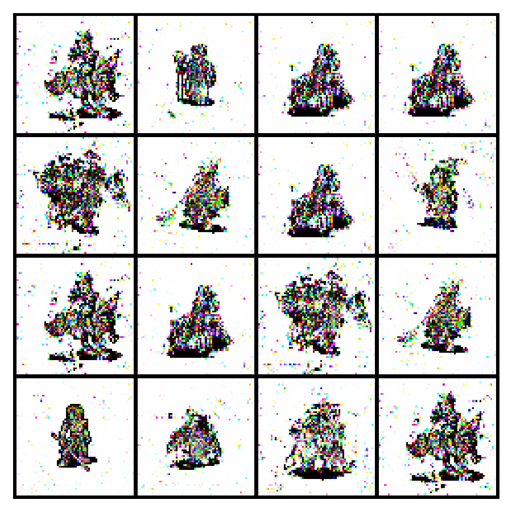

Epoch 1 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_001.png


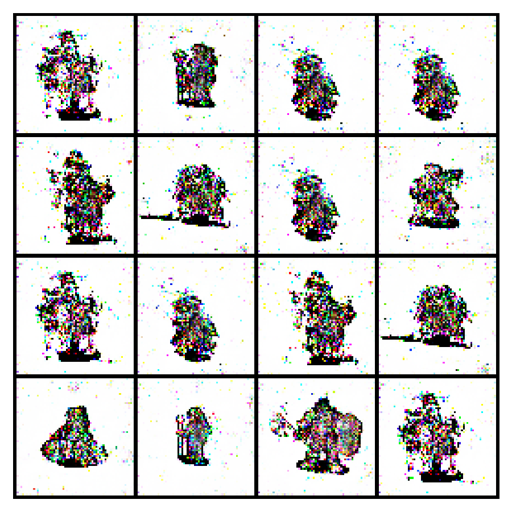

Epoch 5 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_005.png


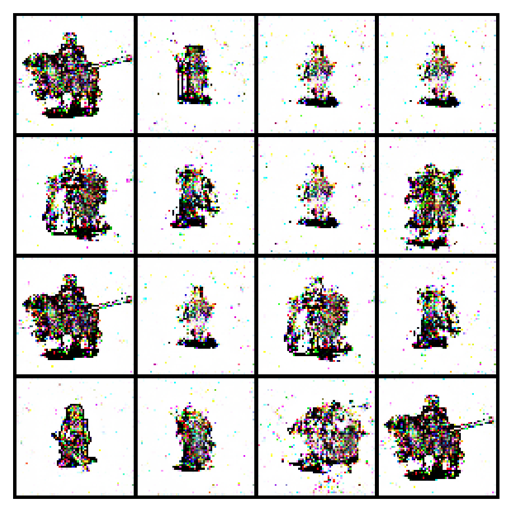

Epoch 10 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_010.png


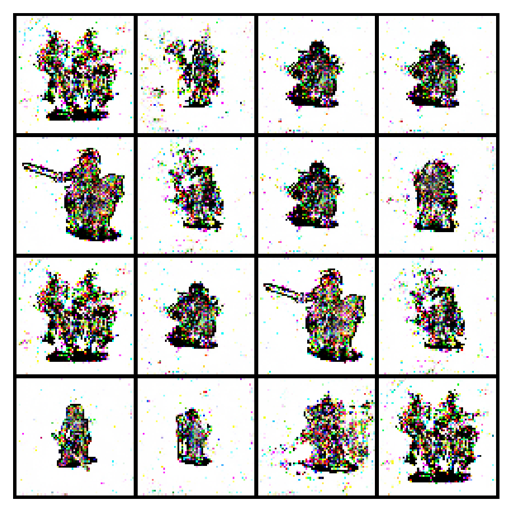

Epoch 20 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_020.png


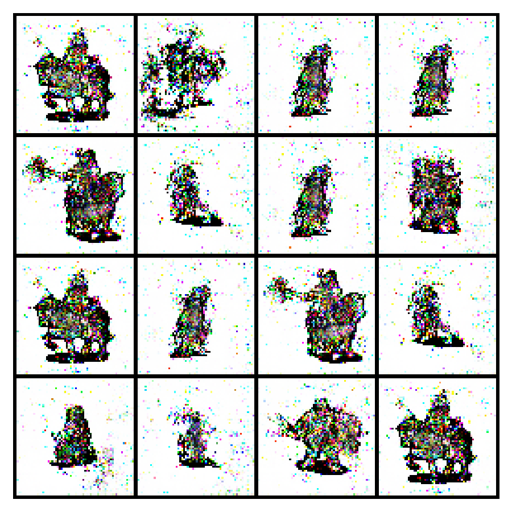

Epoch 30 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_030.png


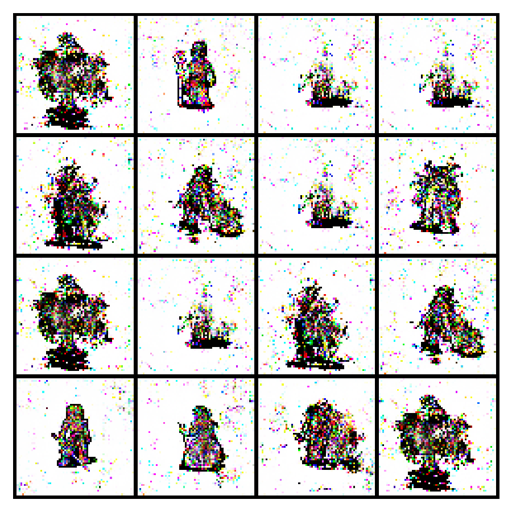

Epoch 40 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_040.png


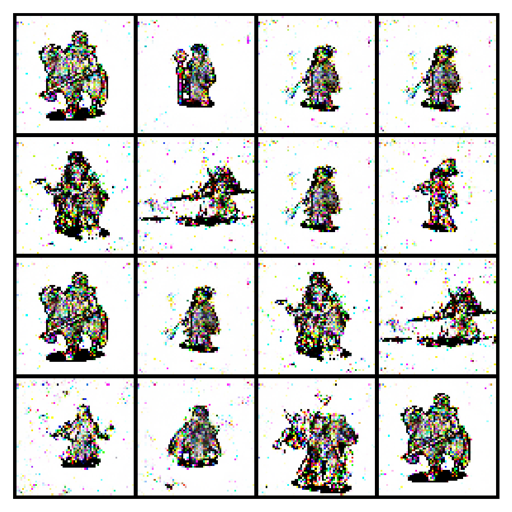

Epoch 50 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_050.png


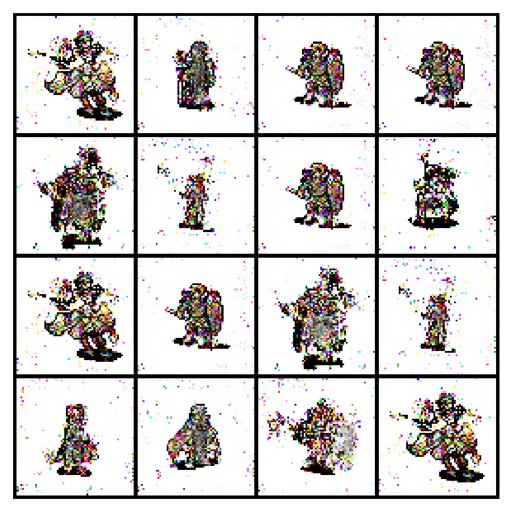

Epoch 100 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_100.png


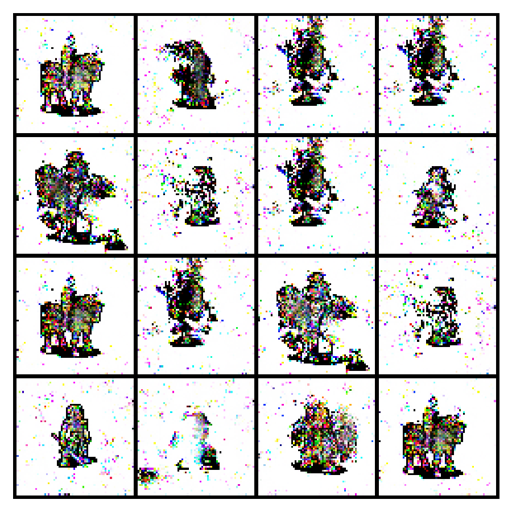

Epoch 200 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_200.png


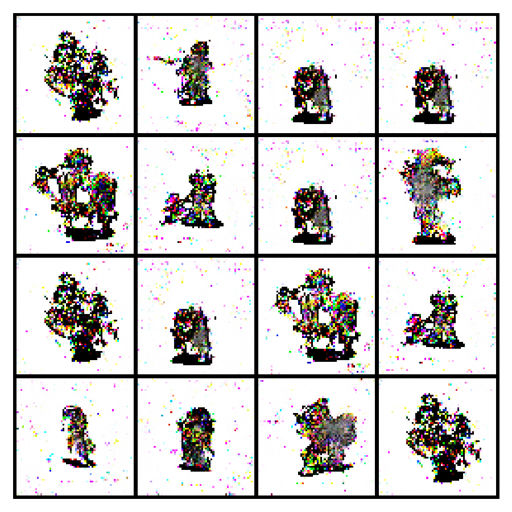

Epoch 300 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_300.png


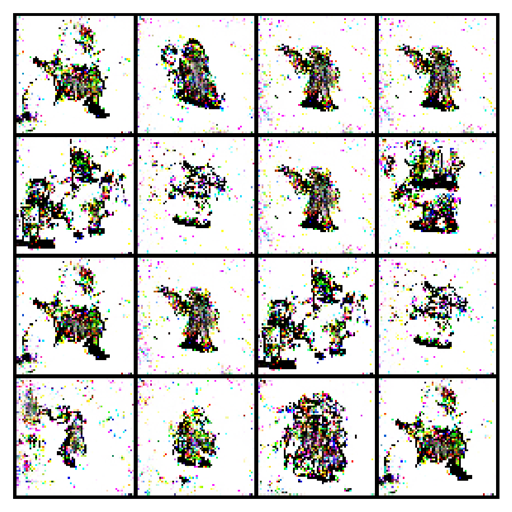

Epoch 400 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_400.png


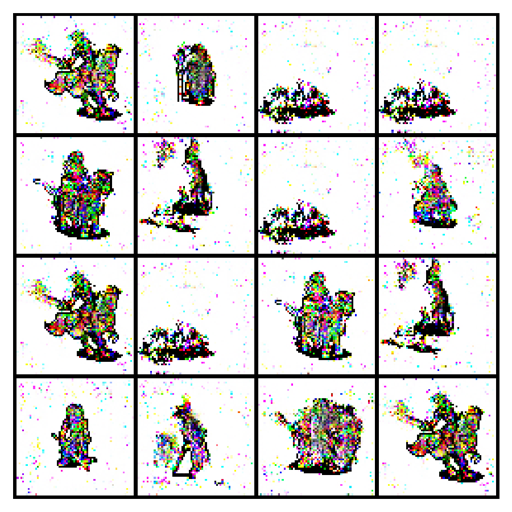

Epoch 500 → D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251118-222741\epoch_500.png


In [33]:
run_id = "20251118-222741"  # новый ран, где 500 эпох
samples_root = PROJECT_ROOT / "artifacts_gan" / "samples" / run_id

for epoch in [1, 5, 10, 20, 30, 40, 50, 100, 200, 300, 400, 500]:
    img_path = samples_root / f"epoch_{epoch:03d}.png"
    if img_path.exists():
        display(Image.open(img_path).resize((512, 512)))
        print("Epoch", epoch, "→", img_path)
    else:
        print("No image for epoch", epoch)

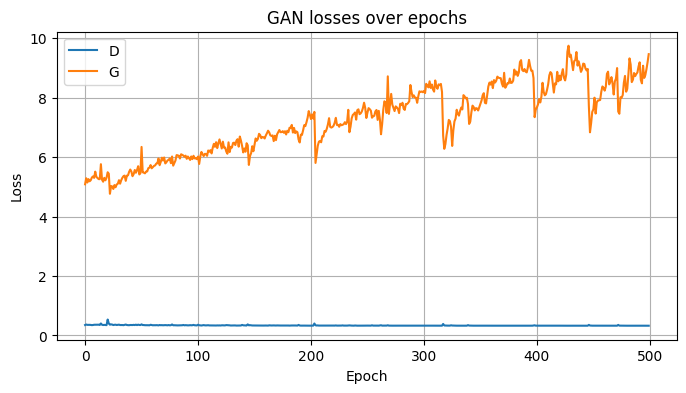

In [34]:
plt.figure(figsize=(8, 4))
plt.plot(losses_D, label="D")
plt.plot(losses_G, label="G")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.title("GAN losses over epochs")
plt.show()


In [37]:
run_id = "20251118-222741"
ckpt_path = PROJECT_ROOT / "artifacts_gan" / "checkpoints" / run_id / "cdcgan_epoch_500.pth"

ckpt = torch.load(ckpt_path, map_location=device)

G = ConditionalGenerator(
    nz=CDC_GAN_CONFIG["nz"],
    cond_dim=CDC_GAN_CONFIG["cond_dim"],
    ngf=CDC_GAN_CONFIG["ngf"],
    nc=CDC_GAN_CONFIG["channels"],
).to(device)

G.load_state_dict(ckpt["G_state_dict"])
G.eval()


C:\Users\555\AppData\Local\Temp\ipykernel_10680\2440257009.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ckpt_path, map_location=device)


ConditionalGenerator(
  (fc): Linear(in_features=144, out_features=8192, bias=True)
  (net): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)

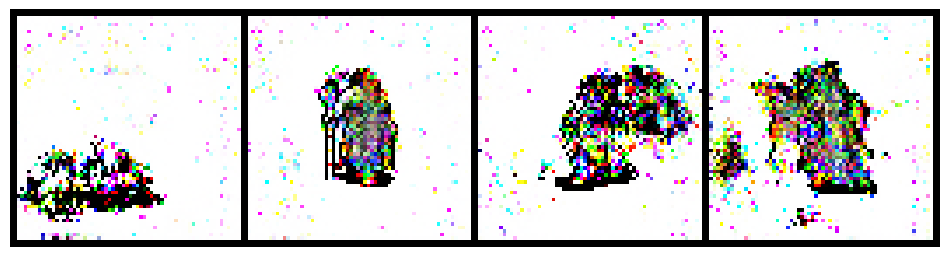

['masculine, warrior, warm',
 'masculine, mage, warm',
 'masculine, rogue, warm',
 'masculine, cleric, warm']

In [38]:
rows = ["warrior", "mage", "rogue", "cleric"]
palette_name = "warm"
gender_name = "masculine"

g_idx = gender_to_idx[gender_name]
p_idx = palette_to_idx[palette_name]

conds_list = []
labels = []

for hero_name in rows:
    h_idx = hero_to_idx[hero_name]
    cond = build_cond_vector(g_idx, h_idx, p_idx)
    conds_list.append(cond)
    labels.append(f"{gender_name}, {hero_name}, {palette_name}")

conds_tensor = torch.stack(conds_list, dim=0).to(device)
z = torch.randn(len(rows), nz, device=device)

with torch.no_grad():
    fake = G(z, conds_tensor).cpu()

fake_denorm = denorm(fake)
grid = vutils.make_grid(fake_denorm, nrow=len(rows), padding=2)

plt.figure(figsize=(12, 4))
plt.axis("off")
plt.imshow(grid.permute(1, 2, 0).numpy())
plt.show()

labels


In [36]:
final_G_path = CKPT_DIR / "cdcgan_G_final.pth"
torch.save(G.state_dict(), final_G_path)
final_G_path

WindowsPath('D:/ML/LS/Deep_learning/GAN/hero_portrait_generator/artifacts_gan/checkpoints/20251118-222741/cdcgan_G_final.pth')

In [1]:
# imports, device, paths
from pathlib import Path
import sys
import json
from datetime import datetime

import numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils import spectral_norm
import torchvision.transforms as T
import torchvision.utils as vutils
import matplotlib.pyplot as plt

from tqdm.auto import tqdm

# Базовые пути
PROJECT_ROOT = Path(r"D:\ML\LS\Deep_learning\GAN\hero_portrait_generator")
DATA_DIR = PROJECT_ROOT / "data"

print("PROJECT_ROOT:", PROJECT_ROOT)
print("DATA_DIR exists:", DATA_DIR.exists())

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device


PROJECT_ROOT: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator
DATA_DIR exists: True


device(type='cuda')

In [2]:
# load CSVs and label mappings 
train_csv = DATA_DIR / "sprites_train.csv"
val_csv = DATA_DIR / "sprites_val.csv"

train_df = pd.read_csv(train_csv)
val_df = pd.read_csv(val_csv)

train_df.shape, val_df.shape, train_df.columns


((6077, 12),
 (1519, 12),
 Index(['filename', 'path', 'idx', 'silhouette_hash', 'group_id', 'gender',
        'hero_class', 'palette', 'rel_path', 'gender_idx', 'hero_idx',
        'palette_idx'],
       dtype='object'))

In [3]:
# Загружаем мэппинги
with open(DATA_DIR / "label_mappings.json", "r", encoding="utf-8") as f:
    label_mappings = json.load(f)

gender_classes = label_mappings["gender_classes"]
gender_to_idx = label_mappings["gender_to_idx"]
hero_classes = label_mappings["hero_classes"]
hero_to_idx = label_mappings["hero_to_idx"]
palette_classes = label_mappings["palette_classes"]
palette_to_idx = label_mappings["palette_to_idx"]

print("gender_classes:", gender_classes)
print("hero_classes:", hero_classes)
print("palette_classes:", palette_classes)

cond_dim = len(gender_classes) + len(hero_classes) + len(palette_classes)
cond_dim


gender_classes: ['feminine', 'masculine']
hero_classes: ['barbarian', 'bard', 'cavalry', 'cleric', 'knight', 'mage', 'ranger', 'rogue', 'warrior']
palette_classes: ['cool', 'dark', 'muted', 'neutral', 'warm']


16

In [4]:
# dataset and dataloaders

def one_hot(index: int, num_classes: int) -> np.ndarray:
    vec = np.zeros(num_classes, dtype=np.float32)
    vec[index] = 1.0
    return vec

class HeroPortraitDataset(Dataset):
    def __init__(
        self,
        df: pd.DataFrame,
        project_root: Path,
        image_size: int = 64,
        normalize: bool = True,
    ):
        """
        df: DataFrame с колонками:
            - rel_path
            - gender_idx
            - hero_idx
            - palette_idx
            - group_id
            - filename
        """
        self.df = df.reset_index(drop=True)
        self.project_root = Path(project_root)

        self.n_gender = len(gender_classes)
        self.n_hero = len(hero_classes)
        self.n_palette = len(palette_classes)

        tfs = [
            T.Resize((image_size, image_size), interpolation=T.InterpolationMode.NEAREST),
            T.ToTensor(),
        ]
        if normalize:
            tfs.append(T.Normalize(mean=[0.5, 0.5, 0.5],
                                   std=[0.5, 0.5, 0.5]))
        self.transform = T.Compose(tfs)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        img_path = self.project_root / row["rel_path"]
        img = Image.open(img_path).convert("RGBA")

        if img.mode == "RGBA":
            bg = Image.new("RGBA", img.size, (255, 255, 255, 255))
            img = Image.alpha_composite(bg, img).convert("RGB")
        else:
            img = img.convert("RGB")

        img_tensor = self.transform(img)

        g_idx = int(row["gender_idx"])
        h_idx = int(row["hero_idx"])
        p_idx = int(row["palette_idx"])

        gender_oh = one_hot(g_idx, self.n_gender)
        hero_oh = one_hot(h_idx, self.n_hero)
        palette_oh = one_hot(p_idx, self.n_palette)

        cond_vec = np.concatenate([gender_oh, hero_oh, palette_oh]).astype(np.float32)
        cond_tensor = torch.from_numpy(cond_vec)

        sample = {
            "image": img_tensor,
            "cond": cond_tensor,
            "gender_idx": g_idx,
            "hero_idx": h_idx,
            "palette_idx": p_idx,
            "group_id": int(row["group_id"]),
            "filename": row["filename"],
        }
        return sample

# Берём все данные в train для GAN 
FULL_DF = pd.concat([train_df, val_df], ignore_index=True)

BATCH_SIZE = 64
IMAGE_SIZE = 64

full_dataset = HeroPortraitDataset(FULL_DF, project_root=PROJECT_ROOT, image_size=IMAGE_SIZE)

train_loader = DataLoader(
    full_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,     
    pin_memory=False,
)

len(full_dataset)


7596

In [5]:
batch = next(iter(train_loader))
batch["image"].shape, batch["cond"].shape


(torch.Size([64, 3, 64, 64]), torch.Size([64, 16]))

In [6]:
# stronger conditional GAN models

class ConditionalGenerator(nn.Module):
    def __init__(self, nz: int, cond_dim: int, ngf: int = 96, nc: int = 3):
        super().__init__()
        self.nz = nz
        self.cond_dim = cond_dim

        in_dim = nz + cond_dim  # конкат z и cond

        # проекция в тензор 4x4
        self.fc = nn.Linear(in_dim, ngf * 8 * 4 * 4)

        self.net = nn.Sequential(
            # 4x4 -> 8x8
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),

            # 8x8 -> 16x16
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),

            # 16x16 -> 32x32
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            # 32x32 -> 64x64
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z, cond):
        x = torch.cat([z, cond], dim=1)         # [B, nz+cond_dim]
        x = self.fc(x)                          # [B, ngf*8*4*4]
        x = x.view(x.size(0), -1, 4, 4)         # [B, ngf*8, 4,4]
        out = self.net(x)                       # [B, 3, 64,64]
        return out


class ConditionalDiscriminator(nn.Module):
    def __init__(self, cond_dim: int, ndf: int = 96, nc: int = 3):
        super().__init__()
        self.cond_dim = cond_dim

        in_channels = nc + cond_dim  # конкатим условие как карту

        self.net = nn.Sequential(
            # 64x64 -> 32x32
            spectral_norm(nn.Conv2d(in_channels, ndf, 4, 2, 1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),

            # 32x32 -> 16x16
            spectral_norm(nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),

            # 16x16 -> 8x8
            spectral_norm(nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),

            # 8x8 -> 4x4
            spectral_norm(nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),

            # 4x4 -> 1x1 (скалярный score)
            spectral_norm(nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False)),
        )

    def forward(self, img, cond):
        B = img.size(0)
        cond_map = cond.view(B, self.cond_dim, 1, 1).expand(-1, -1, img.size(2), img.size(3))
        x = torch.cat([img, cond_map], dim=1)  # [B, 3+cond_dim, 64,64]
        out = self.net(x)                      # [B, 1, 1, 1]
        return out.view(-1)                    # [B] — сырые оценки, без Sigmoid


In [7]:
nz = 128  # размер латентного вектора

G = ConditionalGenerator(nz=nz, cond_dim=cond_dim, ngf=96, nc=3).to(device)
D = ConditionalDiscriminator(cond_dim=cond_dim, ndf=96, nc=3).to(device)

print("Params G:", sum(p.numel() for p in G.parameters()))
print("Params D:", sum(p.numel() for p in D.parameters()))

batch = next(iter(train_loader))
real_images = batch["image"].to(device)
conds = batch["cond"].to(device)
B = real_images.size(0)

z = torch.randn(B, nz, device=device)
fake_images = G(z, conds)

real_scores = D(real_images, conds)
fake_scores = D(fake_images, conds)

real_images.shape, fake_images.shape, real_scores.shape, fake_scores.shape


Params G: 7980864
Params D: 6234624


(torch.Size([64, 3, 64, 64]),
 torch.Size([64, 3, 64, 64]),
 torch.Size([64]),
 torch.Size([64]))

In [8]:
# helpers

def denorm(img_batch):
    return (img_batch * 0.5) + 0.5  # [-1,1] -> [0,1]


def add_instance_noise(x, epoch, max_epochs, sigma_start=0.1, sigma_end=0.0):
    """
    Гауссовский шум к входу дискриминатора.
    σ линейно уменьшается от sigma_start до sigma_end по эпохам.
    """
    t = epoch / max_epochs
    sigma = sigma_start * (1 - t) + sigma_end * t
    if sigma <= 0:
        return x
    noise = torch.randn_like(x) * sigma
    return x + noise


def save_sample_images(epoch, G, fixed_noise, fixed_conds, samples_dir: Path):
    G.eval()
    with torch.no_grad():
        fake = G(fixed_noise, fixed_conds).detach().cpu()
    G.train()

    fake_denorm = denorm(fake)
    grid = vutils.make_grid(fake_denorm, nrow=4, padding=2)
    out_path = samples_dir / f"epoch_{epoch:03d}.png"

    plt.figure(figsize=(6, 6))
    plt.axis("off")
    plt.imshow(grid.permute(1, 2, 0).numpy())
    plt.tight_layout()
    plt.savefig(out_path, dpi=150)
    plt.close()

    print(f"[samples] Saved: {out_path}")


def build_cond_vector(g_idx: int, h_idx: int, p_idx: int) -> torch.Tensor:
    gender_oh = one_hot(g_idx, len(gender_classes))
    hero_oh = one_hot(h_idx, len(hero_classes))
    palette_oh = one_hot(p_idx, len(palette_classes))
    cond_vec = np.concatenate([gender_oh, hero_oh, palette_oh]).astype(np.float32)
    return torch.from_numpy(cond_vec)


In [9]:
# training setup 

num_epochs = 600         
real_label = 0.9          
fake_label = 0.0
lr = 2e-4
beta1, beta2 = 0.5, 0.999

# Артефакты
RUN_ID = datetime.now().strftime("%Y%m%d-%H%M%S")
ARTIFACTS_DIR = PROJECT_ROOT / "artifacts_gan"
SAMPLES_DIR = ARTIFACTS_DIR / "samples" / RUN_ID
CKPT_DIR = ARTIFACTS_DIR / "checkpoints" / RUN_ID

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
CKPT_DIR.mkdir(parents=True, exist_ok=True)

print("RUN_ID:", RUN_ID)
print("SAMPLES_DIR:", SAMPLES_DIR)
print("CKPT_DIR:", CKPT_DIR)

# Оптимизаторы
optimizerD = torch.optim.Adam(D.parameters(), lr=lr, betas=(beta1, beta2))
optimizerG = torch.optim.Adam(G.parameters(), lr=lr, betas=(beta1, beta2))

# Шедулеры (плавное уменьшение lr)
schedulerD = torch.optim.lr_scheduler.CosineAnnealingLR(optimizerD, T_max=num_epochs, eta_min=1e-5)
schedulerG = torch.optim.lr_scheduler.CosineAnnealingLR(optimizerG, T_max=num_epochs, eta_min=1e-5)

# Fixed noise + conds для мониторинга
num_preview = 16
preview_batch = next(iter(train_loader))

fixed_conds = preview_batch["cond"][:num_preview].to(device)
fixed_noise = torch.randn(num_preview, nz, device=device)

fixed_conds.shape, fixed_noise.shape


RUN_ID: 20251119-211910
SAMPLES_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910
CKPT_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910


(torch.Size([16, 16]), torch.Size([16, 128]))

In [13]:
# main training loop with hinge loss 

start_epoch = 1         
losses_D = []            
losses_G = []            

G.train()
D.train()

for epoch in range(start_epoch, num_epochs + 1):
    G.train()
    D.train()

    epoch_loss_G = 0.0
    epoch_loss_D = 0.0
    num_batches = 0

    pbar = tqdm(
        train_loader,
        desc=f"Epoch [{epoch}/{num_epochs}]",
        leave=False
    )

    for batch in pbar:
        real_images = batch["image"].to(device)   # [B, 3, 64, 64]
        conds = batch["cond"].to(device)          # [B, cond_dim]
        B = real_images.size(0)

        # Обновляем D (hinge loss)
        D.zero_grad(set_to_none=True)

        # Instance noise для реальных
        real_images_noisy = add_instance_noise(real_images, epoch, num_epochs)

        real_scores = D(real_images_noisy, conds)    # [B]
        # Hinge: max(0, 1 - D(x)) для реальных
        loss_D_real = torch.relu(1.0 - real_scores).mean()

        # Генерируем фейки
        z = torch.randn(B, nz, device=device)
        fake_images = G(z, conds)

        fake_images_noisy = add_instance_noise(fake_images.detach(), epoch, num_epochs)
        fake_scores = D(fake_images_noisy, conds)
        # Hinge: max(0, 1 + D(G(z))) для фейков
        loss_D_fake = torch.relu(1.0 + fake_scores).mean()

        loss_D = loss_D_real + loss_D_fake
        loss_D.backward()
        optimizerD.step()

        # Обновляем G
        G.zero_grad(set_to_none=True)

        fake_scores_for_G = D(fake_images, conds)
        # Hinge-G: -E[D(G(z))] — хотим, чтобы D(G(z)) был большим (>> 0)
        loss_G = - fake_scores_for_G.mean()
        loss_G.backward()
        optimizerG.step()

        epoch_loss_D += loss_D.item()
        epoch_loss_G += loss_G.item()
        num_batches += 1

        pbar.set_postfix({
            "loss_D": f"{loss_D.item():.3f}",
            "loss_G": f"{loss_G.item():.3f}"
        })

    # усредняем по эпохе
    epoch_loss_D /= num_batches
    epoch_loss_G /= num_batches
    losses_D.append(epoch_loss_D)
    losses_G.append(epoch_loss_G)

    # шаг шедулеров
    schedulerD.step()
    schedulerG.step()

    print(
        f"[Epoch {epoch:03d}/{num_epochs}] "
        f"mean loss_D: {epoch_loss_D:.4f} | "
        f"mean loss_G: {epoch_loss_G:.4f} | "
        f"remaining: {num_epochs - epoch} epochs"
    )

    # Сэмплы
    if epoch % 10 == 0 or epoch == start_epoch:
        save_sample_images(epoch, G, fixed_noise, fixed_conds, SAMPLES_DIR)

    # Чекпоинты
    if epoch % 50 == 0 or epoch == num_epochs:
        ckpt_path = CKPT_DIR / f"hinge_cdcgan_epoch_{epoch:03d}.pth"
        torch.save(
            {
                "epoch": epoch,
                "G_state_dict": G.state_dict(),
                "D_state_dict": D.state_dict(),
                "optimizerG_state_dict": optimizerG.state_dict(),
                "optimizerD_state_dict": optimizerD.state_dict(),
                "losses_G": losses_G,
                "losses_D": losses_D,
                "config": {
                    "nz": nz,
                    "cond_dim": cond_dim,
                    "ngf": 96,
                    "ndf": 96,
                    "image_size": 64,
                },
            },
            ckpt_path,
        )
        print(f"[ckpt] Saved: {ckpt_path}")


Epoch [1/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 001/600] mean loss_D: 1.4741 | mean loss_G: 0.8722 | remaining: 599 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_001.png


Epoch [2/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 002/600] mean loss_D: 1.3669 | mean loss_G: 1.2026 | remaining: 598 epochs


Epoch [3/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 003/600] mean loss_D: 1.2296 | mean loss_G: 1.4029 | remaining: 597 epochs


Epoch [4/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 004/600] mean loss_D: 0.8103 | mean loss_G: 2.1177 | remaining: 596 epochs


Epoch [5/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 005/600] mean loss_D: 0.5822 | mean loss_G: 2.5122 | remaining: 595 epochs


Epoch [6/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 006/600] mean loss_D: 0.4472 | mean loss_G: 2.5471 | remaining: 594 epochs


Epoch [7/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 007/600] mean loss_D: 0.4715 | mean loss_G: 2.5231 | remaining: 593 epochs


Epoch [8/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 008/600] mean loss_D: 0.4394 | mean loss_G: 2.4440 | remaining: 592 epochs


Epoch [9/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 009/600] mean loss_D: 0.4085 | mean loss_G: 2.3272 | remaining: 591 epochs


Epoch [10/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 010/600] mean loss_D: 0.3337 | mean loss_G: 2.4885 | remaining: 590 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_010.png


Epoch [11/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 011/600] mean loss_D: 0.4208 | mean loss_G: 2.3436 | remaining: 589 epochs


Epoch [12/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 012/600] mean loss_D: 0.3570 | mean loss_G: 2.3197 | remaining: 588 epochs


Epoch [13/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 013/600] mean loss_D: 0.3617 | mean loss_G: 2.2124 | remaining: 587 epochs


Epoch [14/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 014/600] mean loss_D: 0.3725 | mean loss_G: 2.2268 | remaining: 586 epochs


Epoch [15/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 015/600] mean loss_D: 0.3230 | mean loss_G: 2.1256 | remaining: 585 epochs


Epoch [16/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 016/600] mean loss_D: 0.3300 | mean loss_G: 2.2418 | remaining: 584 epochs


Epoch [17/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 017/600] mean loss_D: 0.3136 | mean loss_G: 2.1389 | remaining: 583 epochs


Epoch [18/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 018/600] mean loss_D: 0.3020 | mean loss_G: 2.0983 | remaining: 582 epochs


Epoch [19/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 019/600] mean loss_D: 0.2838 | mean loss_G: 1.9842 | remaining: 581 epochs


Epoch [20/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 020/600] mean loss_D: 0.2794 | mean loss_G: 1.9438 | remaining: 580 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_020.png


Epoch [21/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 021/600] mean loss_D: 0.2692 | mean loss_G: 2.0103 | remaining: 579 epochs


Epoch [22/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 022/600] mean loss_D: 0.2492 | mean loss_G: 1.9090 | remaining: 578 epochs


Epoch [23/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 023/600] mean loss_D: 0.2431 | mean loss_G: 1.8653 | remaining: 577 epochs


Epoch [24/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 024/600] mean loss_D: 0.2372 | mean loss_G: 1.8876 | remaining: 576 epochs


Epoch [25/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 025/600] mean loss_D: 0.2263 | mean loss_G: 1.8327 | remaining: 575 epochs


Epoch [26/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 026/600] mean loss_D: 0.2314 | mean loss_G: 1.7541 | remaining: 574 epochs


Epoch [27/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 027/600] mean loss_D: 0.2145 | mean loss_G: 1.7694 | remaining: 573 epochs


Epoch [28/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 028/600] mean loss_D: 0.1969 | mean loss_G: 1.6722 | remaining: 572 epochs


Epoch [29/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 029/600] mean loss_D: 0.1852 | mean loss_G: 1.6676 | remaining: 571 epochs


Epoch [30/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 030/600] mean loss_D: 0.1725 | mean loss_G: 1.6710 | remaining: 570 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_030.png


Epoch [31/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 031/600] mean loss_D: 0.1595 | mean loss_G: 1.6264 | remaining: 569 epochs


Epoch [32/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 032/600] mean loss_D: 0.1457 | mean loss_G: 1.5867 | remaining: 568 epochs


Epoch [33/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 033/600] mean loss_D: 0.1313 | mean loss_G: 1.6097 | remaining: 567 epochs


Epoch [34/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 034/600] mean loss_D: 0.1232 | mean loss_G: 1.5817 | remaining: 566 epochs


Epoch [35/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 035/600] mean loss_D: 0.1103 | mean loss_G: 1.6137 | remaining: 565 epochs


Epoch [36/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 036/600] mean loss_D: 0.0921 | mean loss_G: 1.5905 | remaining: 564 epochs


Epoch [37/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 037/600] mean loss_D: 0.0968 | mean loss_G: 1.6256 | remaining: 563 epochs


Epoch [38/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 038/600] mean loss_D: 0.0753 | mean loss_G: 1.6129 | remaining: 562 epochs


Epoch [39/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 039/600] mean loss_D: 0.0772 | mean loss_G: 1.6608 | remaining: 561 epochs


Epoch [40/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 040/600] mean loss_D: 0.0709 | mean loss_G: 1.6824 | remaining: 560 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_040.png


Epoch [41/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 041/600] mean loss_D: 0.0719 | mean loss_G: 1.6698 | remaining: 559 epochs


Epoch [42/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 042/600] mean loss_D: 0.0818 | mean loss_G: 1.7120 | remaining: 558 epochs


Epoch [43/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 043/600] mean loss_D: 0.0700 | mean loss_G: 1.6683 | remaining: 557 epochs


Epoch [44/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 044/600] mean loss_D: 0.0737 | mean loss_G: 1.7339 | remaining: 556 epochs


Epoch [45/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 045/600] mean loss_D: 0.0647 | mean loss_G: 1.7080 | remaining: 555 epochs


Epoch [46/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 046/600] mean loss_D: 0.0755 | mean loss_G: 1.7682 | remaining: 554 epochs


Epoch [47/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 047/600] mean loss_D: 0.0805 | mean loss_G: 1.7622 | remaining: 553 epochs


Epoch [48/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 048/600] mean loss_D: 0.0843 | mean loss_G: 1.8058 | remaining: 552 epochs


Epoch [49/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 049/600] mean loss_D: 0.0968 | mean loss_G: 1.9021 | remaining: 551 epochs


Epoch [50/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 050/600] mean loss_D: 0.1117 | mean loss_G: 1.8141 | remaining: 550 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_050.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910\hinge_cdcgan_epoch_050.pth


Epoch [51/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 051/600] mean loss_D: 0.1453 | mean loss_G: 1.7921 | remaining: 549 epochs


Epoch [52/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 052/600] mean loss_D: 0.1642 | mean loss_G: 1.7585 | remaining: 548 epochs


Epoch [53/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 053/600] mean loss_D: 0.2106 | mean loss_G: 1.7348 | remaining: 547 epochs


Epoch [54/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 054/600] mean loss_D: 0.2406 | mean loss_G: 1.6811 | remaining: 546 epochs


Epoch [55/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 055/600] mean loss_D: 0.2361 | mean loss_G: 1.7583 | remaining: 545 epochs


Epoch [56/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 056/600] mean loss_D: 0.2508 | mean loss_G: 1.6932 | remaining: 544 epochs


Epoch [57/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 057/600] mean loss_D: 0.2511 | mean loss_G: 1.7603 | remaining: 543 epochs


Epoch [58/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 058/600] mean loss_D: 0.2521 | mean loss_G: 1.7364 | remaining: 542 epochs


Epoch [59/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 059/600] mean loss_D: 0.2682 | mean loss_G: 1.8084 | remaining: 541 epochs


Epoch [60/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 060/600] mean loss_D: 0.2527 | mean loss_G: 1.8863 | remaining: 540 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_060.png


Epoch [61/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 061/600] mean loss_D: 0.2590 | mean loss_G: 1.8094 | remaining: 539 epochs


Epoch [62/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 062/600] mean loss_D: 0.2690 | mean loss_G: 1.8121 | remaining: 538 epochs


Epoch [63/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 063/600] mean loss_D: 0.2818 | mean loss_G: 2.1034 | remaining: 537 epochs


Epoch [64/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 064/600] mean loss_D: 0.2600 | mean loss_G: 1.7102 | remaining: 536 epochs


Epoch [65/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 065/600] mean loss_D: 0.2825 | mean loss_G: 1.7125 | remaining: 535 epochs


Epoch [66/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 066/600] mean loss_D: 0.2745 | mean loss_G: 1.7578 | remaining: 534 epochs


Epoch [67/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 067/600] mean loss_D: 0.2983 | mean loss_G: 2.0310 | remaining: 533 epochs


Epoch [68/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 068/600] mean loss_D: 0.2865 | mean loss_G: 2.0918 | remaining: 532 epochs


Epoch [69/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 069/600] mean loss_D: 0.2861 | mean loss_G: 1.9873 | remaining: 531 epochs


Epoch [70/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 070/600] mean loss_D: 0.2823 | mean loss_G: 2.0616 | remaining: 530 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_070.png


Epoch [71/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 071/600] mean loss_D: 0.2674 | mean loss_G: 1.9645 | remaining: 529 epochs


Epoch [72/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 072/600] mean loss_D: 0.2756 | mean loss_G: 2.0443 | remaining: 528 epochs


Epoch [73/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 073/600] mean loss_D: 0.3058 | mean loss_G: 2.1352 | remaining: 527 epochs


Epoch [74/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 074/600] mean loss_D: 0.3073 | mean loss_G: 1.8316 | remaining: 526 epochs


Epoch [75/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 075/600] mean loss_D: 0.3224 | mean loss_G: 1.7771 | remaining: 525 epochs


Epoch [76/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 076/600] mean loss_D: 0.3080 | mean loss_G: 1.7642 | remaining: 524 epochs


Epoch [77/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 077/600] mean loss_D: 0.3160 | mean loss_G: 1.8007 | remaining: 523 epochs


Epoch [78/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 078/600] mean loss_D: 0.3215 | mean loss_G: 1.7898 | remaining: 522 epochs


Epoch [79/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 079/600] mean loss_D: 0.3276 | mean loss_G: 1.8912 | remaining: 521 epochs


Epoch [80/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 080/600] mean loss_D: 0.3372 | mean loss_G: 1.7958 | remaining: 520 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_080.png


Epoch [81/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 081/600] mean loss_D: 0.3444 | mean loss_G: 1.7519 | remaining: 519 epochs


Epoch [82/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 082/600] mean loss_D: 0.3542 | mean loss_G: 1.6258 | remaining: 518 epochs


Epoch [83/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 083/600] mean loss_D: 0.3491 | mean loss_G: 1.5487 | remaining: 517 epochs


Epoch [84/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 084/600] mean loss_D: 0.3480 | mean loss_G: 1.6231 | remaining: 516 epochs


Epoch [85/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 085/600] mean loss_D: 0.3566 | mean loss_G: 1.5562 | remaining: 515 epochs


Epoch [86/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 086/600] mean loss_D: 0.3539 | mean loss_G: 1.5409 | remaining: 514 epochs


Epoch [87/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 087/600] mean loss_D: 0.3449 | mean loss_G: 1.4798 | remaining: 513 epochs


Epoch [88/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 088/600] mean loss_D: 0.3406 | mean loss_G: 1.4048 | remaining: 512 epochs


Epoch [89/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 089/600] mean loss_D: 0.3445 | mean loss_G: 1.5452 | remaining: 511 epochs


Epoch [90/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 090/600] mean loss_D: 0.3419 | mean loss_G: 1.6550 | remaining: 510 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_090.png


Epoch [91/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 091/600] mean loss_D: 0.3252 | mean loss_G: 1.6029 | remaining: 509 epochs


Epoch [92/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 092/600] mean loss_D: 0.3362 | mean loss_G: 1.6383 | remaining: 508 epochs


Epoch [93/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 093/600] mean loss_D: 0.3460 | mean loss_G: 1.6428 | remaining: 507 epochs


Epoch [94/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 094/600] mean loss_D: 0.3602 | mean loss_G: 1.5950 | remaining: 506 epochs


Epoch [95/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 095/600] mean loss_D: 0.3389 | mean loss_G: 1.5190 | remaining: 505 epochs


Epoch [96/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 096/600] mean loss_D: 0.3420 | mean loss_G: 1.6481 | remaining: 504 epochs


Epoch [97/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 097/600] mean loss_D: 0.3357 | mean loss_G: 1.6916 | remaining: 503 epochs


Epoch [98/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 098/600] mean loss_D: 0.3365 | mean loss_G: 1.6718 | remaining: 502 epochs


Epoch [99/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 099/600] mean loss_D: 0.3441 | mean loss_G: 1.6109 | remaining: 501 epochs


Epoch [100/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 100/600] mean loss_D: 0.3497 | mean loss_G: 1.7678 | remaining: 500 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_100.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910\hinge_cdcgan_epoch_100.pth


Epoch [101/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 101/600] mean loss_D: 0.3193 | mean loss_G: 1.8014 | remaining: 499 epochs


Epoch [102/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 102/600] mean loss_D: 0.3447 | mean loss_G: 1.5966 | remaining: 498 epochs


Epoch [103/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 103/600] mean loss_D: 0.3490 | mean loss_G: 1.5309 | remaining: 497 epochs


Epoch [104/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 104/600] mean loss_D: 0.3864 | mean loss_G: 1.7623 | remaining: 496 epochs


Epoch [105/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 105/600] mean loss_D: 0.3550 | mean loss_G: 1.7027 | remaining: 495 epochs


Epoch [106/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 106/600] mean loss_D: 0.3339 | mean loss_G: 1.7191 | remaining: 494 epochs


Epoch [107/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 107/600] mean loss_D: 0.3428 | mean loss_G: 1.7207 | remaining: 493 epochs


Epoch [108/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 108/600] mean loss_D: 0.3403 | mean loss_G: 1.6891 | remaining: 492 epochs


Epoch [109/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 109/600] mean loss_D: 0.3434 | mean loss_G: 1.5664 | remaining: 491 epochs


Epoch [110/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 110/600] mean loss_D: 0.3408 | mean loss_G: 1.4927 | remaining: 490 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_110.png


Epoch [111/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 111/600] mean loss_D: 0.3274 | mean loss_G: 1.2876 | remaining: 489 epochs


Epoch [112/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 112/600] mean loss_D: 0.3327 | mean loss_G: 1.4469 | remaining: 488 epochs


Epoch [113/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 113/600] mean loss_D: 0.3427 | mean loss_G: 1.5735 | remaining: 487 epochs


Epoch [114/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 114/600] mean loss_D: 0.3450 | mean loss_G: 1.7025 | remaining: 486 epochs


Epoch [115/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 115/600] mean loss_D: 0.3277 | mean loss_G: 1.5888 | remaining: 485 epochs


Epoch [116/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 116/600] mean loss_D: 0.3329 | mean loss_G: 1.7694 | remaining: 484 epochs


Epoch [117/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 117/600] mean loss_D: 0.3266 | mean loss_G: 1.6865 | remaining: 483 epochs


Epoch [118/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 118/600] mean loss_D: 0.3536 | mean loss_G: 1.6485 | remaining: 482 epochs


Epoch [119/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 119/600] mean loss_D: 0.3530 | mean loss_G: 1.6111 | remaining: 481 epochs


Epoch [120/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 120/600] mean loss_D: 0.3548 | mean loss_G: 1.5336 | remaining: 480 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_120.png


Epoch [121/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 121/600] mean loss_D: 0.3409 | mean loss_G: 1.4156 | remaining: 479 epochs


Epoch [122/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 122/600] mean loss_D: 0.3323 | mean loss_G: 1.4558 | remaining: 478 epochs


Epoch [123/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 123/600] mean loss_D: 0.3204 | mean loss_G: 1.4087 | remaining: 477 epochs


Epoch [124/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 124/600] mean loss_D: 0.3227 | mean loss_G: 1.5833 | remaining: 476 epochs


Epoch [125/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 125/600] mean loss_D: 0.3303 | mean loss_G: 1.4802 | remaining: 475 epochs


Epoch [126/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 126/600] mean loss_D: 0.3325 | mean loss_G: 1.4524 | remaining: 474 epochs


Epoch [127/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 127/600] mean loss_D: 0.3219 | mean loss_G: 1.4905 | remaining: 473 epochs


Epoch [128/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 128/600] mean loss_D: 0.3216 | mean loss_G: 1.4551 | remaining: 472 epochs


Epoch [129/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 129/600] mean loss_D: 0.3271 | mean loss_G: 1.4282 | remaining: 471 epochs


Epoch [130/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 130/600] mean loss_D: 0.3272 | mean loss_G: 1.3777 | remaining: 470 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_130.png


Epoch [131/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 131/600] mean loss_D: 0.3301 | mean loss_G: 1.3077 | remaining: 469 epochs


Epoch [132/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 132/600] mean loss_D: 0.3214 | mean loss_G: 1.2958 | remaining: 468 epochs


Epoch [133/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 133/600] mean loss_D: 0.3234 | mean loss_G: 1.2008 | remaining: 467 epochs


Epoch [134/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 134/600] mean loss_D: 0.3247 | mean loss_G: 1.3876 | remaining: 466 epochs


Epoch [135/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 135/600] mean loss_D: 0.3448 | mean loss_G: 1.6653 | remaining: 465 epochs


Epoch [136/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 136/600] mean loss_D: 0.3382 | mean loss_G: 1.7994 | remaining: 464 epochs


Epoch [137/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 137/600] mean loss_D: 0.3140 | mean loss_G: 1.7522 | remaining: 463 epochs


Epoch [138/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 138/600] mean loss_D: 0.3330 | mean loss_G: 1.7443 | remaining: 462 epochs


Epoch [139/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 139/600] mean loss_D: 0.3497 | mean loss_G: 1.6962 | remaining: 461 epochs


Epoch [140/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 140/600] mean loss_D: 0.3372 | mean loss_G: 1.6520 | remaining: 460 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_140.png


Epoch [141/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 141/600] mean loss_D: 0.3257 | mean loss_G: 1.6221 | remaining: 459 epochs


Epoch [142/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 142/600] mean loss_D: 0.3293 | mean loss_G: 1.6186 | remaining: 458 epochs


Epoch [143/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 143/600] mean loss_D: 0.3350 | mean loss_G: 1.5645 | remaining: 457 epochs


Epoch [144/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 144/600] mean loss_D: 0.3423 | mean loss_G: 1.4755 | remaining: 456 epochs


Epoch [145/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 145/600] mean loss_D: 0.3495 | mean loss_G: 1.4440 | remaining: 455 epochs


Epoch [146/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 146/600] mean loss_D: 0.3392 | mean loss_G: 1.3816 | remaining: 454 epochs


Epoch [147/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 147/600] mean loss_D: 0.3483 | mean loss_G: 1.4084 | remaining: 453 epochs


Epoch [148/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 148/600] mean loss_D: 0.3446 | mean loss_G: 1.3272 | remaining: 452 epochs


Epoch [149/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 149/600] mean loss_D: 0.3431 | mean loss_G: 1.2965 | remaining: 451 epochs


Epoch [150/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 150/600] mean loss_D: 0.3435 | mean loss_G: 1.2284 | remaining: 450 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_150.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910\hinge_cdcgan_epoch_150.pth


Epoch [151/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 151/600] mean loss_D: 0.3501 | mean loss_G: 1.2798 | remaining: 449 epochs


Epoch [152/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 152/600] mean loss_D: 0.3466 | mean loss_G: 1.2687 | remaining: 448 epochs


Epoch [153/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 153/600] mean loss_D: 0.3496 | mean loss_G: 1.2594 | remaining: 447 epochs


Epoch [154/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 154/600] mean loss_D: 0.3411 | mean loss_G: 1.2159 | remaining: 446 epochs


Epoch [155/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 155/600] mean loss_D: 0.3412 | mean loss_G: 1.2304 | remaining: 445 epochs


Epoch [156/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 156/600] mean loss_D: 0.3459 | mean loss_G: 1.2352 | remaining: 444 epochs


Epoch [157/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 157/600] mean loss_D: 0.3545 | mean loss_G: 1.2504 | remaining: 443 epochs


Epoch [158/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 158/600] mean loss_D: 0.3590 | mean loss_G: 1.3085 | remaining: 442 epochs


Epoch [159/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 159/600] mean loss_D: 0.3490 | mean loss_G: 1.2794 | remaining: 441 epochs


Epoch [160/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 160/600] mean loss_D: 0.3533 | mean loss_G: 1.2412 | remaining: 440 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_160.png


Epoch [161/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 161/600] mean loss_D: 0.3565 | mean loss_G: 1.2546 | remaining: 439 epochs


Epoch [162/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 162/600] mean loss_D: 0.3700 | mean loss_G: 1.2691 | remaining: 438 epochs


Epoch [163/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 163/600] mean loss_D: 0.3700 | mean loss_G: 1.2992 | remaining: 437 epochs


Epoch [164/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 164/600] mean loss_D: 0.3758 | mean loss_G: 1.3067 | remaining: 436 epochs


Epoch [165/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 165/600] mean loss_D: 0.3785 | mean loss_G: 1.2891 | remaining: 435 epochs


Epoch [166/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 166/600] mean loss_D: 0.3764 | mean loss_G: 1.2693 | remaining: 434 epochs


Epoch [167/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 167/600] mean loss_D: 0.3647 | mean loss_G: 1.2149 | remaining: 433 epochs


Epoch [168/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 168/600] mean loss_D: 0.3581 | mean loss_G: 1.2017 | remaining: 432 epochs


Epoch [169/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 169/600] mean loss_D: 0.3521 | mean loss_G: 1.1953 | remaining: 431 epochs


Epoch [170/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 170/600] mean loss_D: 0.3503 | mean loss_G: 1.2120 | remaining: 430 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_170.png


Epoch [171/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 171/600] mean loss_D: 0.3553 | mean loss_G: 1.1674 | remaining: 429 epochs


Epoch [172/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 172/600] mean loss_D: 0.3542 | mean loss_G: 1.1982 | remaining: 428 epochs


Epoch [173/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 173/600] mean loss_D: 0.3566 | mean loss_G: 1.1790 | remaining: 427 epochs


Epoch [174/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 174/600] mean loss_D: 0.3604 | mean loss_G: 1.1739 | remaining: 426 epochs


Epoch [175/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 175/600] mean loss_D: 0.3571 | mean loss_G: 1.1771 | remaining: 425 epochs


Epoch [176/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 176/600] mean loss_D: 0.3620 | mean loss_G: 1.2010 | remaining: 424 epochs


Epoch [177/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 177/600] mean loss_D: 0.3798 | mean loss_G: 1.2145 | remaining: 423 epochs


Epoch [178/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 178/600] mean loss_D: 0.3656 | mean loss_G: 1.2780 | remaining: 422 epochs


Epoch [179/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 179/600] mean loss_D: 0.3580 | mean loss_G: 1.2558 | remaining: 421 epochs


Epoch [180/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 180/600] mean loss_D: 0.3523 | mean loss_G: 1.2277 | remaining: 420 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_180.png


Epoch [181/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 181/600] mean loss_D: 0.3531 | mean loss_G: 1.2406 | remaining: 419 epochs


Epoch [182/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 182/600] mean loss_D: 0.3571 | mean loss_G: 1.1723 | remaining: 418 epochs


Epoch [183/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 183/600] mean loss_D: 0.3580 | mean loss_G: 1.1741 | remaining: 417 epochs


Epoch [184/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 184/600] mean loss_D: 0.3549 | mean loss_G: 1.1600 | remaining: 416 epochs


Epoch [185/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 185/600] mean loss_D: 0.3580 | mean loss_G: 1.1489 | remaining: 415 epochs


Epoch [186/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 186/600] mean loss_D: 0.3593 | mean loss_G: 1.1425 | remaining: 414 epochs


Epoch [187/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 187/600] mean loss_D: 0.3551 | mean loss_G: 1.1261 | remaining: 413 epochs


Epoch [188/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 188/600] mean loss_D: 0.3624 | mean loss_G: 1.1721 | remaining: 412 epochs


Epoch [189/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 189/600] mean loss_D: 0.3615 | mean loss_G: 1.2301 | remaining: 411 epochs


Epoch [190/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 190/600] mean loss_D: 0.3638 | mean loss_G: 1.2330 | remaining: 410 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_190.png


Epoch [191/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 191/600] mean loss_D: 0.3686 | mean loss_G: 1.2290 | remaining: 409 epochs


Epoch [192/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 192/600] mean loss_D: 0.3669 | mean loss_G: 1.2121 | remaining: 408 epochs


Epoch [193/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 193/600] mean loss_D: 0.3609 | mean loss_G: 1.2244 | remaining: 407 epochs


Epoch [194/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 194/600] mean loss_D: 0.3624 | mean loss_G: 1.2137 | remaining: 406 epochs


Epoch [195/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 195/600] mean loss_D: 0.3596 | mean loss_G: 1.1973 | remaining: 405 epochs


Epoch [196/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 196/600] mean loss_D: 0.3602 | mean loss_G: 1.1795 | remaining: 404 epochs


Epoch [197/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 197/600] mean loss_D: 0.3655 | mean loss_G: 1.1731 | remaining: 403 epochs


Epoch [198/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 198/600] mean loss_D: 0.3602 | mean loss_G: 1.1185 | remaining: 402 epochs


Epoch [199/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 199/600] mean loss_D: 0.3617 | mean loss_G: 1.1269 | remaining: 401 epochs


Epoch [200/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 200/600] mean loss_D: 0.3618 | mean loss_G: 1.1225 | remaining: 400 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_200.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910\hinge_cdcgan_epoch_200.pth


Epoch [201/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 201/600] mean loss_D: 0.3549 | mean loss_G: 1.0963 | remaining: 399 epochs


Epoch [202/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 202/600] mean loss_D: 0.3608 | mean loss_G: 1.1518 | remaining: 398 epochs


Epoch [203/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 203/600] mean loss_D: 0.3634 | mean loss_G: 1.1349 | remaining: 397 epochs


Epoch [204/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 204/600] mean loss_D: 0.3696 | mean loss_G: 1.1473 | remaining: 396 epochs


Epoch [205/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 205/600] mean loss_D: 0.3755 | mean loss_G: 1.1794 | remaining: 395 epochs


Epoch [206/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 206/600] mean loss_D: 0.3943 | mean loss_G: 1.1612 | remaining: 394 epochs


Epoch [207/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 207/600] mean loss_D: 0.3661 | mean loss_G: 1.1440 | remaining: 393 epochs


Epoch [208/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 208/600] mean loss_D: 0.3730 | mean loss_G: 1.2113 | remaining: 392 epochs


Epoch [209/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 209/600] mean loss_D: 0.3609 | mean loss_G: 1.2025 | remaining: 391 epochs


Epoch [210/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 210/600] mean loss_D: 0.3579 | mean loss_G: 1.1539 | remaining: 390 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_210.png


Epoch [211/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 211/600] mean loss_D: 0.3639 | mean loss_G: 1.1568 | remaining: 389 epochs


Epoch [212/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 212/600] mean loss_D: 0.3607 | mean loss_G: 1.1534 | remaining: 388 epochs


Epoch [213/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 213/600] mean loss_D: 0.3740 | mean loss_G: 1.1627 | remaining: 387 epochs


Epoch [214/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 214/600] mean loss_D: 0.3683 | mean loss_G: 1.1400 | remaining: 386 epochs


Epoch [215/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 215/600] mean loss_D: 0.3653 | mean loss_G: 1.1771 | remaining: 385 epochs


Epoch [216/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 216/600] mean loss_D: 0.3769 | mean loss_G: 1.1676 | remaining: 384 epochs


Epoch [217/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 217/600] mean loss_D: 0.3804 | mean loss_G: 1.1457 | remaining: 383 epochs


Epoch [218/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 218/600] mean loss_D: 0.3713 | mean loss_G: 1.1442 | remaining: 382 epochs


Epoch [219/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 219/600] mean loss_D: 0.3645 | mean loss_G: 1.1111 | remaining: 381 epochs


Epoch [220/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 220/600] mean loss_D: 0.3718 | mean loss_G: 1.1246 | remaining: 380 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_220.png


Epoch [221/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 221/600] mean loss_D: 0.3713 | mean loss_G: 1.0908 | remaining: 379 epochs


Epoch [222/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 222/600] mean loss_D: 0.3617 | mean loss_G: 1.0952 | remaining: 378 epochs


Epoch [223/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 223/600] mean loss_D: 0.3560 | mean loss_G: 1.0949 | remaining: 377 epochs


Epoch [224/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 224/600] mean loss_D: 0.3572 | mean loss_G: 1.1043 | remaining: 376 epochs


Epoch [225/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 225/600] mean loss_D: 0.3562 | mean loss_G: 1.1003 | remaining: 375 epochs


Epoch [226/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 226/600] mean loss_D: 0.3580 | mean loss_G: 1.1025 | remaining: 374 epochs


Epoch [227/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 227/600] mean loss_D: 0.3581 | mean loss_G: 1.1074 | remaining: 373 epochs


Epoch [228/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 228/600] mean loss_D: 0.3627 | mean loss_G: 1.1154 | remaining: 372 epochs


Epoch [229/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 229/600] mean loss_D: 0.3556 | mean loss_G: 1.0990 | remaining: 371 epochs


Epoch [230/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 230/600] mean loss_D: 0.3592 | mean loss_G: 1.1187 | remaining: 370 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_230.png


Epoch [231/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 231/600] mean loss_D: 0.3614 | mean loss_G: 1.0900 | remaining: 369 epochs


Epoch [232/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 232/600] mean loss_D: 0.3590 | mean loss_G: 1.0984 | remaining: 368 epochs


Epoch [233/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 233/600] mean loss_D: 0.3611 | mean loss_G: 1.1199 | remaining: 367 epochs


Epoch [234/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 234/600] mean loss_D: 0.3657 | mean loss_G: 1.1088 | remaining: 366 epochs


Epoch [235/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 235/600] mean loss_D: 0.3696 | mean loss_G: 1.1079 | remaining: 365 epochs


Epoch [236/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 236/600] mean loss_D: 0.3704 | mean loss_G: 1.1111 | remaining: 364 epochs


Epoch [237/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 237/600] mean loss_D: 0.3660 | mean loss_G: 1.1263 | remaining: 363 epochs


Epoch [238/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 238/600] mean loss_D: 0.3694 | mean loss_G: 1.1743 | remaining: 362 epochs


Epoch [239/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 239/600] mean loss_D: 0.3688 | mean loss_G: 1.2749 | remaining: 361 epochs


Epoch [240/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 240/600] mean loss_D: 0.3572 | mean loss_G: 1.3028 | remaining: 360 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_240.png


Epoch [241/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 241/600] mean loss_D: 0.3325 | mean loss_G: 1.2573 | remaining: 359 epochs


Epoch [242/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 242/600] mean loss_D: 0.3533 | mean loss_G: 1.2404 | remaining: 358 epochs


Epoch [243/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 243/600] mean loss_D: 0.3517 | mean loss_G: 1.2567 | remaining: 357 epochs


Epoch [244/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 244/600] mean loss_D: 0.3507 | mean loss_G: 1.2517 | remaining: 356 epochs


Epoch [245/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 245/600] mean loss_D: 0.3541 | mean loss_G: 1.2307 | remaining: 355 epochs


Epoch [246/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 246/600] mean loss_D: 0.3447 | mean loss_G: 1.1723 | remaining: 354 epochs


Epoch [247/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 247/600] mean loss_D: 0.3496 | mean loss_G: 1.2618 | remaining: 353 epochs


Epoch [248/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 248/600] mean loss_D: 0.3440 | mean loss_G: 1.1753 | remaining: 352 epochs


Epoch [249/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 249/600] mean loss_D: 0.3444 | mean loss_G: 1.1811 | remaining: 351 epochs


Epoch [250/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 250/600] mean loss_D: 0.3423 | mean loss_G: 1.1510 | remaining: 350 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_250.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910\hinge_cdcgan_epoch_250.pth


Epoch [251/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 251/600] mean loss_D: 0.3448 | mean loss_G: 1.2100 | remaining: 349 epochs


Epoch [252/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 252/600] mean loss_D: 0.3336 | mean loss_G: 1.1687 | remaining: 348 epochs


Epoch [253/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 253/600] mean loss_D: 0.3390 | mean loss_G: 1.1874 | remaining: 347 epochs


Epoch [254/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 254/600] mean loss_D: 0.3394 | mean loss_G: 1.2118 | remaining: 346 epochs


Epoch [255/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 255/600] mean loss_D: 0.3366 | mean loss_G: 1.1948 | remaining: 345 epochs


Epoch [256/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 256/600] mean loss_D: 0.3452 | mean loss_G: 1.2689 | remaining: 344 epochs


Epoch [257/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 257/600] mean loss_D: 0.3601 | mean loss_G: 1.2683 | remaining: 343 epochs


Epoch [258/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 258/600] mean loss_D: 0.3478 | mean loss_G: 1.2573 | remaining: 342 epochs


Epoch [259/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 259/600] mean loss_D: 0.3414 | mean loss_G: 1.2176 | remaining: 341 epochs


Epoch [260/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 260/600] mean loss_D: 0.3362 | mean loss_G: 1.2552 | remaining: 340 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_260.png


Epoch [261/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 261/600] mean loss_D: 0.3409 | mean loss_G: 1.2343 | remaining: 339 epochs


Epoch [262/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 262/600] mean loss_D: 0.3545 | mean loss_G: 1.2657 | remaining: 338 epochs


Epoch [263/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 263/600] mean loss_D: 0.3558 | mean loss_G: 1.2255 | remaining: 337 epochs


Epoch [264/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 264/600] mean loss_D: 0.3482 | mean loss_G: 1.1547 | remaining: 336 epochs


Epoch [265/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 265/600] mean loss_D: 0.3617 | mean loss_G: 1.1621 | remaining: 335 epochs


Epoch [266/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 266/600] mean loss_D: 0.3572 | mean loss_G: 1.1310 | remaining: 334 epochs


Epoch [267/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 267/600] mean loss_D: 0.3464 | mean loss_G: 1.0960 | remaining: 333 epochs


Epoch [268/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 268/600] mean loss_D: 0.3532 | mean loss_G: 1.1138 | remaining: 332 epochs


Epoch [269/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 269/600] mean loss_D: 0.3530 | mean loss_G: 1.0934 | remaining: 331 epochs


Epoch [270/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 270/600] mean loss_D: 0.3443 | mean loss_G: 1.1217 | remaining: 330 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_270.png


Epoch [271/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 271/600] mean loss_D: 0.3478 | mean loss_G: 1.1140 | remaining: 329 epochs


Epoch [272/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 272/600] mean loss_D: 0.3471 | mean loss_G: 1.1209 | remaining: 328 epochs


Epoch [273/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 273/600] mean loss_D: 0.3563 | mean loss_G: 1.0903 | remaining: 327 epochs


Epoch [274/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 274/600] mean loss_D: 0.3460 | mean loss_G: 1.1037 | remaining: 326 epochs


Epoch [275/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 275/600] mean loss_D: 0.3491 | mean loss_G: 1.0990 | remaining: 325 epochs


Epoch [276/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 276/600] mean loss_D: 0.3513 | mean loss_G: 1.1104 | remaining: 324 epochs


Epoch [277/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 277/600] mean loss_D: 0.3501 | mean loss_G: 1.1092 | remaining: 323 epochs


Epoch [278/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 278/600] mean loss_D: 0.3462 | mean loss_G: 1.0946 | remaining: 322 epochs


Epoch [279/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 279/600] mean loss_D: 0.3457 | mean loss_G: 1.1342 | remaining: 321 epochs


Epoch [280/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 280/600] mean loss_D: 0.3453 | mean loss_G: 1.1136 | remaining: 320 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_280.png


Epoch [281/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 281/600] mean loss_D: 0.3520 | mean loss_G: 1.1259 | remaining: 319 epochs


Epoch [282/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 282/600] mean loss_D: 0.3417 | mean loss_G: 1.1269 | remaining: 318 epochs


Epoch [283/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 283/600] mean loss_D: 0.3456 | mean loss_G: 1.1293 | remaining: 317 epochs


Epoch [284/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 284/600] mean loss_D: 0.3434 | mean loss_G: 1.1001 | remaining: 316 epochs


Epoch [285/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 285/600] mean loss_D: 0.3451 | mean loss_G: 1.1130 | remaining: 315 epochs


Epoch [286/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 286/600] mean loss_D: 0.3522 | mean loss_G: 1.1422 | remaining: 314 epochs


Epoch [287/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 287/600] mean loss_D: 0.3505 | mean loss_G: 1.1334 | remaining: 313 epochs


Epoch [288/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 288/600] mean loss_D: 0.3515 | mean loss_G: 1.1154 | remaining: 312 epochs


Epoch [289/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 289/600] mean loss_D: 0.3488 | mean loss_G: 1.0898 | remaining: 311 epochs


Epoch [290/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 290/600] mean loss_D: 0.3445 | mean loss_G: 1.0892 | remaining: 310 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_290.png


Epoch [291/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 291/600] mean loss_D: 0.3399 | mean loss_G: 1.0956 | remaining: 309 epochs


Epoch [292/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 292/600] mean loss_D: 0.3436 | mean loss_G: 1.1103 | remaining: 308 epochs


Epoch [293/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 293/600] mean loss_D: 0.3477 | mean loss_G: 1.0987 | remaining: 307 epochs


Epoch [294/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 294/600] mean loss_D: 0.3389 | mean loss_G: 1.0822 | remaining: 306 epochs


Epoch [295/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 295/600] mean loss_D: 0.3413 | mean loss_G: 1.0758 | remaining: 305 epochs


Epoch [296/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 296/600] mean loss_D: 0.3478 | mean loss_G: 1.0948 | remaining: 304 epochs


Epoch [297/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 297/600] mean loss_D: 0.3379 | mean loss_G: 1.0806 | remaining: 303 epochs


Epoch [298/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 298/600] mean loss_D: 0.3470 | mean loss_G: 1.0736 | remaining: 302 epochs


Epoch [299/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 299/600] mean loss_D: 0.3420 | mean loss_G: 1.0911 | remaining: 301 epochs


Epoch [300/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 300/600] mean loss_D: 0.3490 | mean loss_G: 1.0947 | remaining: 300 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_300.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910\hinge_cdcgan_epoch_300.pth


Epoch [301/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 301/600] mean loss_D: 0.3402 | mean loss_G: 1.0837 | remaining: 299 epochs


Epoch [302/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 302/600] mean loss_D: 0.3411 | mean loss_G: 1.1021 | remaining: 298 epochs


Epoch [303/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 303/600] mean loss_D: 0.3364 | mean loss_G: 1.1053 | remaining: 297 epochs


Epoch [304/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 304/600] mean loss_D: 0.3350 | mean loss_G: 1.0621 | remaining: 296 epochs


Epoch [305/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 305/600] mean loss_D: 0.3400 | mean loss_G: 1.0803 | remaining: 295 epochs


Epoch [306/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 306/600] mean loss_D: 0.3422 | mean loss_G: 1.0720 | remaining: 294 epochs


Epoch [307/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 307/600] mean loss_D: 0.3416 | mean loss_G: 1.0771 | remaining: 293 epochs


Epoch [308/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 308/600] mean loss_D: 0.3520 | mean loss_G: 1.0842 | remaining: 292 epochs


Epoch [309/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 309/600] mean loss_D: 0.3413 | mean loss_G: 1.0628 | remaining: 291 epochs


Epoch [310/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 310/600] mean loss_D: 0.3419 | mean loss_G: 1.0809 | remaining: 290 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_310.png


Epoch [311/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 311/600] mean loss_D: 0.3351 | mean loss_G: 1.0758 | remaining: 289 epochs


Epoch [312/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 312/600] mean loss_D: 0.3276 | mean loss_G: 1.1287 | remaining: 288 epochs


Epoch [313/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 313/600] mean loss_D: 0.3371 | mean loss_G: 1.1024 | remaining: 287 epochs


Epoch [314/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 314/600] mean loss_D: 0.3349 | mean loss_G: 1.0839 | remaining: 286 epochs


Epoch [315/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 315/600] mean loss_D: 0.3352 | mean loss_G: 1.1356 | remaining: 285 epochs


Epoch [316/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 316/600] mean loss_D: 0.3394 | mean loss_G: 1.1090 | remaining: 284 epochs


Epoch [317/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 317/600] mean loss_D: 0.3347 | mean loss_G: 1.1067 | remaining: 283 epochs


Epoch [318/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 318/600] mean loss_D: 0.3432 | mean loss_G: 1.0902 | remaining: 282 epochs


Epoch [319/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 319/600] mean loss_D: 0.3398 | mean loss_G: 1.1171 | remaining: 281 epochs


Epoch [320/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 320/600] mean loss_D: 0.3365 | mean loss_G: 1.0970 | remaining: 280 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_320.png


Epoch [321/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 321/600] mean loss_D: 0.3463 | mean loss_G: 1.1007 | remaining: 279 epochs


Epoch [322/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 322/600] mean loss_D: 0.3391 | mean loss_G: 1.1000 | remaining: 278 epochs


Epoch [323/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 323/600] mean loss_D: 0.3330 | mean loss_G: 1.1249 | remaining: 277 epochs


Epoch [324/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 324/600] mean loss_D: 0.3429 | mean loss_G: 1.0847 | remaining: 276 epochs


Epoch [325/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 325/600] mean loss_D: 0.3294 | mean loss_G: 1.0831 | remaining: 275 epochs


Epoch [326/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 326/600] mean loss_D: 0.3431 | mean loss_G: 1.0725 | remaining: 274 epochs


Epoch [327/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 327/600] mean loss_D: 0.3397 | mean loss_G: 1.0913 | remaining: 273 epochs


Epoch [328/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 328/600] mean loss_D: 0.3370 | mean loss_G: 1.1049 | remaining: 272 epochs


Epoch [329/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 329/600] mean loss_D: 0.3305 | mean loss_G: 1.1392 | remaining: 271 epochs


Epoch [330/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 330/600] mean loss_D: 0.3288 | mean loss_G: 1.1651 | remaining: 270 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_330.png


Epoch [331/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 331/600] mean loss_D: 0.3278 | mean loss_G: 1.1127 | remaining: 269 epochs


Epoch [332/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 332/600] mean loss_D: 0.3303 | mean loss_G: 1.0948 | remaining: 268 epochs


Epoch [333/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 333/600] mean loss_D: 0.3286 | mean loss_G: 1.1153 | remaining: 267 epochs


Epoch [334/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 334/600] mean loss_D: 0.3264 | mean loss_G: 1.1064 | remaining: 266 epochs


Epoch [335/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 335/600] mean loss_D: 0.3179 | mean loss_G: 1.1045 | remaining: 265 epochs


Epoch [336/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 336/600] mean loss_D: 0.3256 | mean loss_G: 1.1043 | remaining: 264 epochs


Epoch [337/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 337/600] mean loss_D: 0.3158 | mean loss_G: 1.1172 | remaining: 263 epochs


Epoch [338/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 338/600] mean loss_D: 0.3276 | mean loss_G: 1.1083 | remaining: 262 epochs


Epoch [339/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 339/600] mean loss_D: 0.3203 | mean loss_G: 1.0833 | remaining: 261 epochs


Epoch [340/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 340/600] mean loss_D: 0.3156 | mean loss_G: 1.1037 | remaining: 260 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_340.png


Epoch [341/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 341/600] mean loss_D: 0.3231 | mean loss_G: 1.0905 | remaining: 259 epochs


Epoch [342/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 342/600] mean loss_D: 0.3234 | mean loss_G: 1.0985 | remaining: 258 epochs


Epoch [343/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 343/600] mean loss_D: 0.3251 | mean loss_G: 1.0826 | remaining: 257 epochs


Epoch [344/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 344/600] mean loss_D: 0.3182 | mean loss_G: 1.0887 | remaining: 256 epochs


Epoch [345/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 345/600] mean loss_D: 0.3141 | mean loss_G: 1.1455 | remaining: 255 epochs


Epoch [346/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 346/600] mean loss_D: 0.3202 | mean loss_G: 1.1021 | remaining: 254 epochs


Epoch [347/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 347/600] mean loss_D: 0.3127 | mean loss_G: 1.1414 | remaining: 253 epochs


Epoch [348/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 348/600] mean loss_D: 0.3195 | mean loss_G: 1.1145 | remaining: 252 epochs


Epoch [349/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 349/600] mean loss_D: 0.3221 | mean loss_G: 1.0976 | remaining: 251 epochs


Epoch [350/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 350/600] mean loss_D: 0.3221 | mean loss_G: 1.1201 | remaining: 250 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_350.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910\hinge_cdcgan_epoch_350.pth


Epoch [351/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 351/600] mean loss_D: 0.3120 | mean loss_G: 1.1254 | remaining: 249 epochs


Epoch [352/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 352/600] mean loss_D: 0.3209 | mean loss_G: 1.0935 | remaining: 248 epochs


Epoch [353/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 353/600] mean loss_D: 0.3192 | mean loss_G: 1.0899 | remaining: 247 epochs


Epoch [354/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 354/600] mean loss_D: 0.3055 | mean loss_G: 1.1145 | remaining: 246 epochs


Epoch [355/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 355/600] mean loss_D: 0.3253 | mean loss_G: 1.0912 | remaining: 245 epochs


Epoch [356/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 356/600] mean loss_D: 0.3377 | mean loss_G: 1.0928 | remaining: 244 epochs


Epoch [357/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 357/600] mean loss_D: 0.3244 | mean loss_G: 1.0798 | remaining: 243 epochs


Epoch [358/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 358/600] mean loss_D: 0.3360 | mean loss_G: 1.0714 | remaining: 242 epochs


Epoch [359/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 359/600] mean loss_D: 0.3281 | mean loss_G: 1.0729 | remaining: 241 epochs


Epoch [360/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 360/600] mean loss_D: 0.3299 | mean loss_G: 1.0706 | remaining: 240 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_360.png


Epoch [361/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 361/600] mean loss_D: 0.3314 | mean loss_G: 1.0686 | remaining: 239 epochs


Epoch [362/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 362/600] mean loss_D: 0.3378 | mean loss_G: 1.0597 | remaining: 238 epochs


Epoch [363/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 363/600] mean loss_D: 0.3278 | mean loss_G: 1.0646 | remaining: 237 epochs


Epoch [364/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 364/600] mean loss_D: 0.3353 | mean loss_G: 1.0508 | remaining: 236 epochs


Epoch [365/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 365/600] mean loss_D: 0.3151 | mean loss_G: 1.0826 | remaining: 235 epochs


Epoch [366/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 366/600] mean loss_D: 0.3202 | mean loss_G: 1.0620 | remaining: 234 epochs


Epoch [367/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 367/600] mean loss_D: 0.3286 | mean loss_G: 1.0568 | remaining: 233 epochs


Epoch [368/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 368/600] mean loss_D: 0.3174 | mean loss_G: 1.0847 | remaining: 232 epochs


Epoch [369/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 369/600] mean loss_D: 0.3347 | mean loss_G: 1.0670 | remaining: 231 epochs


Epoch [370/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 370/600] mean loss_D: 0.3259 | mean loss_G: 1.0590 | remaining: 230 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_370.png


Epoch [371/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 371/600] mean loss_D: 0.3259 | mean loss_G: 1.0745 | remaining: 229 epochs


Epoch [372/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 372/600] mean loss_D: 0.3359 | mean loss_G: 1.0760 | remaining: 228 epochs


Epoch [373/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 373/600] mean loss_D: 0.3310 | mean loss_G: 1.0750 | remaining: 227 epochs


Epoch [374/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 374/600] mean loss_D: 0.3209 | mean loss_G: 1.0903 | remaining: 226 epochs


Epoch [375/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 375/600] mean loss_D: 0.3317 | mean loss_G: 1.0975 | remaining: 225 epochs


Epoch [376/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 376/600] mean loss_D: 0.3176 | mean loss_G: 1.0977 | remaining: 224 epochs


Epoch [377/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 377/600] mean loss_D: 0.3231 | mean loss_G: 1.0715 | remaining: 223 epochs


Epoch [378/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 378/600] mean loss_D: 0.3279 | mean loss_G: 1.1035 | remaining: 222 epochs


Epoch [379/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 379/600] mean loss_D: 0.3400 | mean loss_G: 1.0965 | remaining: 221 epochs


Epoch [380/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 380/600] mean loss_D: 0.3210 | mean loss_G: 1.1162 | remaining: 220 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_380.png


Epoch [381/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 381/600] mean loss_D: 0.3308 | mean loss_G: 1.1072 | remaining: 219 epochs


Epoch [382/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 382/600] mean loss_D: 0.3146 | mean loss_G: 1.1423 | remaining: 218 epochs


Epoch [383/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 383/600] mean loss_D: 0.3209 | mean loss_G: 1.1579 | remaining: 217 epochs


Epoch [384/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 384/600] mean loss_D: 0.3195 | mean loss_G: 1.1538 | remaining: 216 epochs


Epoch [385/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 385/600] mean loss_D: 0.3349 | mean loss_G: 1.1465 | remaining: 215 epochs


Epoch [386/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 386/600] mean loss_D: 0.3191 | mean loss_G: 1.1461 | remaining: 214 epochs


Epoch [387/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 387/600] mean loss_D: 0.3292 | mean loss_G: 1.1174 | remaining: 213 epochs


Epoch [388/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 388/600] mean loss_D: 0.3203 | mean loss_G: 1.1074 | remaining: 212 epochs


Epoch [389/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 389/600] mean loss_D: 0.3178 | mean loss_G: 1.0933 | remaining: 211 epochs


Epoch [390/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 390/600] mean loss_D: 0.3225 | mean loss_G: 1.0980 | remaining: 210 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_390.png


Epoch [391/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 391/600] mean loss_D: 0.3114 | mean loss_G: 1.0960 | remaining: 209 epochs


Epoch [392/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 392/600] mean loss_D: 0.3255 | mean loss_G: 1.0790 | remaining: 208 epochs


Epoch [393/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 393/600] mean loss_D: 0.3157 | mean loss_G: 1.0806 | remaining: 207 epochs


Epoch [394/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 394/600] mean loss_D: 0.3038 | mean loss_G: 1.0931 | remaining: 206 epochs


Epoch [395/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 395/600] mean loss_D: 0.3239 | mean loss_G: 1.0811 | remaining: 205 epochs


Epoch [396/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 396/600] mean loss_D: 0.3200 | mean loss_G: 1.0823 | remaining: 204 epochs


Epoch [397/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 397/600] mean loss_D: 0.3114 | mean loss_G: 1.0812 | remaining: 203 epochs


Epoch [398/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 398/600] mean loss_D: 0.3234 | mean loss_G: 1.0780 | remaining: 202 epochs


Epoch [399/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 399/600] mean loss_D: 0.3131 | mean loss_G: 1.1048 | remaining: 201 epochs


Epoch [400/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 400/600] mean loss_D: 0.3183 | mean loss_G: 1.0626 | remaining: 200 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_400.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910\hinge_cdcgan_epoch_400.pth


Epoch [401/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 401/600] mean loss_D: 0.3107 | mean loss_G: 1.0746 | remaining: 199 epochs


Epoch [402/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 402/600] mean loss_D: 0.3086 | mean loss_G: 1.0791 | remaining: 198 epochs


Epoch [403/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 403/600] mean loss_D: 0.3120 | mean loss_G: 1.0635 | remaining: 197 epochs


Epoch [404/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 404/600] mean loss_D: 0.3243 | mean loss_G: 1.0498 | remaining: 196 epochs


Epoch [405/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 405/600] mean loss_D: 0.3117 | mean loss_G: 1.0556 | remaining: 195 epochs


Epoch [406/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 406/600] mean loss_D: 0.3119 | mean loss_G: 1.0658 | remaining: 194 epochs


Epoch [407/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 407/600] mean loss_D: 0.3104 | mean loss_G: 1.0681 | remaining: 193 epochs


Epoch [408/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 408/600] mean loss_D: 0.3203 | mean loss_G: 1.0694 | remaining: 192 epochs


Epoch [409/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 409/600] mean loss_D: 0.3143 | mean loss_G: 1.0749 | remaining: 191 epochs


Epoch [410/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 410/600] mean loss_D: 0.3032 | mean loss_G: 1.0943 | remaining: 190 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_410.png


Epoch [411/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 411/600] mean loss_D: 0.3036 | mean loss_G: 1.0782 | remaining: 189 epochs


Epoch [412/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 412/600] mean loss_D: 0.3182 | mean loss_G: 1.0702 | remaining: 188 epochs


Epoch [413/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 413/600] mean loss_D: 0.3159 | mean loss_G: 1.0845 | remaining: 187 epochs


Epoch [414/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 414/600] mean loss_D: 0.3213 | mean loss_G: 1.0707 | remaining: 186 epochs


Epoch [415/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 415/600] mean loss_D: 0.3181 | mean loss_G: 1.0634 | remaining: 185 epochs


Epoch [416/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 416/600] mean loss_D: 0.3089 | mean loss_G: 1.0855 | remaining: 184 epochs


Epoch [417/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 417/600] mean loss_D: 0.2933 | mean loss_G: 1.0764 | remaining: 183 epochs


Epoch [418/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 418/600] mean loss_D: 0.3161 | mean loss_G: 1.0580 | remaining: 182 epochs


Epoch [419/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 419/600] mean loss_D: 0.3135 | mean loss_G: 1.0649 | remaining: 181 epochs


Epoch [420/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 420/600] mean loss_D: 0.3049 | mean loss_G: 1.0689 | remaining: 180 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_420.png


Epoch [421/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 421/600] mean loss_D: 0.3200 | mean loss_G: 1.0688 | remaining: 179 epochs


Epoch [422/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 422/600] mean loss_D: 0.3049 | mean loss_G: 1.0786 | remaining: 178 epochs


Epoch [423/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 423/600] mean loss_D: 0.3099 | mean loss_G: 1.0656 | remaining: 177 epochs


Epoch [424/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 424/600] mean loss_D: 0.3162 | mean loss_G: 1.0556 | remaining: 176 epochs


Epoch [425/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 425/600] mean loss_D: 0.3181 | mean loss_G: 1.0716 | remaining: 175 epochs


Epoch [426/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 426/600] mean loss_D: 0.2906 | mean loss_G: 1.0776 | remaining: 174 epochs


Epoch [427/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 427/600] mean loss_D: 0.3078 | mean loss_G: 1.0681 | remaining: 173 epochs


Epoch [428/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 428/600] mean loss_D: 0.3099 | mean loss_G: 1.0692 | remaining: 172 epochs


Epoch [429/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 429/600] mean loss_D: 0.3093 | mean loss_G: 1.0634 | remaining: 171 epochs


Epoch [430/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 430/600] mean loss_D: 0.2982 | mean loss_G: 1.0695 | remaining: 170 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_430.png


Epoch [431/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 431/600] mean loss_D: 0.3232 | mean loss_G: 1.0823 | remaining: 169 epochs


Epoch [432/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 432/600] mean loss_D: 0.3238 | mean loss_G: 1.0773 | remaining: 168 epochs


Epoch [433/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 433/600] mean loss_D: 0.3159 | mean loss_G: 1.0759 | remaining: 167 epochs


Epoch [434/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 434/600] mean loss_D: 0.3129 | mean loss_G: 1.0774 | remaining: 166 epochs


Epoch [435/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 435/600] mean loss_D: 0.3274 | mean loss_G: 1.0891 | remaining: 165 epochs


Epoch [436/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 436/600] mean loss_D: 0.3290 | mean loss_G: 1.0619 | remaining: 164 epochs


Epoch [437/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 437/600] mean loss_D: 0.3042 | mean loss_G: 1.0665 | remaining: 163 epochs


Epoch [438/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 438/600] mean loss_D: 0.3226 | mean loss_G: 1.0529 | remaining: 162 epochs


Epoch [439/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 439/600] mean loss_D: 0.3195 | mean loss_G: 1.0575 | remaining: 161 epochs


Epoch [440/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 440/600] mean loss_D: 0.3186 | mean loss_G: 1.0617 | remaining: 160 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_440.png


Epoch [441/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 441/600] mean loss_D: 0.3130 | mean loss_G: 1.0398 | remaining: 159 epochs


Epoch [442/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 442/600] mean loss_D: 0.3208 | mean loss_G: 1.0620 | remaining: 158 epochs


Epoch [443/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 443/600] mean loss_D: 0.3186 | mean loss_G: 1.0502 | remaining: 157 epochs


Epoch [444/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 444/600] mean loss_D: 0.3041 | mean loss_G: 1.0487 | remaining: 156 epochs


Epoch [445/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 445/600] mean loss_D: 0.3156 | mean loss_G: 1.0433 | remaining: 155 epochs


Epoch [446/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 446/600] mean loss_D: 0.3183 | mean loss_G: 1.0524 | remaining: 154 epochs


Epoch [447/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 447/600] mean loss_D: 0.3171 | mean loss_G: 1.0559 | remaining: 153 epochs


Epoch [448/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 448/600] mean loss_D: 0.3039 | mean loss_G: 1.0342 | remaining: 152 epochs


Epoch [449/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 449/600] mean loss_D: 0.3052 | mean loss_G: 1.0504 | remaining: 151 epochs


Epoch [450/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 450/600] mean loss_D: 0.3175 | mean loss_G: 1.0478 | remaining: 150 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_450.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910\hinge_cdcgan_epoch_450.pth


Epoch [451/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 451/600] mean loss_D: 0.3213 | mean loss_G: 1.0497 | remaining: 149 epochs


Epoch [452/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 452/600] mean loss_D: 0.3234 | mean loss_G: 1.0479 | remaining: 148 epochs


Epoch [453/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 453/600] mean loss_D: 0.2848 | mean loss_G: 1.0445 | remaining: 147 epochs


Epoch [454/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 454/600] mean loss_D: 0.3121 | mean loss_G: 1.0460 | remaining: 146 epochs


Epoch [455/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 455/600] mean loss_D: 0.3171 | mean loss_G: 1.0476 | remaining: 145 epochs


Epoch [456/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 456/600] mean loss_D: 0.3168 | mean loss_G: 1.0415 | remaining: 144 epochs


Epoch [457/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 457/600] mean loss_D: 0.3209 | mean loss_G: 1.0549 | remaining: 143 epochs


Epoch [458/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 458/600] mean loss_D: 0.3013 | mean loss_G: 1.0503 | remaining: 142 epochs


Epoch [459/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 459/600] mean loss_D: 0.3284 | mean loss_G: 1.0416 | remaining: 141 epochs


Epoch [460/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 460/600] mean loss_D: 0.3319 | mean loss_G: 1.0376 | remaining: 140 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_460.png


Epoch [461/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 461/600] mean loss_D: 0.3209 | mean loss_G: 1.0395 | remaining: 139 epochs


Epoch [462/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 462/600] mean loss_D: 0.3112 | mean loss_G: 1.0394 | remaining: 138 epochs


Epoch [463/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 463/600] mean loss_D: 0.3009 | mean loss_G: 1.0419 | remaining: 137 epochs


Epoch [464/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 464/600] mean loss_D: 0.2962 | mean loss_G: 1.0461 | remaining: 136 epochs


Epoch [465/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 465/600] mean loss_D: 0.3139 | mean loss_G: 1.0363 | remaining: 135 epochs


Epoch [466/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 466/600] mean loss_D: 0.3281 | mean loss_G: 1.0569 | remaining: 134 epochs


Epoch [467/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 467/600] mean loss_D: 0.3097 | mean loss_G: 1.0416 | remaining: 133 epochs


Epoch [468/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 468/600] mean loss_D: 0.3173 | mean loss_G: 1.0495 | remaining: 132 epochs


Epoch [469/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 469/600] mean loss_D: 0.3023 | mean loss_G: 1.0410 | remaining: 131 epochs


Epoch [470/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 470/600] mean loss_D: 0.2994 | mean loss_G: 1.0355 | remaining: 130 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_470.png


Epoch [471/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 471/600] mean loss_D: 0.3109 | mean loss_G: 1.0250 | remaining: 129 epochs


Epoch [472/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 472/600] mean loss_D: 0.3154 | mean loss_G: 1.0367 | remaining: 128 epochs


Epoch [473/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 473/600] mean loss_D: 0.3143 | mean loss_G: 1.0413 | remaining: 127 epochs


Epoch [474/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 474/600] mean loss_D: 0.3223 | mean loss_G: 1.0304 | remaining: 126 epochs


Epoch [475/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 475/600] mean loss_D: 0.2907 | mean loss_G: 1.0456 | remaining: 125 epochs


Epoch [476/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 476/600] mean loss_D: 0.3235 | mean loss_G: 1.0405 | remaining: 124 epochs


Epoch [477/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 477/600] mean loss_D: 0.3242 | mean loss_G: 1.0335 | remaining: 123 epochs


Epoch [478/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 478/600] mean loss_D: 0.3119 | mean loss_G: 1.0292 | remaining: 122 epochs


Epoch [479/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 479/600] mean loss_D: 0.2932 | mean loss_G: 1.0472 | remaining: 121 epochs


Epoch [480/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 480/600] mean loss_D: 0.3168 | mean loss_G: 1.0421 | remaining: 120 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_480.png


Epoch [481/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 481/600] mean loss_D: 0.3221 | mean loss_G: 1.0334 | remaining: 119 epochs


Epoch [482/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 482/600] mean loss_D: 0.3205 | mean loss_G: 1.0354 | remaining: 118 epochs


Epoch [483/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 483/600] mean loss_D: 0.3141 | mean loss_G: 1.0303 | remaining: 117 epochs


Epoch [484/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 484/600] mean loss_D: 0.3130 | mean loss_G: 1.0306 | remaining: 116 epochs


Epoch [485/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 485/600] mean loss_D: 0.2951 | mean loss_G: 1.0335 | remaining: 115 epochs


Epoch [486/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 486/600] mean loss_D: 0.3217 | mean loss_G: 1.0334 | remaining: 114 epochs


Epoch [487/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 487/600] mean loss_D: 0.3190 | mean loss_G: 1.0331 | remaining: 113 epochs


Epoch [488/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 488/600] mean loss_D: 0.3148 | mean loss_G: 1.0373 | remaining: 112 epochs


Epoch [489/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 489/600] mean loss_D: 0.3047 | mean loss_G: 1.0324 | remaining: 111 epochs


Epoch [490/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 490/600] mean loss_D: 0.3176 | mean loss_G: 1.0361 | remaining: 110 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_490.png


Epoch [491/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 491/600] mean loss_D: 0.3140 | mean loss_G: 1.0362 | remaining: 109 epochs


Epoch [492/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 492/600] mean loss_D: 0.3167 | mean loss_G: 1.0266 | remaining: 108 epochs


Epoch [493/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 493/600] mean loss_D: 0.3199 | mean loss_G: 1.0202 | remaining: 107 epochs


Epoch [494/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 494/600] mean loss_D: 0.3156 | mean loss_G: 1.0237 | remaining: 106 epochs


Epoch [495/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 495/600] mean loss_D: 0.3112 | mean loss_G: 1.0348 | remaining: 105 epochs


Epoch [496/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 496/600] mean loss_D: 0.3083 | mean loss_G: 1.0243 | remaining: 104 epochs


Epoch [497/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 497/600] mean loss_D: 0.2576 | mean loss_G: 1.0306 | remaining: 103 epochs


Epoch [498/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 498/600] mean loss_D: 0.2879 | mean loss_G: 1.0304 | remaining: 102 epochs


Epoch [499/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 499/600] mean loss_D: 0.2978 | mean loss_G: 1.0306 | remaining: 101 epochs


Epoch [500/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 500/600] mean loss_D: 0.3049 | mean loss_G: 1.0294 | remaining: 100 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_500.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910\hinge_cdcgan_epoch_500.pth


Epoch [501/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 501/600] mean loss_D: 0.3183 | mean loss_G: 1.0248 | remaining: 99 epochs


Epoch [502/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 502/600] mean loss_D: 0.3115 | mean loss_G: 1.0316 | remaining: 98 epochs


Epoch [503/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 503/600] mean loss_D: 0.3132 | mean loss_G: 1.0276 | remaining: 97 epochs


Epoch [504/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 504/600] mean loss_D: 0.3213 | mean loss_G: 1.0307 | remaining: 96 epochs


Epoch [505/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 505/600] mean loss_D: 0.3142 | mean loss_G: 1.0250 | remaining: 95 epochs


Epoch [506/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 506/600] mean loss_D: 0.3148 | mean loss_G: 1.0203 | remaining: 94 epochs


Epoch [507/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 507/600] mean loss_D: 0.2938 | mean loss_G: 1.0294 | remaining: 93 epochs


Epoch [508/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 508/600] mean loss_D: 0.3263 | mean loss_G: 1.0247 | remaining: 92 epochs


Epoch [509/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 509/600] mean loss_D: 0.3284 | mean loss_G: 1.0233 | remaining: 91 epochs


Epoch [510/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 510/600] mean loss_D: 0.3088 | mean loss_G: 1.0249 | remaining: 90 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_510.png


Epoch [511/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 511/600] mean loss_D: 0.3070 | mean loss_G: 1.0127 | remaining: 89 epochs


Epoch [512/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 512/600] mean loss_D: 0.3249 | mean loss_G: 1.0190 | remaining: 88 epochs


Epoch [513/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 513/600] mean loss_D: 0.3143 | mean loss_G: 1.0288 | remaining: 87 epochs


Epoch [514/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 514/600] mean loss_D: 0.2664 | mean loss_G: 1.0210 | remaining: 86 epochs


Epoch [515/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 515/600] mean loss_D: 0.3039 | mean loss_G: 1.0284 | remaining: 85 epochs


Epoch [516/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 516/600] mean loss_D: 0.3071 | mean loss_G: 1.0208 | remaining: 84 epochs


Epoch [517/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 517/600] mean loss_D: 0.3060 | mean loss_G: 1.0326 | remaining: 83 epochs


Epoch [518/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 518/600] mean loss_D: 0.2739 | mean loss_G: 1.0319 | remaining: 82 epochs


Epoch [519/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 519/600] mean loss_D: 0.3203 | mean loss_G: 1.0247 | remaining: 81 epochs


Epoch [520/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 520/600] mean loss_D: 0.3144 | mean loss_G: 1.0253 | remaining: 80 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_520.png


Epoch [521/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 521/600] mean loss_D: 0.3188 | mean loss_G: 1.0261 | remaining: 79 epochs


Epoch [522/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 522/600] mean loss_D: 0.3179 | mean loss_G: 1.0278 | remaining: 78 epochs


Epoch [523/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 523/600] mean loss_D: 0.3027 | mean loss_G: 1.0330 | remaining: 77 epochs


Epoch [524/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 524/600] mean loss_D: 0.2669 | mean loss_G: 1.0372 | remaining: 76 epochs


Epoch [525/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 525/600] mean loss_D: 0.3236 | mean loss_G: 1.0259 | remaining: 75 epochs


Epoch [526/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 526/600] mean loss_D: 0.3191 | mean loss_G: 1.0249 | remaining: 74 epochs


Epoch [527/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 527/600] mean loss_D: 0.3043 | mean loss_G: 1.0234 | remaining: 73 epochs


Epoch [528/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 528/600] mean loss_D: 0.3103 | mean loss_G: 1.0224 | remaining: 72 epochs


Epoch [529/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 529/600] mean loss_D: 0.3231 | mean loss_G: 1.0149 | remaining: 71 epochs


Epoch [530/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 530/600] mean loss_D: 0.3060 | mean loss_G: 1.0286 | remaining: 70 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_530.png


Epoch [531/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 531/600] mean loss_D: 0.3041 | mean loss_G: 1.0298 | remaining: 69 epochs


Epoch [532/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 532/600] mean loss_D: 0.3203 | mean loss_G: 1.0277 | remaining: 68 epochs


Epoch [533/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 533/600] mean loss_D: 0.2750 | mean loss_G: 1.0235 | remaining: 67 epochs


Epoch [534/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 534/600] mean loss_D: 0.3020 | mean loss_G: 1.0246 | remaining: 66 epochs


Epoch [535/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 535/600] mean loss_D: 0.3096 | mean loss_G: 1.0197 | remaining: 65 epochs


Epoch [536/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 536/600] mean loss_D: 0.3128 | mean loss_G: 1.0122 | remaining: 64 epochs


Epoch [537/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 537/600] mean loss_D: 0.3183 | mean loss_G: 1.0151 | remaining: 63 epochs


Epoch [538/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 538/600] mean loss_D: 0.3166 | mean loss_G: 1.0186 | remaining: 62 epochs


Epoch [539/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 539/600] mean loss_D: 0.3220 | mean loss_G: 1.0229 | remaining: 61 epochs


Epoch [540/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 540/600] mean loss_D: 0.3107 | mean loss_G: 1.0228 | remaining: 60 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_540.png


Epoch [541/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 541/600] mean loss_D: 0.3158 | mean loss_G: 1.0238 | remaining: 59 epochs


Epoch [542/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 542/600] mean loss_D: 0.2755 | mean loss_G: 1.0110 | remaining: 58 epochs


Epoch [543/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 543/600] mean loss_D: 0.2666 | mean loss_G: 1.0139 | remaining: 57 epochs


Epoch [544/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 544/600] mean loss_D: 0.3231 | mean loss_G: 1.0214 | remaining: 56 epochs


Epoch [545/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 545/600] mean loss_D: 0.3173 | mean loss_G: 1.0209 | remaining: 55 epochs


Epoch [546/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 546/600] mean loss_D: 0.3163 | mean loss_G: 1.0228 | remaining: 54 epochs


Epoch [547/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 547/600] mean loss_D: 0.3159 | mean loss_G: 1.0170 | remaining: 53 epochs


Epoch [548/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 548/600] mean loss_D: 0.3135 | mean loss_G: 1.0198 | remaining: 52 epochs


Epoch [549/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 549/600] mean loss_D: 0.3076 | mean loss_G: 1.0201 | remaining: 51 epochs


Epoch [550/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 550/600] mean loss_D: 0.3145 | mean loss_G: 1.0106 | remaining: 50 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_550.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910\hinge_cdcgan_epoch_550.pth


Epoch [551/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 551/600] mean loss_D: 0.3232 | mean loss_G: 1.0144 | remaining: 49 epochs


Epoch [552/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 552/600] mean loss_D: 0.3090 | mean loss_G: 1.0178 | remaining: 48 epochs


Epoch [553/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 553/600] mean loss_D: 0.2629 | mean loss_G: 1.0139 | remaining: 47 epochs


Epoch [554/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 554/600] mean loss_D: 0.3085 | mean loss_G: 1.0155 | remaining: 46 epochs


Epoch [555/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 555/600] mean loss_D: 0.3095 | mean loss_G: 1.0147 | remaining: 45 epochs


Epoch [556/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 556/600] mean loss_D: 0.3117 | mean loss_G: 1.0131 | remaining: 44 epochs


Epoch [557/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 557/600] mean loss_D: 0.3174 | mean loss_G: 1.0170 | remaining: 43 epochs


Epoch [558/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 558/600] mean loss_D: 0.3158 | mean loss_G: 1.0169 | remaining: 42 epochs


Epoch [559/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 559/600] mean loss_D: 0.3164 | mean loss_G: 1.0159 | remaining: 41 epochs


Epoch [560/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 560/600] mean loss_D: 0.3142 | mean loss_G: 1.0178 | remaining: 40 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_560.png


Epoch [561/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 561/600] mean loss_D: 0.3193 | mean loss_G: 1.0143 | remaining: 39 epochs


Epoch [562/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 562/600] mean loss_D: 0.3149 | mean loss_G: 1.0200 | remaining: 38 epochs


Epoch [563/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 563/600] mean loss_D: 0.3049 | mean loss_G: 1.0199 | remaining: 37 epochs


Epoch [564/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 564/600] mean loss_D: 0.3157 | mean loss_G: 1.0182 | remaining: 36 epochs


Epoch [565/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 565/600] mean loss_D: 0.2833 | mean loss_G: 1.0123 | remaining: 35 epochs


Epoch [566/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 566/600] mean loss_D: 0.2725 | mean loss_G: 1.0149 | remaining: 34 epochs


Epoch [567/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 567/600] mean loss_D: 0.3318 | mean loss_G: 1.0160 | remaining: 33 epochs


Epoch [568/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 568/600] mean loss_D: 0.3142 | mean loss_G: 1.0125 | remaining: 32 epochs


Epoch [569/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 569/600] mean loss_D: 0.3176 | mean loss_G: 1.0128 | remaining: 31 epochs


Epoch [570/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 570/600] mean loss_D: 0.3280 | mean loss_G: 1.0152 | remaining: 30 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_570.png


Epoch [571/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 571/600] mean loss_D: 0.3244 | mean loss_G: 1.0174 | remaining: 29 epochs


Epoch [572/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 572/600] mean loss_D: 0.2949 | mean loss_G: 1.0194 | remaining: 28 epochs


Epoch [573/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 573/600] mean loss_D: 0.2677 | mean loss_G: 1.0160 | remaining: 27 epochs


Epoch [574/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 574/600] mean loss_D: 0.2748 | mean loss_G: 1.0094 | remaining: 26 epochs


Epoch [575/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 575/600] mean loss_D: 0.2589 | mean loss_G: 1.0074 | remaining: 25 epochs


Epoch [576/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 576/600] mean loss_D: 0.2754 | mean loss_G: 1.0080 | remaining: 24 epochs


Epoch [577/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 577/600] mean loss_D: 0.2749 | mean loss_G: 1.0152 | remaining: 23 epochs


Epoch [578/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 578/600] mean loss_D: 0.2636 | mean loss_G: 1.0144 | remaining: 22 epochs


Epoch [579/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 579/600] mean loss_D: 0.2777 | mean loss_G: 1.0178 | remaining: 21 epochs


Epoch [580/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 580/600] mean loss_D: 0.3125 | mean loss_G: 1.0183 | remaining: 20 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_580.png


Epoch [581/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 581/600] mean loss_D: 0.3062 | mean loss_G: 1.0159 | remaining: 19 epochs


Epoch [582/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 582/600] mean loss_D: 0.3185 | mean loss_G: 1.0168 | remaining: 18 epochs


Epoch [583/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 583/600] mean loss_D: 0.3067 | mean loss_G: 1.0162 | remaining: 17 epochs


Epoch [584/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 584/600] mean loss_D: 0.2994 | mean loss_G: 1.0175 | remaining: 16 epochs


Epoch [585/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 585/600] mean loss_D: 0.2559 | mean loss_G: 1.0169 | remaining: 15 epochs


Epoch [586/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 586/600] mean loss_D: 0.3095 | mean loss_G: 1.0160 | remaining: 14 epochs


Epoch [587/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 587/600] mean loss_D: 0.3173 | mean loss_G: 1.0091 | remaining: 13 epochs


Epoch [588/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 588/600] mean loss_D: 0.3113 | mean loss_G: 1.0054 | remaining: 12 epochs


Epoch [589/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 589/600] mean loss_D: 0.3149 | mean loss_G: 1.0067 | remaining: 11 epochs


Epoch [590/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 590/600] mean loss_D: 0.3382 | mean loss_G: 1.0099 | remaining: 10 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_590.png


Epoch [591/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 591/600] mean loss_D: 0.3473 | mean loss_G: 1.0108 | remaining: 9 epochs


Epoch [592/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 592/600] mean loss_D: 0.3138 | mean loss_G: 1.0126 | remaining: 8 epochs


Epoch [593/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 593/600] mean loss_D: 0.3048 | mean loss_G: 1.0135 | remaining: 7 epochs


Epoch [594/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 594/600] mean loss_D: 0.3086 | mean loss_G: 1.0139 | remaining: 6 epochs


Epoch [595/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 595/600] mean loss_D: 0.3072 | mean loss_G: 1.0150 | remaining: 5 epochs


Epoch [596/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 596/600] mean loss_D: 0.3097 | mean loss_G: 1.0130 | remaining: 4 epochs


Epoch [597/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 597/600] mean loss_D: 0.3257 | mean loss_G: 1.0136 | remaining: 3 epochs


Epoch [598/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 598/600] mean loss_D: 0.3189 | mean loss_G: 1.0066 | remaining: 2 epochs


Epoch [599/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 599/600] mean loss_D: 0.3265 | mean loss_G: 1.0065 | remaining: 1 epochs


Epoch [600/600]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 600/600] mean loss_D: 0.3155 | mean loss_G: 1.0075 | remaining: 0 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251119-211910\epoch_600.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251119-211910\hinge_cdcgan_epoch_600.pth


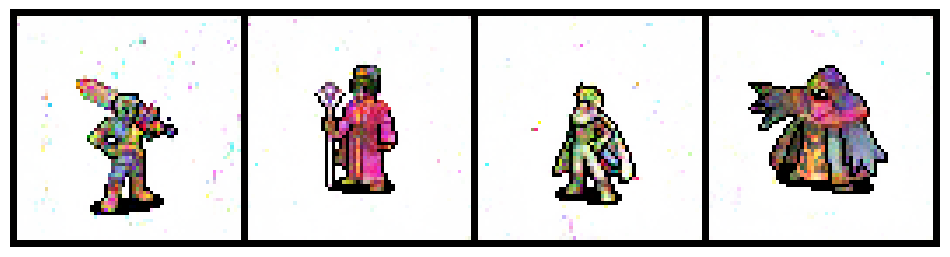

['masculine, warrior, warm',
 'masculine, mage, warm',
 'masculine, rogue, warm',
 'masculine, cleric, warm']

In [16]:
rows = ["warrior", "mage", "rogue", "cleric"]
palette_name = "warm"
gender_name = "masculine"

g_idx = gender_to_idx[gender_name]
p_idx = palette_to_idx[palette_name]

conds_list = []
labels = []

for hero_name in rows:
    h_idx = hero_to_idx[hero_name]
    cond = build_cond_vector(g_idx, h_idx, p_idx)
    conds_list.append(cond)
    labels.append(f"{gender_name}, {hero_name}, {palette_name}")

conds_tensor = torch.stack(conds_list, dim=0).to(device)
z = torch.randn(len(rows), nz, device=device)

with torch.no_grad():
    fake = G(z, conds_tensor).cpu()

fake_denorm = denorm(fake)
grid = vutils.make_grid(fake_denorm, nrow=len(rows), padding=2)

plt.figure(figsize=(12, 4))
plt.axis("off")
plt.imshow(grid.permute(1, 2, 0).numpy())
plt.show()

labels

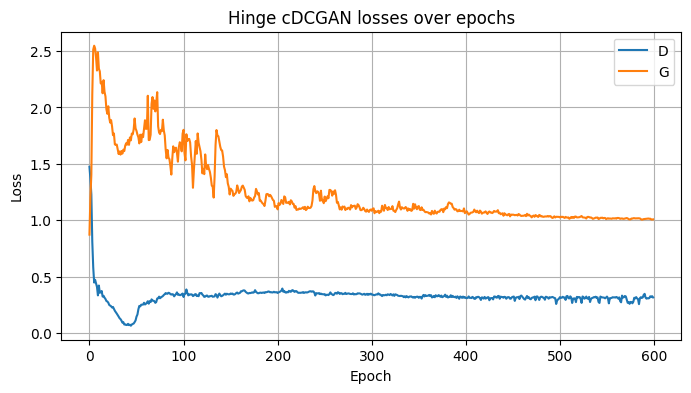

In [14]:
# losses plot and final G save
plt.figure(figsize=(8, 4))
plt.plot(losses_D, label="D")
plt.plot(losses_G, label="G")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.title("Hinge cDCGAN losses over epochs")
plt.show()


In [15]:
final_G_path = CKPT_DIR / "hinge_cdcgan_G_final.pth"
torch.save(G.state_dict(), final_G_path)
final_G_path


WindowsPath('D:/ML/LS/Deep_learning/GAN/hero_portrait_generator/artifacts_gan/checkpoints/20251119-211910/hinge_cdcgan_G_final.pth')

In [26]:
# config & run dirs for strong GAN
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sys
import torch
import torch.nn as nn
import torch.nn.functional as F

from datetime import datetime
from pathlib import Path
from PIL import Image
from torch.nn.utils import spectral_norm
from torchvision import transforms as T
import torchvision.utils as vutils
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm

PROJECT_ROOT = Path(r"D:\ML\LS\Deep_learning\GAN\hero_portrait_generator")

DATA_DIR = PROJECT_ROOT / "data"

SRC_DIR = PROJECT_ROOT / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.append(str(SRC_DIR))

from utils.config import DATASET_CONFIG, CDC_GAN_CONFIG  # теперь должно работать

print("DATASET_CONFIG:", DATASET_CONFIG)
print("CDC_GAN_CONFIG:", CDC_GAN_CONFIG)

# гиперпараметры модели / обучения
nz = 128           # размер латентного вектора
ngf = 96          # ширина генератора
ndf = 96          # ширина дискриминатора
image_size = 64
num_epochs = 400   
lr = 2e-4
beta1, beta2 = 0.5, 0.999

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

# Загружаем мэппинги классов и считаем cond_dim
with open(DATA_DIR / "label_mappings.json", "r", encoding="utf-8") as f:
    label_mappings = json.load(f)

gender_classes = label_mappings["gender_classes"]
gender_to_idx = label_mappings["gender_to_idx"]

hero_classes = label_mappings["hero_classes"]
hero_to_idx = label_mappings["hero_to_idx"]

palette_classes = label_mappings["palette_classes"]
palette_to_idx = label_mappings["palette_to_idx"]

print("gender:", gender_classes)
print("hero:", hero_classes)
print("palette:", palette_classes)

# размер условного вектора: one-hot gender + one-hot hero_class + one-hot palette
cond_dim = (
    len(gender_classes) +
    len(hero_classes) +
    len(palette_classes)
)

print("cond_dim =", cond_dim)

# папки для артефактов
RUN_ID = datetime.now().strftime("%Y%m%d-%H%M%S")
ARTIFACTS_DIR = PROJECT_ROOT / "artifacts_gan"
SAMPLES_DIR = ARTIFACTS_DIR / "samples" / RUN_ID
CKPT_DIR = ARTIFACTS_DIR / "checkpoints" / RUN_ID

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
CKPT_DIR.mkdir(parents=True, exist_ok=True)

print("RUN_ID:", RUN_ID)
print("SAMPLES_DIR:", SAMPLES_DIR)
print("CKPT_DIR:", CKPT_DIR)

DATASET_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'num_gender_classes': 2, 'num_hero_classes': 9, 'num_palette_classes': 5}
CDC_GAN_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'nz': 128, 'ngf': 64, 'ndf': 64}
device: cuda
gender: ['feminine', 'masculine']
hero: ['barbarian', 'bard', 'cavalry', 'cleric', 'knight', 'mage', 'ranger', 'rogue', 'warrior']
palette: ['cool', 'dark', 'muted', 'neutral', 'warm']
cond_dim = 16
RUN_ID: 20251120-224843
SAMPLES_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843
CKPT_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251120-224843


In [27]:
# ResBlocks + Self-Attention (FULL) 

class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.query = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.key   = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.value = spectral_norm(nn.Conv2d(in_channels, in_channels, 1))
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        B, C, H, W = x.size()
        proj_query = self.query(x).view(B, -1, H * W).permute(0, 2, 1)  # B, HW, C'
        proj_key   = self.key(x).view(B, -1, H * W)                     # B, C', HW
        energy = torch.bmm(proj_query, proj_key)                        # B, HW, HW
        attention = F.softmax(energy, dim=-1)                           # B, HW, HW

        proj_value = self.value(x).view(B, C, -1)                       # B, C, HW
        out = torch.bmm(proj_value, attention.permute(0, 2, 1))         # B, C, HW
        out = out.view(B, C, H, W)

        out = self.gamma * out + x
        return out


class GenResBlock(nn.Module):
    """ResNet-блок в генераторе с upsample (nearest)."""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode="nearest")

        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False)
        self.bn1   = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False)
        self.bn2   = nn.BatchNorm2d(out_channels)

        self.conv_skip = nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False)

    def forward(self, x):
        # skip
        skip = self.upsample(x)
        skip = self.conv_skip(skip)

        out = self.upsample(x)
        out = self.conv1(out)
        out = self.bn1(out)
        out = F.relu(out, inplace=True)

        out = self.conv2(out)
        out = self.bn2(out)

        out = F.relu(out + skip, inplace=True)
        return out


class DiscResBlock(nn.Module):
    """ResNet-блок в дискриминаторе с downsample (average pooling)."""
    def __init__(self, in_channels, out_channels, downsample=True):
        super().__init__()
        self.downsample = downsample

        self.conv1 = spectral_norm(nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False))
        self.conv2 = spectral_norm(nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False))

        self.conv_skip = spectral_norm(nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False))

        if downsample:
            self.avgpool = nn.AvgPool2d(2)

    def forward(self, x):
        skip = x
        if self.downsample:
            skip = self.avgpool(skip)
        skip = self.conv_skip(skip)

        # ВАЖНО: без inplace=True
        out = F.leaky_relu(x, 0.2)
        out = self.conv1(out)
        out = F.leaky_relu(out, 0.2)
        out = self.conv2(out)

        if self.downsample:
            out = self.avgpool(out)

        out = out + skip
        return out


In [28]:
class StrongConditionalGenerator(nn.Module):
    def __init__(self, nz: int, cond_dim: int, ngf: int = 128, nc: int = 3):
        super().__init__()
        self.nz = nz
        self.cond_dim = cond_dim

        in_dim = nz + cond_dim

        # проекция в тензор 4x4
        self.fc = nn.Linear(in_dim, ngf * 8 * 4 * 4)

        # 4x4 -> 8x8 -> 16x16 -> 32x32 -> 64x64
        self.block1 = GenResBlock(ngf * 8, ngf * 8)   # 4x4 -> 8x8
        self.block2 = GenResBlock(ngf * 8, ngf * 4)   # 8x8 -> 16x16
        self.block3 = GenResBlock(ngf * 4, ngf * 2)   # 16x16 -> 32x32
        self.block4 = GenResBlock(ngf * 2, ngf)       # 32x32 -> 64x64

        # self-attention на 32x32 (после block3)
        self.attn = SelfAttention(ngf * 2)

        self.out_conv = nn.Conv2d(ngf, nc, 3, 1, 1, bias=False)

    def forward(self, z, cond):
        # z: [B, nz], cond: [B, cond_dim]
        x = torch.cat([z, cond], dim=1)                 # [B, nz+cond_dim]
        x = self.fc(x)                                  # [B, ngf*8*4*4]
        x = x.view(x.size(0), -1, 4, 4)                 # [B, ngf*8, 4,4]

        x = self.block1(x)                              # 8x8
        x = self.block2(x)                              # 16x16
        x = self.block3(x)                              # 32x32
        x = self.attn(x)                                # attention
        x = self.block4(x)                              # 64x64

        x = self.out_conv(x)
        x = torch.tanh(x)
        return x

In [29]:
# Strong Conditional Generator & Discriminator
class StrongConditionalDiscriminator(nn.Module):
    def __init__(self, cond_dim: int, ndf: int = 96, nc: int = 3):
        super().__init__()
        self.cond_dim = cond_dim

        # будем конкатить cond как карту
        in_channels = nc + cond_dim

        # 64x64 -> 32x32 -> 16x16 -> 8x8 -> 4x4
        self.block1 = DiscResBlock(in_channels, ndf, downsample=True)      # 64->32
        self.block2 = DiscResBlock(ndf, ndf * 2, downsample=True)          # 32->16
        self.block3 = DiscResBlock(ndf * 2, ndf * 4, downsample=True)      # 16->8
        self.block4 = DiscResBlock(ndf * 4, ndf * 8, downsample=True)      # 8->4

        # БЕЗ self-attention — скорость + VRAM
        self.final_conv = spectral_norm(
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False)
        )

    def forward(self, img, cond):
        B, C, H, W = img.size()
        cond_map = cond.view(B, self.cond_dim, 1, 1).expand(-1, -1, H, W)
        x = torch.cat([img, cond_map], dim=1)

        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)

        out = self.final_conv(x)
        return out.view(-1)


In [30]:
train_csv = DATA_DIR / "sprites_train.csv"
val_csv = DATA_DIR / "sprites_val.csv"

train_df = pd.read_csv(train_csv)
val_df = pd.read_csv(val_csv)

train_df.shape, val_df.shape, train_df.columns

((6077, 12),
 (1519, 12),
 Index(['filename', 'path', 'idx', 'silhouette_hash', 'group_id', 'gender',
        'hero_class', 'palette', 'rel_path', 'gender_idx', 'hero_idx',
        'palette_idx'],
       dtype='object'))

In [31]:
# one_hot + HeroPortraitDataset 

def one_hot(index: int, num_classes: int) -> np.ndarray:
    vec = np.zeros(num_classes, dtype=np.float32)
    vec[index] = 1.0
    return vec


class HeroPortraitDataset(Dataset):
    def __init__(
        self,
        df: pd.DataFrame,
        project_root: Path,
        image_size: int = 64,
        normalize: bool = True,
    ):
        """
        df должен содержать колонки:
        - 'rel_path' (относительный путь к картинке, например 'train_images/xxx.png')
        - 'gender_idx', 'hero_idx', 'palette_idx'
        """
        self.df = df.reset_index(drop=True)
        self.project_root = Path(project_root)

        self.n_gender = len(gender_classes)
        self.n_hero = len(hero_classes)
        self.n_palette = len(palette_classes)

        # Базовые трансформации
        tfs = [
            T.Resize((image_size, image_size), interpolation=T.InterpolationMode.NEAREST),
            T.ToTensor(),
        ]
        if normalize:
            # нормализация в [-1, 1]
            tfs.append(T.Normalize(mean=[0.5, 0.5, 0.5],
                                   std=[0.5, 0.5, 0.5]))
        self.transform = T.Compose(tfs)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx: int):
        row = self.df.iloc[idx]

        # путь к картинке
        if "rel_path" in row and isinstance(row["rel_path"], str):
            img_path = self.project_root / row["rel_path"]
        else:
            # fallback, если вдруг rel_path нет
            img_path = Path(row["path"])

        img_path = img_path.resolve()

        # читаем и приводим к RGB с белым фоном, если был альфа-канал
        img = Image.open(img_path).convert("RGBA")
        if img.mode == "RGBA":
            bg = Image.new("RGBA", img.size, (255, 255, 255, 255))
            img = Image.alpha_composite(bg, img).convert("RGB")
        else:
            img = img.convert("RGB")

        img_tensor = self.transform(img)  # [3, H, W]

        # индексы классов
        g_idx = int(row["gender_idx"])
        h_idx = int(row["hero_idx"])
        p_idx = int(row["palette_idx"])

        # one-hot условие
        gender_oh = one_hot(g_idx, self.n_gender)
        hero_oh = one_hot(h_idx, self.n_hero)
        palette_oh = one_hot(p_idx, self.n_palette)

        cond_vec = np.concatenate([gender_oh, hero_oh, palette_oh]).astype(np.float32)
        cond_tensor = torch.from_numpy(cond_vec)  # [cond_dim]

        return {
            "image": img_tensor,
            "cond": cond_tensor,
        }


In [32]:
FULL_DF = pd.concat([train_df, val_df], ignore_index=True)

BATCH_SIZE = 64
IMAGE_SIZE = 64

full_dataset = HeroPortraitDataset(
    FULL_DF,
    project_root=PROJECT_ROOT,
    image_size=IMAGE_SIZE
)

train_loader = DataLoader(
    full_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    pin_memory=False,
)

len(full_dataset), len(train_loader)


(7596, 119)

In [33]:
# helpers (denorm, noise, save samples)

def denorm(img_batch):
    return (img_batch * 0.5) + 0.5  # [-1,1] -> [0,1]


def add_instance_noise(x, epoch, max_epochs, sigma_start=0.05, sigma_end=0.0):
    """Гауссовский шум к входу D, σ линейно уменьшается."""
    t = epoch / max_epochs
    sigma = sigma_start * (1 - t) + sigma_end * t
    if sigma <= 0:
        return x
    noise = torch.randn_like(x) * sigma
    return x + noise


def save_sample_images(epoch, G, fixed_noise, fixed_conds, samples_dir: Path):
    G.eval()
    with torch.no_grad():
        fake = G(fixed_noise, fixed_conds).detach().cpu()
    G.train()

    fake_denorm = denorm(fake)
    grid = vutils.make_grid(fake_denorm, nrow=4, padding=2)
    out_path = samples_dir / f"epoch_{epoch:03d}.png"

    plt.figure(figsize=(6, 6))
    plt.axis("off")
    plt.imshow(grid.permute(1, 2, 0).numpy())
    plt.tight_layout()
    plt.savefig(out_path, dpi=150)
    plt.close()

    print(f"[samples] Saved: {out_path}")


In [34]:
# init strong G & D 
G = StrongConditionalGenerator(
    nz=nz,
    cond_dim=cond_dim,
    ngf=ngf,
    nc=3
).to(device)

D = StrongConditionalDiscriminator(
    cond_dim=cond_dim,
    ndf=ndf,
    nc=3
).to(device)

print("Params G:", sum(p.numel() for p in G.parameters()))
print("Params D:", sum(p.numel() for p in D.parameters()))


Params G: 18655633
Params D: 10951488


In [35]:
# sanity-check forward pass
batch = next(iter(train_loader))
real_images = batch["image"].to(device)
conds = batch["cond"].to(device)
B = real_images.size(0)

z = torch.randn(B, nz, device=device)

with torch.no_grad():
    fake_images = G(z, conds)
    real_scores = D(real_images, conds)
    fake_scores = D(fake_images, conds)

print("real_images:", real_images.shape)   # [B, 3, 64, 64]
print("fake_images:", fake_images.shape)   # [B, 3, 64, 64]
print("real_scores:", real_scores.shape)   # [B]
print("fake_scores:", fake_scores.shape)   # [B]


real_images: torch.Size([64, 3, 64, 64])
fake_images: torch.Size([64, 3, 64, 64])
real_scores: torch.Size([64])
fake_scores: torch.Size([64])


In [36]:
# optimizers, schedulers, fixed noise/conds

optimizerD = torch.optim.AdamW(D.parameters(), lr=lr, betas=(beta1, beta2), weight_decay=1e-4)
optimizerG = torch.optim.AdamW(G.parameters(), lr=lr, betas=(beta1, beta2), weight_decay=1e-4)

schedulerD = torch.optim.lr_scheduler.CosineAnnealingLR(optimizerD, T_max=num_epochs, eta_min=1e-5)
schedulerG = torch.optim.lr_scheduler.CosineAnnealingLR(optimizerG, T_max=num_epochs, eta_min=1e-5)

num_preview = 16
preview_batch = next(iter(train_loader))
fixed_conds = preview_batch["cond"][:num_preview].to(device)
fixed_noise = torch.randn(num_preview, nz, device=device)

In [37]:
# main training loop (hinge, strong arch)

start_epoch = 1
losses_D = []
losses_G = []

G.train()
D.train()

for epoch in range(start_epoch, num_epochs + 1):
    G.train()
    D.train()

    epoch_loss_G = 0.0
    epoch_loss_D = 0.0
    num_batches = 0

    pbar = tqdm(
        train_loader,
        desc=f"Epoch [{epoch}/{num_epochs}]",
        leave=False
    )

    for batch in pbar:
        real_images = batch["image"].to(device)   # [B, 3, 64, 64]
        conds = batch["cond"].to(device)          # [B, cond_dim]
        B = real_images.size(0)

        # === Обновляем D (hinge) ===
        D.zero_grad(set_to_none=True)

        real_images_noisy = add_instance_noise(real_images, epoch, num_epochs)
        real_scores = D(real_images_noisy, conds)                # [B]
        loss_D_real = torch.relu(1.0 - real_scores).mean()

        z = torch.randn(B, nz, device=device)
        fake_images = G(z, conds)
        fake_images_noisy = add_instance_noise(fake_images.detach(), epoch, num_epochs)
        fake_scores = D(fake_images_noisy, conds)
        loss_D_fake = torch.relu(1.0 + fake_scores).mean()

        loss_D = loss_D_real + loss_D_fake
        loss_D.backward()
        optimizerD.step()

        # === Обновляем G ===
        G.zero_grad(set_to_none=True)
        fake_scores_for_G = D(fake_images, conds)
        loss_G = - fake_scores_for_G.mean()       # hinge-G
        loss_G.backward()
        optimizerG.step()

        epoch_loss_D += loss_D.item()
        epoch_loss_G += loss_G.item()
        num_batches += 1

        pbar.set_postfix({
            "loss_D": f"{loss_D.item():.3f}",
            "loss_G": f"{loss_G.item():.3f}"
        })

    epoch_loss_D /= num_batches
    epoch_loss_G /= num_batches
    losses_D.append(epoch_loss_D)
    losses_G.append(epoch_loss_G)

    schedulerD.step()
    schedulerG.step()

    print(
        f"[Epoch {epoch:03d}/{num_epochs}] "
        f"mean loss_D: {epoch_loss_D:.4f} | "
        f"mean loss_G: {epoch_loss_G:.4f} | "
        f"remaining: {num_epochs - epoch} epochs"
    )

    # сэмплы
    if epoch % 10 == 0 or epoch == start_epoch:
        save_sample_images(epoch, G, fixed_noise, fixed_conds, SAMPLES_DIR)

    # чекпоинты
    if epoch % 50 == 0 or epoch == num_epochs:
        ckpt_path = CKPT_DIR / f"strong_hinge_cdcgan_epoch_{epoch:03d}.pth"
        torch.save(
            {
                "epoch": epoch,
                "G_state_dict": G.state_dict(),
                "D_state_dict": D.state_dict(),
                "optimizerG_state_dict": optimizerG.state_dict(),
                "optimizerD_state_dict": optimizerD.state_dict(),
                "losses_G": losses_G,
                "losses_D": losses_D,
                "config": {
                    "nz": nz,
                    "cond_dim": cond_dim,
                    "ngf": ngf,
                    "ndf": ndf,
                    "image_size": image_size,
                    "run_id": RUN_ID,
                },
            },
            ckpt_path,
        )
        print(f"[ckpt] Saved: {ckpt_path}")


Epoch [1/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 001/400] mean loss_D: 1.9946 | mean loss_G: -0.0704 | remaining: 399 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_001.png


Epoch [2/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 002/400] mean loss_D: 1.8974 | mean loss_G: 0.0234 | remaining: 398 epochs


Epoch [3/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 003/400] mean loss_D: 1.6495 | mean loss_G: 0.7473 | remaining: 397 epochs


Epoch [4/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 004/400] mean loss_D: 1.6616 | mean loss_G: 0.6764 | remaining: 396 epochs


Epoch [5/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 005/400] mean loss_D: 1.8471 | mean loss_G: 0.1129 | remaining: 395 epochs


Epoch [6/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 006/400] mean loss_D: 2.0020 | mean loss_G: -0.2891 | remaining: 394 epochs


Epoch [7/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 007/400] mean loss_D: 1.9701 | mean loss_G: -0.1269 | remaining: 393 epochs


Epoch [8/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 008/400] mean loss_D: 1.9908 | mean loss_G: -0.1343 | remaining: 392 epochs


Epoch [9/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 009/400] mean loss_D: 1.9869 | mean loss_G: -0.1704 | remaining: 391 epochs


Epoch [10/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 010/400] mean loss_D: 1.9870 | mean loss_G: -0.0461 | remaining: 390 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_010.png


Epoch [11/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 011/400] mean loss_D: 1.9863 | mean loss_G: -0.1111 | remaining: 389 epochs


Epoch [12/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 012/400] mean loss_D: 1.9803 | mean loss_G: -0.0630 | remaining: 388 epochs


Epoch [13/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 013/400] mean loss_D: 1.9803 | mean loss_G: 0.0208 | remaining: 387 epochs


Epoch [14/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 014/400] mean loss_D: 1.9756 | mean loss_G: 0.0296 | remaining: 386 epochs


Epoch [15/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 015/400] mean loss_D: 1.9517 | mean loss_G: 0.0560 | remaining: 385 epochs


Epoch [16/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 016/400] mean loss_D: 1.9496 | mean loss_G: 0.0640 | remaining: 384 epochs


Epoch [17/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 017/400] mean loss_D: 1.9301 | mean loss_G: -0.2913 | remaining: 383 epochs


Epoch [18/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 018/400] mean loss_D: 1.8873 | mean loss_G: 0.0655 | remaining: 382 epochs


Epoch [19/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 019/400] mean loss_D: 1.8174 | mean loss_G: 0.2434 | remaining: 381 epochs


Epoch [20/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 020/400] mean loss_D: 1.7998 | mean loss_G: 0.3765 | remaining: 380 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_020.png


Epoch [21/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 021/400] mean loss_D: 1.7360 | mean loss_G: 0.4180 | remaining: 379 epochs


Epoch [22/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 022/400] mean loss_D: 1.6590 | mean loss_G: 0.4814 | remaining: 378 epochs


Epoch [23/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 023/400] mean loss_D: 1.5625 | mean loss_G: 0.5347 | remaining: 377 epochs


Epoch [24/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 024/400] mean loss_D: 1.5364 | mean loss_G: 0.5594 | remaining: 376 epochs


Epoch [25/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 025/400] mean loss_D: 1.4291 | mean loss_G: 0.6051 | remaining: 375 epochs


Epoch [26/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 026/400] mean loss_D: 1.3350 | mean loss_G: 0.6425 | remaining: 374 epochs


Epoch [27/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 027/400] mean loss_D: 1.2941 | mean loss_G: 0.7496 | remaining: 373 epochs


Epoch [28/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 028/400] mean loss_D: 1.2700 | mean loss_G: 0.6974 | remaining: 372 epochs


Epoch [29/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 029/400] mean loss_D: 1.2709 | mean loss_G: 0.7327 | remaining: 371 epochs


Epoch [30/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 030/400] mean loss_D: 1.2728 | mean loss_G: 0.7056 | remaining: 370 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_030.png


Epoch [31/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 031/400] mean loss_D: 1.2040 | mean loss_G: 0.7247 | remaining: 369 epochs


Epoch [32/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 032/400] mean loss_D: 1.1831 | mean loss_G: 0.7662 | remaining: 368 epochs


Epoch [33/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 033/400] mean loss_D: 1.1390 | mean loss_G: 0.8100 | remaining: 367 epochs


Epoch [34/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 034/400] mean loss_D: 1.0804 | mean loss_G: 0.8252 | remaining: 366 epochs


Epoch [35/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 035/400] mean loss_D: 1.0363 | mean loss_G: 0.8790 | remaining: 365 epochs


Epoch [36/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 036/400] mean loss_D: 0.9796 | mean loss_G: 0.9272 | remaining: 364 epochs


Epoch [37/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 037/400] mean loss_D: 0.9579 | mean loss_G: 0.9476 | remaining: 363 epochs


Epoch [38/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 038/400] mean loss_D: 0.9170 | mean loss_G: 0.9581 | remaining: 362 epochs


Epoch [39/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 039/400] mean loss_D: 0.8953 | mean loss_G: 0.9893 | remaining: 361 epochs


Epoch [40/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 040/400] mean loss_D: 0.8648 | mean loss_G: 0.9963 | remaining: 360 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_040.png


Epoch [41/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 041/400] mean loss_D: 0.8317 | mean loss_G: 1.0532 | remaining: 359 epochs


Epoch [42/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 042/400] mean loss_D: 0.8058 | mean loss_G: 1.0572 | remaining: 358 epochs


Epoch [43/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 043/400] mean loss_D: 0.7733 | mean loss_G: 1.1093 | remaining: 357 epochs


Epoch [44/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 044/400] mean loss_D: 0.7521 | mean loss_G: 1.1241 | remaining: 356 epochs


Epoch [45/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 045/400] mean loss_D: 0.7331 | mean loss_G: 1.1539 | remaining: 355 epochs


Epoch [46/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 046/400] mean loss_D: 0.7263 | mean loss_G: 1.1586 | remaining: 354 epochs


Epoch [47/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 047/400] mean loss_D: 0.7243 | mean loss_G: 1.1713 | remaining: 353 epochs


Epoch [48/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 048/400] mean loss_D: 0.7153 | mean loss_G: 1.1837 | remaining: 352 epochs


Epoch [49/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 049/400] mean loss_D: 0.7061 | mean loss_G: 1.2044 | remaining: 351 epochs


Epoch [50/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 050/400] mean loss_D: 0.6874 | mean loss_G: 1.2212 | remaining: 350 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_050.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251120-224843\strong_hinge_cdcgan_epoch_050.pth


Epoch [51/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 051/400] mean loss_D: 0.7034 | mean loss_G: 1.1891 | remaining: 349 epochs


Epoch [52/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 052/400] mean loss_D: 0.7008 | mean loss_G: 1.2302 | remaining: 348 epochs


Epoch [53/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 053/400] mean loss_D: 0.7156 | mean loss_G: 1.2032 | remaining: 347 epochs


Epoch [54/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 054/400] mean loss_D: 0.7360 | mean loss_G: 1.2230 | remaining: 346 epochs


Epoch [55/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 055/400] mean loss_D: 0.7280 | mean loss_G: 1.1749 | remaining: 345 epochs


Epoch [56/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 056/400] mean loss_D: 0.7413 | mean loss_G: 1.2010 | remaining: 344 epochs


Epoch [57/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 057/400] mean loss_D: 0.7525 | mean loss_G: 1.1884 | remaining: 343 epochs


Epoch [58/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 058/400] mean loss_D: 0.7638 | mean loss_G: 1.1858 | remaining: 342 epochs


Epoch [59/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 059/400] mean loss_D: 0.7728 | mean loss_G: 1.1734 | remaining: 341 epochs


Epoch [60/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 060/400] mean loss_D: 0.7727 | mean loss_G: 1.1692 | remaining: 340 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_060.png


Epoch [61/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 061/400] mean loss_D: 0.7784 | mean loss_G: 1.1944 | remaining: 339 epochs


Epoch [62/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 062/400] mean loss_D: 0.8005 | mean loss_G: 1.1574 | remaining: 338 epochs


Epoch [63/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 063/400] mean loss_D: 0.7991 | mean loss_G: 1.1742 | remaining: 337 epochs


Epoch [64/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 064/400] mean loss_D: 0.8023 | mean loss_G: 1.1655 | remaining: 336 epochs


Epoch [65/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 065/400] mean loss_D: 0.8024 | mean loss_G: 1.1531 | remaining: 335 epochs


Epoch [66/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 066/400] mean loss_D: 0.8183 | mean loss_G: 1.1555 | remaining: 334 epochs


Epoch [67/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 067/400] mean loss_D: 0.8340 | mean loss_G: 1.1544 | remaining: 333 epochs


Epoch [68/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 068/400] mean loss_D: 0.8242 | mean loss_G: 1.1716 | remaining: 332 epochs


Epoch [69/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 069/400] mean loss_D: 0.8422 | mean loss_G: 1.1559 | remaining: 331 epochs


Epoch [70/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 070/400] mean loss_D: 0.8230 | mean loss_G: 1.1449 | remaining: 330 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_070.png


Epoch [71/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 071/400] mean loss_D: 0.8409 | mean loss_G: 1.1436 | remaining: 329 epochs


Epoch [72/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 072/400] mean loss_D: 0.8524 | mean loss_G: 1.1474 | remaining: 328 epochs


Epoch [73/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 073/400] mean loss_D: 0.8480 | mean loss_G: 1.1362 | remaining: 327 epochs


Epoch [74/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 074/400] mean loss_D: 0.8424 | mean loss_G: 1.1501 | remaining: 326 epochs


Epoch [75/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 075/400] mean loss_D: 0.8520 | mean loss_G: 1.1388 | remaining: 325 epochs


Epoch [76/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 076/400] mean loss_D: 0.8515 | mean loss_G: 1.1402 | remaining: 324 epochs


Epoch [77/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 077/400] mean loss_D: 0.8712 | mean loss_G: 1.1494 | remaining: 323 epochs


Epoch [78/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 078/400] mean loss_D: 0.8741 | mean loss_G: 1.1286 | remaining: 322 epochs


Epoch [79/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 079/400] mean loss_D: 0.8654 | mean loss_G: 1.1222 | remaining: 321 epochs


Epoch [80/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 080/400] mean loss_D: 0.8750 | mean loss_G: 1.1100 | remaining: 320 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_080.png


Epoch [81/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 081/400] mean loss_D: 0.8890 | mean loss_G: 1.1185 | remaining: 319 epochs


Epoch [82/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 082/400] mean loss_D: 0.8808 | mean loss_G: 1.1105 | remaining: 318 epochs


Epoch [83/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 083/400] mean loss_D: 0.8874 | mean loss_G: 1.1039 | remaining: 317 epochs


Epoch [84/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 084/400] mean loss_D: 0.8856 | mean loss_G: 1.1098 | remaining: 316 epochs


Epoch [85/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 085/400] mean loss_D: 0.8969 | mean loss_G: 1.1062 | remaining: 315 epochs


Epoch [86/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 086/400] mean loss_D: 0.8903 | mean loss_G: 1.1023 | remaining: 314 epochs


Epoch [87/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 087/400] mean loss_D: 0.8921 | mean loss_G: 1.0768 | remaining: 313 epochs


Epoch [88/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 088/400] mean loss_D: 0.8994 | mean loss_G: 1.0989 | remaining: 312 epochs


Epoch [89/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 089/400] mean loss_D: 0.9050 | mean loss_G: 1.1161 | remaining: 311 epochs


Epoch [90/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 090/400] mean loss_D: 0.9044 | mean loss_G: 1.0917 | remaining: 310 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_090.png


Epoch [91/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 091/400] mean loss_D: 0.8958 | mean loss_G: 1.1109 | remaining: 309 epochs


Epoch [92/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 092/400] mean loss_D: 0.8959 | mean loss_G: 1.1095 | remaining: 308 epochs


Epoch [93/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 093/400] mean loss_D: 0.9028 | mean loss_G: 1.0901 | remaining: 307 epochs


Epoch [94/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 094/400] mean loss_D: 0.9065 | mean loss_G: 1.0851 | remaining: 306 epochs


Epoch [95/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 095/400] mean loss_D: 0.9348 | mean loss_G: 1.0742 | remaining: 305 epochs


Epoch [96/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 096/400] mean loss_D: 0.9252 | mean loss_G: 1.0863 | remaining: 304 epochs


Epoch [97/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 097/400] mean loss_D: 0.9417 | mean loss_G: 1.0699 | remaining: 303 epochs


Epoch [98/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 098/400] mean loss_D: 0.9283 | mean loss_G: 1.0716 | remaining: 302 epochs


Epoch [99/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 099/400] mean loss_D: 0.9333 | mean loss_G: 1.0696 | remaining: 301 epochs


Epoch [100/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 100/400] mean loss_D: 0.9337 | mean loss_G: 1.0667 | remaining: 300 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_100.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251120-224843\strong_hinge_cdcgan_epoch_100.pth


Epoch [101/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 101/400] mean loss_D: 0.9314 | mean loss_G: 1.0765 | remaining: 299 epochs


Epoch [102/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 102/400] mean loss_D: 0.9399 | mean loss_G: 1.0883 | remaining: 298 epochs


Epoch [103/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 103/400] mean loss_D: 0.9394 | mean loss_G: 1.0566 | remaining: 297 epochs


Epoch [104/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 104/400] mean loss_D: 0.9400 | mean loss_G: 1.0848 | remaining: 296 epochs


Epoch [105/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 105/400] mean loss_D: 0.9348 | mean loss_G: 1.0678 | remaining: 295 epochs


Epoch [106/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 106/400] mean loss_D: 0.9433 | mean loss_G: 1.0707 | remaining: 294 epochs


Epoch [107/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 107/400] mean loss_D: 0.9431 | mean loss_G: 1.0592 | remaining: 293 epochs


Epoch [108/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 108/400] mean loss_D: 0.9513 | mean loss_G: 1.0352 | remaining: 292 epochs


Epoch [109/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 109/400] mean loss_D: 0.9405 | mean loss_G: 1.0577 | remaining: 291 epochs


Epoch [110/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 110/400] mean loss_D: 0.9473 | mean loss_G: 1.0709 | remaining: 290 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_110.png


Epoch [111/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 111/400] mean loss_D: 0.9476 | mean loss_G: 1.0534 | remaining: 289 epochs


Epoch [112/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 112/400] mean loss_D: 0.9443 | mean loss_G: 1.0687 | remaining: 288 epochs


Epoch [113/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 113/400] mean loss_D: 0.9608 | mean loss_G: 1.0534 | remaining: 287 epochs


Epoch [114/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 114/400] mean loss_D: 0.9526 | mean loss_G: 1.0622 | remaining: 286 epochs


Epoch [115/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 115/400] mean loss_D: 0.9531 | mean loss_G: 1.0635 | remaining: 285 epochs


Epoch [116/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 116/400] mean loss_D: 0.9642 | mean loss_G: 1.0441 | remaining: 284 epochs


Epoch [117/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 117/400] mean loss_D: 0.9498 | mean loss_G: 1.0435 | remaining: 283 epochs


Epoch [118/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 118/400] mean loss_D: 0.9402 | mean loss_G: 1.0468 | remaining: 282 epochs


Epoch [119/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 119/400] mean loss_D: 0.9565 | mean loss_G: 1.0441 | remaining: 281 epochs


Epoch [120/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 120/400] mean loss_D: 0.9484 | mean loss_G: 1.0455 | remaining: 280 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_120.png


Epoch [121/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 121/400] mean loss_D: 0.9591 | mean loss_G: 1.0459 | remaining: 279 epochs


Epoch [122/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 122/400] mean loss_D: 0.9583 | mean loss_G: 1.0378 | remaining: 278 epochs


Epoch [123/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 123/400] mean loss_D: 0.9597 | mean loss_G: 1.0392 | remaining: 277 epochs


Epoch [124/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 124/400] mean loss_D: 0.9593 | mean loss_G: 1.0401 | remaining: 276 epochs


Epoch [125/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 125/400] mean loss_D: 0.9674 | mean loss_G: 1.0316 | remaining: 275 epochs


Epoch [126/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 126/400] mean loss_D: 0.9610 | mean loss_G: 1.0280 | remaining: 274 epochs


Epoch [127/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 127/400] mean loss_D: 0.9620 | mean loss_G: 1.0401 | remaining: 273 epochs


Epoch [128/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 128/400] mean loss_D: 0.9643 | mean loss_G: 1.0429 | remaining: 272 epochs


Epoch [129/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 129/400] mean loss_D: 0.9691 | mean loss_G: 1.0414 | remaining: 271 epochs


Epoch [130/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 130/400] mean loss_D: 0.9762 | mean loss_G: 1.0341 | remaining: 270 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_130.png


Epoch [131/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 131/400] mean loss_D: 0.9630 | mean loss_G: 1.0384 | remaining: 269 epochs


Epoch [132/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 132/400] mean loss_D: 0.9812 | mean loss_G: 1.0230 | remaining: 268 epochs


Epoch [133/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 133/400] mean loss_D: 0.9770 | mean loss_G: 1.0381 | remaining: 267 epochs


Epoch [134/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 134/400] mean loss_D: 0.9742 | mean loss_G: 1.0279 | remaining: 266 epochs


Epoch [135/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 135/400] mean loss_D: 0.9831 | mean loss_G: 1.0223 | remaining: 265 epochs


Epoch [136/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 136/400] mean loss_D: 0.9820 | mean loss_G: 1.0186 | remaining: 264 epochs


Epoch [137/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 137/400] mean loss_D: 0.9901 | mean loss_G: 1.0206 | remaining: 263 epochs


Epoch [138/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 138/400] mean loss_D: 0.9798 | mean loss_G: 1.0313 | remaining: 262 epochs


Epoch [139/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 139/400] mean loss_D: 0.9984 | mean loss_G: 1.0204 | remaining: 261 epochs


Epoch [140/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 140/400] mean loss_D: 1.0045 | mean loss_G: 1.0135 | remaining: 260 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_140.png


Epoch [141/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 141/400] mean loss_D: 0.9956 | mean loss_G: 1.0106 | remaining: 259 epochs


Epoch [142/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 142/400] mean loss_D: 0.9952 | mean loss_G: 1.0174 | remaining: 258 epochs


Epoch [143/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 143/400] mean loss_D: 0.9956 | mean loss_G: 1.0143 | remaining: 257 epochs


Epoch [144/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 144/400] mean loss_D: 0.9955 | mean loss_G: 1.0056 | remaining: 256 epochs


Epoch [145/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 145/400] mean loss_D: 1.0001 | mean loss_G: 1.0118 | remaining: 255 epochs


Epoch [146/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 146/400] mean loss_D: 0.9979 | mean loss_G: 1.0115 | remaining: 254 epochs


Epoch [147/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 147/400] mean loss_D: 0.9943 | mean loss_G: 1.0199 | remaining: 253 epochs


Epoch [148/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 148/400] mean loss_D: 1.0083 | mean loss_G: 1.0083 | remaining: 252 epochs


Epoch [149/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 149/400] mean loss_D: 1.0097 | mean loss_G: 1.0254 | remaining: 251 epochs


Epoch [150/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 150/400] mean loss_D: 1.0042 | mean loss_G: 1.0115 | remaining: 250 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_150.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251120-224843\strong_hinge_cdcgan_epoch_150.pth


Epoch [151/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 151/400] mean loss_D: 1.0120 | mean loss_G: 1.0036 | remaining: 249 epochs


Epoch [152/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 152/400] mean loss_D: 1.0093 | mean loss_G: 1.0098 | remaining: 248 epochs


Epoch [153/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 153/400] mean loss_D: 1.0125 | mean loss_G: 1.0107 | remaining: 247 epochs


Epoch [154/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 154/400] mean loss_D: 1.0055 | mean loss_G: 1.0122 | remaining: 246 epochs


Epoch [155/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 155/400] mean loss_D: 1.0018 | mean loss_G: 1.0036 | remaining: 245 epochs


Epoch [156/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 156/400] mean loss_D: 1.0021 | mean loss_G: 1.0136 | remaining: 244 epochs


Epoch [157/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 157/400] mean loss_D: 1.0081 | mean loss_G: 0.9934 | remaining: 243 epochs


Epoch [158/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 158/400] mean loss_D: 1.0124 | mean loss_G: 1.0078 | remaining: 242 epochs


Epoch [159/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 159/400] mean loss_D: 1.0053 | mean loss_G: 0.9879 | remaining: 241 epochs


Epoch [160/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 160/400] mean loss_D: 1.0099 | mean loss_G: 0.9906 | remaining: 240 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_160.png


Epoch [161/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 161/400] mean loss_D: 1.0086 | mean loss_G: 1.0037 | remaining: 239 epochs


Epoch [162/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 162/400] mean loss_D: 1.0079 | mean loss_G: 0.9970 | remaining: 238 epochs


Epoch [163/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 163/400] mean loss_D: 1.0153 | mean loss_G: 1.0098 | remaining: 237 epochs


Epoch [164/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 164/400] mean loss_D: 1.0130 | mean loss_G: 0.9900 | remaining: 236 epochs


Epoch [165/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 165/400] mean loss_D: 1.0060 | mean loss_G: 1.0071 | remaining: 235 epochs


Epoch [166/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 166/400] mean loss_D: 1.0123 | mean loss_G: 1.0092 | remaining: 234 epochs


Epoch [167/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 167/400] mean loss_D: 1.0129 | mean loss_G: 1.0049 | remaining: 233 epochs


Epoch [168/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 168/400] mean loss_D: 1.0140 | mean loss_G: 1.0022 | remaining: 232 epochs


Epoch [169/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 169/400] mean loss_D: 1.0203 | mean loss_G: 0.9954 | remaining: 231 epochs


Epoch [170/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 170/400] mean loss_D: 1.0219 | mean loss_G: 1.0014 | remaining: 230 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_170.png


Epoch [171/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 171/400] mean loss_D: 1.0203 | mean loss_G: 1.0001 | remaining: 229 epochs


Epoch [172/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 172/400] mean loss_D: 1.0128 | mean loss_G: 1.0036 | remaining: 228 epochs


Epoch [173/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 173/400] mean loss_D: 1.0182 | mean loss_G: 1.0041 | remaining: 227 epochs


Epoch [174/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 174/400] mean loss_D: 1.0156 | mean loss_G: 1.0039 | remaining: 226 epochs


Epoch [175/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 175/400] mean loss_D: 1.0211 | mean loss_G: 1.0062 | remaining: 225 epochs


Epoch [176/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 176/400] mean loss_D: 1.0146 | mean loss_G: 0.9957 | remaining: 224 epochs


Epoch [177/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 177/400] mean loss_D: 1.0302 | mean loss_G: 1.0056 | remaining: 223 epochs


Epoch [178/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 178/400] mean loss_D: 1.0211 | mean loss_G: 0.9953 | remaining: 222 epochs


Epoch [179/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 179/400] mean loss_D: 1.0166 | mean loss_G: 0.9941 | remaining: 221 epochs


Epoch [180/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 180/400] mean loss_D: 1.0152 | mean loss_G: 0.9866 | remaining: 220 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_180.png


Epoch [181/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 181/400] mean loss_D: 1.0316 | mean loss_G: 0.9813 | remaining: 219 epochs


Epoch [182/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 182/400] mean loss_D: 1.0199 | mean loss_G: 0.9939 | remaining: 218 epochs


Epoch [183/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 183/400] mean loss_D: 1.0193 | mean loss_G: 0.9895 | remaining: 217 epochs


Epoch [184/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 184/400] mean loss_D: 1.0188 | mean loss_G: 0.9944 | remaining: 216 epochs


Epoch [185/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 185/400] mean loss_D: 1.0202 | mean loss_G: 0.9823 | remaining: 215 epochs


Epoch [186/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 186/400] mean loss_D: 1.0201 | mean loss_G: 0.9870 | remaining: 214 epochs


Epoch [187/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 187/400] mean loss_D: 1.0229 | mean loss_G: 0.9913 | remaining: 213 epochs


Epoch [188/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 188/400] mean loss_D: 1.0226 | mean loss_G: 0.9993 | remaining: 212 epochs


Epoch [189/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 189/400] mean loss_D: 1.0268 | mean loss_G: 0.9865 | remaining: 211 epochs


Epoch [190/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 190/400] mean loss_D: 1.0282 | mean loss_G: 1.0055 | remaining: 210 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_190.png


Epoch [191/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 191/400] mean loss_D: 1.0209 | mean loss_G: 0.9812 | remaining: 209 epochs


Epoch [192/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 192/400] mean loss_D: 1.0199 | mean loss_G: 0.9981 | remaining: 208 epochs


Epoch [193/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 193/400] mean loss_D: 1.0158 | mean loss_G: 0.9943 | remaining: 207 epochs


Epoch [194/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 194/400] mean loss_D: 1.0156 | mean loss_G: 0.9830 | remaining: 206 epochs


Epoch [195/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 195/400] mean loss_D: 1.0290 | mean loss_G: 0.9833 | remaining: 205 epochs


Epoch [196/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 196/400] mean loss_D: 1.0224 | mean loss_G: 0.9878 | remaining: 204 epochs


Epoch [197/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 197/400] mean loss_D: 1.0254 | mean loss_G: 0.9851 | remaining: 203 epochs


Epoch [198/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 198/400] mean loss_D: 1.0279 | mean loss_G: 0.9924 | remaining: 202 epochs


Epoch [199/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 199/400] mean loss_D: 1.0346 | mean loss_G: 0.9871 | remaining: 201 epochs


Epoch [200/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 200/400] mean loss_D: 1.0297 | mean loss_G: 0.9799 | remaining: 200 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_200.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251120-224843\strong_hinge_cdcgan_epoch_200.pth


Epoch [201/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 201/400] mean loss_D: 1.0324 | mean loss_G: 0.9884 | remaining: 199 epochs


Epoch [202/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 202/400] mean loss_D: 1.0281 | mean loss_G: 0.9843 | remaining: 198 epochs


Epoch [203/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 203/400] mean loss_D: 1.0307 | mean loss_G: 0.9894 | remaining: 197 epochs


Epoch [204/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 204/400] mean loss_D: 1.0322 | mean loss_G: 0.9874 | remaining: 196 epochs


Epoch [205/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 205/400] mean loss_D: 1.0241 | mean loss_G: 0.9954 | remaining: 195 epochs


Epoch [206/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 206/400] mean loss_D: 1.0329 | mean loss_G: 0.9853 | remaining: 194 epochs


Epoch [207/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 207/400] mean loss_D: 1.0352 | mean loss_G: 0.9762 | remaining: 193 epochs


Epoch [208/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 208/400] mean loss_D: 1.0231 | mean loss_G: 0.9923 | remaining: 192 epochs


Epoch [209/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 209/400] mean loss_D: 1.0323 | mean loss_G: 0.9827 | remaining: 191 epochs


Epoch [210/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 210/400] mean loss_D: 1.0292 | mean loss_G: 0.9808 | remaining: 190 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_210.png


Epoch [211/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 211/400] mean loss_D: 1.0364 | mean loss_G: 0.9815 | remaining: 189 epochs


Epoch [212/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 212/400] mean loss_D: 1.0326 | mean loss_G: 0.9916 | remaining: 188 epochs


Epoch [213/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 213/400] mean loss_D: 1.0286 | mean loss_G: 0.9749 | remaining: 187 epochs


Epoch [214/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 214/400] mean loss_D: 1.0298 | mean loss_G: 0.9794 | remaining: 186 epochs


Epoch [215/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 215/400] mean loss_D: 1.0338 | mean loss_G: 0.9581 | remaining: 185 epochs


Epoch [216/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 216/400] mean loss_D: 1.0313 | mean loss_G: 0.9559 | remaining: 184 epochs


Epoch [217/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 217/400] mean loss_D: 1.0341 | mean loss_G: 0.9469 | remaining: 183 epochs


Epoch [218/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 218/400] mean loss_D: 1.0340 | mean loss_G: 0.9663 | remaining: 182 epochs


Epoch [219/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 219/400] mean loss_D: 1.0331 | mean loss_G: 0.9738 | remaining: 181 epochs


Epoch [220/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 220/400] mean loss_D: 1.0312 | mean loss_G: 0.9705 | remaining: 180 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_220.png


Epoch [221/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 221/400] mean loss_D: 1.0275 | mean loss_G: 0.9764 | remaining: 179 epochs


Epoch [222/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 222/400] mean loss_D: 1.0332 | mean loss_G: 0.9574 | remaining: 178 epochs


Epoch [223/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 223/400] mean loss_D: 1.0284 | mean loss_G: 0.9745 | remaining: 177 epochs


Epoch [224/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 224/400] mean loss_D: 1.0251 | mean loss_G: 0.9734 | remaining: 176 epochs


Epoch [225/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 225/400] mean loss_D: 1.0219 | mean loss_G: 0.9929 | remaining: 175 epochs


Epoch [226/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 226/400] mean loss_D: 1.0210 | mean loss_G: 0.9913 | remaining: 174 epochs


Epoch [227/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 227/400] mean loss_D: 1.0161 | mean loss_G: 0.9852 | remaining: 173 epochs


Epoch [228/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 228/400] mean loss_D: 1.0149 | mean loss_G: 0.9798 | remaining: 172 epochs


Epoch [229/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 229/400] mean loss_D: 1.0235 | mean loss_G: 0.9818 | remaining: 171 epochs


Epoch [230/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 230/400] mean loss_D: 1.0277 | mean loss_G: 0.9667 | remaining: 170 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_230.png


Epoch [231/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 231/400] mean loss_D: 1.0253 | mean loss_G: 0.9828 | remaining: 169 epochs


Epoch [232/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 232/400] mean loss_D: 1.0332 | mean loss_G: 0.9703 | remaining: 168 epochs


Epoch [233/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 233/400] mean loss_D: 1.0270 | mean loss_G: 0.9661 | remaining: 167 epochs


Epoch [234/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 234/400] mean loss_D: 1.0226 | mean loss_G: 0.9774 | remaining: 166 epochs


Epoch [235/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 235/400] mean loss_D: 1.0170 | mean loss_G: 0.9667 | remaining: 165 epochs


Epoch [236/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 236/400] mean loss_D: 1.0256 | mean loss_G: 0.9596 | remaining: 164 epochs


Epoch [237/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 237/400] mean loss_D: 1.0209 | mean loss_G: 0.9713 | remaining: 163 epochs


Epoch [238/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 238/400] mean loss_D: 1.0208 | mean loss_G: 0.9788 | remaining: 162 epochs


Epoch [239/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 239/400] mean loss_D: 1.0311 | mean loss_G: 0.9698 | remaining: 161 epochs


Epoch [240/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 240/400] mean loss_D: 1.0260 | mean loss_G: 0.9849 | remaining: 160 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_240.png


Epoch [241/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 241/400] mean loss_D: 1.0287 | mean loss_G: 0.9731 | remaining: 159 epochs


Epoch [242/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 242/400] mean loss_D: 1.0339 | mean loss_G: 0.9775 | remaining: 158 epochs


Epoch [243/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 243/400] mean loss_D: 1.0291 | mean loss_G: 0.9857 | remaining: 157 epochs


Epoch [244/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 244/400] mean loss_D: 1.0297 | mean loss_G: 0.9791 | remaining: 156 epochs


Epoch [245/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 245/400] mean loss_D: 1.0319 | mean loss_G: 0.9756 | remaining: 155 epochs


Epoch [246/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 246/400] mean loss_D: 1.0370 | mean loss_G: 0.9779 | remaining: 154 epochs


Epoch [247/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 247/400] mean loss_D: 1.0297 | mean loss_G: 0.9779 | remaining: 153 epochs


Epoch [248/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 248/400] mean loss_D: 1.0235 | mean loss_G: 0.9783 | remaining: 152 epochs


Epoch [249/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 249/400] mean loss_D: 1.0325 | mean loss_G: 0.9753 | remaining: 151 epochs


Epoch [250/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 250/400] mean loss_D: 1.0306 | mean loss_G: 0.9778 | remaining: 150 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_250.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251120-224843\strong_hinge_cdcgan_epoch_250.pth


Epoch [251/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 251/400] mean loss_D: 1.0270 | mean loss_G: 0.9756 | remaining: 149 epochs


Epoch [252/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 252/400] mean loss_D: 1.0302 | mean loss_G: 0.9690 | remaining: 148 epochs


Epoch [253/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 253/400] mean loss_D: 1.0254 | mean loss_G: 0.9745 | remaining: 147 epochs


Epoch [254/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 254/400] mean loss_D: 1.0284 | mean loss_G: 0.9804 | remaining: 146 epochs


Epoch [255/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 255/400] mean loss_D: 1.0353 | mean loss_G: 0.9721 | remaining: 145 epochs


Epoch [256/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 256/400] mean loss_D: 1.0301 | mean loss_G: 0.9758 | remaining: 144 epochs


Epoch [257/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 257/400] mean loss_D: 1.0366 | mean loss_G: 0.9763 | remaining: 143 epochs


Epoch [258/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 258/400] mean loss_D: 1.0287 | mean loss_G: 0.9780 | remaining: 142 epochs


Epoch [259/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 259/400] mean loss_D: 1.0379 | mean loss_G: 0.9733 | remaining: 141 epochs


Epoch [260/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 260/400] mean loss_D: 1.0306 | mean loss_G: 0.9724 | remaining: 140 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_260.png


Epoch [261/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 261/400] mean loss_D: 1.0343 | mean loss_G: 0.9748 | remaining: 139 epochs


Epoch [262/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 262/400] mean loss_D: 1.0318 | mean loss_G: 0.9641 | remaining: 138 epochs


Epoch [263/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 263/400] mean loss_D: 1.0288 | mean loss_G: 0.9713 | remaining: 137 epochs


Epoch [264/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 264/400] mean loss_D: 1.0394 | mean loss_G: 0.9705 | remaining: 136 epochs


Epoch [265/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 265/400] mean loss_D: 1.0294 | mean loss_G: 0.9734 | remaining: 135 epochs


Epoch [266/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 266/400] mean loss_D: 1.0287 | mean loss_G: 0.9724 | remaining: 134 epochs


Epoch [267/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 267/400] mean loss_D: 1.0282 | mean loss_G: 0.9564 | remaining: 133 epochs


Epoch [268/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 268/400] mean loss_D: 1.0287 | mean loss_G: 0.9708 | remaining: 132 epochs


Epoch [269/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 269/400] mean loss_D: 1.0251 | mean loss_G: 0.9660 | remaining: 131 epochs


Epoch [270/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 270/400] mean loss_D: 1.0221 | mean loss_G: 0.9748 | remaining: 130 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_270.png


Epoch [271/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 271/400] mean loss_D: 1.0265 | mean loss_G: 0.9786 | remaining: 129 epochs


Epoch [272/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 272/400] mean loss_D: 1.0287 | mean loss_G: 0.9739 | remaining: 128 epochs


Epoch [273/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 273/400] mean loss_D: 1.0306 | mean loss_G: 0.9725 | remaining: 127 epochs


Epoch [274/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 274/400] mean loss_D: 1.0237 | mean loss_G: 0.9579 | remaining: 126 epochs


Epoch [275/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 275/400] mean loss_D: 1.0237 | mean loss_G: 0.9702 | remaining: 125 epochs


Epoch [276/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 276/400] mean loss_D: 1.0221 | mean loss_G: 0.9705 | remaining: 124 epochs


Epoch [277/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 277/400] mean loss_D: 1.0280 | mean loss_G: 0.9668 | remaining: 123 epochs


Epoch [278/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 278/400] mean loss_D: 1.0275 | mean loss_G: 0.9681 | remaining: 122 epochs


Epoch [279/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 279/400] mean loss_D: 1.0244 | mean loss_G: 0.9737 | remaining: 121 epochs


Epoch [280/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 280/400] mean loss_D: 1.0241 | mean loss_G: 0.9694 | remaining: 120 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_280.png


Epoch [281/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 281/400] mean loss_D: 1.0180 | mean loss_G: 0.9634 | remaining: 119 epochs


Epoch [282/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 282/400] mean loss_D: 1.0268 | mean loss_G: 0.9447 | remaining: 118 epochs


Epoch [283/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 283/400] mean loss_D: 1.0253 | mean loss_G: 0.9679 | remaining: 117 epochs


Epoch [284/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 284/400] mean loss_D: 1.0247 | mean loss_G: 0.9693 | remaining: 116 epochs


Epoch [285/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 285/400] mean loss_D: 1.0219 | mean loss_G: 0.9770 | remaining: 115 epochs


Epoch [286/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 286/400] mean loss_D: 1.0215 | mean loss_G: 0.9827 | remaining: 114 epochs


Epoch [287/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 287/400] mean loss_D: 1.0251 | mean loss_G: 0.9699 | remaining: 113 epochs


Epoch [288/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 288/400] mean loss_D: 1.0219 | mean loss_G: 0.9686 | remaining: 112 epochs


Epoch [289/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 289/400] mean loss_D: 1.0151 | mean loss_G: 0.9761 | remaining: 111 epochs


Epoch [290/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 290/400] mean loss_D: 1.0248 | mean loss_G: 0.9566 | remaining: 110 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_290.png


Epoch [291/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 291/400] mean loss_D: 1.0227 | mean loss_G: 0.9612 | remaining: 109 epochs


Epoch [292/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 292/400] mean loss_D: 1.0258 | mean loss_G: 0.9688 | remaining: 108 epochs


Epoch [293/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 293/400] mean loss_D: 1.0253 | mean loss_G: 0.9803 | remaining: 107 epochs


Epoch [294/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 294/400] mean loss_D: 1.0196 | mean loss_G: 0.9751 | remaining: 106 epochs


Epoch [295/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 295/400] mean loss_D: 1.0205 | mean loss_G: 0.9803 | remaining: 105 epochs


Epoch [296/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 296/400] mean loss_D: 1.0239 | mean loss_G: 0.9775 | remaining: 104 epochs


Epoch [297/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 297/400] mean loss_D: 1.0210 | mean loss_G: 0.9793 | remaining: 103 epochs


Epoch [298/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 298/400] mean loss_D: 1.0220 | mean loss_G: 0.9786 | remaining: 102 epochs


Epoch [299/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 299/400] mean loss_D: 1.0197 | mean loss_G: 0.9790 | remaining: 101 epochs


Epoch [300/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 300/400] mean loss_D: 1.0215 | mean loss_G: 0.9764 | remaining: 100 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_300.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251120-224843\strong_hinge_cdcgan_epoch_300.pth


Epoch [301/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 301/400] mean loss_D: 1.0265 | mean loss_G: 0.9738 | remaining: 99 epochs


Epoch [302/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 302/400] mean loss_D: 1.0194 | mean loss_G: 0.9812 | remaining: 98 epochs


Epoch [303/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 303/400] mean loss_D: 1.0187 | mean loss_G: 0.9790 | remaining: 97 epochs


Epoch [304/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 304/400] mean loss_D: 1.0221 | mean loss_G: 0.9752 | remaining: 96 epochs


Epoch [305/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 305/400] mean loss_D: 1.0187 | mean loss_G: 0.9731 | remaining: 95 epochs


Epoch [306/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 306/400] mean loss_D: 1.0193 | mean loss_G: 0.9793 | remaining: 94 epochs


Epoch [307/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 307/400] mean loss_D: 1.0188 | mean loss_G: 0.9762 | remaining: 93 epochs


Epoch [308/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 308/400] mean loss_D: 1.0219 | mean loss_G: 0.9770 | remaining: 92 epochs


Epoch [309/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 309/400] mean loss_D: 1.0157 | mean loss_G: 0.9805 | remaining: 91 epochs


Epoch [310/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 310/400] mean loss_D: 1.0199 | mean loss_G: 0.9732 | remaining: 90 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_310.png


Epoch [311/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 311/400] mean loss_D: 1.0145 | mean loss_G: 0.9803 | remaining: 89 epochs


Epoch [312/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 312/400] mean loss_D: 1.0128 | mean loss_G: 0.9795 | remaining: 88 epochs


Epoch [313/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 313/400] mean loss_D: 1.0173 | mean loss_G: 0.9775 | remaining: 87 epochs


Epoch [314/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 314/400] mean loss_D: 1.0129 | mean loss_G: 0.9773 | remaining: 86 epochs


Epoch [315/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 315/400] mean loss_D: 1.0152 | mean loss_G: 0.9823 | remaining: 85 epochs


Epoch [316/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 316/400] mean loss_D: 1.0173 | mean loss_G: 0.9825 | remaining: 84 epochs


Epoch [317/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 317/400] mean loss_D: 1.0179 | mean loss_G: 0.9744 | remaining: 83 epochs


Epoch [318/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 318/400] mean loss_D: 1.0151 | mean loss_G: 0.9792 | remaining: 82 epochs


Epoch [319/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 319/400] mean loss_D: 1.0163 | mean loss_G: 0.9767 | remaining: 81 epochs


Epoch [320/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 320/400] mean loss_D: 1.0147 | mean loss_G: 0.9769 | remaining: 80 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_320.png


Epoch [321/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 321/400] mean loss_D: 1.0099 | mean loss_G: 0.9776 | remaining: 79 epochs


Epoch [322/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 322/400] mean loss_D: 1.0084 | mean loss_G: 0.9775 | remaining: 78 epochs


Epoch [323/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 323/400] mean loss_D: 1.0055 | mean loss_G: 0.9785 | remaining: 77 epochs


Epoch [324/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 324/400] mean loss_D: 1.0086 | mean loss_G: 0.9797 | remaining: 76 epochs


Epoch [325/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 325/400] mean loss_D: 1.0080 | mean loss_G: 0.9778 | remaining: 75 epochs


Epoch [326/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 326/400] mean loss_D: 1.0100 | mean loss_G: 0.9766 | remaining: 74 epochs


Epoch [327/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 327/400] mean loss_D: 1.0067 | mean loss_G: 0.9814 | remaining: 73 epochs


Epoch [328/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 328/400] mean loss_D: 1.0086 | mean loss_G: 0.9765 | remaining: 72 epochs


Epoch [329/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 329/400] mean loss_D: 1.0079 | mean loss_G: 0.9737 | remaining: 71 epochs


Epoch [330/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 330/400] mean loss_D: 1.0055 | mean loss_G: 0.9840 | remaining: 70 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_330.png


Epoch [331/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 331/400] mean loss_D: 1.0057 | mean loss_G: 0.9797 | remaining: 69 epochs


Epoch [332/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 332/400] mean loss_D: 1.0094 | mean loss_G: 0.9758 | remaining: 68 epochs


Epoch [333/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 333/400] mean loss_D: 1.0076 | mean loss_G: 0.9738 | remaining: 67 epochs


Epoch [334/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 334/400] mean loss_D: 1.0086 | mean loss_G: 0.9699 | remaining: 66 epochs


Epoch [335/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 335/400] mean loss_D: 1.0067 | mean loss_G: 0.9709 | remaining: 65 epochs


Epoch [336/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 336/400] mean loss_D: 1.0070 | mean loss_G: 0.9718 | remaining: 64 epochs


Epoch [337/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 337/400] mean loss_D: 1.0106 | mean loss_G: 0.9746 | remaining: 63 epochs


Epoch [338/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 338/400] mean loss_D: 1.0092 | mean loss_G: 0.9764 | remaining: 62 epochs


Epoch [339/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 339/400] mean loss_D: 1.0060 | mean loss_G: 0.9747 | remaining: 61 epochs


Epoch [340/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 340/400] mean loss_D: 1.0074 | mean loss_G: 0.9731 | remaining: 60 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_340.png


Epoch [341/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 341/400] mean loss_D: 1.0089 | mean loss_G: 0.9746 | remaining: 59 epochs


Epoch [342/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 342/400] mean loss_D: 1.0039 | mean loss_G: 0.9713 | remaining: 58 epochs


Epoch [343/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 343/400] mean loss_D: 1.0091 | mean loss_G: 0.9734 | remaining: 57 epochs


Epoch [344/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 344/400] mean loss_D: 1.0040 | mean loss_G: 0.9746 | remaining: 56 epochs


Epoch [345/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 345/400] mean loss_D: 1.0052 | mean loss_G: 0.9786 | remaining: 55 epochs


Epoch [346/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 346/400] mean loss_D: 1.0005 | mean loss_G: 0.9818 | remaining: 54 epochs


Epoch [347/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 347/400] mean loss_D: 1.0070 | mean loss_G: 0.9738 | remaining: 53 epochs


Epoch [348/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 348/400] mean loss_D: 1.0051 | mean loss_G: 0.9755 | remaining: 52 epochs


Epoch [349/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 349/400] mean loss_D: 0.9993 | mean loss_G: 0.9826 | remaining: 51 epochs


Epoch [350/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 350/400] mean loss_D: 1.0040 | mean loss_G: 0.9735 | remaining: 50 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_350.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251120-224843\strong_hinge_cdcgan_epoch_350.pth


Epoch [351/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 351/400] mean loss_D: 0.9993 | mean loss_G: 0.9769 | remaining: 49 epochs


Epoch [352/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 352/400] mean loss_D: 1.0039 | mean loss_G: 0.9708 | remaining: 48 epochs


Epoch [353/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 353/400] mean loss_D: 1.0070 | mean loss_G: 0.9766 | remaining: 47 epochs


Epoch [354/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 354/400] mean loss_D: 1.0043 | mean loss_G: 0.9791 | remaining: 46 epochs


Epoch [355/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 355/400] mean loss_D: 1.0082 | mean loss_G: 0.9720 | remaining: 45 epochs


Epoch [356/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 356/400] mean loss_D: 1.0000 | mean loss_G: 0.9806 | remaining: 44 epochs


Epoch [357/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 357/400] mean loss_D: 1.0034 | mean loss_G: 0.9708 | remaining: 43 epochs


Epoch [358/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 358/400] mean loss_D: 1.0032 | mean loss_G: 0.9733 | remaining: 42 epochs


Epoch [359/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 359/400] mean loss_D: 1.0032 | mean loss_G: 0.9740 | remaining: 41 epochs


Epoch [360/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 360/400] mean loss_D: 1.0010 | mean loss_G: 0.9809 | remaining: 40 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_360.png


Epoch [361/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 361/400] mean loss_D: 1.0077 | mean loss_G: 0.9749 | remaining: 39 epochs


Epoch [362/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 362/400] mean loss_D: 1.0027 | mean loss_G: 0.9753 | remaining: 38 epochs


Epoch [363/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 363/400] mean loss_D: 1.0044 | mean loss_G: 0.9738 | remaining: 37 epochs


Epoch [364/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 364/400] mean loss_D: 1.0000 | mean loss_G: 0.9761 | remaining: 36 epochs


Epoch [365/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 365/400] mean loss_D: 0.9994 | mean loss_G: 0.9784 | remaining: 35 epochs


Epoch [366/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 366/400] mean loss_D: 0.9981 | mean loss_G: 0.9791 | remaining: 34 epochs


Epoch [367/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 367/400] mean loss_D: 0.9982 | mean loss_G: 0.9771 | remaining: 33 epochs


Epoch [368/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 368/400] mean loss_D: 0.9955 | mean loss_G: 0.9767 | remaining: 32 epochs


Epoch [369/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 369/400] mean loss_D: 0.9932 | mean loss_G: 0.9779 | remaining: 31 epochs


Epoch [370/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 370/400] mean loss_D: 0.9966 | mean loss_G: 0.9740 | remaining: 30 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_370.png


Epoch [371/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 371/400] mean loss_D: 0.9976 | mean loss_G: 0.9753 | remaining: 29 epochs


Epoch [372/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 372/400] mean loss_D: 0.9961 | mean loss_G: 0.9762 | remaining: 28 epochs


Epoch [373/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 373/400] mean loss_D: 0.9985 | mean loss_G: 0.9727 | remaining: 27 epochs


Epoch [374/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 374/400] mean loss_D: 0.9943 | mean loss_G: 0.9748 | remaining: 26 epochs


Epoch [375/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 375/400] mean loss_D: 0.9935 | mean loss_G: 0.9778 | remaining: 25 epochs


Epoch [376/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 376/400] mean loss_D: 0.9982 | mean loss_G: 0.9785 | remaining: 24 epochs


Epoch [377/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 377/400] mean loss_D: 0.9970 | mean loss_G: 0.9827 | remaining: 23 epochs


Epoch [378/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 378/400] mean loss_D: 0.9972 | mean loss_G: 0.9843 | remaining: 22 epochs


Epoch [379/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 379/400] mean loss_D: 0.9943 | mean loss_G: 0.9755 | remaining: 21 epochs


Epoch [380/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 380/400] mean loss_D: 0.9965 | mean loss_G: 0.9773 | remaining: 20 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_380.png


Epoch [381/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 381/400] mean loss_D: 0.9926 | mean loss_G: 0.9815 | remaining: 19 epochs


Epoch [382/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 382/400] mean loss_D: 0.9930 | mean loss_G: 0.9798 | remaining: 18 epochs


Epoch [383/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 383/400] mean loss_D: 0.9950 | mean loss_G: 0.9793 | remaining: 17 epochs


Epoch [384/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 384/400] mean loss_D: 0.9963 | mean loss_G: 0.9780 | remaining: 16 epochs


Epoch [385/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 385/400] mean loss_D: 0.9976 | mean loss_G: 0.9752 | remaining: 15 epochs


Epoch [386/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 386/400] mean loss_D: 0.9927 | mean loss_G: 0.9808 | remaining: 14 epochs


Epoch [387/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 387/400] mean loss_D: 0.9927 | mean loss_G: 0.9797 | remaining: 13 epochs


Epoch [388/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 388/400] mean loss_D: 0.9935 | mean loss_G: 0.9787 | remaining: 12 epochs


Epoch [389/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 389/400] mean loss_D: 0.9940 | mean loss_G: 0.9757 | remaining: 11 epochs


Epoch [390/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 390/400] mean loss_D: 0.9928 | mean loss_G: 0.9834 | remaining: 10 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_390.png


Epoch [391/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 391/400] mean loss_D: 0.9887 | mean loss_G: 0.9819 | remaining: 9 epochs


Epoch [392/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 392/400] mean loss_D: 0.9883 | mean loss_G: 0.9755 | remaining: 8 epochs


Epoch [393/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 393/400] mean loss_D: 0.9911 | mean loss_G: 0.9754 | remaining: 7 epochs


Epoch [394/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 394/400] mean loss_D: 0.9890 | mean loss_G: 0.9784 | remaining: 6 epochs


Epoch [395/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 395/400] mean loss_D: 0.9880 | mean loss_G: 0.9752 | remaining: 5 epochs


Epoch [396/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 396/400] mean loss_D: 0.9897 | mean loss_G: 0.9780 | remaining: 4 epochs


Epoch [397/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 397/400] mean loss_D: 0.9899 | mean loss_G: 0.9783 | remaining: 3 epochs


Epoch [398/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 398/400] mean loss_D: 0.9940 | mean loss_G: 0.9714 | remaining: 2 epochs


Epoch [399/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 399/400] mean loss_D: 0.9946 | mean loss_G: 0.9686 | remaining: 1 epochs


Epoch [400/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 400/400] mean loss_D: 0.9978 | mean loss_G: 0.9713 | remaining: 0 epochs
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251120-224843\epoch_400.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251120-224843\strong_hinge_cdcgan_epoch_400.pth


In [41]:
def build_cond_vector(g_idx: int, h_idx: int, p_idx: int) -> torch.Tensor:
    """
    Собираем условный вектор: one-hot(gender) + one-hot(hero_class) + one-hot(palette)
    → torch.Tensor формы [cond_dim]
    """
    gender_oh = one_hot(g_idx, len(gender_classes))
    hero_oh = one_hot(h_idx, len(hero_classes))
    palette_oh = one_hot(p_idx, len(palette_classes))

    cond_vec = np.concatenate([gender_oh, hero_oh, palette_oh]).astype(np.float32)
    return torch.from_numpy(cond_vec)  # [cond_dim]


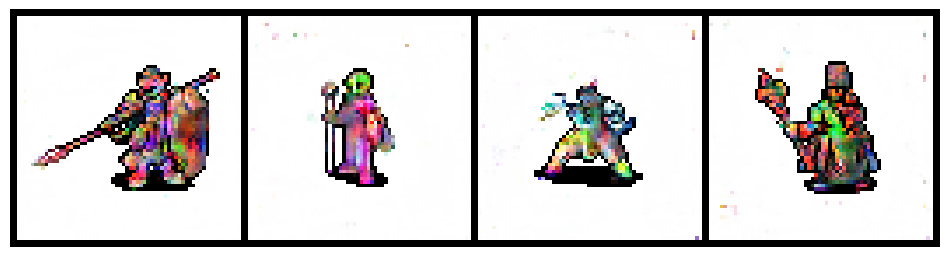

['masculine, warrior, warm',
 'masculine, mage, warm',
 'masculine, rogue, warm',
 'masculine, cleric, warm']

In [42]:
rows = ["warrior", "mage", "rogue", "cleric"]
palette_name = "warm"
gender_name = "masculine"

g_idx = gender_to_idx[gender_name]
p_idx = palette_to_idx[palette_name]

conds_list = []
labels = []

for hero_name in rows:
    h_idx = hero_to_idx[hero_name]
    cond = build_cond_vector(g_idx, h_idx, p_idx)
    conds_list.append(cond)
    labels.append(f"{gender_name}, {hero_name}, {palette_name}")

conds_tensor = torch.stack(conds_list, dim=0).to(device)
z = torch.randn(len(rows), nz, device=device)

with torch.no_grad():
    fake = G(z, conds_tensor).cpu()

fake_denorm = denorm(fake)
grid = vutils.make_grid(fake_denorm, nrow=len(rows), padding=2)

plt.figure(figsize=(12, 4))
plt.axis("off")
plt.imshow(grid.permute(1, 2, 0).numpy())
plt.show()

labels

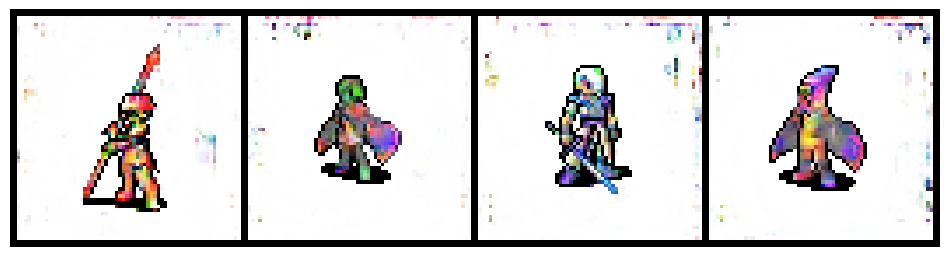

['feminine, warrior, warm',
 'feminine, mage, warm',
 'feminine, rogue, warm',
 'feminine, cleric, warm']

In [43]:
rows = ["warrior", "mage", "rogue", "cleric"]
palette_name = "warm"
gender_name = "feminine"

g_idx = gender_to_idx[gender_name]
p_idx = palette_to_idx[palette_name]

conds_list = []
labels = []

for hero_name in rows:
    h_idx = hero_to_idx[hero_name]
    cond = build_cond_vector(g_idx, h_idx, p_idx)
    conds_list.append(cond)
    labels.append(f"{gender_name}, {hero_name}, {palette_name}")

conds_tensor = torch.stack(conds_list, dim=0).to(device)
z = torch.randn(len(rows), nz, device=device)

with torch.no_grad():
    fake = G(z, conds_tensor).cpu()

fake_denorm = denorm(fake)
grid = vutils.make_grid(fake_denorm, nrow=len(rows), padding=2)

plt.figure(figsize=(12, 4))
plt.axis("off")
plt.imshow(grid.permute(1, 2, 0).numpy())
plt.show()

labels

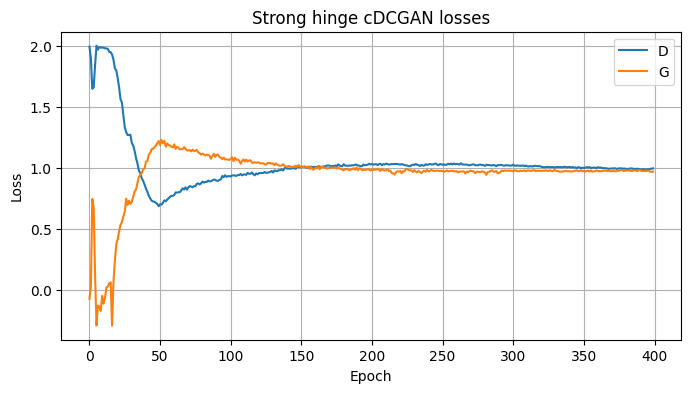

In [39]:
# plot losses & save final G 
plt.figure(figsize=(8, 4))
plt.plot(losses_D, label="D")
plt.plot(losses_G, label="G")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.title("Strong hinge cDCGAN losses")
plt.show()


In [40]:
final_G_path = CKPT_DIR / "strong_hinge_cdcgan_G_final.pth"
torch.save(G.state_dict(), final_G_path)
final_G_path


WindowsPath('D:/ML/LS/Deep_learning/GAN/hero_portrait_generator/artifacts_gan/checkpoints/20251120-224843/strong_hinge_cdcgan_G_final.pth')

In [1]:
from datetime import datetime
from pathlib import Path
import sys, json
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils import spectral_norm

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
from PIL import Image

import torchvision.utils as vutils
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

PROJECT_ROOT = Path(r"D:\ML\LS\Deep_learning\GAN\hero_portrait_generator")
DATA_DIR = PROJECT_ROOT / "data"

# add src to path to import utils.config
SRC_DIR = PROJECT_ROOT / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.append(str(SRC_DIR))

from utils.config import DATASET_CONFIG, CDC_GAN_CONFIG

print("PROJECT_ROOT:", PROJECT_ROOT)
print("DATA_DIR exists:", DATA_DIR.exists())
print("DATASET_CONFIG:", DATASET_CONFIG)
print("CDC_GAN_CONFIG:", CDC_GAN_CONFIG)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)


PROJECT_ROOT: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator
DATA_DIR exists: True
DATASET_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'num_gender_classes': 2, 'num_hero_classes': 9, 'num_palette_classes': 5}
CDC_GAN_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'nz': 128, 'ngf': 64, 'ndf': 64}
device: cuda


In [2]:
# latent + widths
nz  = 128
ngf = 96     # generator width
ndf = 96     # discriminator width
image_size = 64

num_epochs = 400   
beta1, beta2 = 0.5, 0.999

# TTUR
lrG = 2e-4
lrD = 1e-4

# EMA
ema_decay = 0.999

# R1 penalty
r1_gamma = 10.0
r1_every = 16

print(dict(
    nz=nz, ngf=ngf, ndf=ndf,
    num_epochs=num_epochs,
    lrG=lrG, lrD=lrD,
    ema_decay=ema_decay,
    r1_gamma=r1_gamma, r1_every=r1_every
))


{'nz': 128, 'ngf': 96, 'ndf': 96, 'num_epochs': 400, 'lrG': 0.0002, 'lrD': 0.0001, 'ema_decay': 0.999, 'r1_gamma': 10.0, 'r1_every': 16}


In [3]:
with open(DATA_DIR / "label_mappings.json", "r", encoding="utf-8") as f:
    label_mappings = json.load(f)

gender_classes  = label_mappings["gender_classes"]
gender_to_idx   = label_mappings["gender_to_idx"]
hero_classes    = label_mappings["hero_classes"]
hero_to_idx     = label_mappings["hero_to_idx"]
palette_classes = label_mappings["palette_classes"]
palette_to_idx  = label_mappings["palette_to_idx"]

cond_dim = len(gender_classes) + len(hero_classes) + len(palette_classes)

print("gender:", gender_classes)
print("hero:", hero_classes)
print("palette:", palette_classes)
print("cond_dim:", cond_dim)


gender: ['feminine', 'masculine']
hero: ['barbarian', 'bard', 'cavalry', 'cleric', 'knight', 'mage', 'ranger', 'rogue', 'warrior']
palette: ['cool', 'dark', 'muted', 'neutral', 'warm']
cond_dim: 16


In [4]:
def one_hot(index: int, num_classes: int) -> np.ndarray:
    v = np.zeros(num_classes, dtype=np.float32)
    v[index] = 1.0
    return v


class HeroPortraitDataset(Dataset):
    def __init__(self, df: pd.DataFrame, project_root: Path, image_size: int = 64, normalize=True):
        self.df = df.reset_index(drop=True)
        self.project_root = Path(project_root)

        self.n_gender  = len(gender_classes)
        self.n_hero    = len(hero_classes)
        self.n_palette = len(palette_classes)

        tfs = [
            T.Resize((image_size, image_size), interpolation=T.InterpolationMode.NEAREST),
            T.ToTensor(),
        ]
        if normalize:
            tfs.append(T.Normalize([0.5,0.5,0.5],[0.5,0.5,0.5]))
        self.transform = T.Compose(tfs)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        if "rel_path" in row and isinstance(row["rel_path"], str):
            img_path = (self.project_root / row["rel_path"]).resolve()
        else:
            img_path = Path(row["path"]).resolve()

        img = Image.open(img_path).convert("RGBA")
        bg = Image.new("RGBA", img.size, (255,255,255,255))
        img = Image.alpha_composite(bg, img).convert("RGB")

        x = self.transform(img)

        g_idx = int(row["gender_idx"])
        h_idx = int(row["hero_idx"])
        p_idx = int(row["palette_idx"])

        cond = np.concatenate([
            one_hot(g_idx, self.n_gender),
            one_hot(h_idx, self.n_hero),
            one_hot(p_idx, self.n_palette),
        ]).astype(np.float32)

        return {"image": x, "cond": torch.from_numpy(cond)}


In [7]:
train_csv = DATA_DIR / "sprites_train.csv"
val_csv   = DATA_DIR / "sprites_val.csv"

train_df = pd.read_csv(train_csv)
val_df   = pd.read_csv(val_csv)

print("train_df:", train_df.shape)
print("val_df:", val_df.shape)
print("columns:", train_df.columns.tolist())

FULL_DF = pd.concat([train_df, val_df], ignore_index=True)
print("FULL_DF:", FULL_DF.shape)

train_df: (6077, 12)
val_df: (1519, 12)
columns: ['filename', 'path', 'idx', 'silhouette_hash', 'group_id', 'gender', 'hero_class', 'palette', 'rel_path', 'gender_idx', 'hero_idx', 'palette_idx']
FULL_DF: (7596, 12)


In [8]:
BATCH_SIZE = 64

full_dataset = HeroPortraitDataset(FULL_DF, PROJECT_ROOT, image_size=image_size)
train_loader = DataLoader(
    full_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,   # Windows + Jupyter
    pin_memory=False
)

print("dataset:", len(full_dataset), "batches:", len(train_loader))


dataset: 7596 batches: 119


In [9]:
class SelfAttention(nn.Module):
    def __init__(self, c):
        super().__init__()
        self.q = spectral_norm(nn.Conv2d(c, c//8, 1))
        self.k = spectral_norm(nn.Conv2d(c, c//8, 1))
        self.v = spectral_norm(nn.Conv2d(c, c, 1))
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        B,C,H,W = x.shape
        q = self.q(x).view(B, -1, H*W).permute(0,2,1)
        k = self.k(x).view(B, -1, H*W)
        attn = torch.softmax(torch.bmm(q,k), dim=-1)
        v = self.v(x).view(B, C, -1)
        out = torch.bmm(v, attn.permute(0,2,1)).view(B,C,H,W)
        return self.gamma*out + x


class GenResBlock(nn.Module):
    def __init__(self, cin, cout):
        super().__init__()
        self.up = nn.Upsample(scale_factor=2, mode="nearest")
        self.c1 = nn.Conv2d(cin, cout, 3,1,1, bias=False)
        self.b1 = nn.BatchNorm2d(cout)
        self.c2 = nn.Conv2d(cout, cout, 3,1,1, bias=False)
        self.b2 = nn.BatchNorm2d(cout)
        self.skip = nn.Conv2d(cin, cout, 1,1,0, bias=False)

    def forward(self, x):
        skip = self.skip(self.up(x))
        out = self.up(x)
        out = F.relu(self.b1(self.c1(out)), inplace=False)
        out = self.b2(self.c2(out))
        out = F.relu(out + skip, inplace=False)
        return out


class DiscResBlock(nn.Module):
    def __init__(self, cin, cout, downsample=True):
        super().__init__()
        self.downsample = downsample
        self.c1 = spectral_norm(nn.Conv2d(cin, cout, 3,1,1, bias=False))
        self.c2 = spectral_norm(nn.Conv2d(cout, cout, 3,1,1, bias=False))
        self.skip = spectral_norm(nn.Conv2d(cin, cout, 1,1,0, bias=False))
        if downsample:
            self.pool = nn.AvgPool2d(2)

    def forward(self, x):
        skip = x
        if self.downsample:
            skip = self.pool(skip)
        skip = self.skip(skip)

        out = F.leaky_relu(x, 0.2, inplace=False)
        out = self.c1(out)
        out = F.leaky_relu(out, 0.2, inplace=False)
        out = self.c2(out)
        if self.downsample:
            out = self.pool(out)

        return out + skip


In [10]:
class StrongConditionalGenerator(nn.Module):
    def __init__(self, nz, cond_dim, ngf=96, nc=3):
        super().__init__()
        self.nz = nz
        self.cond_dim = cond_dim

        in_dim = nz + cond_dim
        self.fc = nn.Linear(in_dim, ngf*8*4*4)

        self.b1 = GenResBlock(ngf*8, ngf*8)  # 4->8
        self.b2 = GenResBlock(ngf*8, ngf*4)  # 8->16
        self.b3 = GenResBlock(ngf*4, ngf*2)  # 16->32
        self.attn = SelfAttention(ngf*2)
        self.b4 = GenResBlock(ngf*2, ngf)    # 32->64

        self.out = nn.Conv2d(ngf, nc, 3,1,1, bias=False)

    def forward(self, z, cond):
        x = torch.cat([z, cond], dim=1)
        x = self.fc(x).view(x.size(0), -1, 4,4)
        x = self.b1(x); x = self.b2(x); x = self.b3(x)
        x = self.attn(x)
        x = self.b4(x)
        return torch.tanh(self.out(x))


class StrongConditionalDiscriminator(nn.Module):
    def __init__(self, cond_dim, ndf=96, nc=3):
        super().__init__()
        self.cond_dim = cond_dim
        inc = nc + cond_dim

        self.b1 = DiscResBlock(inc, ndf, downsample=True)       # 64->32
        self.b2 = DiscResBlock(ndf, ndf*2, downsample=True)     # 32->16
        self.b3 = DiscResBlock(ndf*2, ndf*4, downsample=True)   # 16->8
        self.b4 = DiscResBlock(ndf*4, ndf*8, downsample=True)   # 8->4

        self.final = spectral_norm(nn.Conv2d(ndf*8, 1, 4,1,0, bias=False))

    def forward(self, img, cond):
        B,C,H,W = img.shape
        cond_map = cond.view(B, self.cond_dim, 1,1).expand(-1,-1,H,W)
        x = torch.cat([img, cond_map], dim=1)

        x = self.b1(x); x = self.b2(x); x = self.b3(x); x = self.b4(x)
        return self.final(x).view(-1)


In [11]:
G = StrongConditionalGenerator(nz, cond_dim, ngf=ngf, nc=3).to(device)
D = StrongConditionalDiscriminator(cond_dim, ndf=ndf, nc=3).to(device)

G_ema = StrongConditionalGenerator(nz, cond_dim, ngf=ngf, nc=3).to(device)
G_ema.load_state_dict(G.state_dict())
G_ema.eval()

print("Params G:", sum(p.numel() for p in G.parameters()))
print("Params D:", sum(p.numel() for p in D.parameters()))

# sanity forward
batch = next(iter(train_loader))
real_images = batch["image"].to(device)
conds = batch["cond"].to(device)
z = torch.randn(real_images.size(0), nz, device=device)
with torch.no_grad():
    fake = G(z, conds)
    rs = D(real_images, conds)
    fs = D(fake, conds)
print(real_images.shape, fake.shape, rs.shape, fs.shape)


Params G: 18655633
Params D: 10951488
torch.Size([64, 3, 64, 64]) torch.Size([64, 3, 64, 64]) torch.Size([64]) torch.Size([64])


In [12]:
def denorm(x):
    return x*0.5 + 0.5

def add_instance_noise(x, epoch, max_epochs, sigma_start=0.10, sigma_end=0.0):
    t = epoch / max_epochs
    sigma = sigma_start*(1-t) + sigma_end*t
    if sigma <= 0:
        return x
    return x + torch.randn_like(x)*sigma

@torch.no_grad()
def update_ema(G, G_ema, decay=ema_decay):
    for p, p_ema in zip(G.parameters(), G_ema.parameters()):
        p_ema.data.mul_(decay).add_(p.data, alpha=1-decay)

def r1_penalty(real_scores, real_images):
    grad = torch.autograd.grad(
        outputs=real_scores.sum(),
        inputs=real_images,
        create_graph=True
    )[0]
    return grad.pow(2).reshape(grad.size(0), -1).sum(1).mean()

def save_sample_images(epoch, G_eval, fixed_noise, fixed_conds, samples_dir):
    G_eval.eval()
    with torch.no_grad():
        fake = G_eval(fixed_noise, fixed_conds).cpu()
    grid = vutils.make_grid(denorm(fake), nrow=4, padding=2)
    out_path = samples_dir / f"epoch_{epoch:03d}.png"
    plt.figure(figsize=(6,6))
    plt.axis("off")
    plt.imshow(grid.permute(1,2,0).numpy())
    plt.tight_layout()
    plt.savefig(out_path, dpi=150)
    plt.close()
    print("[samples] Saved:", out_path)


In [13]:
RUN_ID = datetime.now().strftime("%Y%m%d-%H%M%S")
ARTIFACTS_DIR = PROJECT_ROOT / "artifacts_gan"
SAMPLES_DIR = ARTIFACTS_DIR / "samples" / RUN_ID
CKPT_DIR    = ARTIFACTS_DIR / "checkpoints" / RUN_ID
SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
CKPT_DIR.mkdir(parents=True, exist_ok=True)

num_preview = 16
preview_batch = next(iter(train_loader))
fixed_conds = preview_batch["cond"][:num_preview].to(device)
fixed_noise = torch.randn(num_preview, nz, device=device)

print("RUN_ID:", RUN_ID)
print("SAMPLES_DIR:", SAMPLES_DIR)
print("CKPT_DIR:", CKPT_DIR)
print(fixed_conds.shape, fixed_noise.shape)


RUN_ID: 20251122-150955
SAMPLES_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955
CKPT_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251122-150955
torch.Size([16, 16]) torch.Size([16, 128])


In [14]:
optimizerD = torch.optim.AdamW(D.parameters(), lr=lrD, betas=(beta1,beta2), weight_decay=1e-4)
optimizerG = torch.optim.AdamW(G.parameters(), lr=lrG, betas=(beta1,beta2), weight_decay=1e-4)

schedulerD = torch.optim.lr_scheduler.CosineAnnealingLR(optimizerD, T_max=num_epochs, eta_min=1e-5)
schedulerG = torch.optim.lr_scheduler.CosineAnnealingLR(optimizerG, T_max=num_epochs, eta_min=1e-5)

print("Optimizers ready (TTUR)")


Optimizers ready (TTUR)


In [15]:
losses_D, losses_G = [], []
global_step = 0

for epoch in range(1, num_epochs + 1):
    G.train(); D.train()

    epoch_loss_D = 0.0
    epoch_loss_G = 0.0
    num_batches = 0

    pbar = tqdm(train_loader, desc=f"Epoch [{epoch}/{num_epochs}]", leave=False)

    for batch in pbar:
        real_images = batch["image"].to(device)
        conds = batch["cond"].to(device)
        B = real_images.size(0)

        # ===== D step =====
        D.zero_grad(set_to_none=True)

        real_images.requires_grad_(True)
        real_noisy = add_instance_noise(real_images, epoch, num_epochs)

        real_scores = D(real_noisy, conds)
        loss_D_real = torch.relu(1.0 - real_scores).mean()

        z = torch.randn(B, nz, device=device)
        fake_images = G(z, conds).detach()
        fake_noisy = add_instance_noise(fake_images, epoch, num_epochs)

        fake_scores = D(fake_noisy, conds)
        loss_D_fake = torch.relu(1.0 + fake_scores).mean()

        loss_D = loss_D_real + loss_D_fake

        if global_step % r1_every == 0:
            r1 = r1_penalty(real_scores, real_images)
            loss_D = loss_D + (r1_gamma / 2.0) * r1

        loss_D.backward()
        optimizerD.step()
        real_images.requires_grad_(False)

        # ===== G step =====
        G.zero_grad(set_to_none=True)

        z = torch.randn(B, nz, device=device)
        fake_images = G(z, conds)
        fake_scores_for_G = D(fake_images, conds)
        loss_G = -fake_scores_for_G.mean()

        loss_G.backward()
        optimizerG.step()

        update_ema(G, G_ema)

        # stats
        epoch_loss_D += loss_D.item()
        epoch_loss_G += loss_G.item()
        num_batches += 1
        global_step += 1

        pbar.set_postfix(loss_D=f"{loss_D.item():.3f}", loss_G=f"{loss_G.item():.3f}")

    epoch_loss_D /= num_batches
    epoch_loss_G /= num_batches
    losses_D.append(epoch_loss_D)
    losses_G.append(epoch_loss_G)

    schedulerD.step()
    schedulerG.step()

    print(f"[Epoch {epoch:03d}/{num_epochs}] mean loss_D: {epoch_loss_D:.4f} | mean loss_G: {epoch_loss_G:.4f}")

    if epoch % 10 == 0 or epoch == 1:
        save_sample_images(epoch, G_ema, fixed_noise, fixed_conds, SAMPLES_DIR)

    if epoch % 50 == 0 or epoch == num_epochs:
        ckpt_path = CKPT_DIR / f"hero_v3_r1_epoch_{epoch:03d}.pth"
        torch.save(
            {
                "epoch": epoch,
                "G_state_dict": G.state_dict(),
                "G_ema_state_dict": G_ema.state_dict(),
                "D_state_dict": D.state_dict(),
                "optimizerG_state_dict": optimizerG.state_dict(),
                "optimizerD_state_dict": optimizerD.state_dict(),
                "losses_G": losses_G,
                "losses_D": losses_D,
                "config": dict(
                    nz=nz, cond_dim=cond_dim, ngf=ngf, ndf=ndf,
                    image_size=image_size, lrG=lrG, lrD=lrD,
                    r1_gamma=r1_gamma, r1_every=r1_every,
                    ema_decay=ema_decay, run_id=RUN_ID
                )
            },
            ckpt_path
        )
        print("[ckpt] Saved:", ckpt_path)


Epoch [1/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 001/400] mean loss_D: 1.9802 | mean loss_G: -0.0878
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_001.png


Epoch [2/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 002/400] mean loss_D: 1.7111 | mean loss_G: 0.6821


Epoch [3/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 003/400] mean loss_D: 0.9241 | mean loss_G: 1.7105


Epoch [4/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 004/400] mean loss_D: 1.7093 | mean loss_G: 0.6956


Epoch [5/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 005/400] mean loss_D: 1.8502 | mean loss_G: 0.3573


Epoch [6/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 006/400] mean loss_D: 2.0061 | mean loss_G: 0.3036


Epoch [7/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 007/400] mean loss_D: 1.9913 | mean loss_G: 0.4637


Epoch [8/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 008/400] mean loss_D: 1.9806 | mean loss_G: 0.3681


Epoch [9/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 009/400] mean loss_D: 1.9820 | mean loss_G: 0.1876


Epoch [10/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 010/400] mean loss_D: 1.9699 | mean loss_G: 0.1475
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_010.png


Epoch [11/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 011/400] mean loss_D: 1.9527 | mean loss_G: 0.1048


Epoch [12/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 012/400] mean loss_D: 1.9748 | mean loss_G: 0.0337


Epoch [13/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 013/400] mean loss_D: 1.9279 | mean loss_G: 0.1050


Epoch [14/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 014/400] mean loss_D: 1.9613 | mean loss_G: 0.1533


Epoch [15/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 015/400] mean loss_D: 1.9083 | mean loss_G: 0.1204


Epoch [16/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 016/400] mean loss_D: 1.9247 | mean loss_G: 0.2830


Epoch [17/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 017/400] mean loss_D: 1.9027 | mean loss_G: 0.1855


Epoch [18/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 018/400] mean loss_D: 1.9071 | mean loss_G: 0.2415


Epoch [19/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 019/400] mean loss_D: 1.8627 | mean loss_G: 0.3346


Epoch [20/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 020/400] mean loss_D: 1.8682 | mean loss_G: 0.1580
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_020.png


Epoch [21/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 021/400] mean loss_D: 1.8602 | mean loss_G: 0.3614


Epoch [22/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 022/400] mean loss_D: 1.8704 | mean loss_G: 0.2102


Epoch [23/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 023/400] mean loss_D: 1.8652 | mean loss_G: 0.2157


Epoch [24/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 024/400] mean loss_D: 1.8161 | mean loss_G: 0.2300


Epoch [25/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 025/400] mean loss_D: 1.7647 | mean loss_G: 0.3619


Epoch [26/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 026/400] mean loss_D: 1.7816 | mean loss_G: 0.2759


Epoch [27/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 027/400] mean loss_D: 1.7805 | mean loss_G: 0.2176


Epoch [28/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 028/400] mean loss_D: 1.7505 | mean loss_G: 0.3730


Epoch [29/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 029/400] mean loss_D: 1.6555 | mean loss_G: 0.4170


Epoch [30/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 030/400] mean loss_D: 1.6282 | mean loss_G: 0.4160
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_030.png


Epoch [31/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 031/400] mean loss_D: 1.6098 | mean loss_G: 0.4904


Epoch [32/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 032/400] mean loss_D: 1.5481 | mean loss_G: 0.4725


Epoch [33/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 033/400] mean loss_D: 1.5045 | mean loss_G: 0.5354


Epoch [34/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 034/400] mean loss_D: 1.4237 | mean loss_G: 0.5828


Epoch [35/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 035/400] mean loss_D: 1.3688 | mean loss_G: 0.5922


Epoch [36/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 036/400] mean loss_D: 1.2925 | mean loss_G: 0.6273


Epoch [37/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 037/400] mean loss_D: 1.2576 | mean loss_G: 0.6556


Epoch [38/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 038/400] mean loss_D: 1.1899 | mean loss_G: 0.7148


Epoch [39/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 039/400] mean loss_D: 1.1414 | mean loss_G: 0.7636


Epoch [40/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 040/400] mean loss_D: 1.1070 | mean loss_G: 0.7672
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_040.png


Epoch [41/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 041/400] mean loss_D: 1.0639 | mean loss_G: 0.8001


Epoch [42/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 042/400] mean loss_D: 1.0093 | mean loss_G: 0.8303


Epoch [43/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 043/400] mean loss_D: 0.9804 | mean loss_G: 0.8862


Epoch [44/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 044/400] mean loss_D: 0.9614 | mean loss_G: 0.8750


Epoch [45/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 045/400] mean loss_D: 0.9311 | mean loss_G: 0.9172


Epoch [46/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 046/400] mean loss_D: 0.9483 | mean loss_G: 0.8988


Epoch [47/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 047/400] mean loss_D: 0.9096 | mean loss_G: 0.9429


Epoch [48/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 048/400] mean loss_D: 0.9068 | mean loss_G: 0.9552


Epoch [49/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 049/400] mean loss_D: 0.9112 | mean loss_G: 0.9517


Epoch [50/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 050/400] mean loss_D: 0.8969 | mean loss_G: 0.9620
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_050.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251122-150955\hero_v3_r1_epoch_050.pth


Epoch [51/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 051/400] mean loss_D: 0.9027 | mean loss_G: 0.9859


Epoch [52/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 052/400] mean loss_D: 0.9274 | mean loss_G: 0.9337


Epoch [53/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 053/400] mean loss_D: 0.9235 | mean loss_G: 0.9559


Epoch [54/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 054/400] mean loss_D: 0.9225 | mean loss_G: 0.9456


Epoch [55/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 055/400] mean loss_D: 0.9209 | mean loss_G: 0.9668


Epoch [56/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 056/400] mean loss_D: 0.9518 | mean loss_G: 0.9616


Epoch [57/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 057/400] mean loss_D: 0.9533 | mean loss_G: 0.9343


Epoch [58/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 058/400] mean loss_D: 0.9568 | mean loss_G: 0.9490


Epoch [59/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 059/400] mean loss_D: 0.9574 | mean loss_G: 0.9633


Epoch [60/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 060/400] mean loss_D: 0.9700 | mean loss_G: 0.9408
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_060.png


Epoch [61/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 061/400] mean loss_D: 0.9884 | mean loss_G: 0.9404


Epoch [62/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 062/400] mean loss_D: 0.9903 | mean loss_G: 0.9213


Epoch [63/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 063/400] mean loss_D: 1.0015 | mean loss_G: 0.9104


Epoch [64/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 064/400] mean loss_D: 1.0121 | mean loss_G: 0.9449


Epoch [65/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 065/400] mean loss_D: 1.0254 | mean loss_G: 0.8760


Epoch [66/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 066/400] mean loss_D: 1.0149 | mean loss_G: 0.9217


Epoch [67/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 067/400] mean loss_D: 1.0267 | mean loss_G: 0.9112


Epoch [68/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 068/400] mean loss_D: 1.0369 | mean loss_G: 0.8940


Epoch [69/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 069/400] mean loss_D: 1.0390 | mean loss_G: 0.9114


Epoch [70/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 070/400] mean loss_D: 1.0483 | mean loss_G: 0.8831
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_070.png


Epoch [71/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 071/400] mean loss_D: 1.0597 | mean loss_G: 0.9054


Epoch [72/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 072/400] mean loss_D: 1.0591 | mean loss_G: 0.8717


Epoch [73/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 073/400] mean loss_D: 1.0837 | mean loss_G: 0.9019


Epoch [74/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 074/400] mean loss_D: 1.0816 | mean loss_G: 0.8673


Epoch [75/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 075/400] mean loss_D: 1.0692 | mean loss_G: 0.8789


Epoch [76/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 076/400] mean loss_D: 1.0737 | mean loss_G: 0.8800


Epoch [77/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 077/400] mean loss_D: 1.0739 | mean loss_G: 0.8853


Epoch [78/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 078/400] mean loss_D: 1.0859 | mean loss_G: 0.8886


Epoch [79/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 079/400] mean loss_D: 1.0826 | mean loss_G: 0.8789


Epoch [80/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 080/400] mean loss_D: 1.1100 | mean loss_G: 0.8632
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_080.png


Epoch [81/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 081/400] mean loss_D: 1.1044 | mean loss_G: 0.8776


Epoch [82/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 082/400] mean loss_D: 1.1088 | mean loss_G: 0.8693


Epoch [83/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 083/400] mean loss_D: 1.1044 | mean loss_G: 0.8514


Epoch [84/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 084/400] mean loss_D: 1.1041 | mean loss_G: 0.8880


Epoch [85/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 085/400] mean loss_D: 1.1273 | mean loss_G: 0.8711


Epoch [86/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 086/400] mean loss_D: 1.1077 | mean loss_G: 0.8558


Epoch [87/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 087/400] mean loss_D: 1.1190 | mean loss_G: 0.8658


Epoch [88/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 088/400] mean loss_D: 1.1219 | mean loss_G: 0.8681


Epoch [89/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 089/400] mean loss_D: 1.1142 | mean loss_G: 0.8531


Epoch [90/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 090/400] mean loss_D: 1.1202 | mean loss_G: 0.8745
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_090.png


Epoch [91/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 091/400] mean loss_D: 1.1126 | mean loss_G: 0.8731


Epoch [92/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 092/400] mean loss_D: 1.1226 | mean loss_G: 0.8789


Epoch [93/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 093/400] mean loss_D: 1.1225 | mean loss_G: 0.8691


Epoch [94/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 094/400] mean loss_D: 1.1228 | mean loss_G: 0.8630


Epoch [95/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 095/400] mean loss_D: 1.1179 | mean loss_G: 0.8521


Epoch [96/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 096/400] mean loss_D: 1.1400 | mean loss_G: 0.8492


Epoch [97/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 097/400] mean loss_D: 1.1417 | mean loss_G: 0.8543


Epoch [98/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 098/400] mean loss_D: 1.1406 | mean loss_G: 0.8556


Epoch [99/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 099/400] mean loss_D: 1.1403 | mean loss_G: 0.8594


Epoch [100/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 100/400] mean loss_D: 1.1431 | mean loss_G: 0.8490
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_100.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251122-150955\hero_v3_r1_epoch_100.pth


Epoch [101/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 101/400] mean loss_D: 1.1328 | mean loss_G: 0.8612


Epoch [102/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 102/400] mean loss_D: 1.1361 | mean loss_G: 0.8315


Epoch [103/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 103/400] mean loss_D: 1.1466 | mean loss_G: 0.8391


Epoch [104/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 104/400] mean loss_D: 1.1515 | mean loss_G: 0.8465


Epoch [105/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 105/400] mean loss_D: 1.1549 | mean loss_G: 0.8452


Epoch [106/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 106/400] mean loss_D: 1.1504 | mean loss_G: 0.8278


Epoch [107/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 107/400] mean loss_D: 1.1396 | mean loss_G: 0.8519


Epoch [108/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 108/400] mean loss_D: 1.1432 | mean loss_G: 0.8663


Epoch [109/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 109/400] mean loss_D: 1.1600 | mean loss_G: 0.8560


Epoch [110/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 110/400] mean loss_D: 1.1495 | mean loss_G: 0.8329
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_110.png


Epoch [111/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 111/400] mean loss_D: 1.1520 | mean loss_G: 0.8519


Epoch [112/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 112/400] mean loss_D: 1.1593 | mean loss_G: 0.8495


Epoch [113/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 113/400] mean loss_D: 1.1539 | mean loss_G: 0.8203


Epoch [114/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 114/400] mean loss_D: 1.1571 | mean loss_G: 0.8250


Epoch [115/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 115/400] mean loss_D: 1.1735 | mean loss_G: 0.8426


Epoch [116/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 116/400] mean loss_D: 1.1628 | mean loss_G: 0.8433


Epoch [117/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 117/400] mean loss_D: 1.1602 | mean loss_G: 0.8421


Epoch [118/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 118/400] mean loss_D: 1.1721 | mean loss_G: 0.8300


Epoch [119/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 119/400] mean loss_D: 1.1616 | mean loss_G: 0.8516


Epoch [120/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 120/400] mean loss_D: 1.1641 | mean loss_G: 0.8240
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_120.png


Epoch [121/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 121/400] mean loss_D: 1.1597 | mean loss_G: 0.8370


Epoch [122/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 122/400] mean loss_D: 1.1741 | mean loss_G: 0.8500


Epoch [123/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 123/400] mean loss_D: 1.1733 | mean loss_G: 0.8577


Epoch [124/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 124/400] mean loss_D: 1.1807 | mean loss_G: 0.8310


Epoch [125/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 125/400] mean loss_D: 1.1821 | mean loss_G: 0.8238


Epoch [126/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 126/400] mean loss_D: 1.1898 | mean loss_G: 0.8171


Epoch [127/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 127/400] mean loss_D: 1.1972 | mean loss_G: 0.8193


Epoch [128/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 128/400] mean loss_D: 1.2008 | mean loss_G: 0.8195


Epoch [129/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 129/400] mean loss_D: 1.1961 | mean loss_G: 0.7962


Epoch [130/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 130/400] mean loss_D: 1.1916 | mean loss_G: 0.8263
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_130.png


Epoch [131/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 131/400] mean loss_D: 1.1934 | mean loss_G: 0.7833


Epoch [132/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 132/400] mean loss_D: 1.2113 | mean loss_G: 0.8033


Epoch [133/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 133/400] mean loss_D: 1.2008 | mean loss_G: 0.8299


Epoch [134/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 134/400] mean loss_D: 1.1987 | mean loss_G: 0.8059


Epoch [135/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 135/400] mean loss_D: 1.1984 | mean loss_G: 0.8063


Epoch [136/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 136/400] mean loss_D: 1.2027 | mean loss_G: 0.8317


Epoch [137/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 137/400] mean loss_D: 1.2120 | mean loss_G: 0.8128


Epoch [138/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 138/400] mean loss_D: 1.2040 | mean loss_G: 0.8113


Epoch [139/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 139/400] mean loss_D: 1.1879 | mean loss_G: 0.8229


Epoch [140/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 140/400] mean loss_D: 1.1880 | mean loss_G: 0.7980
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_140.png


Epoch [141/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 141/400] mean loss_D: 1.1809 | mean loss_G: 0.7974


Epoch [142/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 142/400] mean loss_D: 1.1971 | mean loss_G: 0.8096


Epoch [143/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 143/400] mean loss_D: 1.1972 | mean loss_G: 0.8071


Epoch [144/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 144/400] mean loss_D: 1.2086 | mean loss_G: 0.8147


Epoch [145/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 145/400] mean loss_D: 1.2056 | mean loss_G: 0.8171


Epoch [146/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 146/400] mean loss_D: 1.1947 | mean loss_G: 0.8099


Epoch [147/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 147/400] mean loss_D: 1.2042 | mean loss_G: 0.8298


Epoch [148/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 148/400] mean loss_D: 1.2174 | mean loss_G: 0.8277


Epoch [149/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 149/400] mean loss_D: 1.2073 | mean loss_G: 0.8152


Epoch [150/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 150/400] mean loss_D: 1.2062 | mean loss_G: 0.8175
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_150.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251122-150955\hero_v3_r1_epoch_150.pth


Epoch [151/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 151/400] mean loss_D: 1.1994 | mean loss_G: 0.8208


Epoch [152/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 152/400] mean loss_D: 1.2146 | mean loss_G: 0.7995


Epoch [153/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 153/400] mean loss_D: 1.2153 | mean loss_G: 0.7979


Epoch [154/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 154/400] mean loss_D: 1.2154 | mean loss_G: 0.8050


Epoch [155/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 155/400] mean loss_D: 1.2165 | mean loss_G: 0.8199


Epoch [156/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 156/400] mean loss_D: 1.2237 | mean loss_G: 0.7938


Epoch [157/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 157/400] mean loss_D: 1.2224 | mean loss_G: 0.8012


Epoch [158/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 158/400] mean loss_D: 1.2179 | mean loss_G: 0.8053


Epoch [159/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 159/400] mean loss_D: 1.2170 | mean loss_G: 0.8074


Epoch [160/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 160/400] mean loss_D: 1.2127 | mean loss_G: 0.8232
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_160.png


Epoch [161/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 161/400] mean loss_D: 1.2155 | mean loss_G: 0.8128


Epoch [162/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 162/400] mean loss_D: 1.2128 | mean loss_G: 0.7940


Epoch [163/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 163/400] mean loss_D: 1.2212 | mean loss_G: 0.8087


Epoch [164/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 164/400] mean loss_D: 1.2202 | mean loss_G: 0.8011


Epoch [165/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 165/400] mean loss_D: 1.2228 | mean loss_G: 0.8039


Epoch [166/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 166/400] mean loss_D: 1.2133 | mean loss_G: 0.8076


Epoch [167/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 167/400] mean loss_D: 1.2086 | mean loss_G: 0.8050


Epoch [168/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 168/400] mean loss_D: 1.2175 | mean loss_G: 0.7949


Epoch [169/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 169/400] mean loss_D: 1.2127 | mean loss_G: 0.8068


Epoch [170/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 170/400] mean loss_D: 1.2180 | mean loss_G: 0.8169
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_170.png


Epoch [171/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 171/400] mean loss_D: 1.2184 | mean loss_G: 0.8203


Epoch [172/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 172/400] mean loss_D: 1.2244 | mean loss_G: 0.8013


Epoch [173/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 173/400] mean loss_D: 1.2222 | mean loss_G: 0.8250


Epoch [174/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 174/400] mean loss_D: 1.2237 | mean loss_G: 0.8130


Epoch [175/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 175/400] mean loss_D: 1.2187 | mean loss_G: 0.8056


Epoch [176/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 176/400] mean loss_D: 1.2187 | mean loss_G: 0.8396


Epoch [177/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 177/400] mean loss_D: 1.2243 | mean loss_G: 0.8167


Epoch [178/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 178/400] mean loss_D: 1.2301 | mean loss_G: 0.8157


Epoch [179/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 179/400] mean loss_D: 1.2205 | mean loss_G: 0.7996


Epoch [180/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 180/400] mean loss_D: 1.2256 | mean loss_G: 0.8066
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_180.png


Epoch [181/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 181/400] mean loss_D: 1.2261 | mean loss_G: 0.8015


Epoch [182/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 182/400] mean loss_D: 1.2298 | mean loss_G: 0.8214


Epoch [183/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 183/400] mean loss_D: 1.2178 | mean loss_G: 0.8320


Epoch [184/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 184/400] mean loss_D: 1.2139 | mean loss_G: 0.8083


Epoch [185/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 185/400] mean loss_D: 1.2179 | mean loss_G: 0.8254


Epoch [186/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 186/400] mean loss_D: 1.2232 | mean loss_G: 0.8156


Epoch [187/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 187/400] mean loss_D: 1.2366 | mean loss_G: 0.8127


Epoch [188/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 188/400] mean loss_D: 1.2334 | mean loss_G: 0.8191


Epoch [189/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 189/400] mean loss_D: 1.2279 | mean loss_G: 0.8131


Epoch [190/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 190/400] mean loss_D: 1.2154 | mean loss_G: 0.8120
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_190.png


Epoch [191/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 191/400] mean loss_D: 1.2143 | mean loss_G: 0.8025


Epoch [192/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 192/400] mean loss_D: 1.2259 | mean loss_G: 0.7870


Epoch [193/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 193/400] mean loss_D: 1.2314 | mean loss_G: 0.7956


Epoch [194/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 194/400] mean loss_D: 1.2367 | mean loss_G: 0.8146


Epoch [195/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 195/400] mean loss_D: 1.2316 | mean loss_G: 0.8069


Epoch [196/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 196/400] mean loss_D: 1.2269 | mean loss_G: 0.7971


Epoch [197/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 197/400] mean loss_D: 1.2279 | mean loss_G: 0.7674


Epoch [198/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 198/400] mean loss_D: 1.2380 | mean loss_G: 0.7908


Epoch [199/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 199/400] mean loss_D: 1.2378 | mean loss_G: 0.7866


Epoch [200/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 200/400] mean loss_D: 1.2438 | mean loss_G: 0.7901
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_200.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251122-150955\hero_v3_r1_epoch_200.pth


Epoch [201/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 201/400] mean loss_D: 1.2351 | mean loss_G: 0.8156


Epoch [202/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 202/400] mean loss_D: 1.2208 | mean loss_G: 0.7990


Epoch [203/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 203/400] mean loss_D: 1.2369 | mean loss_G: 0.7858


Epoch [204/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 204/400] mean loss_D: 1.2397 | mean loss_G: 0.7994


Epoch [205/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 205/400] mean loss_D: 1.2370 | mean loss_G: 0.8066


Epoch [206/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 206/400] mean loss_D: 1.2351 | mean loss_G: 0.8031


Epoch [207/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 207/400] mean loss_D: 1.2333 | mean loss_G: 0.7836


Epoch [208/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 208/400] mean loss_D: 1.2307 | mean loss_G: 0.7940


Epoch [209/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 209/400] mean loss_D: 1.2308 | mean loss_G: 0.7826


Epoch [210/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 210/400] mean loss_D: 1.2337 | mean loss_G: 0.8027
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_210.png


Epoch [211/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 211/400] mean loss_D: 1.2357 | mean loss_G: 0.7999


Epoch [212/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 212/400] mean loss_D: 1.2456 | mean loss_G: 0.7976


Epoch [213/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 213/400] mean loss_D: 1.2458 | mean loss_G: 0.7988


Epoch [214/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 214/400] mean loss_D: 1.2238 | mean loss_G: 0.8154


Epoch [215/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 215/400] mean loss_D: 1.2366 | mean loss_G: 0.7993


Epoch [216/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 216/400] mean loss_D: 1.2317 | mean loss_G: 0.8108


Epoch [217/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 217/400] mean loss_D: 1.2377 | mean loss_G: 0.7997


Epoch [218/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 218/400] mean loss_D: 1.2405 | mean loss_G: 0.7823


Epoch [219/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 219/400] mean loss_D: 1.2394 | mean loss_G: 0.8176


Epoch [220/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 220/400] mean loss_D: 1.2385 | mean loss_G: 0.8173
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_220.png


Epoch [221/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 221/400] mean loss_D: 1.2442 | mean loss_G: 0.8173


Epoch [222/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 222/400] mean loss_D: 1.2394 | mean loss_G: 0.8043


Epoch [223/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 223/400] mean loss_D: 1.2445 | mean loss_G: 0.8250


Epoch [224/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 224/400] mean loss_D: 1.2399 | mean loss_G: 0.8216


Epoch [225/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 225/400] mean loss_D: 1.2324 | mean loss_G: 0.8024


Epoch [226/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 226/400] mean loss_D: 1.2396 | mean loss_G: 0.8093


Epoch [227/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 227/400] mean loss_D: 1.2351 | mean loss_G: 0.8163


Epoch [228/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 228/400] mean loss_D: 1.2420 | mean loss_G: 0.8131


Epoch [229/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 229/400] mean loss_D: 1.2478 | mean loss_G: 0.8364


Epoch [230/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 230/400] mean loss_D: 1.2408 | mean loss_G: 0.8368
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_230.png


Epoch [231/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 231/400] mean loss_D: 1.2440 | mean loss_G: 0.8074


Epoch [232/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 232/400] mean loss_D: 1.2395 | mean loss_G: 0.8196


Epoch [233/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 233/400] mean loss_D: 1.2424 | mean loss_G: 0.8008


Epoch [234/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 234/400] mean loss_D: 1.2441 | mean loss_G: 0.7969


Epoch [235/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 235/400] mean loss_D: 1.2416 | mean loss_G: 0.7991


Epoch [236/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 236/400] mean loss_D: 1.2416 | mean loss_G: 0.8094


Epoch [237/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 237/400] mean loss_D: 1.2467 | mean loss_G: 0.8083


Epoch [238/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 238/400] mean loss_D: 1.2505 | mean loss_G: 0.8023


Epoch [239/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 239/400] mean loss_D: 1.2516 | mean loss_G: 0.8035


Epoch [240/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 240/400] mean loss_D: 1.2548 | mean loss_G: 0.8407
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_240.png


Epoch [241/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 241/400] mean loss_D: 1.2410 | mean loss_G: 0.8241


Epoch [242/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 242/400] mean loss_D: 1.2350 | mean loss_G: 0.8309


Epoch [243/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 243/400] mean loss_D: 1.2369 | mean loss_G: 0.8210


Epoch [244/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 244/400] mean loss_D: 1.2271 | mean loss_G: 0.8102


Epoch [245/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 245/400] mean loss_D: 1.2228 | mean loss_G: 0.8250


Epoch [246/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 246/400] mean loss_D: 1.2401 | mean loss_G: 0.8195


Epoch [247/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 247/400] mean loss_D: 1.2290 | mean loss_G: 0.8236


Epoch [248/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 248/400] mean loss_D: 1.2403 | mean loss_G: 0.8089


Epoch [249/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 249/400] mean loss_D: 1.2364 | mean loss_G: 0.8193


Epoch [250/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 250/400] mean loss_D: 1.2406 | mean loss_G: 0.8404
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_250.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251122-150955\hero_v3_r1_epoch_250.pth


Epoch [251/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 251/400] mean loss_D: 1.2386 | mean loss_G: 0.8321


Epoch [252/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 252/400] mean loss_D: 1.2500 | mean loss_G: 0.8341


Epoch [253/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 253/400] mean loss_D: 1.2483 | mean loss_G: 0.8417


Epoch [254/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 254/400] mean loss_D: 1.2415 | mean loss_G: 0.8329


Epoch [255/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 255/400] mean loss_D: 1.2390 | mean loss_G: 0.8436


Epoch [256/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 256/400] mean loss_D: 1.2390 | mean loss_G: 0.8430


Epoch [257/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 257/400] mean loss_D: 1.2453 | mean loss_G: 0.8553


Epoch [258/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 258/400] mean loss_D: 1.2466 | mean loss_G: 0.8635


Epoch [259/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 259/400] mean loss_D: 1.2457 | mean loss_G: 0.8358


Epoch [260/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 260/400] mean loss_D: 1.2413 | mean loss_G: 0.8378
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_260.png


Epoch [261/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 261/400] mean loss_D: 1.2401 | mean loss_G: 0.8368


Epoch [262/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 262/400] mean loss_D: 1.2387 | mean loss_G: 0.8418


Epoch [263/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 263/400] mean loss_D: 1.2451 | mean loss_G: 0.8555


Epoch [264/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 264/400] mean loss_D: 1.2421 | mean loss_G: 0.8432


Epoch [265/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 265/400] mean loss_D: 1.2449 | mean loss_G: 0.8330


Epoch [266/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 266/400] mean loss_D: 1.2375 | mean loss_G: 0.8394


Epoch [267/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 267/400] mean loss_D: 1.2415 | mean loss_G: 0.8453


Epoch [268/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 268/400] mean loss_D: 1.2480 | mean loss_G: 0.8332


Epoch [269/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 269/400] mean loss_D: 1.2456 | mean loss_G: 0.8416


Epoch [270/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 270/400] mean loss_D: 1.2412 | mean loss_G: 0.8574
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_270.png


Epoch [271/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 271/400] mean loss_D: 1.2338 | mean loss_G: 0.8600


Epoch [272/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 272/400] mean loss_D: 1.2402 | mean loss_G: 0.8522


Epoch [273/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 273/400] mean loss_D: 1.2413 | mean loss_G: 0.8542


Epoch [274/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 274/400] mean loss_D: 1.2400 | mean loss_G: 0.8546


Epoch [275/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 275/400] mean loss_D: 1.2389 | mean loss_G: 0.8463


Epoch [276/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 276/400] mean loss_D: 1.2398 | mean loss_G: 0.8521


Epoch [277/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 277/400] mean loss_D: 1.2391 | mean loss_G: 0.8594


Epoch [278/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 278/400] mean loss_D: 1.2391 | mean loss_G: 0.8646


Epoch [279/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 279/400] mean loss_D: 1.2452 | mean loss_G: 0.8559


Epoch [280/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 280/400] mean loss_D: 1.2375 | mean loss_G: 0.8451
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_280.png


Epoch [281/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 281/400] mean loss_D: 1.2422 | mean loss_G: 0.8484


Epoch [282/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 282/400] mean loss_D: 1.2404 | mean loss_G: 0.8543


Epoch [283/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 283/400] mean loss_D: 1.2379 | mean loss_G: 0.8464


Epoch [284/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 284/400] mean loss_D: 1.2429 | mean loss_G: 0.8428


Epoch [285/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 285/400] mean loss_D: 1.2393 | mean loss_G: 0.8549


Epoch [286/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 286/400] mean loss_D: 1.2408 | mean loss_G: 0.8384


Epoch [287/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 287/400] mean loss_D: 1.2416 | mean loss_G: 0.8492


Epoch [288/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 288/400] mean loss_D: 1.2398 | mean loss_G: 0.8515


Epoch [289/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 289/400] mean loss_D: 1.2454 | mean loss_G: 0.8611


Epoch [290/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 290/400] mean loss_D: 1.2404 | mean loss_G: 0.8558
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_290.png


Epoch [291/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 291/400] mean loss_D: 1.2459 | mean loss_G: 0.8588


Epoch [292/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 292/400] mean loss_D: 1.2423 | mean loss_G: 0.8596


Epoch [293/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 293/400] mean loss_D: 1.2386 | mean loss_G: 0.8765


Epoch [294/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 294/400] mean loss_D: 1.2362 | mean loss_G: 0.8682


Epoch [295/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 295/400] mean loss_D: 1.2352 | mean loss_G: 0.8592


Epoch [296/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 296/400] mean loss_D: 1.2246 | mean loss_G: 0.8599


Epoch [297/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 297/400] mean loss_D: 1.2311 | mean loss_G: 0.8553


Epoch [298/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 298/400] mean loss_D: 1.2396 | mean loss_G: 0.8483


Epoch [299/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 299/400] mean loss_D: 1.2342 | mean loss_G: 0.8570


Epoch [300/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 300/400] mean loss_D: 1.2441 | mean loss_G: 0.8547
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_300.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251122-150955\hero_v3_r1_epoch_300.pth


Epoch [301/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 301/400] mean loss_D: 1.2365 | mean loss_G: 0.8695


Epoch [302/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 302/400] mean loss_D: 1.2316 | mean loss_G: 0.8653


Epoch [303/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 303/400] mean loss_D: 1.2319 | mean loss_G: 0.8586


Epoch [304/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 304/400] mean loss_D: 1.2307 | mean loss_G: 0.8618


Epoch [305/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 305/400] mean loss_D: 1.2379 | mean loss_G: 0.8819


Epoch [306/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 306/400] mean loss_D: 1.2332 | mean loss_G: 0.8834


Epoch [307/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 307/400] mean loss_D: 1.2311 | mean loss_G: 0.8644


Epoch [308/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 308/400] mean loss_D: 1.2332 | mean loss_G: 0.8673


Epoch [309/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 309/400] mean loss_D: 1.2376 | mean loss_G: 0.8863


Epoch [310/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 310/400] mean loss_D: 1.2338 | mean loss_G: 0.8717
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_310.png


Epoch [311/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 311/400] mean loss_D: 1.2396 | mean loss_G: 0.8809


Epoch [312/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 312/400] mean loss_D: 1.2404 | mean loss_G: 0.8816


Epoch [313/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 313/400] mean loss_D: 1.2337 | mean loss_G: 0.8704


Epoch [314/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 314/400] mean loss_D: 1.2334 | mean loss_G: 0.8733


Epoch [315/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 315/400] mean loss_D: 1.2376 | mean loss_G: 0.8812


Epoch [316/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 316/400] mean loss_D: 1.2359 | mean loss_G: 0.8731


Epoch [317/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 317/400] mean loss_D: 1.2420 | mean loss_G: 0.8802


Epoch [318/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 318/400] mean loss_D: 1.2430 | mean loss_G: 0.8682


Epoch [319/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 319/400] mean loss_D: 1.2394 | mean loss_G: 0.8743


Epoch [320/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 320/400] mean loss_D: 1.2378 | mean loss_G: 0.8921
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_320.png


Epoch [321/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 321/400] mean loss_D: 1.2400 | mean loss_G: 0.8749


Epoch [322/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 322/400] mean loss_D: 1.2307 | mean loss_G: 0.8826


Epoch [323/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 323/400] mean loss_D: 1.2406 | mean loss_G: 0.8722


Epoch [324/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 324/400] mean loss_D: 1.2386 | mean loss_G: 0.8845


Epoch [325/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 325/400] mean loss_D: 1.2407 | mean loss_G: 0.8930


Epoch [326/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 326/400] mean loss_D: 1.2365 | mean loss_G: 0.8811


Epoch [327/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 327/400] mean loss_D: 1.2385 | mean loss_G: 0.8881


Epoch [328/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 328/400] mean loss_D: 1.2393 | mean loss_G: 0.8742


Epoch [329/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 329/400] mean loss_D: 1.2386 | mean loss_G: 0.8805


Epoch [330/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 330/400] mean loss_D: 1.2435 | mean loss_G: 0.8791
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_330.png


Epoch [331/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 331/400] mean loss_D: 1.2340 | mean loss_G: 0.8828


Epoch [332/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 332/400] mean loss_D: 1.2447 | mean loss_G: 0.9013


Epoch [333/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 333/400] mean loss_D: 1.2390 | mean loss_G: 0.8926


Epoch [334/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 334/400] mean loss_D: 1.2401 | mean loss_G: 0.8909


Epoch [335/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 335/400] mean loss_D: 1.2324 | mean loss_G: 0.8932


Epoch [336/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 336/400] mean loss_D: 1.2364 | mean loss_G: 0.8747


Epoch [337/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 337/400] mean loss_D: 1.2404 | mean loss_G: 0.8938


Epoch [338/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 338/400] mean loss_D: 1.2355 | mean loss_G: 0.8871


Epoch [339/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 339/400] mean loss_D: 1.2436 | mean loss_G: 0.8897


Epoch [340/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 340/400] mean loss_D: 1.2380 | mean loss_G: 0.8964
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_340.png


Epoch [341/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 341/400] mean loss_D: 1.2392 | mean loss_G: 0.8840


Epoch [342/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 342/400] mean loss_D: 1.2401 | mean loss_G: 0.8951


Epoch [343/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 343/400] mean loss_D: 1.2399 | mean loss_G: 0.8984


Epoch [344/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 344/400] mean loss_D: 1.2398 | mean loss_G: 0.9113


Epoch [345/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 345/400] mean loss_D: 1.2373 | mean loss_G: 0.8944


Epoch [346/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 346/400] mean loss_D: 1.2378 | mean loss_G: 0.8957


Epoch [347/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 347/400] mean loss_D: 1.2357 | mean loss_G: 0.8981


Epoch [348/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 348/400] mean loss_D: 1.2406 | mean loss_G: 0.9040


Epoch [349/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 349/400] mean loss_D: 1.2332 | mean loss_G: 0.9014


Epoch [350/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 350/400] mean loss_D: 1.2407 | mean loss_G: 0.8927
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_350.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251122-150955\hero_v3_r1_epoch_350.pth


Epoch [351/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 351/400] mean loss_D: 1.2359 | mean loss_G: 0.9035


Epoch [352/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 352/400] mean loss_D: 1.2341 | mean loss_G: 0.9086


Epoch [353/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 353/400] mean loss_D: 1.2361 | mean loss_G: 0.9089


Epoch [354/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 354/400] mean loss_D: 1.2370 | mean loss_G: 0.9066


Epoch [355/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 355/400] mean loss_D: 1.2352 | mean loss_G: 0.9007


Epoch [356/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 356/400] mean loss_D: 1.2299 | mean loss_G: 0.9007


Epoch [357/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 357/400] mean loss_D: 1.2322 | mean loss_G: 0.9077


Epoch [358/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 358/400] mean loss_D: 1.2342 | mean loss_G: 0.9044


Epoch [359/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 359/400] mean loss_D: 1.2390 | mean loss_G: 0.9123


Epoch [360/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 360/400] mean loss_D: 1.2317 | mean loss_G: 0.9073
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_360.png


Epoch [361/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 361/400] mean loss_D: 1.2360 | mean loss_G: 0.9137


Epoch [362/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 362/400] mean loss_D: 1.2303 | mean loss_G: 0.9008


Epoch [363/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 363/400] mean loss_D: 1.2275 | mean loss_G: 0.9053


Epoch [364/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 364/400] mean loss_D: 1.2352 | mean loss_G: 0.9056


Epoch [365/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 365/400] mean loss_D: 1.2332 | mean loss_G: 0.9069


Epoch [366/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 366/400] mean loss_D: 1.2314 | mean loss_G: 0.9096


Epoch [367/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 367/400] mean loss_D: 1.2327 | mean loss_G: 0.9068


Epoch [368/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 368/400] mean loss_D: 1.2327 | mean loss_G: 0.9057


Epoch [369/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 369/400] mean loss_D: 1.2366 | mean loss_G: 0.9101


Epoch [370/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 370/400] mean loss_D: 1.2296 | mean loss_G: 0.9043
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_370.png


Epoch [371/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 371/400] mean loss_D: 1.2331 | mean loss_G: 0.9090


Epoch [372/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 372/400] mean loss_D: 1.2303 | mean loss_G: 0.8956


Epoch [373/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 373/400] mean loss_D: 1.2378 | mean loss_G: 0.9031


Epoch [374/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 374/400] mean loss_D: 1.2310 | mean loss_G: 0.9042


Epoch [375/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 375/400] mean loss_D: 1.2346 | mean loss_G: 0.9072


Epoch [376/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 376/400] mean loss_D: 1.2278 | mean loss_G: 0.9041


Epoch [377/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 377/400] mean loss_D: 1.2288 | mean loss_G: 0.8949


Epoch [378/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 378/400] mean loss_D: 1.2340 | mean loss_G: 0.9010


Epoch [379/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 379/400] mean loss_D: 1.2310 | mean loss_G: 0.8968


Epoch [380/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 380/400] mean loss_D: 1.2307 | mean loss_G: 0.8967
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_380.png


Epoch [381/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 381/400] mean loss_D: 1.2308 | mean loss_G: 0.9072


Epoch [382/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 382/400] mean loss_D: 1.2292 | mean loss_G: 0.9099


Epoch [383/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 383/400] mean loss_D: 1.2298 | mean loss_G: 0.9175


Epoch [384/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 384/400] mean loss_D: 1.2325 | mean loss_G: 0.9204


Epoch [385/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 385/400] mean loss_D: 1.2325 | mean loss_G: 0.9032


Epoch [386/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 386/400] mean loss_D: 1.2266 | mean loss_G: 0.9075


Epoch [387/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 387/400] mean loss_D: 1.2272 | mean loss_G: 0.9044


Epoch [388/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 388/400] mean loss_D: 1.2297 | mean loss_G: 0.9071


Epoch [389/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 389/400] mean loss_D: 1.2311 | mean loss_G: 0.9077


Epoch [390/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 390/400] mean loss_D: 1.2257 | mean loss_G: 0.9101
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_390.png


Epoch [391/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 391/400] mean loss_D: 1.2286 | mean loss_G: 0.9139


Epoch [392/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 392/400] mean loss_D: 1.2292 | mean loss_G: 0.9123


Epoch [393/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 393/400] mean loss_D: 1.2288 | mean loss_G: 0.9152


Epoch [394/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 394/400] mean loss_D: 1.2329 | mean loss_G: 0.9196


Epoch [395/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 395/400] mean loss_D: 1.2331 | mean loss_G: 0.9159


Epoch [396/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 396/400] mean loss_D: 1.2277 | mean loss_G: 0.9043


Epoch [397/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 397/400] mean loss_D: 1.2260 | mean loss_G: 0.9081


Epoch [398/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 398/400] mean loss_D: 1.2279 | mean loss_G: 0.9121


Epoch [399/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 399/400] mean loss_D: 1.2302 | mean loss_G: 0.9154


Epoch [400/400]:   0%|          | 0/119 [00:00<?, ?it/s]

[Epoch 400/400] mean loss_D: 1.2257 | mean loss_G: 0.9090
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251122-150955\epoch_400.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251122-150955\hero_v3_r1_epoch_400.pth


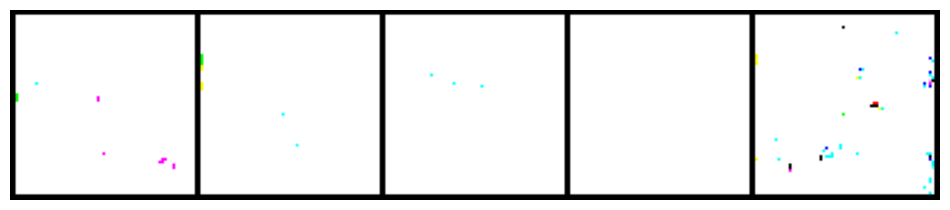

In [17]:
def build_cond_vector(gender_name, hero_name, palette_name):
    g_idx = int(gender_to_idx[gender_name])
    h_idx = int(hero_to_idx[hero_name])
    p_idx = int(palette_to_idx[palette_name])

    cond = np.concatenate([
        one_hot(g_idx, len(gender_classes)),
        one_hot(h_idx, len(hero_classes)),
        one_hot(p_idx, len(palette_classes)),
    ]).astype(np.float32)
    return torch.from_numpy(cond)

rows_hero = ["warrior", "mage", "rogue", "cleric", "cavalry"]
palette_name = "warm"
gender_name = "masculine"

conds_list = [build_cond_vector(gender_name, h, palette_name) for h in rows_hero]
conds_tensor = torch.stack(conds_list, 0).to(device)
z = torch.randn(len(rows_hero), nz, device=device)

G_ema.eval()
with torch.no_grad():
    fake = G_ema(z, conds_tensor).cpu()

grid = vutils.make_grid(denorm(fake), nrow=len(rows_hero), padding=2)
plt.figure(figsize=(12,4))
plt.axis("off")
plt.imshow(grid.permute(1,2,0).numpy())
plt.show()


# Тут возникла проблема с визуализацией

In [22]:
from torchvision.utils import save_image, make_grid

with torch.no_grad():
    z = torch.randn(B, nz, device=device)
    f = G(z, conds).cpu()

vis = (f.clamp(-1,1) + 1) / 2  # [-1,1] -> [0,1]
save_image(vis, "debug_fake_raw.png", nrow=8)
print("saved debug_fake_raw.png")


saved debug_fake_raw.png


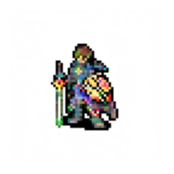

In [21]:
import matplotlib.pyplot as plt
import numpy as np

img = vis[0].permute(1,2,0).numpy()   # HWC
plt.figure(figsize=(2,2))
plt.imshow(img)
plt.axis("off")
plt.show()


G stats: min=-1.000 max=1.000 mean=0.689 std=0.646
G_ema stats: min=-1.000 max=1.000 mean=0.986 std=0.166


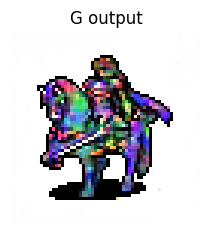

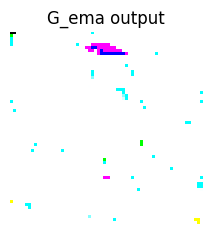

In [31]:
import matplotlib.pyplot as plt
import torch

def debug_show(G, G_ema, fixed_noise, fixed_conds, device):
    G.eval(); G_ema.eval()
    with torch.no_grad():
        z = fixed_noise.to(device)
        c = fixed_conds.to(device)

        f_g   = G(z, c).cpu()
        f_ema = G_ema(z, c).cpu()

    def stats(x, name):
        print(f"{name} stats: min={x.min().item():.3f} max={x.max().item():.3f} "
              f"mean={x.mean().item():.3f} std={x.std().item():.3f}")

    stats(f_g,   "G")
    stats(f_ema, "G_ema")

    # в [0,1]
    vis_g   = (f_g.clamp(-1,1) + 1) / 2
    vis_ema = (f_ema.clamp(-1,1) + 1) / 2

    # покажем по одной картинке — как у тебя работало
    for title, vis in [("G output", vis_g), ("G_ema output", vis_ema)]:
        img = vis[0].permute(1,2,0).numpy()
        plt.figure(figsize=(2.5,2.5))
        plt.imshow(img)
        plt.title(title)
        plt.axis("off")
        plt.show()

# вызов
debug_show(G, G_ema, fixed_noise, fixed_conds, device)


# Промежуточный вывод по трем вариантам модели:

## v1 — базовый cDCGAN
 
ConvTranspose + BatchNorm
 
BCELoss
 
Работает, но быстро выходит в плато.
 
Контуры угадываются, детали — сл## абые.
 
v2 — ResNet + SpectralNorm + hinge-loss
 
Устойчивее.
 
Но D стал слишком сильным → G коллапсировал в константу (бе## лый холст).
 
v3 — TTUR + R1 + Instance Noise + EMA
 
Наиболее стабильная ранняя версия.
 
Хорошие контуры, меньше артефактов.
 
Но цвета всё ещё плавают, детали слабые.
 
Палитра — неустойчива.

## v4 — Projection Discriminator
 
Улучшение структуры.
 
Но иногда D переучивается → G снова «сдувается».

In [1]:
# config & run dirs for strong GAN v4
from datetime import datetime
from pathlib import Path
import sys, json, random, time

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils import spectral_norm
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

import numpy as np
import pandas as pd
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms as T
from PIL import Image

PROJECT_ROOT = Path(r"D:\ML\LS\Deep_learning\GAN\hero_portrait_generator")
DATA_DIR = PROJECT_ROOT / "data"

SRC_DIR = PROJECT_ROOT / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.append(str(SRC_DIR))

from utils.config import DATASET_CONFIG, CDC_GAN_CONFIG

print("DATASET_CONFIG:", DATASET_CONFIG)
print("CDC_GAN_CONFIG:", CDC_GAN_CONFIG)

# гиперпараметры v4
nz = 128
ngf = 128   # усилили
ndf = 128   # усилили
image_size = 64

num_epochs = 450  # чуть дольше
batch_size = 64   

# TTUR (чуть мягче D для цвета)
lrG = 2e-4
lrD = 5e-5

# betas для hinge+SN (как BigGAN)
beta1, beta2 = 0.0, 0.9

# EMA
ema_decay = 0.999

# R1 penalty (мягче, чем было в v3)
r1_gamma = 5.0
r1_every = 32

# Instance noise
noise_sigma_start = 0.15
noise_sigma_end   = 0.0
noise_anneal_epochs = 120

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

# мэппинги и cond_dim (как раньше)
with open(DATA_DIR / "label_mappings.json", "r", encoding="utf-8") as f:
    label_mappings = json.load(f)

gender_classes   = label_mappings["gender_classes"]
gender_to_idx    = label_mappings["gender_to_idx"]
hero_classes     = label_mappings["hero_classes"]
hero_to_idx      = label_mappings["hero_to_idx"]
palette_classes  = label_mappings["palette_classes"]
palette_to_idx   = label_mappings["palette_to_idx"]

print("gender:", gender_classes)
print("hero:", hero_classes)
print("palette:", palette_classes)

cond_dim = len(gender_classes) + len(hero_classes) + len(palette_classes)
print("cond_dim =", cond_dim)

# папки для артефактов
RUN_ID = datetime.now().strftime("%Y%m%d-%H%M%S")
ARTIFACTS_DIR = PROJECT_ROOT / "artifacts_gan"
SAMPLES_DIR = ARTIFACTS_DIR / "samples" / RUN_ID
CKPT_DIR = ARTIFACTS_DIR / "checkpoints" / RUN_ID

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
CKPT_DIR.mkdir(parents=True, exist_ok=True)

print("RUN_ID:", RUN_ID)
print("SAMPLES_DIR:", SAMPLES_DIR)
print("CKPT_DIR:", CKPT_DIR)

# сиды
def seed_all(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = True

seed_all(42)


DATASET_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'num_gender_classes': 2, 'num_hero_classes': 9, 'num_palette_classes': 5}
CDC_GAN_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'nz': 128, 'ngf': 64, 'ndf': 64}
device: cuda
gender: ['feminine', 'masculine']
hero: ['barbarian', 'bard', 'cavalry', 'cleric', 'knight', 'mage', 'ranger', 'rogue', 'warrior']
palette: ['cool', 'dark', 'muted', 'neutral', 'warm']
cond_dim = 16
RUN_ID: 20251123-014750
SAMPLES_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750
CKPT_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251123-014750


In [2]:
# ResBlocks + Self-Attention (FULL)

class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.query = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.key   = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.value = spectral_norm(nn.Conv2d(in_channels, in_channels, 1))
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        B, C, H, W = x.size()
        proj_query = self.query(x).view(B, -1, H * W).permute(0, 2, 1)
        proj_key   = self.key(x).view(B, -1, H * W)
        energy = torch.bmm(proj_query, proj_key)
        attention = F.softmax(energy, dim=-1)

        proj_value = self.value(x).view(B, C, -1)
        out = torch.bmm(proj_value, attention.permute(0, 2, 1))
        out = out.view(B, C, H, W)

        return self.gamma * out + x


class GenResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode="nearest")
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False)
        self.bn1   = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False)
        self.bn2   = nn.BatchNorm2d(out_channels)
        self.conv_skip = nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False)

    def forward(self, x):
        skip = self.upsample(x)
        skip = self.conv_skip(skip)

        out = self.upsample(x)
        out = self.conv1(out)
        out = self.bn1(out)
        out = F.relu(out, inplace=False)

        out = self.conv2(out)
        out = self.bn2(out)

        out = F.relu(out + skip, inplace=False)
        return out


class DiscResBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample=True):
        super().__init__()
        self.downsample = downsample
        self.conv1 = spectral_norm(nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False))
        self.conv2 = spectral_norm(nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False))
        self.conv_skip = spectral_norm(nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False))
        if downsample:
            self.avgpool = nn.AvgPool2d(2)

    def forward(self, x):
        skip = x
        if self.downsample:
            skip = self.avgpool(skip)
        skip = self.conv_skip(skip)

        out = F.leaky_relu(x, 0.2, inplace=False)
        out = self.conv1(out)
        out = F.leaky_relu(out, 0.2, inplace=False)
        out = self.conv2(out)

        if self.downsample:
            out = self.avgpool(out)

        return out + skip


In [3]:
# Strong Conditional Generator & Discriminator

class StrongConditionalGenerator(nn.Module):
    def __init__(self, nz, cond_dim, ngf=128, nc=3):
        super().__init__()
        in_dim = nz + cond_dim
        self.fc = nn.Linear(in_dim, ngf * 8 * 4 * 4)

        self.block1 = GenResBlock(ngf * 8, ngf * 8)   # 4->8
        self.block2 = GenResBlock(ngf * 8, ngf * 4)   # 8->16
        self.block3 = GenResBlock(ngf * 4, ngf * 2)   # 16->32
        self.attn   = SelfAttention(ngf * 2)
        self.block4 = GenResBlock(ngf * 2, ngf)       # 32->64

        self.out = nn.Conv2d(ngf, nc, 3, 1, 1, bias=False)

    def forward(self, z, cond):
        x = torch.cat([z, cond], dim=1)
        x = self.fc(x).view(x.size(0), -1, 4, 4)
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.attn(x)
        x = self.block4(x)
        return torch.tanh(self.out(x))


class StrongConditionalDiscriminator(nn.Module):
    def __init__(self, cond_dim: int, ndf: int = 128, nc: int = 3):
        super().__init__()
        self.cond_dim = cond_dim
        in_channels = nc + cond_dim

        self.block1 = DiscResBlock(in_channels, ndf, downsample=True)       # 64->32
        self.block2 = DiscResBlock(ndf, ndf * 2, downsample=True)           # 32->16
        self.block3 = DiscResBlock(ndf * 2, ndf * 4, downsample=True)       # 16->8
        self.block4 = DiscResBlock(ndf * 4, ndf * 8, downsample=True)       # 8->4

        self.final_conv = spectral_norm(nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False))

    def forward(self, img, cond):
        B, C, H, W = img.size()
        cond_map = cond.view(B, self.cond_dim, 1, 1).expand(-1, -1, H, W)
        x = torch.cat([img, cond_map], dim=1)

        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)

        out = self.final_conv(x)
        return out.view(-1)


In [4]:
# one_hot + HeroPortraitDataset + loaders

def one_hot(index: int, num_classes: int) -> np.ndarray:
    vec = np.zeros(num_classes, dtype=np.float32)
    vec[index] = 1.0
    return vec

class HeroPortraitDataset(Dataset):
    def __init__(self, df: pd.DataFrame, project_root: Path, image_size: int = 64, normalize: bool = True):
        self.df = df.reset_index(drop=True)
        self.project_root = Path(project_root)

        self.n_gender = len(gender_classes)
        self.n_hero = len(hero_classes)
        self.n_palette = len(palette_classes)

        tfs = [
            T.Resize((image_size, image_size), interpolation=T.InterpolationMode.NEAREST),
            T.ToTensor(),
        ]
        if normalize:
            tfs.append(T.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5]))
        self.transform = T.Compose(tfs)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx: int):
        row = self.df.iloc[idx]

        img_path = self.project_root / row["rel_path"]
        img = Image.open(img_path).convert("RGBA")
        if img.mode == "RGBA":
            bg = Image.new("RGBA", img.size, (255,255,255,255))
            img = Image.alpha_composite(bg, img).convert("RGB")
        else:
            img = img.convert("RGB")

        img_tensor = self.transform(img)

        g_idx = int(row["gender_idx"])
        h_idx = int(row["hero_idx"])
        p_idx = int(row["palette_idx"])

        cond_vec = np.concatenate([
            one_hot(g_idx, self.n_gender),
            one_hot(h_idx, self.n_hero),
            one_hot(p_idx, self.n_palette),
        ]).astype(np.float32)

        cond_tensor = torch.from_numpy(cond_vec)

        return {"image": img_tensor, "cond": cond_tensor}

# train/val -> full
train_df = pd.read_csv(DATA_DIR / "sprites_train.csv")
val_df   = pd.read_csv(DATA_DIR / "sprites_val.csv")
FULL_DF = pd.concat([train_df, val_df], ignore_index=True)

full_dataset = HeroPortraitDataset(FULL_DF, project_root=PROJECT_ROOT, image_size=image_size)

train_loader = DataLoader(
    full_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=0,
    pin_memory=False,
    drop_last=True
)

print("dataset size:", len(full_dataset))
print("batches:", len(train_loader))


dataset size: 7596
batches: 118


In [5]:
# helpers (denorm, noise, R1, EMA fix, samples)

def denorm(img_batch):
    return (img_batch * 0.5) + 0.5  # [-1,1] -> [0,1]

def add_instance_noise(x, epoch):
    if epoch >= noise_anneal_epochs:
        sigma = noise_sigma_end
    else:
        t = epoch / noise_anneal_epochs
        sigma = noise_sigma_start * (1 - t) + noise_sigma_end * t
    if sigma <= 0:
        return x
    return x + torch.randn_like(x) * sigma

def r1_penalty(d_out, x):
    grad = torch.autograd.grad(
        outputs=d_out.sum(), inputs=x,
        create_graph=True, retain_graph=True, only_inputs=True
    )[0]
    return grad.view(grad.size(0), -1).pow(2).sum(dim=1).mean()

@torch.no_grad()
def update_ema(G, G_ema, decay=0.999):
    # EMA по параметрам
    for p, p_ema in zip(G.parameters(), G_ema.parameters()):
        p_ema.data.mul_(decay).add_(p.data, alpha=1.0 - decay)
    # КЛЮЧЕВО: копируем BN буферы (running_mean/var)
    for b, b_ema in zip(G.buffers(), G_ema.buffers()):
        b_ema.copy_(b)

def save_sample_images(epoch, G_ema, fixed_noise, fixed_conds, samples_dir: Path):
    G_ema.eval()
    with torch.no_grad():
        fake = G_ema(fixed_noise, fixed_conds).detach().cpu()
    fake_denorm = denorm(fake)  # [0,1]

    grid = vutils.make_grid(fake_denorm, nrow=4, padding=2)
    out_path = samples_dir / f"epoch_{epoch:03d}.png"

    plt.figure(figsize=(6, 6))
    plt.axis("off")
    plt.imshow(grid.permute(1, 2, 0).numpy(), interpolation="nearest")
    plt.tight_layout()
    plt.savefig(out_path, dpi=150)
    plt.close()

    print(f"[samples] Saved: {out_path}")


In [6]:
# CELL 6: init strong G/D + EMA + optimizers/schedulers

G = StrongConditionalGenerator(nz=nz, cond_dim=cond_dim, ngf=ngf, nc=3).to(device)
D = StrongConditionalDiscriminator(cond_dim=cond_dim, ndf=ndf, nc=3).to(device)

# EMA generator
G_ema = StrongConditionalGenerator(nz=nz, cond_dim=cond_dim, ngf=ngf, nc=3).to(device)
G_ema.load_state_dict(G.state_dict())
G_ema.eval()
for p in G_ema.parameters():
    p.requires_grad_(False)

print("Params G:", sum(p.numel() for p in G.parameters()))
print("Params D:", sum(p.numel() for p in D.parameters()))

optimizerG = torch.optim.Adam(G.parameters(), lr=lrG, betas=(beta1, beta2))
optimizerD = torch.optim.Adam(D.parameters(), lr=lrD, betas=(beta1, beta2))

# мягкий decay после 250 и 380 эпох (без агрессии)
schedulerG = torch.optim.lr_scheduler.MultiStepLR(optimizerG, milestones=[250, 380], gamma=0.5)
schedulerD = torch.optim.lr_scheduler.MultiStepLR(optimizerD, milestones=[250, 380], gamma=0.5)

# fixed noise/conds
fixed_batch = next(iter(train_loader))
fixed_conds = fixed_batch["cond"][:16].to(device)
fixed_noise = torch.randn(16, nz, device=device)

print("sanity fixed shapes:", fixed_noise.shape, fixed_conds.shape)


Params G: 32369857
Params D: 19455744
sanity fixed shapes: torch.Size([16, 128]) torch.Size([16, 16])


In [7]:
# sanity-check forward pass
batch = next(iter(train_loader))
real_images = batch["image"].to(device)
conds = batch["cond"].to(device)
B = real_images.size(0)

z = torch.randn(B, nz, device=device)

with torch.no_grad():
    fake_images = G(z, conds)
    real_scores = D(real_images, conds)
    fake_scores = D(fake_images, conds)

print("real_images:", real_images.shape)
print("fake_images:", fake_images.shape)
print("real_scores:", real_scores.shape)
print("fake_scores:", fake_scores.shape)


real_images: torch.Size([64, 3, 64, 64])
fake_images: torch.Size([64, 3, 64, 64])
real_scores: torch.Size([64])
fake_scores: torch.Size([64])


In [8]:
# main training loop (hinge, R1, noise, EMA fixed)

start_epoch = 1
losses_D, losses_G = [], []
global_step = 0

for epoch in range(start_epoch, num_epochs + 1):
    G.train(); D.train()
    epoch_loss_G, epoch_loss_D = 0.0, 0.0
    num_batches = 0

    pbar = tqdm(train_loader, desc=f"Epoch [{epoch}/{num_epochs}]", leave=False)

    for batch in pbar:
        real_images = batch["image"].to(device)
        conds = batch["cond"].to(device)
        B = real_images.size(0)

        # D step (hinge + R1)
        optimizerD.zero_grad(set_to_none=True)

        real_images.requires_grad_(True)
        real_noisy = add_instance_noise(real_images, epoch)
        real_scores = D(real_noisy, conds)
        loss_D_real = torch.relu(1.0 - real_scores).mean()

        z = torch.randn(B, nz, device=device)
        fake_images = G(z, conds).detach()
        fake_noisy = add_instance_noise(fake_images, epoch)
        fake_scores = D(fake_noisy, conds)
        loss_D_fake = torch.relu(1.0 + fake_scores).mean()

        loss_D = loss_D_real + loss_D_fake

        if global_step % r1_every == 0:
            r1 = r1_penalty(real_scores, real_images)
            loss_D = loss_D + (r1_gamma / 2.0) * r1

        loss_D.backward()
        optimizerD.step()
        real_images.requires_grad_(False)

        # G step
        optimizerG.zero_grad(set_to_none=True)
        z = torch.randn(B, nz, device=device)
        fake_images = G(z, conds)
        fake_scores_for_G = D(fake_images, conds)
        loss_G = -fake_scores_for_G.mean()

        loss_G.backward()
        optimizerG.step()

        update_ema(G, G_ema, ema_decay)

        epoch_loss_D += loss_D.item()
        epoch_loss_G += loss_G.item()
        num_batches += 1
        global_step += 1

        pbar.set_postfix(loss_D=f"{loss_D.item():.3f}", loss_G=f"{loss_G.item():.3f}")

    epoch_loss_D /= num_batches
    epoch_loss_G /= num_batches
    losses_D.append(epoch_loss_D)
    losses_G.append(epoch_loss_G)

    schedulerD.step()
    schedulerG.step()

    print(f"[Epoch {epoch:03d}/{num_epochs}] mean loss_D: {epoch_loss_D:.4f} | mean loss_G: {epoch_loss_G:.4f}")

    # samples
    if epoch % 10 == 0 or epoch == start_epoch:
        save_sample_images(epoch, G_ema, fixed_noise, fixed_conds, SAMPLES_DIR)

    # ckpt
    if epoch % 50 == 0 or epoch == num_epochs:
        ckpt_path = CKPT_DIR / f"hero_v4_epoch_{epoch:03d}.pth"
        torch.save(
            {
                "epoch": epoch,
                "G_state_dict": G.state_dict(),
                "G_ema_state_dict": G_ema.state_dict(),
                "D_state_dict": D.state_dict(),
                "optimizerG_state_dict": optimizerG.state_dict(),
                "optimizerD_state_dict": optimizerD.state_dict(),
                "losses_G": losses_G,
                "losses_D": losses_D,
                "config": {
                    "nz": nz, "cond_dim": cond_dim,
                    "ngf": ngf, "ndf": ndf,
                    "image_size": image_size,
                    "lrG": lrG, "lrD": lrD,
                    "betas": (beta1, beta2),
                    "ema_decay": ema_decay,
                    "r1_gamma": r1_gamma, "r1_every": r1_every,
                    "noise_sigma_start": noise_sigma_start,
                    "noise_anneal_epochs": noise_anneal_epochs,
                    "run_id": RUN_ID,
                },
            },
            ckpt_path,
        )
        print(f"[ckpt] Saved: {ckpt_path}")


Epoch [1/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 001/450] mean loss_D: 1.9737 | mean loss_G: 0.0490
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_001.png


Epoch [2/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 002/450] mean loss_D: 1.9979 | mean loss_G: -0.1651


Epoch [3/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 003/450] mean loss_D: 1.9819 | mean loss_G: -0.2352


Epoch [4/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 004/450] mean loss_D: 1.9799 | mean loss_G: -0.1496


Epoch [5/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 005/450] mean loss_D: 1.9809 | mean loss_G: -0.1189


Epoch [6/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 006/450] mean loss_D: 1.9623 | mean loss_G: -0.1658


Epoch [7/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 007/450] mean loss_D: 1.9515 | mean loss_G: -0.0792


Epoch [8/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 008/450] mean loss_D: 1.9215 | mean loss_G: -0.0704


Epoch [9/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 009/450] mean loss_D: 1.8989 | mean loss_G: 0.1064


Epoch [10/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 010/450] mean loss_D: 1.8758 | mean loss_G: 0.0226
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_010.png


Epoch [11/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 011/450] mean loss_D: 1.8369 | mean loss_G: 0.0936


Epoch [12/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 012/450] mean loss_D: 1.7984 | mean loss_G: 0.2139


Epoch [13/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 013/450] mean loss_D: 1.7409 | mean loss_G: 0.2897


Epoch [14/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 014/450] mean loss_D: 1.7065 | mean loss_G: 0.3246


Epoch [15/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 015/450] mean loss_D: 1.6263 | mean loss_G: 0.3644


Epoch [16/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 016/450] mean loss_D: 1.5795 | mean loss_G: 0.4375


Epoch [17/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 017/450] mean loss_D: 1.5319 | mean loss_G: 0.4988


Epoch [18/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 018/450] mean loss_D: 1.4767 | mean loss_G: 0.5240


Epoch [19/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 019/450] mean loss_D: 1.4298 | mean loss_G: 0.5722


Epoch [20/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 020/450] mean loss_D: 1.3876 | mean loss_G: 0.5721
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_020.png


Epoch [21/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 021/450] mean loss_D: 1.3512 | mean loss_G: 0.6195


Epoch [22/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 022/450] mean loss_D: 1.3303 | mean loss_G: 0.6632


Epoch [23/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 023/450] mean loss_D: 1.3104 | mean loss_G: 0.6617


Epoch [24/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 024/450] mean loss_D: 1.2843 | mean loss_G: 0.6951


Epoch [25/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 025/450] mean loss_D: 1.2761 | mean loss_G: 0.6747


Epoch [26/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 026/450] mean loss_D: 1.2636 | mean loss_G: 0.6935


Epoch [27/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 027/450] mean loss_D: 1.2477 | mean loss_G: 0.6982


Epoch [28/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 028/450] mean loss_D: 1.2321 | mean loss_G: 0.7243


Epoch [29/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 029/450] mean loss_D: 1.2286 | mean loss_G: 0.7264


Epoch [30/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 030/450] mean loss_D: 1.2392 | mean loss_G: 0.7248
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_030.png


Epoch [31/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 031/450] mean loss_D: 1.2376 | mean loss_G: 0.7022


Epoch [32/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 032/450] mean loss_D: 1.2467 | mean loss_G: 0.6857


Epoch [33/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 033/450] mean loss_D: 1.2360 | mean loss_G: 0.6948


Epoch [34/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 034/450] mean loss_D: 1.2481 | mean loss_G: 0.7088


Epoch [35/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 035/450] mean loss_D: 1.2513 | mean loss_G: 0.7145


Epoch [36/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 036/450] mean loss_D: 1.2530 | mean loss_G: 0.7002


Epoch [37/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 037/450] mean loss_D: 1.2554 | mean loss_G: 0.7004


Epoch [38/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 038/450] mean loss_D: 1.2536 | mean loss_G: 0.7096


Epoch [39/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 039/450] mean loss_D: 1.2497 | mean loss_G: 0.7021


Epoch [40/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 040/450] mean loss_D: 1.2462 | mean loss_G: 0.7037
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_040.png


Epoch [41/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 041/450] mean loss_D: 1.2726 | mean loss_G: 0.6650


Epoch [42/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 042/450] mean loss_D: 1.2732 | mean loss_G: 0.6607


Epoch [43/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 043/450] mean loss_D: 1.2784 | mean loss_G: 0.6800


Epoch [44/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 044/450] mean loss_D: 1.2896 | mean loss_G: 0.6520


Epoch [45/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 045/450] mean loss_D: 1.2830 | mean loss_G: 0.6878


Epoch [46/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 046/450] mean loss_D: 1.2619 | mean loss_G: 0.6948


Epoch [47/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 047/450] mean loss_D: 1.2737 | mean loss_G: 0.6698


Epoch [48/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 048/450] mean loss_D: 1.2840 | mean loss_G: 0.7038


Epoch [49/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 049/450] mean loss_D: 1.2802 | mean loss_G: 0.6835


Epoch [50/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 050/450] mean loss_D: 1.2919 | mean loss_G: 0.6876
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_050.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251123-014750\hero_v4_epoch_050.pth


Epoch [51/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 051/450] mean loss_D: 1.2878 | mean loss_G: 0.6785


Epoch [52/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 052/450] mean loss_D: 1.2942 | mean loss_G: 0.6466


Epoch [53/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 053/450] mean loss_D: 1.2902 | mean loss_G: 0.6880


Epoch [54/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 054/450] mean loss_D: 1.3018 | mean loss_G: 0.6819


Epoch [55/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 055/450] mean loss_D: 1.3119 | mean loss_G: 0.6620


Epoch [56/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 056/450] mean loss_D: 1.3111 | mean loss_G: 0.6788


Epoch [57/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 057/450] mean loss_D: 1.3076 | mean loss_G: 0.6887


Epoch [58/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 058/450] mean loss_D: 1.2965 | mean loss_G: 0.6616


Epoch [59/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 059/450] mean loss_D: 1.3067 | mean loss_G: 0.6840


Epoch [60/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 060/450] mean loss_D: 1.3011 | mean loss_G: 0.6781
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_060.png


Epoch [61/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 061/450] mean loss_D: 1.3002 | mean loss_G: 0.6503


Epoch [62/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 062/450] mean loss_D: 1.3033 | mean loss_G: 0.6802


Epoch [63/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 063/450] mean loss_D: 1.2910 | mean loss_G: 0.6415


Epoch [64/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 064/450] mean loss_D: 1.2897 | mean loss_G: 0.6899


Epoch [65/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 065/450] mean loss_D: 1.2917 | mean loss_G: 0.6765


Epoch [66/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 066/450] mean loss_D: 1.2955 | mean loss_G: 0.6621


Epoch [67/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 067/450] mean loss_D: 1.3190 | mean loss_G: 0.6906


Epoch [68/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 068/450] mean loss_D: 1.3110 | mean loss_G: 0.6692


Epoch [69/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 069/450] mean loss_D: 1.3290 | mean loss_G: 0.6772


Epoch [70/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 070/450] mean loss_D: 1.3149 | mean loss_G: 0.6836
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_070.png


Epoch [71/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 071/450] mean loss_D: 1.3162 | mean loss_G: 0.6611


Epoch [72/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 072/450] mean loss_D: 1.3141 | mean loss_G: 0.6831


Epoch [73/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 073/450] mean loss_D: 1.3291 | mean loss_G: 0.7142


Epoch [74/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 074/450] mean loss_D: 1.3152 | mean loss_G: 0.6645


Epoch [75/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 075/450] mean loss_D: 1.3035 | mean loss_G: 0.6536


Epoch [76/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 076/450] mean loss_D: 1.3342 | mean loss_G: 0.6440


Epoch [77/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 077/450] mean loss_D: 1.3204 | mean loss_G: 0.6872


Epoch [78/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 078/450] mean loss_D: 1.3253 | mean loss_G: 0.6552


Epoch [79/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 079/450] mean loss_D: 1.3451 | mean loss_G: 0.6402


Epoch [80/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 080/450] mean loss_D: 1.3410 | mean loss_G: 0.6499
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_080.png


Epoch [81/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 081/450] mean loss_D: 1.3391 | mean loss_G: 0.6586


Epoch [82/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 082/450] mean loss_D: 1.3385 | mean loss_G: 0.6632


Epoch [83/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 083/450] mean loss_D: 1.3508 | mean loss_G: 0.6392


Epoch [84/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 084/450] mean loss_D: 1.3381 | mean loss_G: 0.6321


Epoch [85/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 085/450] mean loss_D: 1.3481 | mean loss_G: 0.6509


Epoch [86/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 086/450] mean loss_D: 1.3550 | mean loss_G: 0.6793


Epoch [87/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 087/450] mean loss_D: 1.3424 | mean loss_G: 0.6413


Epoch [88/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 088/450] mean loss_D: 1.3515 | mean loss_G: 0.6435


Epoch [89/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 089/450] mean loss_D: 1.3378 | mean loss_G: 0.6740


Epoch [90/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 090/450] mean loss_D: 1.3353 | mean loss_G: 0.6571
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_090.png


Epoch [91/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 091/450] mean loss_D: 1.3589 | mean loss_G: 0.6361


Epoch [92/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 092/450] mean loss_D: 1.3565 | mean loss_G: 0.6194


Epoch [93/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 093/450] mean loss_D: 1.3426 | mean loss_G: 0.6469


Epoch [94/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 094/450] mean loss_D: 1.3552 | mean loss_G: 0.6585


Epoch [95/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 095/450] mean loss_D: 1.3457 | mean loss_G: 0.6577


Epoch [96/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 096/450] mean loss_D: 1.3617 | mean loss_G: 0.6285


Epoch [97/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 097/450] mean loss_D: 1.3615 | mean loss_G: 0.6416


Epoch [98/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 098/450] mean loss_D: 1.3669 | mean loss_G: 0.6488


Epoch [99/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 099/450] mean loss_D: 1.3632 | mean loss_G: 0.6475


Epoch [100/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 100/450] mean loss_D: 1.3704 | mean loss_G: 0.6674
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_100.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251123-014750\hero_v4_epoch_100.pth


Epoch [101/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 101/450] mean loss_D: 1.3532 | mean loss_G: 0.6677


Epoch [102/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 102/450] mean loss_D: 1.3514 | mean loss_G: 0.6747


Epoch [103/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 103/450] mean loss_D: 1.3445 | mean loss_G: 0.6432


Epoch [104/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 104/450] mean loss_D: 1.3552 | mean loss_G: 0.6513


Epoch [105/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 105/450] mean loss_D: 1.3719 | mean loss_G: 0.6532


Epoch [106/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 106/450] mean loss_D: 1.3613 | mean loss_G: 0.6415


Epoch [107/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 107/450] mean loss_D: 1.3759 | mean loss_G: 0.6244


Epoch [108/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 108/450] mean loss_D: 1.3717 | mean loss_G: 0.6291


Epoch [109/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 109/450] mean loss_D: 1.3664 | mean loss_G: 0.6553


Epoch [110/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 110/450] mean loss_D: 1.3544 | mean loss_G: 0.6210
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_110.png


Epoch [111/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 111/450] mean loss_D: 1.3345 | mean loss_G: 0.6344


Epoch [112/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 112/450] mean loss_D: 1.3602 | mean loss_G: 0.6397


Epoch [113/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 113/450] mean loss_D: 1.3653 | mean loss_G: 0.6355


Epoch [114/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 114/450] mean loss_D: 1.3563 | mean loss_G: 0.6592


Epoch [115/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 115/450] mean loss_D: 1.3540 | mean loss_G: 0.6725


Epoch [116/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 116/450] mean loss_D: 1.3522 | mean loss_G: 0.6701


Epoch [117/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 117/450] mean loss_D: 1.3376 | mean loss_G: 0.6443


Epoch [118/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 118/450] mean loss_D: 1.3489 | mean loss_G: 0.6663


Epoch [119/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 119/450] mean loss_D: 1.3494 | mean loss_G: 0.6562


Epoch [120/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 120/450] mean loss_D: 1.3691 | mean loss_G: 0.6442
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_120.png


Epoch [121/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 121/450] mean loss_D: 1.3683 | mean loss_G: 0.6219


Epoch [122/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 122/450] mean loss_D: 1.3563 | mean loss_G: 0.6589


Epoch [123/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 123/450] mean loss_D: 1.3641 | mean loss_G: 0.6607


Epoch [124/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 124/450] mean loss_D: 1.3602 | mean loss_G: 0.6467


Epoch [125/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 125/450] mean loss_D: 1.3554 | mean loss_G: 0.6501


Epoch [126/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 126/450] mean loss_D: 1.3673 | mean loss_G: 0.6603


Epoch [127/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 127/450] mean loss_D: 1.3647 | mean loss_G: 0.6570


Epoch [128/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 128/450] mean loss_D: 1.3704 | mean loss_G: 0.6525


Epoch [129/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 129/450] mean loss_D: 1.3808 | mean loss_G: 0.6252


Epoch [130/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 130/450] mean loss_D: 1.3745 | mean loss_G: 0.6423
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_130.png


Epoch [131/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 131/450] mean loss_D: 1.3813 | mean loss_G: 0.6249


Epoch [132/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 132/450] mean loss_D: 1.3852 | mean loss_G: 0.6412


Epoch [133/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 133/450] mean loss_D: 1.3947 | mean loss_G: 0.5948


Epoch [134/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 134/450] mean loss_D: 1.3781 | mean loss_G: 0.6556


Epoch [135/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 135/450] mean loss_D: 1.3843 | mean loss_G: 0.6525


Epoch [136/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 136/450] mean loss_D: 1.3937 | mean loss_G: 0.6390


Epoch [137/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 137/450] mean loss_D: 1.3746 | mean loss_G: 0.6293


Epoch [138/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 138/450] mean loss_D: 1.3806 | mean loss_G: 0.6390


Epoch [139/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 139/450] mean loss_D: 1.3587 | mean loss_G: 0.6334


Epoch [140/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 140/450] mean loss_D: 1.3872 | mean loss_G: 0.6482
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_140.png


Epoch [141/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 141/450] mean loss_D: 1.4032 | mean loss_G: 0.6394


Epoch [142/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 142/450] mean loss_D: 1.3834 | mean loss_G: 0.6139


Epoch [143/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 143/450] mean loss_D: 1.3633 | mean loss_G: 0.6631


Epoch [144/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 144/450] mean loss_D: 1.3796 | mean loss_G: 0.6385


Epoch [145/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 145/450] mean loss_D: 1.3802 | mean loss_G: 0.6463


Epoch [146/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 146/450] mean loss_D: 1.3799 | mean loss_G: 0.6660


Epoch [147/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 147/450] mean loss_D: 1.3697 | mean loss_G: 0.6329


Epoch [148/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 148/450] mean loss_D: 1.3667 | mean loss_G: 0.6577


Epoch [149/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 149/450] mean loss_D: 1.3713 | mean loss_G: 0.6148


Epoch [150/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 150/450] mean loss_D: 1.3727 | mean loss_G: 0.6340
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_150.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251123-014750\hero_v4_epoch_150.pth


Epoch [151/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 151/450] mean loss_D: 1.3755 | mean loss_G: 0.6195


Epoch [152/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 152/450] mean loss_D: 1.3914 | mean loss_G: 0.6542


Epoch [153/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 153/450] mean loss_D: 1.3708 | mean loss_G: 0.6489


Epoch [154/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 154/450] mean loss_D: 1.3761 | mean loss_G: 0.6295


Epoch [155/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 155/450] mean loss_D: 1.3759 | mean loss_G: 0.6469


Epoch [156/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 156/450] mean loss_D: 1.3478 | mean loss_G: 0.6860


Epoch [157/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 157/450] mean loss_D: 1.3582 | mean loss_G: 0.6684


Epoch [158/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 158/450] mean loss_D: 1.3561 | mean loss_G: 0.6275


Epoch [159/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 159/450] mean loss_D: 1.3835 | mean loss_G: 0.6525


Epoch [160/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 160/450] mean loss_D: 1.3991 | mean loss_G: 0.6391
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_160.png


Epoch [161/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 161/450] mean loss_D: 1.3927 | mean loss_G: 0.6699


Epoch [162/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 162/450] mean loss_D: 1.3686 | mean loss_G: 0.6326


Epoch [163/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 163/450] mean loss_D: 1.3965 | mean loss_G: 0.6207


Epoch [164/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 164/450] mean loss_D: 1.3813 | mean loss_G: 0.6365


Epoch [165/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 165/450] mean loss_D: 1.3933 | mean loss_G: 0.6363


Epoch [166/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 166/450] mean loss_D: 1.3958 | mean loss_G: 0.6264


Epoch [167/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 167/450] mean loss_D: 1.3997 | mean loss_G: 0.6428


Epoch [168/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 168/450] mean loss_D: 1.3802 | mean loss_G: 0.6178


Epoch [169/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 169/450] mean loss_D: 1.3715 | mean loss_G: 0.6085


Epoch [170/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 170/450] mean loss_D: 1.3810 | mean loss_G: 0.6354
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_170.png


Epoch [171/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 171/450] mean loss_D: 1.3937 | mean loss_G: 0.6353


Epoch [172/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 172/450] mean loss_D: 1.4002 | mean loss_G: 0.6213


Epoch [173/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 173/450] mean loss_D: 1.3821 | mean loss_G: 0.6455


Epoch [174/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 174/450] mean loss_D: 1.3960 | mean loss_G: 0.6331


Epoch [175/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 175/450] mean loss_D: 1.3885 | mean loss_G: 0.6657


Epoch [176/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 176/450] mean loss_D: 1.3798 | mean loss_G: 0.6277


Epoch [177/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 177/450] mean loss_D: 1.3889 | mean loss_G: 0.6274


Epoch [178/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 178/450] mean loss_D: 1.3827 | mean loss_G: 0.6068


Epoch [179/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 179/450] mean loss_D: 1.3914 | mean loss_G: 0.6142


Epoch [180/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 180/450] mean loss_D: 1.3837 | mean loss_G: 0.6342
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_180.png


Epoch [181/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 181/450] mean loss_D: 1.3890 | mean loss_G: 0.6357


Epoch [182/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 182/450] mean loss_D: 1.3979 | mean loss_G: 0.6169


Epoch [183/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 183/450] mean loss_D: 1.3921 | mean loss_G: 0.6358


Epoch [184/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 184/450] mean loss_D: 1.4037 | mean loss_G: 0.6132


Epoch [185/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 185/450] mean loss_D: 1.4036 | mean loss_G: 0.6371


Epoch [186/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 186/450] mean loss_D: 1.4116 | mean loss_G: 0.6215


Epoch [187/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 187/450] mean loss_D: 1.3956 | mean loss_G: 0.6275


Epoch [188/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 188/450] mean loss_D: 1.3930 | mean loss_G: 0.6075


Epoch [189/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 189/450] mean loss_D: 1.4158 | mean loss_G: 0.6429


Epoch [190/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 190/450] mean loss_D: 1.4043 | mean loss_G: 0.6518
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_190.png


Epoch [191/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 191/450] mean loss_D: 1.3989 | mean loss_G: 0.6249


Epoch [192/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 192/450] mean loss_D: 1.4065 | mean loss_G: 0.6302


Epoch [193/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 193/450] mean loss_D: 1.4104 | mean loss_G: 0.6229


Epoch [194/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 194/450] mean loss_D: 1.4051 | mean loss_G: 0.6352


Epoch [195/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 195/450] mean loss_D: 1.4107 | mean loss_G: 0.6529


Epoch [196/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 196/450] mean loss_D: 1.3942 | mean loss_G: 0.6163


Epoch [197/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 197/450] mean loss_D: 1.3975 | mean loss_G: 0.6289


Epoch [198/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 198/450] mean loss_D: 1.3929 | mean loss_G: 0.6311


Epoch [199/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 199/450] mean loss_D: 1.3826 | mean loss_G: 0.6530


Epoch [200/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 200/450] mean loss_D: 1.4022 | mean loss_G: 0.6442
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_200.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251123-014750\hero_v4_epoch_200.pth


Epoch [201/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 201/450] mean loss_D: 1.4200 | mean loss_G: 0.6639


Epoch [202/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 202/450] mean loss_D: 1.4046 | mean loss_G: 0.6543


Epoch [203/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 203/450] mean loss_D: 1.4090 | mean loss_G: 0.6371


Epoch [204/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 204/450] mean loss_D: 1.4070 | mean loss_G: 0.6435


Epoch [205/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 205/450] mean loss_D: 1.4021 | mean loss_G: 0.6493


Epoch [206/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 206/450] mean loss_D: 1.3953 | mean loss_G: 0.6372


Epoch [207/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 207/450] mean loss_D: 1.4077 | mean loss_G: 0.6383


Epoch [208/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 208/450] mean loss_D: 1.3941 | mean loss_G: 0.6272


Epoch [209/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 209/450] mean loss_D: 1.4203 | mean loss_G: 0.6519


Epoch [210/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 210/450] mean loss_D: 1.4053 | mean loss_G: 0.6683
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_210.png


Epoch [211/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 211/450] mean loss_D: 1.3995 | mean loss_G: 0.6142


Epoch [212/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 212/450] mean loss_D: 1.4233 | mean loss_G: 0.6317


Epoch [213/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 213/450] mean loss_D: 1.4159 | mean loss_G: 0.6222


Epoch [214/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 214/450] mean loss_D: 1.4217 | mean loss_G: 0.6042


Epoch [215/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 215/450] mean loss_D: 1.4080 | mean loss_G: 0.6529


Epoch [216/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 216/450] mean loss_D: 1.4163 | mean loss_G: 0.6273


Epoch [217/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 217/450] mean loss_D: 1.3990 | mean loss_G: 0.6284


Epoch [218/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 218/450] mean loss_D: 1.4055 | mean loss_G: 0.6219


Epoch [219/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 219/450] mean loss_D: 1.3952 | mean loss_G: 0.6312


Epoch [220/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 220/450] mean loss_D: 1.4125 | mean loss_G: 0.6259
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_220.png


Epoch [221/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 221/450] mean loss_D: 1.4165 | mean loss_G: 0.6303


Epoch [222/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 222/450] mean loss_D: 1.4196 | mean loss_G: 0.6699


Epoch [223/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 223/450] mean loss_D: 1.4105 | mean loss_G: 0.6464


Epoch [224/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 224/450] mean loss_D: 1.3918 | mean loss_G: 0.6229


Epoch [225/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 225/450] mean loss_D: 1.3944 | mean loss_G: 0.6419


Epoch [226/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 226/450] mean loss_D: 1.4013 | mean loss_G: 0.6207


Epoch [227/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 227/450] mean loss_D: 1.3905 | mean loss_G: 0.6447


Epoch [228/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 228/450] mean loss_D: 1.3903 | mean loss_G: 0.6551


Epoch [229/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 229/450] mean loss_D: 1.4102 | mean loss_G: 0.6233


Epoch [230/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 230/450] mean loss_D: 1.3975 | mean loss_G: 0.6143
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_230.png


Epoch [231/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 231/450] mean loss_D: 1.3782 | mean loss_G: 0.6241


Epoch [232/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 232/450] mean loss_D: 1.3778 | mean loss_G: 0.6142


Epoch [233/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 233/450] mean loss_D: 1.3999 | mean loss_G: 0.6536


Epoch [234/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 234/450] mean loss_D: 1.3926 | mean loss_G: 0.6406


Epoch [235/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 235/450] mean loss_D: 1.4074 | mean loss_G: 0.6563


Epoch [236/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 236/450] mean loss_D: 1.4137 | mean loss_G: 0.6465


Epoch [237/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 237/450] mean loss_D: 1.4042 | mean loss_G: 0.6205


Epoch [238/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 238/450] mean loss_D: 1.3797 | mean loss_G: 0.6197


Epoch [239/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 239/450] mean loss_D: 1.4176 | mean loss_G: 0.6348


Epoch [240/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 240/450] mean loss_D: 1.4112 | mean loss_G: 0.6452
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_240.png


Epoch [241/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 241/450] mean loss_D: 1.4233 | mean loss_G: 0.6338


Epoch [242/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 242/450] mean loss_D: 1.4087 | mean loss_G: 0.6379


Epoch [243/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 243/450] mean loss_D: 1.3920 | mean loss_G: 0.6464


Epoch [244/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 244/450] mean loss_D: 1.4066 | mean loss_G: 0.6249


Epoch [245/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 245/450] mean loss_D: 1.4112 | mean loss_G: 0.6795


Epoch [246/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 246/450] mean loss_D: 1.3992 | mean loss_G: 0.6506


Epoch [247/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 247/450] mean loss_D: 1.3933 | mean loss_G: 0.6513


Epoch [248/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 248/450] mean loss_D: 1.4033 | mean loss_G: 0.6307


Epoch [249/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 249/450] mean loss_D: 1.4064 | mean loss_G: 0.6505


Epoch [250/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 250/450] mean loss_D: 1.4139 | mean loss_G: 0.6528
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_250.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251123-014750\hero_v4_epoch_250.pth


Epoch [251/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 251/450] mean loss_D: 1.3640 | mean loss_G: 0.6870


Epoch [252/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 252/450] mean loss_D: 1.3849 | mean loss_G: 0.6903


Epoch [253/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 253/450] mean loss_D: 1.3833 | mean loss_G: 0.6721


Epoch [254/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 254/450] mean loss_D: 1.4050 | mean loss_G: 0.6811


Epoch [255/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 255/450] mean loss_D: 1.3954 | mean loss_G: 0.6890


Epoch [256/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 256/450] mean loss_D: 1.3914 | mean loss_G: 0.6927


Epoch [257/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 257/450] mean loss_D: 1.4057 | mean loss_G: 0.6959


Epoch [258/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 258/450] mean loss_D: 1.4121 | mean loss_G: 0.6945


Epoch [259/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 259/450] mean loss_D: 1.3955 | mean loss_G: 0.6956


Epoch [260/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 260/450] mean loss_D: 1.4121 | mean loss_G: 0.6980
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_260.png


Epoch [261/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 261/450] mean loss_D: 1.4196 | mean loss_G: 0.7086


Epoch [262/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 262/450] mean loss_D: 1.4198 | mean loss_G: 0.6818


Epoch [263/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 263/450] mean loss_D: 1.4176 | mean loss_G: 0.6849


Epoch [264/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 264/450] mean loss_D: 1.4100 | mean loss_G: 0.7143


Epoch [265/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 265/450] mean loss_D: 1.4198 | mean loss_G: 0.6867


Epoch [266/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 266/450] mean loss_D: 1.4062 | mean loss_G: 0.6807


Epoch [267/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 267/450] mean loss_D: 1.4057 | mean loss_G: 0.6670


Epoch [268/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 268/450] mean loss_D: 1.4062 | mean loss_G: 0.6384


Epoch [269/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 269/450] mean loss_D: 1.4048 | mean loss_G: 0.6182


Epoch [270/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 270/450] mean loss_D: 1.3963 | mean loss_G: 0.6462
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_270.png


Epoch [271/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 271/450] mean loss_D: 1.4095 | mean loss_G: 0.6445


Epoch [272/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 272/450] mean loss_D: 1.4074 | mean loss_G: 0.6649


Epoch [273/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 273/450] mean loss_D: 1.4110 | mean loss_G: 0.6532


Epoch [274/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 274/450] mean loss_D: 1.4198 | mean loss_G: 0.6748


Epoch [275/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 275/450] mean loss_D: 1.4206 | mean loss_G: 0.6581


Epoch [276/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 276/450] mean loss_D: 1.4154 | mean loss_G: 0.6610


Epoch [277/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 277/450] mean loss_D: 1.4137 | mean loss_G: 0.6312


Epoch [278/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 278/450] mean loss_D: 1.4068 | mean loss_G: 0.6508


Epoch [279/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 279/450] mean loss_D: 1.4109 | mean loss_G: 0.6493


Epoch [280/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 280/450] mean loss_D: 1.4189 | mean loss_G: 0.6481
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_280.png


Epoch [281/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 281/450] mean loss_D: 1.4163 | mean loss_G: 0.6406


Epoch [282/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 282/450] mean loss_D: 1.4141 | mean loss_G: 0.6716


Epoch [283/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 283/450] mean loss_D: 1.4177 | mean loss_G: 0.6413


Epoch [284/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 284/450] mean loss_D: 1.4215 | mean loss_G: 0.6512


Epoch [285/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 285/450] mean loss_D: 1.4121 | mean loss_G: 0.6569


Epoch [286/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 286/450] mean loss_D: 1.4060 | mean loss_G: 0.6683


Epoch [287/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 287/450] mean loss_D: 1.4085 | mean loss_G: 0.6545


Epoch [288/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 288/450] mean loss_D: 1.4155 | mean loss_G: 0.6538


Epoch [289/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 289/450] mean loss_D: 1.4163 | mean loss_G: 0.6657


Epoch [290/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 290/450] mean loss_D: 1.4253 | mean loss_G: 0.6821
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_290.png


Epoch [291/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 291/450] mean loss_D: 1.4202 | mean loss_G: 0.6737


Epoch [292/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 292/450] mean loss_D: 1.4270 | mean loss_G: 0.6603


Epoch [293/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 293/450] mean loss_D: 1.4225 | mean loss_G: 0.6507


Epoch [294/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 294/450] mean loss_D: 1.4211 | mean loss_G: 0.6704


Epoch [295/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 295/450] mean loss_D: 1.4186 | mean loss_G: 0.6647


Epoch [296/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 296/450] mean loss_D: 1.4081 | mean loss_G: 0.6780


Epoch [297/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 297/450] mean loss_D: 1.4298 | mean loss_G: 0.6905


Epoch [298/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 298/450] mean loss_D: 1.4254 | mean loss_G: 0.6798


Epoch [299/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 299/450] mean loss_D: 1.4205 | mean loss_G: 0.6777


Epoch [300/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 300/450] mean loss_D: 1.4104 | mean loss_G: 0.6739
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_300.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251123-014750\hero_v4_epoch_300.pth


Epoch [301/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 301/450] mean loss_D: 1.4190 | mean loss_G: 0.6579


Epoch [302/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 302/450] mean loss_D: 1.4236 | mean loss_G: 0.6530


Epoch [303/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 303/450] mean loss_D: 1.4272 | mean loss_G: 0.6666


Epoch [304/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 304/450] mean loss_D: 1.4256 | mean loss_G: 0.6454


Epoch [305/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 305/450] mean loss_D: 1.4234 | mean loss_G: 0.6514


Epoch [306/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 306/450] mean loss_D: 1.4179 | mean loss_G: 0.6576


Epoch [307/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 307/450] mean loss_D: 1.4192 | mean loss_G: 0.6896


Epoch [308/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 308/450] mean loss_D: 1.4231 | mean loss_G: 0.6876


Epoch [309/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 309/450] mean loss_D: 1.4268 | mean loss_G: 0.6801


Epoch [310/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 310/450] mean loss_D: 1.4081 | mean loss_G: 0.6552
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_310.png


Epoch [311/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 311/450] mean loss_D: 1.4146 | mean loss_G: 0.6686


Epoch [312/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 312/450] mean loss_D: 1.4197 | mean loss_G: 0.6842


Epoch [313/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 313/450] mean loss_D: 1.4165 | mean loss_G: 0.7020


Epoch [314/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 314/450] mean loss_D: 1.4095 | mean loss_G: 0.6852


Epoch [315/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 315/450] mean loss_D: 1.4140 | mean loss_G: 0.6591


Epoch [316/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 316/450] mean loss_D: 1.4075 | mean loss_G: 0.6443


Epoch [317/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 317/450] mean loss_D: 1.4151 | mean loss_G: 0.6443


Epoch [318/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 318/450] mean loss_D: 1.4251 | mean loss_G: 0.6516


Epoch [319/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 319/450] mean loss_D: 1.4072 | mean loss_G: 0.6399


Epoch [320/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 320/450] mean loss_D: 1.4162 | mean loss_G: 0.6697
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_320.png


Epoch [321/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 321/450] mean loss_D: 1.4135 | mean loss_G: 0.6640


Epoch [322/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 322/450] mean loss_D: 1.4322 | mean loss_G: 0.6636


Epoch [323/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 323/450] mean loss_D: 1.4167 | mean loss_G: 0.6448


Epoch [324/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 324/450] mean loss_D: 1.4233 | mean loss_G: 0.6547


Epoch [325/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 325/450] mean loss_D: 1.4131 | mean loss_G: 0.6413


Epoch [326/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 326/450] mean loss_D: 1.4261 | mean loss_G: 0.6369


Epoch [327/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 327/450] mean loss_D: 1.4224 | mean loss_G: 0.6430


Epoch [328/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 328/450] mean loss_D: 1.4207 | mean loss_G: 0.6390


Epoch [329/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 329/450] mean loss_D: 1.4321 | mean loss_G: 0.6696


Epoch [330/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 330/450] mean loss_D: 1.4224 | mean loss_G: 0.6300
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_330.png


Epoch [331/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 331/450] mean loss_D: 1.4305 | mean loss_G: 0.6668


Epoch [332/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 332/450] mean loss_D: 1.4213 | mean loss_G: 0.6422


Epoch [333/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 333/450] mean loss_D: 1.4156 | mean loss_G: 0.6284


Epoch [334/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 334/450] mean loss_D: 1.4307 | mean loss_G: 0.6376


Epoch [335/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 335/450] mean loss_D: 1.4296 | mean loss_G: 0.6702


Epoch [336/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 336/450] mean loss_D: 1.4280 | mean loss_G: 0.6751


Epoch [337/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 337/450] mean loss_D: 1.4315 | mean loss_G: 0.6363


Epoch [338/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 338/450] mean loss_D: 1.4334 | mean loss_G: 0.6153


Epoch [339/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 339/450] mean loss_D: 1.4342 | mean loss_G: 0.6656


Epoch [340/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 340/450] mean loss_D: 1.4224 | mean loss_G: 0.6949
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_340.png


Epoch [341/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 341/450] mean loss_D: 1.3953 | mean loss_G: 0.6587


Epoch [342/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 342/450] mean loss_D: 1.3989 | mean loss_G: 0.6382


Epoch [343/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 343/450] mean loss_D: 1.4077 | mean loss_G: 0.6667


Epoch [344/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 344/450] mean loss_D: 1.4198 | mean loss_G: 0.6826


Epoch [345/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 345/450] mean loss_D: 1.4120 | mean loss_G: 0.6894


Epoch [346/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 346/450] mean loss_D: 1.4126 | mean loss_G: 0.7124


Epoch [347/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 347/450] mean loss_D: 1.4176 | mean loss_G: 0.7074


Epoch [348/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 348/450] mean loss_D: 1.4075 | mean loss_G: 0.7092


Epoch [349/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 349/450] mean loss_D: 1.4147 | mean loss_G: 0.6902


Epoch [350/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 350/450] mean loss_D: 1.4116 | mean loss_G: 0.6878
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_350.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251123-014750\hero_v4_epoch_350.pth


Epoch [351/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 351/450] mean loss_D: 1.4019 | mean loss_G: 0.6796


Epoch [352/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 352/450] mean loss_D: 1.4114 | mean loss_G: 0.6825


Epoch [353/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 353/450] mean loss_D: 1.3982 | mean loss_G: 0.6663


Epoch [354/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 354/450] mean loss_D: 1.4058 | mean loss_G: 0.6504


Epoch [355/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 355/450] mean loss_D: 1.3937 | mean loss_G: 0.6874


Epoch [356/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 356/450] mean loss_D: 1.4099 | mean loss_G: 0.6871


Epoch [357/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 357/450] mean loss_D: 1.4049 | mean loss_G: 0.6963


Epoch [358/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 358/450] mean loss_D: 1.3872 | mean loss_G: 0.7041


Epoch [359/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 359/450] mean loss_D: 1.3920 | mean loss_G: 0.7004


Epoch [360/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 360/450] mean loss_D: 1.3866 | mean loss_G: 0.6990
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_360.png


Epoch [361/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 361/450] mean loss_D: 1.3818 | mean loss_G: 0.6336


Epoch [362/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 362/450] mean loss_D: 1.3905 | mean loss_G: 0.6720


Epoch [363/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 363/450] mean loss_D: 1.4006 | mean loss_G: 0.6819


Epoch [364/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 364/450] mean loss_D: 1.4151 | mean loss_G: 0.6824


Epoch [365/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 365/450] mean loss_D: 1.4273 | mean loss_G: 0.6882


Epoch [366/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 366/450] mean loss_D: 1.4086 | mean loss_G: 0.7156


Epoch [367/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 367/450] mean loss_D: 1.4052 | mean loss_G: 0.6955


Epoch [368/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 368/450] mean loss_D: 1.4007 | mean loss_G: 0.6937


Epoch [369/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 369/450] mean loss_D: 1.4108 | mean loss_G: 0.6819


Epoch [370/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 370/450] mean loss_D: 1.4025 | mean loss_G: 0.7152
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_370.png


Epoch [371/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 371/450] mean loss_D: 1.4055 | mean loss_G: 0.6953


Epoch [372/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 372/450] mean loss_D: 1.4014 | mean loss_G: 0.7128


Epoch [373/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 373/450] mean loss_D: 1.3985 | mean loss_G: 0.6830


Epoch [374/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 374/450] mean loss_D: 1.4030 | mean loss_G: 0.7058


Epoch [375/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 375/450] mean loss_D: 1.4045 | mean loss_G: 0.7057


Epoch [376/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 376/450] mean loss_D: 1.4091 | mean loss_G: 0.6920


Epoch [377/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 377/450] mean loss_D: 1.4063 | mean loss_G: 0.6785


Epoch [378/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 378/450] mean loss_D: 1.4019 | mean loss_G: 0.6812


Epoch [379/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 379/450] mean loss_D: 1.4083 | mean loss_G: 0.6804


Epoch [380/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 380/450] mean loss_D: 1.4185 | mean loss_G: 0.6558
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_380.png


Epoch [381/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 381/450] mean loss_D: 1.4026 | mean loss_G: 0.7345


Epoch [382/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 382/450] mean loss_D: 1.3872 | mean loss_G: 0.7373


Epoch [383/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 383/450] mean loss_D: 1.3936 | mean loss_G: 0.7593


Epoch [384/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 384/450] mean loss_D: 1.3894 | mean loss_G: 0.7550


Epoch [385/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 385/450] mean loss_D: 1.3954 | mean loss_G: 0.7518


Epoch [386/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 386/450] mean loss_D: 1.3968 | mean loss_G: 0.7528


Epoch [387/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 387/450] mean loss_D: 1.3922 | mean loss_G: 0.7690


Epoch [388/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 388/450] mean loss_D: 1.3893 | mean loss_G: 0.7540


Epoch [389/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 389/450] mean loss_D: 1.3802 | mean loss_G: 0.7524


Epoch [390/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 390/450] mean loss_D: 1.3948 | mean loss_G: 0.7451
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_390.png


Epoch [391/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 391/450] mean loss_D: 1.3893 | mean loss_G: 0.7558


Epoch [392/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 392/450] mean loss_D: 1.3824 | mean loss_G: 0.7561


Epoch [393/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 393/450] mean loss_D: 1.4025 | mean loss_G: 0.7560


Epoch [394/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 394/450] mean loss_D: 1.4062 | mean loss_G: 0.7390


Epoch [395/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 395/450] mean loss_D: 1.4019 | mean loss_G: 0.7533


Epoch [396/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 396/450] mean loss_D: 1.3912 | mean loss_G: 0.7464


Epoch [397/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 397/450] mean loss_D: 1.4039 | mean loss_G: 0.7599


Epoch [398/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 398/450] mean loss_D: 1.4078 | mean loss_G: 0.7672


Epoch [399/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 399/450] mean loss_D: 1.4078 | mean loss_G: 0.7660


Epoch [400/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 400/450] mean loss_D: 1.3910 | mean loss_G: 0.7661
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_400.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251123-014750\hero_v4_epoch_400.pth


Epoch [401/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 401/450] mean loss_D: 1.4051 | mean loss_G: 0.7699


Epoch [402/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 402/450] mean loss_D: 1.4120 | mean loss_G: 0.7687


Epoch [403/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 403/450] mean loss_D: 1.4045 | mean loss_G: 0.7706


Epoch [404/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 404/450] mean loss_D: 1.4009 | mean loss_G: 0.7551


Epoch [405/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 405/450] mean loss_D: 1.3957 | mean loss_G: 0.7385


Epoch [406/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 406/450] mean loss_D: 1.3886 | mean loss_G: 0.7230


Epoch [407/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 407/450] mean loss_D: 1.3945 | mean loss_G: 0.7200


Epoch [408/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 408/450] mean loss_D: 1.3961 | mean loss_G: 0.7495


Epoch [409/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 409/450] mean loss_D: 1.3996 | mean loss_G: 0.7410


Epoch [410/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 410/450] mean loss_D: 1.3869 | mean loss_G: 0.7268
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_410.png


Epoch [411/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 411/450] mean loss_D: 1.3975 | mean loss_G: 0.7491


Epoch [412/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 412/450] mean loss_D: 1.3951 | mean loss_G: 0.7346


Epoch [413/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 413/450] mean loss_D: 1.3992 | mean loss_G: 0.7250


Epoch [414/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 414/450] mean loss_D: 1.4172 | mean loss_G: 0.7431


Epoch [415/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 415/450] mean loss_D: 1.4126 | mean loss_G: 0.7363


Epoch [416/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 416/450] mean loss_D: 1.3954 | mean loss_G: 0.7427


Epoch [417/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 417/450] mean loss_D: 1.4024 | mean loss_G: 0.7246


Epoch [418/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 418/450] mean loss_D: 1.3961 | mean loss_G: 0.7339


Epoch [419/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 419/450] mean loss_D: 1.4086 | mean loss_G: 0.7166


Epoch [420/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 420/450] mean loss_D: 1.4086 | mean loss_G: 0.7331
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_420.png


Epoch [421/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 421/450] mean loss_D: 1.4054 | mean loss_G: 0.7285


Epoch [422/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 422/450] mean loss_D: 1.4089 | mean loss_G: 0.7477


Epoch [423/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 423/450] mean loss_D: 1.4007 | mean loss_G: 0.7387


Epoch [424/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 424/450] mean loss_D: 1.4024 | mean loss_G: 0.7478


Epoch [425/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 425/450] mean loss_D: 1.3997 | mean loss_G: 0.7384


Epoch [426/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 426/450] mean loss_D: 1.4055 | mean loss_G: 0.7457


Epoch [427/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 427/450] mean loss_D: 1.4112 | mean loss_G: 0.7524


Epoch [428/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 428/450] mean loss_D: 1.3964 | mean loss_G: 0.7490


Epoch [429/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 429/450] mean loss_D: 1.4049 | mean loss_G: 0.7582


Epoch [430/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 430/450] mean loss_D: 1.4013 | mean loss_G: 0.7619
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_430.png


Epoch [431/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 431/450] mean loss_D: 1.3892 | mean loss_G: 0.7360


Epoch [432/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 432/450] mean loss_D: 1.3878 | mean loss_G: 0.7416


Epoch [433/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 433/450] mean loss_D: 1.3839 | mean loss_G: 0.7080


Epoch [434/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 434/450] mean loss_D: 1.3841 | mean loss_G: 0.7221


Epoch [435/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 435/450] mean loss_D: 1.3870 | mean loss_G: 0.6997


Epoch [436/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 436/450] mean loss_D: 1.3967 | mean loss_G: 0.6967


Epoch [437/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 437/450] mean loss_D: 1.4008 | mean loss_G: 0.7414


Epoch [438/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 438/450] mean loss_D: 1.4059 | mean loss_G: 0.7574


Epoch [439/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 439/450] mean loss_D: 1.3877 | mean loss_G: 0.7540


Epoch [440/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 440/450] mean loss_D: 1.4014 | mean loss_G: 0.7383
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_440.png


Epoch [441/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 441/450] mean loss_D: 1.4001 | mean loss_G: 0.7518


Epoch [442/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 442/450] mean loss_D: 1.3954 | mean loss_G: 0.7454


Epoch [443/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 443/450] mean loss_D: 1.3982 | mean loss_G: 0.7590


Epoch [444/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 444/450] mean loss_D: 1.3814 | mean loss_G: 0.7157


Epoch [445/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 445/450] mean loss_D: 1.3919 | mean loss_G: 0.7511


Epoch [446/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 446/450] mean loss_D: 1.3952 | mean loss_G: 0.7431


Epoch [447/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 447/450] mean loss_D: 1.3972 | mean loss_G: 0.7444


Epoch [448/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 448/450] mean loss_D: 1.3939 | mean loss_G: 0.7571


Epoch [449/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 449/450] mean loss_D: 1.4056 | mean loss_G: 0.7619


Epoch [450/450]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 450/450] mean loss_D: 1.3990 | mean loss_G: 0.7691
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\epoch_450.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251123-014750\hero_v4_epoch_450.pth


Saved full conditions grid to: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251123-014750\ALL_CONDITIONS_grid.png


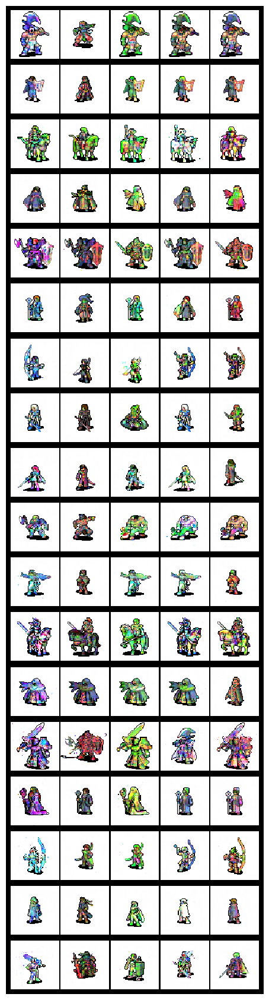


Row order:
01. feminine | barbarian
02. feminine | bard
03. feminine | cavalry
04. feminine | cleric
05. feminine | knight
06. feminine | mage
07. feminine | ranger
08. feminine | rogue
09. feminine | warrior
10. masculine | barbarian
11. masculine | bard
12. masculine | cavalry
13. masculine | cleric
14. masculine | knight
15. masculine | mage
16. masculine | ranger
17. masculine | rogue
18. masculine | warrior


In [9]:
# visualize all conditions

import math
import torch
import matplotlib.pyplot as plt
import torchvision.utils as vutils

def build_cond(g_idx, h_idx, p_idx):
    """Собирает cond_tensor размера cond_dim (gender + hero + palette)."""
    gender_oh  = one_hot(g_idx, len(gender_classes))
    hero_oh    = one_hot(h_idx, len(hero_classes))
    palette_oh = one_hot(p_idx, len(palette_classes))
    cond_vec = np.concatenate([gender_oh, hero_oh, palette_oh]).astype(np.float32)
    return torch.from_numpy(cond_vec)

@torch.no_grad()
def generate_all_grids(G_ema, nz=128, device="cuda", nrow=5):
    """
    Делает сетки:
    - для каждого gender и hero_class: ряд из palette вариантов
    Сохраняет PNG в папку samples и показывает в ноуте.
    """
    G_ema.eval()

    rows_imgs = []
    titles = []

    for g_name in gender_classes:
        g_idx = gender_to_idx[g_name]

        for h_name in hero_classes:
            h_idx = hero_to_idx[h_name]

            # для одной пары (gender, hero) генерим все палитры
            conds = []
            for p_name in palette_classes:
                p_idx = palette_to_idx[p_name]
                conds.append(build_cond(g_idx, h_idx, p_idx))

            conds = torch.stack(conds).to(device)  # [P, cond_dim]
            z = torch.randn(len(palette_classes), nz, device=device)

            fake = G_ema(z, conds).cpu()          # [-1,1]
            fake = denorm(fake)                  # -> [0,1]

            grid = vutils.make_grid(fake, nrow=nrow, padding=2)  # 1 ряд: все палитры
            rows_imgs.append(grid)
            titles.append(f"{g_name} | {h_name}")

    # rows_imgs: список тензоров [3,H,W], каждый — ряд палитр
    big_grid = torch.stack(rows_imgs)  # [Nrows,3,H,W]
    big_grid = big_grid.reshape(-1, *big_grid.shape[1:])  # просто пачка

    # делаем вертикальную сетку
    final_grid = vutils.make_grid(big_grid, nrow=1, padding=4)
    out_path = SAMPLES_DIR / f"ALL_CONDITIONS_grid.png"
    vutils.save_image(final_grid, out_path)

    print("Saved full conditions grid to:", out_path)

    # покажем в ноуте 
    plt.figure(figsize=(8, max(8, len(rows_imgs)*1.2)))
    plt.axis("off")
    plt.imshow(final_grid.permute(1,2,0).numpy(), interpolation="nearest")
    plt.show()

    print("\nRow order:")
    for i, t in enumerate(titles):
        print(f"{i+1:02d}. {t}")

generate_all_grids(G_ema, nz=nz, device=device, nrow=len(palette_classes))


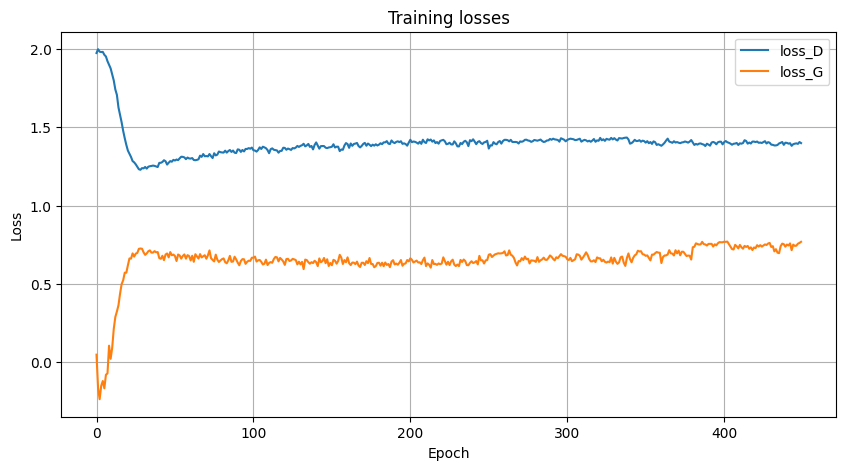

In [10]:
# plot losses 

import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(losses_D, label="loss_D")
plt.plot(losses_G, label="loss_G")
plt.title("Training losses")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


## v5 — FiLM/AdaLIN, более глубокий G
 
Палитра стала гармоничнее.
 
Но деталей всё ещё мало.
 
v6 — bbox-crop + FiLM + DiffAugment (light)

In [1]:
# config & run dirs for strong GAN v5 

from datetime import datetime
from pathlib import Path
import sys, json, random, time

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils import spectral_norm
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

import numpy as np
import pandas as pd
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms as T
from PIL import Image

PROJECT_ROOT = Path(r"D:\ML\LS\Deep_learning\GAN\hero_portrait_generator")
DATA_DIR = PROJECT_ROOT / "data"
SRC_DIR = PROJECT_ROOT / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.append(str(SRC_DIR))

from utils.config import DATASET_CONFIG, CDC_GAN_CONFIG
print("DATASET_CONFIG:", DATASET_CONFIG)
print("CDC_GAN_CONFIG:", CDC_GAN_CONFIG)

# гиперпараметры v5 
nz = 128
ngf = 128
ndf = 128
image_size = 64

num_epochs = 400
batch_size = 64

# TTUR
lrG = 2e-4
lrD = 5e-5

# betas для hinge+SN
beta1, beta2 = 0.0, 0.9

# EMA
ema_decay = 0.999

# R1
r1_gamma = 5.0
r1_every = 32

# Instance noise
noise_sigma_start = 0.15
noise_sigma_end   = 0.0
noise_anneal_epochs = 120

# веса ACGAN
lambda_cls_D = 1.0   # классификация на D (real)
lambda_cls_G = 1.0   # классификация на G (fake)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

# мэппинги и cond_dim 
with open(DATA_DIR / "label_mappings.json", "r", encoding="utf-8") as f:
    label_mappings = json.load(f)

gender_classes   = label_mappings["gender_classes"]
gender_to_idx    = label_mappings["gender_to_idx"]

hero_classes     = label_mappings["hero_classes"]
hero_to_idx      = label_mappings["hero_to_idx"]

palette_classes  = label_mappings["palette_classes"]
palette_to_idx   = label_mappings["palette_to_idx"]

print("gender:", gender_classes)
print("hero:", hero_classes)
print("palette:", palette_classes)

n_gender  = len(gender_classes)
n_hero    = len(hero_classes)
n_palette = len(palette_classes)

cond_dim = n_gender + n_hero + n_palette
print("cond_dim =", cond_dim)

RUN_ID = datetime.now().strftime("%Y%m%d-%H%M%S")
ARTIFACTS_DIR = PROJECT_ROOT / "artifacts_gan"
SAMPLES_DIR = ARTIFACTS_DIR / "samples" / RUN_ID
CKPT_DIR = ARTIFACTS_DIR / "checkpoints" / RUN_ID

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
CKPT_DIR.mkdir(parents=True, exist_ok=True)

print("RUN_ID:", RUN_ID)
print("SAMPLES_DIR:", SAMPLES_DIR)
print("CKPT_DIR:", CKPT_DIR)

def seed_all(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = True

seed_all(42)


DATASET_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'num_gender_classes': 2, 'num_hero_classes': 9, 'num_palette_classes': 5}
CDC_GAN_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'nz': 128, 'ngf': 64, 'ndf': 64}
device: cuda
gender: ['feminine', 'masculine']
hero: ['barbarian', 'bard', 'cavalry', 'cleric', 'knight', 'mage', 'ranger', 'rogue', 'warrior']
palette: ['cool', 'dark', 'muted', 'neutral', 'warm']
cond_dim = 16
RUN_ID: 20251124-002831
SAMPLES_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831
CKPT_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-002831


In [2]:
# ResBlocks + Self-Attention

class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.query = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.key   = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.value = spectral_norm(nn.Conv2d(in_channels, in_channels, 1))
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        B, C, H, W = x.size()
        q = self.query(x).view(B, -1, H * W).permute(0, 2, 1)
        k = self.key(x).view(B, -1, H * W)
        attn = torch.softmax(torch.bmm(q, k), dim=-1)

        v = self.value(x).view(B, C, -1)
        out = torch.bmm(v, attn.permute(0, 2, 1)).view(B, C, H, W)
        return self.gamma * out + x


class GenResBlock(nn.Module):
    """ResBlock генератора (без FiLM внутри — FiLM добавим снаружи)."""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode="nearest")

        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False)
        self.bn1   = nn.BatchNorm2d(out_channels)

        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False)
        self.bn2   = nn.BatchNorm2d(out_channels)

        self.conv_skip = nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False)

    def forward(self, x):
        skip = self.upsample(x)
        skip = self.conv_skip(skip)

        out = self.upsample(x)
        out = self.bn1(self.conv1(out))
        out = F.relu(out, inplace=False)

        out = self.bn2(self.conv2(out))
        out = F.relu(out + skip, inplace=False)
        return out


class DiscResBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample=True):
        super().__init__()
        self.downsample = downsample

        self.conv1 = spectral_norm(nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False))
        self.conv2 = spectral_norm(nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False))
        self.conv_skip = spectral_norm(nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False))

        if downsample:
            self.avgpool = nn.AvgPool2d(2)

    def forward(self, x):
        skip = x
        if self.downsample:
            skip = self.avgpool(skip)
        skip = self.conv_skip(skip)

        out = F.leaky_relu(x, 0.2, inplace=False)
        out = self.conv1(out)
        out = F.leaky_relu(out, 0.2, inplace=False)
        out = self.conv2(out)

        if self.downsample:
            out = self.avgpool(out)

        return out + skip


In [3]:
# FiLM helpers

class FiLM(nn.Module):
    """
    Делает gamma/beta из cond и применяет к тензору (B,C,H,W):
    y = x * (1 + gamma) + beta
    """
    def __init__(self, cond_dim, channels):
        super().__init__()
        self.to_gamma = nn.Linear(cond_dim, channels)
        self.to_beta  = nn.Linear(cond_dim, channels)

        # нули на старте, чтобы не ломать обучение
        nn.init.zeros_(self.to_gamma.weight); nn.init.zeros_(self.to_gamma.bias)
        nn.init.zeros_(self.to_beta.weight);  nn.init.zeros_(self.to_beta.bias)

    def forward(self, x, cond):
        g = self.to_gamma(cond).view(cond.size(0), -1, 1, 1)
        b = self.to_beta(cond).view(cond.size(0), -1, 1, 1)
        return x * (1.0 + g) + b


In [4]:
# Strong Conditional Generator v5 (FiLM)

class StrongConditionalGeneratorV5(nn.Module):
    def __init__(self, nz, cond_dim, ngf=128, nc=3):
        super().__init__()
        self.nz = nz
        self.cond_dim = cond_dim

        in_dim = nz + cond_dim
        self.fc = nn.Linear(in_dim, ngf * 8 * 4 * 4)

        self.b1 = GenResBlock(ngf*8, ngf*8)
        self.f1 = FiLM(cond_dim, ngf*8)

        self.b2 = GenResBlock(ngf*8, ngf*4)
        self.f2 = FiLM(cond_dim, ngf*4)

        self.b3 = GenResBlock(ngf*4, ngf*2)
        self.f3 = FiLM(cond_dim, ngf*2)

        self.attn = SelfAttention(ngf*2)

        self.b4 = GenResBlock(ngf*2, ngf)
        self.f4 = FiLM(cond_dim, ngf)

        self.out = nn.Conv2d(ngf, nc, 3,1,1, bias=False)

    def forward(self, z, cond):
        x = torch.cat([z, cond], dim=1)
        x = self.fc(x).view(x.size(0), -1, 4, 4)

        x = self.b1(x); x = self.f1(x, cond)
        x = self.b2(x); x = self.f2(x, cond)
        x = self.b3(x); x = self.f3(x, cond)
        x = self.attn(x)
        x = self.b4(x); x = self.f4(x, cond)

        return torch.tanh(self.out(x))


In [5]:
# Projection + ACGAN Discriminator v5

class StrongConditionalDiscriminatorV5(nn.Module):
    def __init__(self, cond_dim, n_gender, n_hero, n_palette, ndf=128, nc=3):
        super().__init__()
        self.cond_dim = cond_dim
        self.n_gender = n_gender
        self.n_hero = n_hero
        self.n_palette = n_palette

        in_channels = nc  # cond не конкатим картой, т.к. есть projection

        self.b1 = DiscResBlock(in_channels, ndf, downsample=True)
        self.b2 = DiscResBlock(ndf, ndf*2, downsample=True)
        self.b3 = DiscResBlock(ndf*2, ndf*4, downsample=True)
        self.b4 = DiscResBlock(ndf*4, ndf*8, downsample=True)

        self.feat_dim = ndf*8

        # adv head (hinge)
        self.adv = spectral_norm(nn.Linear(self.feat_dim, 1))

        # projection embedding для cond
        self.cond_proj = spectral_norm(nn.Linear(cond_dim, self.feat_dim))

        # ACGAN heads
        self.cls_gender  = spectral_norm(nn.Linear(self.feat_dim, n_gender))
        self.cls_hero    = spectral_norm(nn.Linear(self.feat_dim, n_hero))
        self.cls_palette = spectral_norm(nn.Linear(self.feat_dim, n_palette))

    def forward(self, img, cond, return_logits=False):
        x = img
        x = self.b1(x); x = self.b2(x); x = self.b3(x); x = self.b4(x)

        # global sum pool
        feat = x.sum(dim=[2,3])  # [B, feat_dim]

        adv_score = self.adv(feat).view(-1)  # [B]

        # projection term
        cond_emb = self.cond_proj(cond)      # [B, feat_dim]
        proj = (feat * cond_emb).sum(dim=1)  # [B]

        score = adv_score + proj

        if not return_logits:
            return score

        lg = self.cls_gender(feat)
        lh = self.cls_hero(feat)
        lp = self.cls_palette(feat)
        return score, lg, lh, lp


In [6]:
# Dataset v5

def one_hot(index: int, num_classes: int) -> np.ndarray:
    vec = np.zeros(num_classes, dtype=np.float32)
    vec[index] = 1.0
    return vec

class HeroPortraitDatasetV5(Dataset):
    def __init__(self, df: pd.DataFrame, project_root: Path, image_size: int = 64, normalize: bool = True):
        self.df = df.reset_index(drop=True)
        self.project_root = Path(project_root)

        tfs = [
            T.Resize((image_size, image_size), interpolation=T.InterpolationMode.NEAREST),
            T.ToTensor(),
        ]
        if normalize:
            tfs.append(T.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5]))
        self.transform = T.Compose(tfs)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx: int):
        row = self.df.iloc[idx]
        img_path = (self.project_root / row["rel_path"]).resolve()

        img = Image.open(img_path).convert("RGBA")
        if img.mode == "RGBA":
            bg = Image.new("RGBA", img.size, (255,255,255,255))
            img = Image.alpha_composite(bg, img).convert("RGB")
        else:
            img = img.convert("RGB")

        img_tensor = self.transform(img)

        g_idx = int(row["gender_idx"])
        h_idx = int(row["hero_idx"])
        p_idx = int(row["palette_idx"])

        cond_vec = np.concatenate([
            one_hot(g_idx, n_gender),
            one_hot(h_idx, n_hero),
            one_hot(p_idx, n_palette),
        ]).astype(np.float32)

        cond_tensor = torch.from_numpy(cond_vec)

        return {
            "image": img_tensor,
            "cond": cond_tensor,
            "g_idx": g_idx,
            "h_idx": h_idx,
            "p_idx": p_idx,
        }

train_df = pd.read_csv(DATA_DIR / "sprites_train.csv")
val_df   = pd.read_csv(DATA_DIR / "sprites_val.csv")
FULL_DF = pd.concat([train_df, val_df], ignore_index=True)

dataset = HeroPortraitDatasetV5(FULL_DF, project_root=PROJECT_ROOT, image_size=image_size)

train_loader = DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=0,
    pin_memory=False,
    drop_last=True
)

print("dataset size:", len(dataset))
print("batches:", len(train_loader))


dataset size: 7596
batches: 118


In [7]:
# helpers

def denorm(img_batch):
    return (img_batch * 0.5) + 0.5

def add_instance_noise(x, epoch):
    if epoch >= noise_anneal_epochs:
        sigma = noise_sigma_end
    else:
        t = epoch / noise_anneal_epochs
        sigma = noise_sigma_start * (1 - t) + noise_sigma_end * t
    if sigma <= 0:
        return x
    return x + torch.randn_like(x) * sigma

def r1_penalty(d_out, x):
    grad = torch.autograd.grad(
        outputs=d_out.sum(), inputs=x,
        create_graph=True, retain_graph=True, only_inputs=True
    )[0]
    return grad.view(grad.size(0), -1).pow(2).sum(dim=1).mean()

@torch.no_grad()
def update_ema(G, G_ema, decay=0.999):
    for p, p_ema in zip(G.parameters(), G_ema.parameters()):
        p_ema.data.mul_(decay).add_(p.data, alpha=1.0 - decay)
    # BN buffers
    for b, b_ema in zip(G.buffers(), G_ema.buffers()):
        b_ema.copy_(b)

def save_sample_images(epoch, G_ema, fixed_noise, fixed_conds, samples_dir: Path):
    G_ema.eval()
    with torch.no_grad():
        fake = G_ema(fixed_noise, fixed_conds).detach().cpu()
    fake_denorm = denorm(fake)

    grid = vutils.make_grid(fake_denorm, nrow=4, padding=2)
    out_path = samples_dir / f"epoch_{epoch:03d}.png"

    plt.figure(figsize=(6, 6))
    plt.axis("off")
    plt.imshow(grid.permute(1, 2, 0).numpy(), interpolation="nearest")
    plt.tight_layout()
    plt.savefig(out_path, dpi=150)
    plt.close()

    print(f"[samples] Saved: {out_path}")


In [8]:
# init models v5

G = StrongConditionalGeneratorV5(nz=nz, cond_dim=cond_dim, ngf=ngf, nc=3).to(device)
D = StrongConditionalDiscriminatorV5(cond_dim=cond_dim,
                                    n_gender=n_gender, n_hero=n_hero, n_palette=n_palette,
                                    ndf=ndf, nc=3).to(device)

# EMA
G_ema = StrongConditionalGeneratorV5(nz=nz, cond_dim=cond_dim, ngf=ngf, nc=3).to(device)
G_ema.load_state_dict(G.state_dict())
G_ema.eval()
for p in G_ema.parameters():
    p.requires_grad_(False)

print("Params G:", sum(p.numel() for p in G.parameters()))
print("Params D:", sum(p.numel() for p in D.parameters()))

optimizerG = torch.optim.Adam(G.parameters(), lr=lrG, betas=(beta1, beta2))
optimizerD = torch.optim.Adam(D.parameters(), lr=lrD, betas=(beta1, beta2))

schedulerG = torch.optim.lr_scheduler.MultiStepLR(optimizerG, milestones=[260, 400], gamma=0.5)
schedulerD = torch.optim.lr_scheduler.MultiStepLR(optimizerD, milestones=[260, 400], gamma=0.5)

fixed_batch = next(iter(train_loader))
fixed_conds = fixed_batch["cond"][:16].to(device)
fixed_noise = torch.randn(16, nz, device=device)

print("fixed shapes:", fixed_noise.shape, fixed_conds.shape)


Params G: 32435137
Params D: 19453713
fixed shapes: torch.Size([16, 128]) torch.Size([16, 16])


In [9]:
# training loop v5 (hinge + projection + ACGAN + FiLM + R1 + noise + EMA)

losses_D, losses_G = [], []
global_step = 0

ce_gender  = nn.CrossEntropyLoss()
ce_hero    = nn.CrossEntropyLoss()
ce_palette = nn.CrossEntropyLoss()

for epoch in range(1, num_epochs + 1):
    G.train(); D.train()
    epoch_loss_D, epoch_loss_G = 0.0, 0.0
    num_batches = 0

    pbar = tqdm(train_loader, desc=f"Epoch [{epoch}/{num_epochs}]", leave=False)

    for batch in pbar:
        real = batch["image"].to(device)
        cond = batch["cond"].to(device)
        g_idx = batch["g_idx"].to(device)
        h_idx = batch["h_idx"].to(device)
        p_idx = batch["p_idx"].to(device)
        B = real.size(0)

        # D step 
        optimizerD.zero_grad(set_to_none=True)

        real.requires_grad_(True)
        real_noisy = add_instance_noise(real, epoch)
        real_score, real_lg, real_lh, real_lp = D(real_noisy, cond, return_logits=True)
        loss_D_real = torch.relu(1.0 - real_score).mean()

        z = torch.randn(B, nz, device=device)
        fake = G(z, cond).detach()
        fake_noisy = add_instance_noise(fake, epoch)
        fake_score = D(fake_noisy, cond)
        loss_D_fake = torch.relu(1.0 + fake_score).mean()

        loss_D_adv = loss_D_real + loss_D_fake

        # R1 по adv (real)
        if global_step % r1_every == 0:
            r1 = r1_penalty(real_score, real)
            loss_D_adv = loss_D_adv + (r1_gamma / 2.0) * r1

        # ACGAN классификация на реальных
        loss_D_cls = (
            ce_gender(real_lg, g_idx) +
            ce_hero(real_lh, h_idx) +
            ce_palette(real_lp, p_idx)
        )

        loss_D = loss_D_adv + lambda_cls_D * loss_D_cls
        loss_D.backward()
        optimizerD.step()
        real.requires_grad_(False)

        # G step
        optimizerG.zero_grad(set_to_none=True)

        z = torch.randn(B, nz, device=device)
        fake = G(z, cond)
        fake_score, fake_lg, fake_lh, fake_lp = D(fake, cond, return_logits=True)

        loss_G_adv = -fake_score.mean()

        # ACGAN классификация на фейках (push condition)
        loss_G_cls = (
            ce_gender(fake_lg, g_idx) +
            ce_hero(fake_lh, h_idx) +
            ce_palette(fake_lp, p_idx)
        )

        loss_G = loss_G_adv + lambda_cls_G * loss_G_cls
        loss_G.backward()
        optimizerG.step()

        update_ema(G, G_ema, ema_decay)

        epoch_loss_D += loss_D.item()
        epoch_loss_G += loss_G.item()
        num_batches += 1
        global_step += 1

        pbar.set_postfix(loss_D=f"{loss_D.item():.3f}", loss_G=f"{loss_G.item():.3f}")

    epoch_loss_D /= num_batches
    epoch_loss_G /= num_batches
    losses_D.append(epoch_loss_D)
    losses_G.append(epoch_loss_G)

    schedulerD.step()
    schedulerG.step()

    print(f"[Epoch {epoch:03d}/{num_epochs}] mean loss_D: {epoch_loss_D:.4f} | mean loss_G: {epoch_loss_G:.4f}")

    if epoch % 10 == 0 or epoch == 1:
        save_sample_images(epoch, G_ema, fixed_noise, fixed_conds, SAMPLES_DIR)

    if epoch % 50 == 0 or epoch == num_epochs:
        ckpt_path = CKPT_DIR / f"hero_v5_epoch_{epoch:03d}.pth"
        torch.save(
            {
                "epoch": epoch,
                "G_state_dict": G.state_dict(),
                "G_ema_state_dict": G_ema.state_dict(),
                "D_state_dict": D.state_dict(),
                "optimizerG_state_dict": optimizerG.state_dict(),
                "optimizerD_state_dict": optimizerD.state_dict(),
                "losses_G": losses_G,
                "losses_D": losses_D,
                "config": {
                    "nz": nz, "cond_dim": cond_dim,
                    "ngf": ngf, "ndf": ndf,
                    "image_size": image_size,
                    "lrG": lrG, "lrD": lrD,
                    "betas": (beta1, beta2),
                    "ema_decay": ema_decay,
                    "r1_gamma": r1_gamma, "r1_every": r1_every,
                    "noise_sigma_start": noise_sigma_start,
                    "noise_anneal_epochs": noise_anneal_epochs,
                    "lambda_cls_D": lambda_cls_D,
                    "lambda_cls_G": lambda_cls_G,
                    "run_id": RUN_ID,
                },
            },
            ckpt_path
        )
        print(f"[ckpt] Saved: {ckpt_path}")


Epoch [1/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 001/400] mean loss_D: 6.1456 | mean loss_G: 3.6737
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_001.png


Epoch [2/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 002/400] mean loss_D: 5.1767 | mean loss_G: 3.2658


Epoch [3/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 003/400] mean loss_D: 4.9210 | mean loss_G: 2.9492


Epoch [4/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 004/400] mean loss_D: 4.7340 | mean loss_G: 2.8115


Epoch [5/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 005/400] mean loss_D: 4.5888 | mean loss_G: 2.6601


Epoch [6/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 006/400] mean loss_D: 4.5087 | mean loss_G: 2.5323


Epoch [7/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 007/400] mean loss_D: 4.3919 | mean loss_G: 2.4102


Epoch [8/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 008/400] mean loss_D: 4.2793 | mean loss_G: 2.3061


Epoch [9/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 009/400] mean loss_D: 4.2006 | mean loss_G: 2.2280


Epoch [10/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 010/400] mean loss_D: 4.0724 | mean loss_G: 2.0855
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_010.png


Epoch [11/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 011/400] mean loss_D: 3.9816 | mean loss_G: 1.9513


Epoch [12/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 012/400] mean loss_D: 3.8763 | mean loss_G: 1.8521


Epoch [13/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 013/400] mean loss_D: 3.8240 | mean loss_G: 1.7652


Epoch [14/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 014/400] mean loss_D: 3.7015 | mean loss_G: 1.7090


Epoch [15/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 015/400] mean loss_D: 3.6235 | mean loss_G: 1.6489


Epoch [16/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 016/400] mean loss_D: 3.5202 | mean loss_G: 1.5854


Epoch [17/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 017/400] mean loss_D: 3.4551 | mean loss_G: 1.5327


Epoch [18/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 018/400] mean loss_D: 3.3580 | mean loss_G: 1.4863


Epoch [19/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 019/400] mean loss_D: 3.3105 | mean loss_G: 1.4463


Epoch [20/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 020/400] mean loss_D: 3.2172 | mean loss_G: 1.4371
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_020.png


Epoch [21/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 021/400] mean loss_D: 3.1452 | mean loss_G: 1.4102


Epoch [22/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 022/400] mean loss_D: 3.0883 | mean loss_G: 1.3533


Epoch [23/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 023/400] mean loss_D: 3.0223 | mean loss_G: 1.3503


Epoch [24/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 024/400] mean loss_D: 2.9759 | mean loss_G: 1.2790


Epoch [25/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 025/400] mean loss_D: 2.9171 | mean loss_G: 1.2418


Epoch [26/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 026/400] mean loss_D: 2.8756 | mean loss_G: 1.2331


Epoch [27/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 027/400] mean loss_D: 2.7933 | mean loss_G: 1.2503


Epoch [28/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 028/400] mean loss_D: 2.7544 | mean loss_G: 1.2256


Epoch [29/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 029/400] mean loss_D: 2.7261 | mean loss_G: 1.1786


Epoch [30/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 030/400] mean loss_D: 2.6432 | mean loss_G: 1.1466
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_030.png


Epoch [31/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 031/400] mean loss_D: 2.5982 | mean loss_G: 1.1236


Epoch [32/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 032/400] mean loss_D: 2.5485 | mean loss_G: 1.1402


Epoch [33/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 033/400] mean loss_D: 2.5175 | mean loss_G: 1.1066


Epoch [34/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 034/400] mean loss_D: 2.4817 | mean loss_G: 1.0869


Epoch [35/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 035/400] mean loss_D: 2.4177 | mean loss_G: 1.0975


Epoch [36/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 036/400] mean loss_D: 2.3496 | mean loss_G: 1.0937


Epoch [37/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 037/400] mean loss_D: 2.3430 | mean loss_G: 1.0786


Epoch [38/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 038/400] mean loss_D: 2.2747 | mean loss_G: 1.0796


Epoch [39/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 039/400] mean loss_D: 2.2069 | mean loss_G: 1.0888


Epoch [40/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 040/400] mean loss_D: 2.1915 | mean loss_G: 1.0682
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_040.png


Epoch [41/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 041/400] mean loss_D: 2.1663 | mean loss_G: 1.0899


Epoch [42/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 042/400] mean loss_D: 2.0879 | mean loss_G: 1.0744


Epoch [43/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 043/400] mean loss_D: 2.0957 | mean loss_G: 1.0148


Epoch [44/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 044/400] mean loss_D: 2.0553 | mean loss_G: 1.0096


Epoch [45/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 045/400] mean loss_D: 2.0170 | mean loss_G: 1.0087


Epoch [46/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 046/400] mean loss_D: 2.0031 | mean loss_G: 1.0190


Epoch [47/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 047/400] mean loss_D: 1.9921 | mean loss_G: 0.9892


Epoch [48/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 048/400] mean loss_D: 1.9402 | mean loss_G: 0.9937


Epoch [49/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 049/400] mean loss_D: 1.9249 | mean loss_G: 0.9499


Epoch [50/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 050/400] mean loss_D: 1.8881 | mean loss_G: 0.9947
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_050.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-002831\hero_v5_epoch_050.pth


Epoch [51/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 051/400] mean loss_D: 1.8863 | mean loss_G: 0.9272


Epoch [52/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 052/400] mean loss_D: 1.8754 | mean loss_G: 0.9304


Epoch [53/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 053/400] mean loss_D: 1.8535 | mean loss_G: 0.9144


Epoch [54/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 054/400] mean loss_D: 1.8008 | mean loss_G: 0.9349


Epoch [55/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 055/400] mean loss_D: 1.7918 | mean loss_G: 0.9660


Epoch [56/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 056/400] mean loss_D: 1.7964 | mean loss_G: 0.9038


Epoch [57/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 057/400] mean loss_D: 1.7739 | mean loss_G: 0.9567


Epoch [58/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 058/400] mean loss_D: 1.7456 | mean loss_G: 0.8917


Epoch [59/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 059/400] mean loss_D: 1.7485 | mean loss_G: 0.8960


Epoch [60/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 060/400] mean loss_D: 1.7110 | mean loss_G: 0.8773
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_060.png


Epoch [61/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 061/400] mean loss_D: 1.7053 | mean loss_G: 0.9304


Epoch [62/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 062/400] mean loss_D: 1.6834 | mean loss_G: 0.9239


Epoch [63/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 063/400] mean loss_D: 1.6796 | mean loss_G: 0.8759


Epoch [64/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 064/400] mean loss_D: 1.6594 | mean loss_G: 0.9175


Epoch [65/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 065/400] mean loss_D: 1.6507 | mean loss_G: 0.8867


Epoch [66/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 066/400] mean loss_D: 1.6450 | mean loss_G: 0.8661


Epoch [67/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 067/400] mean loss_D: 1.6073 | mean loss_G: 0.9185


Epoch [68/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 068/400] mean loss_D: 1.6190 | mean loss_G: 0.9088


Epoch [69/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 069/400] mean loss_D: 1.5734 | mean loss_G: 0.8938


Epoch [70/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 070/400] mean loss_D: 1.5688 | mean loss_G: 0.8880
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_070.png


Epoch [71/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 071/400] mean loss_D: 1.5516 | mean loss_G: 0.9196


Epoch [72/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 072/400] mean loss_D: 1.5802 | mean loss_G: 0.8668


Epoch [73/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 073/400] mean loss_D: 1.5211 | mean loss_G: 0.8928


Epoch [74/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 074/400] mean loss_D: 1.5234 | mean loss_G: 0.9107


Epoch [75/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 075/400] mean loss_D: 1.5278 | mean loss_G: 0.8740


Epoch [76/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 076/400] mean loss_D: 1.5276 | mean loss_G: 0.8837


Epoch [77/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 077/400] mean loss_D: 1.5345 | mean loss_G: 0.8589


Epoch [78/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 078/400] mean loss_D: 1.5125 | mean loss_G: 0.8903


Epoch [79/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 079/400] mean loss_D: 1.5058 | mean loss_G: 0.8776


Epoch [80/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 080/400] mean loss_D: 1.4950 | mean loss_G: 0.9014
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_080.png


Epoch [81/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 081/400] mean loss_D: 1.4654 | mean loss_G: 0.9037


Epoch [82/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 082/400] mean loss_D: 1.4742 | mean loss_G: 0.9139


Epoch [83/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 083/400] mean loss_D: 1.4360 | mean loss_G: 0.9356


Epoch [84/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 084/400] mean loss_D: 1.4436 | mean loss_G: 0.9383


Epoch [85/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 085/400] mean loss_D: 1.4126 | mean loss_G: 0.9017


Epoch [86/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 086/400] mean loss_D: 1.4327 | mean loss_G: 0.9287


Epoch [87/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 087/400] mean loss_D: 1.4047 | mean loss_G: 0.9428


Epoch [88/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 088/400] mean loss_D: 1.4060 | mean loss_G: 0.9884


Epoch [89/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 089/400] mean loss_D: 1.3974 | mean loss_G: 0.9365


Epoch [90/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 090/400] mean loss_D: 1.3786 | mean loss_G: 0.9405
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_090.png


Epoch [91/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 091/400] mean loss_D: 1.3673 | mean loss_G: 1.0130


Epoch [92/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 092/400] mean loss_D: 1.3346 | mean loss_G: 0.9892


Epoch [93/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 093/400] mean loss_D: 1.3695 | mean loss_G: 0.9806


Epoch [94/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 094/400] mean loss_D: 1.3658 | mean loss_G: 1.0061


Epoch [95/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 095/400] mean loss_D: 1.3439 | mean loss_G: 0.9670


Epoch [96/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 096/400] mean loss_D: 1.3180 | mean loss_G: 0.9858


Epoch [97/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 097/400] mean loss_D: 1.3359 | mean loss_G: 0.9712


Epoch [98/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 098/400] mean loss_D: 1.3446 | mean loss_G: 0.9793


Epoch [99/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 099/400] mean loss_D: 1.3265 | mean loss_G: 0.9630


Epoch [100/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 100/400] mean loss_D: 1.2815 | mean loss_G: 1.0023
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_100.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-002831\hero_v5_epoch_100.pth


Epoch [101/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 101/400] mean loss_D: 1.2885 | mean loss_G: 0.9798


Epoch [102/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 102/400] mean loss_D: 1.2967 | mean loss_G: 1.0306


Epoch [103/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 103/400] mean loss_D: 1.2957 | mean loss_G: 0.9833


Epoch [104/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 104/400] mean loss_D: 1.3168 | mean loss_G: 0.9931


Epoch [105/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 105/400] mean loss_D: 1.3168 | mean loss_G: 0.9978


Epoch [106/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 106/400] mean loss_D: 1.2922 | mean loss_G: 1.0003


Epoch [107/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 107/400] mean loss_D: 1.2759 | mean loss_G: 1.0136


Epoch [108/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 108/400] mean loss_D: 1.2755 | mean loss_G: 1.0139


Epoch [109/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 109/400] mean loss_D: 1.2681 | mean loss_G: 1.0159


Epoch [110/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 110/400] mean loss_D: 1.2510 | mean loss_G: 1.0550
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_110.png


Epoch [111/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 111/400] mean loss_D: 1.2725 | mean loss_G: 1.0400


Epoch [112/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 112/400] mean loss_D: 1.2687 | mean loss_G: 1.0278


Epoch [113/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 113/400] mean loss_D: 1.2838 | mean loss_G: 1.0419


Epoch [114/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 114/400] mean loss_D: 1.2801 | mean loss_G: 1.0505


Epoch [115/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 115/400] mean loss_D: 1.2750 | mean loss_G: 1.0698


Epoch [116/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 116/400] mean loss_D: 1.2427 | mean loss_G: 1.0694


Epoch [117/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 117/400] mean loss_D: 1.2290 | mean loss_G: 1.0887


Epoch [118/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 118/400] mean loss_D: 1.2301 | mean loss_G: 1.0688


Epoch [119/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 119/400] mean loss_D: 1.2361 | mean loss_G: 1.0542


Epoch [120/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 120/400] mean loss_D: 1.2521 | mean loss_G: 1.0496
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_120.png


Epoch [121/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 121/400] mean loss_D: 1.2574 | mean loss_G: 1.0650


Epoch [122/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 122/400] mean loss_D: 1.2378 | mean loss_G: 1.1028


Epoch [123/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 123/400] mean loss_D: 1.2369 | mean loss_G: 1.0929


Epoch [124/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 124/400] mean loss_D: 1.2203 | mean loss_G: 1.0879


Epoch [125/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 125/400] mean loss_D: 1.2120 | mean loss_G: 1.0824


Epoch [126/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 126/400] mean loss_D: 1.2221 | mean loss_G: 1.0471


Epoch [127/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 127/400] mean loss_D: 1.2418 | mean loss_G: 1.0826


Epoch [128/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 128/400] mean loss_D: 1.2037 | mean loss_G: 1.0906


Epoch [129/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 129/400] mean loss_D: 1.2093 | mean loss_G: 1.0955


Epoch [130/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 130/400] mean loss_D: 1.2303 | mean loss_G: 1.0747
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_130.png


Epoch [131/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 131/400] mean loss_D: 1.2179 | mean loss_G: 1.1011


Epoch [132/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 132/400] mean loss_D: 1.2278 | mean loss_G: 1.0693


Epoch [133/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 133/400] mean loss_D: 1.2402 | mean loss_G: 1.0624


Epoch [134/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 134/400] mean loss_D: 1.2119 | mean loss_G: 1.0657


Epoch [135/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 135/400] mean loss_D: 1.2197 | mean loss_G: 1.0766


Epoch [136/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 136/400] mean loss_D: 1.2198 | mean loss_G: 1.0642


Epoch [137/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 137/400] mean loss_D: 1.1894 | mean loss_G: 1.0724


Epoch [138/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 138/400] mean loss_D: 1.2036 | mean loss_G: 1.0702


Epoch [139/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 139/400] mean loss_D: 1.2026 | mean loss_G: 1.0820


Epoch [140/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 140/400] mean loss_D: 1.1803 | mean loss_G: 1.0903
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_140.png


Epoch [141/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 141/400] mean loss_D: 1.2061 | mean loss_G: 1.0835


Epoch [142/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 142/400] mean loss_D: 1.2132 | mean loss_G: 1.0884


Epoch [143/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 143/400] mean loss_D: 1.2009 | mean loss_G: 1.0831


Epoch [144/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 144/400] mean loss_D: 1.1807 | mean loss_G: 1.0613


Epoch [145/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 145/400] mean loss_D: 1.1772 | mean loss_G: 1.0803


Epoch [146/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 146/400] mean loss_D: 1.1916 | mean loss_G: 1.0544


Epoch [147/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 147/400] mean loss_D: 1.1658 | mean loss_G: 1.0802


Epoch [148/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 148/400] mean loss_D: 1.1953 | mean loss_G: 1.0439


Epoch [149/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 149/400] mean loss_D: 1.1890 | mean loss_G: 1.0423


Epoch [150/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 150/400] mean loss_D: 1.1670 | mean loss_G: 1.0817
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_150.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-002831\hero_v5_epoch_150.pth


Epoch [151/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 151/400] mean loss_D: 1.1863 | mean loss_G: 1.0660


Epoch [152/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 152/400] mean loss_D: 1.1670 | mean loss_G: 1.0635


Epoch [153/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 153/400] mean loss_D: 1.1878 | mean loss_G: 1.0656


Epoch [154/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 154/400] mean loss_D: 1.1691 | mean loss_G: 1.0633


Epoch [155/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 155/400] mean loss_D: 1.1652 | mean loss_G: 1.0612


Epoch [156/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 156/400] mean loss_D: 1.1727 | mean loss_G: 1.0611


Epoch [157/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 157/400] mean loss_D: 1.1934 | mean loss_G: 1.0533


Epoch [158/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 158/400] mean loss_D: 1.1679 | mean loss_G: 1.0503


Epoch [159/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 159/400] mean loss_D: 1.1673 | mean loss_G: 1.0468


Epoch [160/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 160/400] mean loss_D: 1.1497 | mean loss_G: 1.0605
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_160.png


Epoch [161/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 161/400] mean loss_D: 1.1533 | mean loss_G: 1.0542


Epoch [162/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 162/400] mean loss_D: 1.1437 | mean loss_G: 1.0650


Epoch [163/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 163/400] mean loss_D: 1.1479 | mean loss_G: 1.0492


Epoch [164/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 164/400] mean loss_D: 1.1372 | mean loss_G: 1.0775


Epoch [165/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 165/400] mean loss_D: 1.1390 | mean loss_G: 1.0641


Epoch [166/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 166/400] mean loss_D: 1.1307 | mean loss_G: 1.0810


Epoch [167/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 167/400] mean loss_D: 1.1242 | mean loss_G: 1.0634


Epoch [168/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 168/400] mean loss_D: 1.1285 | mean loss_G: 1.0740


Epoch [169/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 169/400] mean loss_D: 1.1105 | mean loss_G: 1.0918


Epoch [170/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 170/400] mean loss_D: 1.0999 | mean loss_G: 1.1018
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_170.png


Epoch [171/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 171/400] mean loss_D: 1.1187 | mean loss_G: 1.0370


Epoch [172/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 172/400] mean loss_D: 1.1157 | mean loss_G: 1.0783


Epoch [173/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 173/400] mean loss_D: 1.0937 | mean loss_G: 1.0862


Epoch [174/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 174/400] mean loss_D: 1.1072 | mean loss_G: 1.0794


Epoch [175/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 175/400] mean loss_D: 1.0876 | mean loss_G: 1.0861


Epoch [176/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 176/400] mean loss_D: 1.1062 | mean loss_G: 1.0632


Epoch [177/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 177/400] mean loss_D: 1.1123 | mean loss_G: 1.0449


Epoch [178/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 178/400] mean loss_D: 1.1114 | mean loss_G: 1.0688


Epoch [179/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 179/400] mean loss_D: 1.0966 | mean loss_G: 1.0687


Epoch [180/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 180/400] mean loss_D: 1.1006 | mean loss_G: 1.0697
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_180.png


Epoch [181/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 181/400] mean loss_D: 1.1018 | mean loss_G: 1.0736


Epoch [182/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 182/400] mean loss_D: 1.1078 | mean loss_G: 1.0464


Epoch [183/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 183/400] mean loss_D: 1.0791 | mean loss_G: 1.0532


Epoch [184/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 184/400] mean loss_D: 1.0801 | mean loss_G: 1.0692


Epoch [185/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 185/400] mean loss_D: 1.1071 | mean loss_G: 1.0412


Epoch [186/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 186/400] mean loss_D: 1.1167 | mean loss_G: 1.0636


Epoch [187/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 187/400] mean loss_D: 1.0977 | mean loss_G: 1.0726


Epoch [188/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 188/400] mean loss_D: 1.1020 | mean loss_G: 1.0655


Epoch [189/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 189/400] mean loss_D: 1.1040 | mean loss_G: 1.0327


Epoch [190/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 190/400] mean loss_D: 1.0866 | mean loss_G: 1.0684
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_190.png


Epoch [191/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 191/400] mean loss_D: 1.0834 | mean loss_G: 1.0643


Epoch [192/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 192/400] mean loss_D: 1.0687 | mean loss_G: 1.0511


Epoch [193/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 193/400] mean loss_D: 1.0952 | mean loss_G: 1.0715


Epoch [194/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 194/400] mean loss_D: 1.0781 | mean loss_G: 1.0604


Epoch [195/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 195/400] mean loss_D: 1.0703 | mean loss_G: 1.0721


Epoch [196/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 196/400] mean loss_D: 1.0503 | mean loss_G: 1.0881


Epoch [197/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 197/400] mean loss_D: 1.0639 | mean loss_G: 1.0789


Epoch [198/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 198/400] mean loss_D: 1.0680 | mean loss_G: 1.0803


Epoch [199/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 199/400] mean loss_D: 1.0523 | mean loss_G: 1.0860


Epoch [200/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 200/400] mean loss_D: 1.0591 | mean loss_G: 1.0862
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_200.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-002831\hero_v5_epoch_200.pth


Epoch [201/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 201/400] mean loss_D: 1.0459 | mean loss_G: 1.0698


Epoch [202/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 202/400] mean loss_D: 1.0378 | mean loss_G: 1.1148


Epoch [203/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 203/400] mean loss_D: 1.0261 | mean loss_G: 1.1005


Epoch [204/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 204/400] mean loss_D: 1.0278 | mean loss_G: 1.1055


Epoch [205/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 205/400] mean loss_D: 1.0239 | mean loss_G: 1.0919


Epoch [206/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 206/400] mean loss_D: 1.0266 | mean loss_G: 1.0880


Epoch [207/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 207/400] mean loss_D: 1.0358 | mean loss_G: 1.0847


Epoch [208/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 208/400] mean loss_D: 1.0405 | mean loss_G: 1.0981


Epoch [209/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 209/400] mean loss_D: 1.0510 | mean loss_G: 1.0704


Epoch [210/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 210/400] mean loss_D: 1.0443 | mean loss_G: 1.0628
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_210.png


Epoch [211/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 211/400] mean loss_D: 1.0369 | mean loss_G: 1.0570


Epoch [212/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 212/400] mean loss_D: 1.0401 | mean loss_G: 1.0561


Epoch [213/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 213/400] mean loss_D: 1.0279 | mean loss_G: 1.0634


Epoch [214/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 214/400] mean loss_D: 1.0364 | mean loss_G: 1.0601


Epoch [215/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 215/400] mean loss_D: 1.0184 | mean loss_G: 1.0868


Epoch [216/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 216/400] mean loss_D: 1.0470 | mean loss_G: 1.0711


Epoch [217/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 217/400] mean loss_D: 1.0386 | mean loss_G: 1.0633


Epoch [218/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 218/400] mean loss_D: 1.0240 | mean loss_G: 1.0694


Epoch [219/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 219/400] mean loss_D: 1.0196 | mean loss_G: 1.0754


Epoch [220/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 220/400] mean loss_D: 1.0211 | mean loss_G: 1.0841
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_220.png


Epoch [221/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 221/400] mean loss_D: 1.0195 | mean loss_G: 1.1010


Epoch [222/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 222/400] mean loss_D: 1.0260 | mean loss_G: 1.0807


Epoch [223/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 223/400] mean loss_D: 1.0403 | mean loss_G: 1.0767


Epoch [224/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 224/400] mean loss_D: 1.0260 | mean loss_G: 1.0794


Epoch [225/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 225/400] mean loss_D: 1.0212 | mean loss_G: 1.0810


Epoch [226/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 226/400] mean loss_D: 1.0328 | mean loss_G: 1.0565


Epoch [227/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 227/400] mean loss_D: 1.0332 | mean loss_G: 1.0613


Epoch [228/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 228/400] mean loss_D: 1.0149 | mean loss_G: 1.0695


Epoch [229/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 229/400] mean loss_D: 1.0115 | mean loss_G: 1.0623


Epoch [230/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 230/400] mean loss_D: 1.0295 | mean loss_G: 1.0762
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_230.png


Epoch [231/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 231/400] mean loss_D: 1.0281 | mean loss_G: 1.0607


Epoch [232/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 232/400] mean loss_D: 1.0128 | mean loss_G: 1.0690


Epoch [233/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 233/400] mean loss_D: 1.0192 | mean loss_G: 1.0725


Epoch [234/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 234/400] mean loss_D: 1.0136 | mean loss_G: 1.0712


Epoch [235/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 235/400] mean loss_D: 1.0139 | mean loss_G: 1.0753


Epoch [236/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 236/400] mean loss_D: 1.0199 | mean loss_G: 1.0578


Epoch [237/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 237/400] mean loss_D: 1.0166 | mean loss_G: 1.0732


Epoch [238/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 238/400] mean loss_D: 1.0154 | mean loss_G: 1.0682


Epoch [239/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 239/400] mean loss_D: 1.0014 | mean loss_G: 1.0747


Epoch [240/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 240/400] mean loss_D: 0.9975 | mean loss_G: 1.0662
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_240.png


Epoch [241/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 241/400] mean loss_D: 1.0085 | mean loss_G: 1.0832


Epoch [242/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 242/400] mean loss_D: 0.9986 | mean loss_G: 1.0471


Epoch [243/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 243/400] mean loss_D: 0.9873 | mean loss_G: 1.0669


Epoch [244/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 244/400] mean loss_D: 1.0260 | mean loss_G: 1.0491


Epoch [245/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 245/400] mean loss_D: 1.0251 | mean loss_G: 1.0452


Epoch [246/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 246/400] mean loss_D: 1.0312 | mean loss_G: 1.0702


Epoch [247/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 247/400] mean loss_D: 1.0105 | mean loss_G: 1.0442


Epoch [248/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 248/400] mean loss_D: 1.0327 | mean loss_G: 1.0555


Epoch [249/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 249/400] mean loss_D: 1.0045 | mean loss_G: 1.0645


Epoch [250/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 250/400] mean loss_D: 1.0033 | mean loss_G: 1.0790
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_250.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-002831\hero_v5_epoch_250.pth


Epoch [251/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 251/400] mean loss_D: 0.9819 | mean loss_G: 1.0715


Epoch [252/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 252/400] mean loss_D: 0.9748 | mean loss_G: 1.0970


Epoch [253/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 253/400] mean loss_D: 0.9869 | mean loss_G: 1.0798


Epoch [254/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 254/400] mean loss_D: 0.9871 | mean loss_G: 1.0741


Epoch [255/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 255/400] mean loss_D: 0.9967 | mean loss_G: 1.0520


Epoch [256/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 256/400] mean loss_D: 0.9892 | mean loss_G: 1.0610


Epoch [257/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 257/400] mean loss_D: 0.9921 | mean loss_G: 1.0571


Epoch [258/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 258/400] mean loss_D: 0.9940 | mean loss_G: 1.0740


Epoch [259/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 259/400] mean loss_D: 1.0093 | mean loss_G: 1.0845


Epoch [260/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 260/400] mean loss_D: 0.9900 | mean loss_G: 1.0666
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_260.png


Epoch [261/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 261/400] mean loss_D: 0.9028 | mean loss_G: 1.0431


Epoch [262/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 262/400] mean loss_D: 0.9078 | mean loss_G: 1.0388


Epoch [263/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 263/400] mean loss_D: 0.9038 | mean loss_G: 1.0418


Epoch [264/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 264/400] mean loss_D: 0.9010 | mean loss_G: 1.0287


Epoch [265/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 265/400] mean loss_D: 0.9018 | mean loss_G: 1.0293


Epoch [266/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 266/400] mean loss_D: 0.9041 | mean loss_G: 1.0307


Epoch [267/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 267/400] mean loss_D: 0.9009 | mean loss_G: 1.0430


Epoch [268/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 268/400] mean loss_D: 0.9167 | mean loss_G: 1.0147


Epoch [269/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 269/400] mean loss_D: 0.9025 | mean loss_G: 1.0048


Epoch [270/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 270/400] mean loss_D: 0.9132 | mean loss_G: 1.0159
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_270.png


Epoch [271/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 271/400] mean loss_D: 0.9036 | mean loss_G: 1.0160


Epoch [272/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 272/400] mean loss_D: 0.9013 | mean loss_G: 1.0215


Epoch [273/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 273/400] mean loss_D: 0.8987 | mean loss_G: 1.0130


Epoch [274/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 274/400] mean loss_D: 0.8936 | mean loss_G: 1.0227


Epoch [275/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 275/400] mean loss_D: 0.8815 | mean loss_G: 1.0270


Epoch [276/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 276/400] mean loss_D: 0.8921 | mean loss_G: 1.0199


Epoch [277/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 277/400] mean loss_D: 0.8874 | mean loss_G: 1.0036


Epoch [278/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 278/400] mean loss_D: 0.8941 | mean loss_G: 1.0087


Epoch [279/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 279/400] mean loss_D: 0.9116 | mean loss_G: 1.0232


Epoch [280/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 280/400] mean loss_D: 0.9098 | mean loss_G: 1.0072
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_280.png


Epoch [281/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 281/400] mean loss_D: 0.9024 | mean loss_G: 1.0115


Epoch [282/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 282/400] mean loss_D: 0.8897 | mean loss_G: 1.0210


Epoch [283/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 283/400] mean loss_D: 0.8992 | mean loss_G: 1.0025


Epoch [284/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 284/400] mean loss_D: 0.8811 | mean loss_G: 1.0038


Epoch [285/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 285/400] mean loss_D: 0.8977 | mean loss_G: 0.9967


Epoch [286/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 286/400] mean loss_D: 0.8919 | mean loss_G: 1.0141


Epoch [287/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 287/400] mean loss_D: 0.8882 | mean loss_G: 1.0209


Epoch [288/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 288/400] mean loss_D: 0.8793 | mean loss_G: 1.0114


Epoch [289/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 289/400] mean loss_D: 0.9052 | mean loss_G: 1.0046


Epoch [290/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 290/400] mean loss_D: 0.8938 | mean loss_G: 1.0152
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_290.png


Epoch [291/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 291/400] mean loss_D: 0.8991 | mean loss_G: 1.0326


Epoch [292/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 292/400] mean loss_D: 0.8828 | mean loss_G: 1.0165


Epoch [293/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 293/400] mean loss_D: 0.8779 | mean loss_G: 1.0138


Epoch [294/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 294/400] mean loss_D: 0.8890 | mean loss_G: 1.0046


Epoch [295/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 295/400] mean loss_D: 0.8855 | mean loss_G: 1.0183


Epoch [296/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 296/400] mean loss_D: 0.8864 | mean loss_G: 1.0146


Epoch [297/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 297/400] mean loss_D: 0.8814 | mean loss_G: 1.0181


Epoch [298/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 298/400] mean loss_D: 0.8766 | mean loss_G: 1.0188


Epoch [299/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 299/400] mean loss_D: 0.8693 | mean loss_G: 1.0219


Epoch [300/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 300/400] mean loss_D: 0.8675 | mean loss_G: 1.0130
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_300.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-002831\hero_v5_epoch_300.pth


Epoch [301/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 301/400] mean loss_D: 0.8601 | mean loss_G: 1.0200


Epoch [302/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 302/400] mean loss_D: 0.8659 | mean loss_G: 1.0314


Epoch [303/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 303/400] mean loss_D: 0.8552 | mean loss_G: 1.0301


Epoch [304/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 304/400] mean loss_D: 0.8704 | mean loss_G: 1.0053


Epoch [305/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 305/400] mean loss_D: 0.8593 | mean loss_G: 1.0350


Epoch [306/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 306/400] mean loss_D: 0.8598 | mean loss_G: 1.0348


Epoch [307/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 307/400] mean loss_D: 0.8611 | mean loss_G: 1.0232


Epoch [308/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 308/400] mean loss_D: 0.8673 | mean loss_G: 1.0170


Epoch [309/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 309/400] mean loss_D: 0.8837 | mean loss_G: 1.0163


Epoch [310/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 310/400] mean loss_D: 0.8742 | mean loss_G: 1.0196
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_310.png


Epoch [311/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 311/400] mean loss_D: 0.8707 | mean loss_G: 0.9986


Epoch [312/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 312/400] mean loss_D: 0.8712 | mean loss_G: 1.0196


Epoch [313/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 313/400] mean loss_D: 0.8644 | mean loss_G: 1.0198


Epoch [314/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 314/400] mean loss_D: 0.8660 | mean loss_G: 1.0226


Epoch [315/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 315/400] mean loss_D: 0.8556 | mean loss_G: 1.0116


Epoch [316/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 316/400] mean loss_D: 0.8672 | mean loss_G: 1.0242


Epoch [317/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 317/400] mean loss_D: 0.8599 | mean loss_G: 1.0326


Epoch [318/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 318/400] mean loss_D: 0.8643 | mean loss_G: 1.0232


Epoch [319/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 319/400] mean loss_D: 0.8598 | mean loss_G: 1.0273


Epoch [320/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 320/400] mean loss_D: 0.8559 | mean loss_G: 1.0335
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_320.png


Epoch [321/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 321/400] mean loss_D: 0.8606 | mean loss_G: 1.0201


Epoch [322/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 322/400] mean loss_D: 0.8625 | mean loss_G: 1.0262


Epoch [323/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 323/400] mean loss_D: 0.8668 | mean loss_G: 1.0215


Epoch [324/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 324/400] mean loss_D: 0.8627 | mean loss_G: 1.0158


Epoch [325/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 325/400] mean loss_D: 0.8570 | mean loss_G: 1.0158


Epoch [326/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 326/400] mean loss_D: 0.8609 | mean loss_G: 1.0274


Epoch [327/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 327/400] mean loss_D: 0.8586 | mean loss_G: 1.0242


Epoch [328/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 328/400] mean loss_D: 0.8601 | mean loss_G: 1.0266


Epoch [329/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 329/400] mean loss_D: 0.8502 | mean loss_G: 1.0238


Epoch [330/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 330/400] mean loss_D: 0.8387 | mean loss_G: 1.0353
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_330.png


Epoch [331/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 331/400] mean loss_D: 0.8442 | mean loss_G: 1.0180


Epoch [332/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 332/400] mean loss_D: 0.8509 | mean loss_G: 1.0139


Epoch [333/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 333/400] mean loss_D: 0.8509 | mean loss_G: 1.0352


Epoch [334/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 334/400] mean loss_D: 0.8447 | mean loss_G: 1.0225


Epoch [335/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 335/400] mean loss_D: 0.8444 | mean loss_G: 1.0338


Epoch [336/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 336/400] mean loss_D: 0.8446 | mean loss_G: 1.0222


Epoch [337/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 337/400] mean loss_D: 0.8466 | mean loss_G: 1.0304


Epoch [338/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 338/400] mean loss_D: 0.8531 | mean loss_G: 1.0227


Epoch [339/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 339/400] mean loss_D: 0.8370 | mean loss_G: 1.0306


Epoch [340/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 340/400] mean loss_D: 0.8378 | mean loss_G: 1.0402
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_340.png


Epoch [341/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 341/400] mean loss_D: 0.8489 | mean loss_G: 1.0355


Epoch [342/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 342/400] mean loss_D: 0.8327 | mean loss_G: 1.0298


Epoch [343/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 343/400] mean loss_D: 0.8375 | mean loss_G: 1.0305


Epoch [344/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 344/400] mean loss_D: 0.8317 | mean loss_G: 1.0353


Epoch [345/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 345/400] mean loss_D: 0.8471 | mean loss_G: 1.0199


Epoch [346/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 346/400] mean loss_D: 0.8353 | mean loss_G: 1.0364


Epoch [347/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 347/400] mean loss_D: 0.8439 | mean loss_G: 1.0297


Epoch [348/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 348/400] mean loss_D: 0.8332 | mean loss_G: 1.0270


Epoch [349/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 349/400] mean loss_D: 0.8361 | mean loss_G: 1.0480


Epoch [350/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 350/400] mean loss_D: 0.8442 | mean loss_G: 1.0300
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_350.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-002831\hero_v5_epoch_350.pth


Epoch [351/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 351/400] mean loss_D: 0.8350 | mean loss_G: 1.0368


Epoch [352/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 352/400] mean loss_D: 0.8273 | mean loss_G: 1.0225


Epoch [353/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 353/400] mean loss_D: 0.8327 | mean loss_G: 1.0446


Epoch [354/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 354/400] mean loss_D: 0.8425 | mean loss_G: 1.0371


Epoch [355/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 355/400] mean loss_D: 0.8372 | mean loss_G: 1.0269


Epoch [356/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 356/400] mean loss_D: 0.8350 | mean loss_G: 1.0369


Epoch [357/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 357/400] mean loss_D: 0.8133 | mean loss_G: 1.0310


Epoch [358/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 358/400] mean loss_D: 0.8230 | mean loss_G: 1.0523


Epoch [359/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 359/400] mean loss_D: 0.8210 | mean loss_G: 1.0335


Epoch [360/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 360/400] mean loss_D: 0.8275 | mean loss_G: 1.0346
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_360.png


Epoch [361/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 361/400] mean loss_D: 0.8243 | mean loss_G: 1.0356


Epoch [362/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 362/400] mean loss_D: 0.8171 | mean loss_G: 1.0358


Epoch [363/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 363/400] mean loss_D: 0.8169 | mean loss_G: 1.0469


Epoch [364/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 364/400] mean loss_D: 0.8066 | mean loss_G: 1.0492


Epoch [365/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 365/400] mean loss_D: 0.8184 | mean loss_G: 1.0399


Epoch [366/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 366/400] mean loss_D: 0.8057 | mean loss_G: 1.0507


Epoch [367/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 367/400] mean loss_D: 0.8135 | mean loss_G: 1.0505


Epoch [368/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 368/400] mean loss_D: 0.8037 | mean loss_G: 1.0489


Epoch [369/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 369/400] mean loss_D: 0.8123 | mean loss_G: 1.0423


Epoch [370/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 370/400] mean loss_D: 0.8097 | mean loss_G: 1.0437
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_370.png


Epoch [371/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 371/400] mean loss_D: 0.8076 | mean loss_G: 1.0412


Epoch [372/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 372/400] mean loss_D: 0.8106 | mean loss_G: 1.0449


Epoch [373/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 373/400] mean loss_D: 0.8130 | mean loss_G: 1.0407


Epoch [374/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 374/400] mean loss_D: 0.8033 | mean loss_G: 1.0353


Epoch [375/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 375/400] mean loss_D: 0.8118 | mean loss_G: 1.0332


Epoch [376/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 376/400] mean loss_D: 0.8174 | mean loss_G: 1.0456


Epoch [377/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 377/400] mean loss_D: 0.8082 | mean loss_G: 1.0482


Epoch [378/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 378/400] mean loss_D: 0.8039 | mean loss_G: 1.0480


Epoch [379/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 379/400] mean loss_D: 0.8054 | mean loss_G: 1.0537


Epoch [380/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 380/400] mean loss_D: 0.8001 | mean loss_G: 1.0594
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_380.png


Epoch [381/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 381/400] mean loss_D: 0.7930 | mean loss_G: 1.0567


Epoch [382/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 382/400] mean loss_D: 0.7911 | mean loss_G: 1.0692


Epoch [383/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 383/400] mean loss_D: 0.7917 | mean loss_G: 1.0461


Epoch [384/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 384/400] mean loss_D: 0.8036 | mean loss_G: 1.0442


Epoch [385/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 385/400] mean loss_D: 0.8103 | mean loss_G: 1.0397


Epoch [386/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 386/400] mean loss_D: 0.7923 | mean loss_G: 1.0531


Epoch [387/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 387/400] mean loss_D: 0.8005 | mean loss_G: 1.0510


Epoch [388/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 388/400] mean loss_D: 0.7911 | mean loss_G: 1.0554


Epoch [389/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 389/400] mean loss_D: 0.8003 | mean loss_G: 1.0463


Epoch [390/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 390/400] mean loss_D: 0.7944 | mean loss_G: 1.0453
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_390.png


Epoch [391/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 391/400] mean loss_D: 0.7973 | mean loss_G: 1.0458


Epoch [392/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 392/400] mean loss_D: 0.7932 | mean loss_G: 1.0484


Epoch [393/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 393/400] mean loss_D: 0.7907 | mean loss_G: 1.0567


Epoch [394/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 394/400] mean loss_D: 0.7898 | mean loss_G: 1.0558


Epoch [395/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 395/400] mean loss_D: 0.7940 | mean loss_G: 1.0437


Epoch [396/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 396/400] mean loss_D: 0.7934 | mean loss_G: 1.0553


Epoch [397/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 397/400] mean loss_D: 0.8027 | mean loss_G: 1.0376


Epoch [398/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 398/400] mean loss_D: 0.7909 | mean loss_G: 1.0320


Epoch [399/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 399/400] mean loss_D: 0.7951 | mean loss_G: 1.0494


Epoch [400/400]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 400/400] mean loss_D: 0.8037 | mean loss_G: 1.0417
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\epoch_400.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-002831\hero_v5_epoch_400.pth


Saved full conditions grid to: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-002831\ALL_CONDITIONS_grid.png


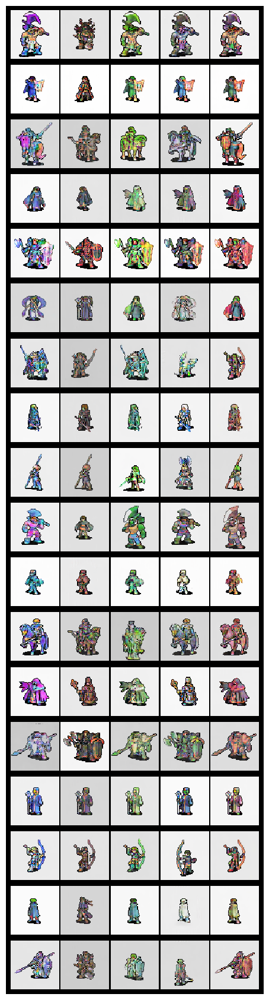


Row order:
01. feminine | barbarian
02. feminine | bard
03. feminine | cavalry
04. feminine | cleric
05. feminine | knight
06. feminine | mage
07. feminine | ranger
08. feminine | rogue
09. feminine | warrior
10. masculine | barbarian
11. masculine | bard
12. masculine | cavalry
13. masculine | cleric
14. masculine | knight
15. masculine | mage
16. masculine | ranger
17. masculine | rogue
18. masculine | warrior


In [10]:
# visualize all conditions

def build_cond(g_idx, h_idx, p_idx):
    gender_oh  = one_hot(g_idx, n_gender)
    hero_oh    = one_hot(h_idx, n_hero)
    palette_oh = one_hot(p_idx, n_palette)
    cond_vec = np.concatenate([gender_oh, hero_oh, palette_oh]).astype(np.float32)
    return torch.from_numpy(cond_vec)

@torch.no_grad()
def generate_all_grids(G_ema, nz=128, device="cuda", nrow=5):
    G_ema.eval()
    rows_imgs, titles = [], []

    for g_name in gender_classes:
        g_idx = gender_to_idx[g_name]
        for h_name in hero_classes:
            h_idx = hero_to_idx[h_name]

            conds = []
            for p_name in palette_classes:
                p_idx = palette_to_idx[p_name]
                conds.append(build_cond(g_idx, h_idx, p_idx))

            conds = torch.stack(conds).to(device)
            z = torch.randn(n_palette, nz, device=device)

            fake = G_ema(z, conds).cpu()
            fake = denorm(fake)

            grid = vutils.make_grid(fake, nrow=nrow, padding=2)
            rows_imgs.append(grid)
            titles.append(f"{g_name} | {h_name}")

    big = torch.stack(rows_imgs).reshape(-1, *rows_imgs[0].shape)
    final_grid = vutils.make_grid(big, nrow=1, padding=4)

    out_path = SAMPLES_DIR / "ALL_CONDITIONS_grid.png"
    vutils.save_image(final_grid, out_path)
    print("Saved full conditions grid to:", out_path)

    plt.figure(figsize=(8, max(8, len(rows_imgs)*1.2)))
    plt.axis("off")
    plt.imshow(final_grid.permute(1,2,0).numpy(), interpolation="nearest")
    plt.show()

    print("\nRow order:")
    for i, t in enumerate(titles):
        print(f"{i+1:02d}. {t}")

# запуск после обучения:
generate_all_grids(G_ema, nz=nz, device=device, nrow=n_palette)


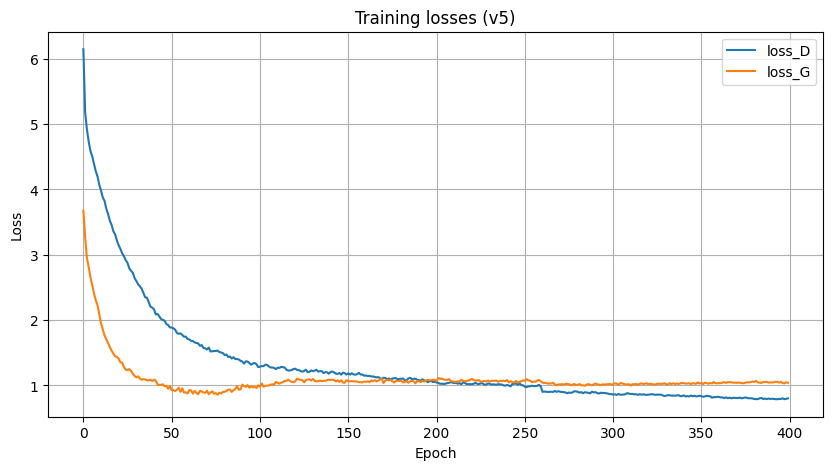

In [11]:
# plot losses

plt.figure(figsize=(10,5))
plt.plot(losses_D, label="loss_D")
plt.plot(losses_G, label="loss_G")
plt.title("Training losses (v5)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


## v6 — bbox-crop + FiLM + DiffAugment (light)
 
Качественнее оттенки и распределения цвета.
 
Но появились артефакты.
 
Лосс G выходит в плоскость на ~75 эпохе → ухудшение качества.

In [1]:
# config & run dirs for strong GAN v6 
from datetime import datetime
from pathlib import Path
import sys, json, random, time

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils import spectral_norm
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

import numpy as np
import pandas as pd
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms as T
from PIL import Image

PROJECT_ROOT = Path(r"D:\ML\LS\Deep_learning\GAN\hero_portrait_generator")
DATA_DIR = PROJECT_ROOT / "data"

SRC_DIR = PROJECT_ROOT / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.append(str(SRC_DIR))

from utils.config import DATASET_CONFIG, CDC_GAN_CONFIG
print("DATASET_CONFIG:", DATASET_CONFIG)
print("CDC_GAN_CONFIG:", CDC_GAN_CONFIG)

nz = 128
ngf = 160   # ↑ шире
ndf = 160   # ↑ шире
image_size = 64

num_epochs = 200
batch_size = 48   # ↓ чтобы влезло в 8GB

# TTUR
lrG = 2e-4
lrD = 5e-5

beta1, beta2 = 0.0, 0.9

ema_decay = 0.999

# R1
r1_gamma = 5.0
r1_every = 32

# Instance noise
noise_sigma_start = 0.15
noise_sigma_end   = 0.0
noise_anneal_epochs = 140  # чуть дольше держим шум

# ACGAN weights
lambda_cls_D = 1.0
lambda_cls_G = 1.0

# 2G:1D ratio
g_steps = 2
d_steps = 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

with open(DATA_DIR / "label_mappings.json", "r", encoding="utf-8") as f:
    label_mappings = json.load(f)

gender_classes   = label_mappings["gender_classes"]
gender_to_idx    = label_mappings["gender_to_idx"]
hero_classes     = label_mappings["hero_classes"]
hero_to_idx      = label_mappings["hero_to_idx"]
palette_classes  = label_mappings["palette_classes"]
palette_to_idx   = label_mappings["palette_to_idx"]

n_gender  = len(gender_classes)
n_hero    = len(hero_classes)
n_palette = len(palette_classes)

cond_dim = n_gender + n_hero + n_palette
print("cond_dim =", cond_dim)

RUN_ID = datetime.now().strftime("%Y%m%d-%H%M%S")
ARTIFACTS_DIR = PROJECT_ROOT / "artifacts_gan"
SAMPLES_DIR = ARTIFACTS_DIR / "samples" / RUN_ID
CKPT_DIR = ARTIFACTS_DIR / "checkpoints" / RUN_ID

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
CKPT_DIR.mkdir(parents=True, exist_ok=True)

print("RUN_ID:", RUN_ID)
print("SAMPLES_DIR:", SAMPLES_DIR)
print("CKPT_DIR:", CKPT_DIR)

def seed_all(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = True

seed_all(42)


DATASET_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'num_gender_classes': 2, 'num_hero_classes': 9, 'num_palette_classes': 5}
CDC_GAN_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'nz': 128, 'ngf': 64, 'ndf': 64}
device: cuda
cond_dim = 16
RUN_ID: 20251124-232444
SAMPLES_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444
CKPT_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-232444


In [2]:
# ResBlocks + Self-Attention

class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.query = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.key   = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.value = spectral_norm(nn.Conv2d(in_channels, in_channels, 1))
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        B, C, H, W = x.size()
        q = self.query(x).view(B, -1, H * W).permute(0, 2, 1)
        k = self.key(x).view(B, -1, H * W)
        attn = torch.softmax(torch.bmm(q, k), dim=-1)

        v = self.value(x).view(B, C, -1)
        out = torch.bmm(v, attn.permute(0, 2, 1)).view(B, C, H, W)
        return self.gamma * out + x


class GenResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode="nearest")
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False)
        self.bn1   = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False)
        self.bn2   = nn.BatchNorm2d(out_channels)
        self.conv_skip = nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False)

    def forward(self, x):
        skip = self.upsample(x)
        skip = self.conv_skip(skip)

        out = self.bn1(self.conv1(self.upsample(x)))
        out = F.relu(out, inplace=False)
        out = self.bn2(self.conv2(out))

        out = F.relu(out + skip, inplace=False)
        return out


class DiscResBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample=True):
        super().__init__()
        self.downsample = downsample
        self.conv1 = spectral_norm(nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False))
        self.conv2 = spectral_norm(nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False))
        self.conv_skip = spectral_norm(nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False))
        if downsample:
            self.avgpool = nn.AvgPool2d(2)

    def forward(self, x):
        skip = x
        if self.downsample:
            skip = self.avgpool(skip)
        skip = self.conv_skip(skip)

        out = F.leaky_relu(x, 0.2, inplace=False)
        out = self.conv1(out)
        out = F.leaky_relu(out, 0.2, inplace=False)
        out = self.conv2(out)
        if self.downsample:
            out = self.avgpool(out)

        return out + skip


In [4]:
# FiLM helpers

class FiLM(nn.Module):
    def __init__(self, cond_dim, channels):
        super().__init__()
        self.to_gamma = nn.Linear(cond_dim, channels)
        self.to_beta  = nn.Linear(cond_dim, channels)
        nn.init.zeros_(self.to_gamma.weight); nn.init.zeros_(self.to_gamma.bias)
        nn.init.zeros_(self.to_beta.weight);  nn.init.zeros_(self.to_beta.bias)

    def forward(self, x, cond):
        g = self.to_gamma(cond).view(cond.size(0), -1, 1, 1)
        b = self.to_beta(cond).view(cond.size(0), -1, 1, 1)
        return x * (1.0 + g) + b


In [6]:
# Strong Conditional Generator v6

class StrongConditionalGeneratorV6(nn.Module):
    def __init__(self, nz, cond_dim, ngf=160, nc=3):
        super().__init__()
        in_dim = nz + cond_dim
        self.fc = nn.Linear(in_dim, ngf * 8 * 4 * 4)

        self.b1 = GenResBlock(ngf*8, ngf*8); self.f1 = FiLM(cond_dim, ngf*8)
        self.b2 = GenResBlock(ngf*8, ngf*4); self.f2 = FiLM(cond_dim, ngf*4)
        self.b3 = GenResBlock(ngf*4, ngf*2); self.f3 = FiLM(cond_dim, ngf*2)

        self.attn = SelfAttention(ngf*2)

        self.b4 = GenResBlock(ngf*2, ngf);   self.f4 = FiLM(cond_dim, ngf)

        self.out = nn.Conv2d(ngf, nc, 3,1,1, bias=False)

    def forward(self, z, cond):
        x = torch.cat([z, cond], dim=1)
        x = self.fc(x).view(x.size(0), -1, 4, 4)

        x = self.b1(x); x = self.f1(x, cond)
        x = self.b2(x); x = self.f2(x, cond)
        x = self.b3(x); x = self.f3(x, cond)
        x = self.attn(x)
        x = self.b4(x); x = self.f4(x, cond)

        return torch.tanh(self.out(x))


In [7]:
# Projection + ACGAN Discriminator v6

class StrongConditionalDiscriminatorV6(nn.Module):
    def __init__(self, cond_dim, n_gender, n_hero, n_palette, ndf=160, nc=3):
        super().__init__()
        self.cond_dim = cond_dim

        self.b1 = DiscResBlock(nc, ndf, downsample=True)
        self.b2 = DiscResBlock(ndf, ndf*2, downsample=True)
        self.b3 = DiscResBlock(ndf*2, ndf*4, downsample=True)
        self.b4 = DiscResBlock(ndf*4, ndf*8, downsample=True)

        feat_dim = ndf*8
        self.adv = spectral_norm(nn.Linear(feat_dim, 1))
        self.cond_proj = spectral_norm(nn.Linear(cond_dim, feat_dim))

        self.cls_gender  = spectral_norm(nn.Linear(feat_dim, n_gender))
        self.cls_hero    = spectral_norm(nn.Linear(feat_dim, n_hero))
        self.cls_palette = spectral_norm(nn.Linear(feat_dim, n_palette))

    def forward(self, img, cond, return_logits=False):
        x = self.b1(img); x = self.b2(x); x = self.b3(x); x = self.b4(x)
        feat = x.sum(dim=[2,3])

        adv_score = self.adv(feat).view(-1)
        proj = (feat * self.cond_proj(cond)).sum(dim=1)
        score = adv_score + proj

        if not return_logits:
            return score

        return score, self.cls_gender(feat), self.cls_hero(feat), self.cls_palette(feat)


In [8]:
# Dataset v6

def one_hot(index: int, num_classes: int) -> np.ndarray:
    vec = np.zeros(num_classes, dtype=np.float32)
    vec[index] = 1.0
    return vec

class HeroPortraitDatasetV6(Dataset):
    def __init__(self, df, project_root, image_size=64, normalize=True):
        self.df = df.reset_index(drop=True)
        self.project_root = Path(project_root)

        tfs = [
            T.Resize((image_size, image_size), interpolation=T.InterpolationMode.NEAREST),
            T.ToTensor(),
        ]
        if normalize:
            tfs.append(T.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5]))
        self.transform = T.Compose(tfs)

    def __len__(self): return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = (self.project_root / row["rel_path"]).resolve()

        img = Image.open(img_path).convert("RGBA")
        if img.mode == "RGBA":
            bg = Image.new("RGBA", img.size, (255,255,255,255))
            img = Image.alpha_composite(bg, img).convert("RGB")
        else:
            img = img.convert("RGB")

        img_t = self.transform(img)

        g_idx = int(row["gender_idx"])
        h_idx = int(row["hero_idx"])
        p_idx = int(row["palette_idx"])

        cond_vec = np.concatenate([
            one_hot(g_idx, n_gender),
            one_hot(h_idx, n_hero),
            one_hot(p_idx, n_palette)
        ]).astype(np.float32)

        return {
            "image": img_t,
            "cond": torch.from_numpy(cond_vec),
            "g_idx": g_idx, "h_idx": h_idx, "p_idx": p_idx
        }

train_df = pd.read_csv(DATA_DIR / "sprites_train.csv")
val_df   = pd.read_csv(DATA_DIR / "sprites_val.csv")
FULL_DF = pd.concat([train_df, val_df], ignore_index=True)

dataset = HeroPortraitDatasetV6(FULL_DF, PROJECT_ROOT, image_size=image_size)

train_loader = DataLoader(
    dataset, batch_size=batch_size, shuffle=True,
    num_workers=0, pin_memory=False, drop_last=True
)

print("dataset size:", len(dataset))
print("batches:", len(train_loader))


dataset size: 7596
batches: 158


In [9]:
# DiffAugment + helpers

def denorm(x): 
    return x * 0.5 + 0.5

def add_instance_noise(x, epoch):
    if epoch >= noise_anneal_epochs:
        sigma = noise_sigma_end
    else:
        t = epoch / noise_anneal_epochs
        sigma = noise_sigma_start * (1 - t) + noise_sigma_end * t
    return x if sigma <= 0 else x + torch.randn_like(x) * sigma

def r1_penalty(d_out, x):
    grad = torch.autograd.grad(
        outputs=d_out.sum(), inputs=x,
        create_graph=True, retain_graph=True, only_inputs=True
    )[0]
    return grad.view(grad.size(0), -1).pow(2).sum(dim=1).mean()

@torch.no_grad()
def update_ema(G, G_ema, decay=0.999):
    for p, p_ema in zip(G.parameters(), G_ema.parameters()):
        p_ema.data.mul_(decay).add_(p.data, alpha=1 - decay)
    for b, b_ema in zip(G.buffers(), G_ema.buffers()):
        b_ema.copy_(b)

def save_sample_images(epoch, G_ema, fixed_noise, fixed_conds):
    G_ema.eval()
    with torch.no_grad():
        fake = G_ema(fixed_noise, fixed_conds).cpu()
    grid = vutils.make_grid(denorm(fake), nrow=4, padding=2)
    out_path = SAMPLES_DIR / f"epoch_{epoch:03d}.png"
    plt.figure(figsize=(6,6))
    plt.axis("off")
    plt.imshow(grid.permute(1,2,0).numpy(), interpolation="nearest")
    plt.tight_layout()
    plt.savefig(out_path, dpi=150)
    plt.close()
    print("[samples] Saved:", out_path)

# DiffAugment
def rand_translation(x, ratio=0.125):
    """
    Безопасный целочисленный сдвиг через roll.
    Форма [B,C,H,W] сохраняется.
    """
    B, C, H, W = x.shape
    shift_x = int(H * ratio + 0.5)
    shift_y = int(W * ratio + 0.5)

    if shift_x == 0 and shift_y == 0:
        return x

    tx = int(torch.randint(-shift_x, shift_x + 1, (), device=x.device))
    ty = int(torch.randint(-shift_y, shift_y + 1, (), device=x.device))

    return torch.roll(x, shifts=(tx, ty), dims=(2, 3))

def rand_cutout(x, ratio=0.3):
    B, C, H, W = x.shape
    cut_h = int(H * ratio + 0.5)
    cut_w = int(W * ratio + 0.5)

    cx = torch.randint(0, H, (B,), device=x.device)
    cy = torch.randint(0, W, (B,), device=x.device)

    mask = torch.ones((B, 1, H, W), device=x.device)
    for i in range(B):
        x1 = torch.clamp(cx[i] - cut_h // 2, 0, H)
        x2 = torch.clamp(cx[i] + cut_h // 2, 0, H)
        y1 = torch.clamp(cy[i] - cut_w // 2, 0, W)
        y2 = torch.clamp(cy[i] + cut_w // 2, 0, W)
        mask[i, :, x1:x2, y1:y2] = 0
    return x * mask

def rand_color(x, strength=0.05):
    return x + torch.randn_like(x) * strength

def diff_augment(x):
    x = rand_translation(x)
    x = rand_cutout(x)
    x = rand_color(x)
    return x


In [10]:
# init models v6

G = StrongConditionalGeneratorV6(nz=nz, cond_dim=cond_dim, ngf=ngf).to(device)
D = StrongConditionalDiscriminatorV6(cond_dim=cond_dim,
                                    n_gender=n_gender, n_hero=n_hero, n_palette=n_palette,
                                    ndf=ndf).to(device)

G_ema = StrongConditionalGeneratorV6(nz=nz, cond_dim=cond_dim, ngf=ngf).to(device)
G_ema.load_state_dict(G.state_dict())
G_ema.eval()
for p in G_ema.parameters():
    p.requires_grad_(False)

print("Params G:", sum(p.numel() for p in G.parameters()))
print("Params D:", sum(p.numel() for p in D.parameters()))

optimizerG = torch.optim.Adam(G.parameters(), lr=lrG, betas=(beta1, beta2))
optimizerD = torch.optim.Adam(D.parameters(), lr=lrD, betas=(beta1, beta2))

schedulerG = torch.optim.lr_scheduler.MultiStepLR(optimizerG, milestones=[280, 430], gamma=0.5)
schedulerD = torch.optim.lr_scheduler.MultiStepLR(optimizerD, milestones=[280, 430], gamma=0.5)

fixed_batch = next(iter(train_loader))
fixed_conds = fixed_batch["cond"][:16].to(device)
fixed_noise = torch.randn(16, nz, device=device)

print("fixed shapes:", fixed_noise.shape, fixed_conds.shape)


Params G: 49913521
Params D: 30384337
fixed shapes: torch.Size([16, 128]) torch.Size([16, 16])


In [11]:
# training loop v6 

losses_D, losses_G = [], []
global_step = 0

ce_gender  = nn.CrossEntropyLoss()
ce_hero    = nn.CrossEntropyLoss()
ce_palette = nn.CrossEntropyLoss()

for epoch in range(1, num_epochs + 1):
    G.train(); D.train()
    epoch_loss_D, epoch_loss_G = 0.0, 0.0
    num_batches = 0

    pbar = tqdm(train_loader, desc=f"Epoch [{epoch}/{num_epochs}]", leave=False)

    for batch in pbar:
        real = batch["image"].to(device)
        cond = batch["cond"].to(device)
        g_idx = batch["g_idx"].to(device)
        h_idx = batch["h_idx"].to(device)
        p_idx = batch["p_idx"].to(device)
        B = real.size(0)

        # D step(s)
        for _ in range(d_steps):
            optimizerD.zero_grad(set_to_none=True)

            real.requires_grad_(True)
            real_noisy = add_instance_noise(real, epoch)
            real_aug = diff_augment(real_noisy)
            real_score, real_lg, real_lh, real_lp = D(real_aug, cond, return_logits=True)
            loss_D_real = torch.relu(1.0 - real_score).mean()

            z = torch.randn(B, nz, device=device)
            fake = G(z, cond).detach()
            fake_noisy = add_instance_noise(fake, epoch)
            fake_aug = diff_augment(fake_noisy)
            fake_score = D(fake_aug, cond)
            loss_D_fake = torch.relu(1.0 + fake_score).mean()

            loss_D_adv = loss_D_real + loss_D_fake

            if global_step % r1_every == 0:
                r1 = r1_penalty(real_score, real)
                loss_D_adv = loss_D_adv + (r1_gamma / 2.0) * r1

            loss_D_cls = (
                ce_gender(real_lg, g_idx) +
                ce_hero(real_lh, h_idx) +
                ce_palette(real_lp, p_idx)
            )

            loss_D = loss_D_adv + lambda_cls_D * loss_D_cls
            loss_D.backward()
            optimizerD.step()
            real.requires_grad_(False)

        # G step(s)
        for _ in range(g_steps):
            optimizerG.zero_grad(set_to_none=True)

            z = torch.randn(B, nz, device=device)
            fake = G(z, cond)
            fake_aug = diff_augment(fake)  # да, тоже аугментируем для игры
            fake_score, fake_lg, fake_lh, fake_lp = D(fake_aug, cond, return_logits=True)

            loss_G_adv = -fake_score.mean()
            loss_G_cls = (
                ce_gender(fake_lg, g_idx) +
                ce_hero(fake_lh, h_idx) +
                ce_palette(fake_lp, p_idx)
            )

            loss_G = loss_G_adv + lambda_cls_G * loss_G_cls
            loss_G.backward()
            optimizerG.step()

            update_ema(G, G_ema, ema_decay)

        epoch_loss_D += loss_D.item()
        epoch_loss_G += loss_G.item()
        num_batches += 1
        global_step += 1

        pbar.set_postfix(loss_D=f"{loss_D.item():.3f}", loss_G=f"{loss_G.item():.3f}")

    epoch_loss_D /= num_batches
    epoch_loss_G /= num_batches
    losses_D.append(epoch_loss_D)
    losses_G.append(epoch_loss_G)

    schedulerD.step()
    schedulerG.step()

    print(f"[Epoch {epoch:03d}/{num_epochs}] mean loss_D: {epoch_loss_D:.4f} | mean loss_G: {epoch_loss_G:.4f}")

    if epoch % 10 == 0 or epoch == 1:
        save_sample_images(epoch, G_ema, fixed_noise, fixed_conds)

    if epoch % 50 == 0 or epoch == num_epochs:
        ckpt_path = CKPT_DIR / f"hero_v6_epoch_{epoch:03d}.pth"
        torch.save(
            {
                "epoch": epoch,
                "G_state_dict": G.state_dict(),
                "G_ema_state_dict": G_ema.state_dict(),
                "D_state_dict": D.state_dict(),
                "optimizerG_state_dict": optimizerG.state_dict(),
                "optimizerD_state_dict": optimizerD.state_dict(),
                "losses_G": losses_G,
                "losses_D": losses_D,
                "config": {
                    "nz": nz, "cond_dim": cond_dim,
                    "ngf": ngf, "ndf": ndf,
                    "batch_size": batch_size,
                    "num_epochs": num_epochs,
                    "lrG": lrG, "lrD": lrD,
                    "g_steps": g_steps, "d_steps": d_steps,
                    "ema_decay": ema_decay,
                    "r1_gamma": r1_gamma, "r1_every": r1_every,
                    "noise_sigma_start": noise_sigma_start,
                    "noise_anneal_epochs": noise_anneal_epochs,
                    "run_id": RUN_ID,
                },
            },
            ckpt_path
        )
        print("[ckpt] Saved:", ckpt_path)


Epoch [1/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 001/200] mean loss_D: 6.2183 | mean loss_G: 3.5542
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_001.png


Epoch [2/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 002/200] mean loss_D: 5.1934 | mean loss_G: 2.7977


Epoch [3/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 003/200] mean loss_D: 4.8764 | mean loss_G: 2.5235


Epoch [4/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 004/200] mean loss_D: 4.6837 | mean loss_G: 2.4133


Epoch [5/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 005/200] mean loss_D: 4.6105 | mean loss_G: 2.2574


Epoch [6/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 006/200] mean loss_D: 4.5297 | mean loss_G: 2.1574


Epoch [7/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 007/200] mean loss_D: 4.4953 | mean loss_G: 2.0959


Epoch [8/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 008/200] mean loss_D: 4.4089 | mean loss_G: 2.0559


Epoch [9/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 009/200] mean loss_D: 4.3901 | mean loss_G: 2.0164


Epoch [10/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 010/200] mean loss_D: 4.3265 | mean loss_G: 1.9348
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_010.png


Epoch [11/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 011/200] mean loss_D: 4.2210 | mean loss_G: 1.8615


Epoch [12/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 012/200] mean loss_D: 4.1645 | mean loss_G: 1.7845


Epoch [13/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 013/200] mean loss_D: 4.1075 | mean loss_G: 1.8030


Epoch [14/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 014/200] mean loss_D: 4.0240 | mean loss_G: 1.7492


Epoch [15/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 015/200] mean loss_D: 3.9467 | mean loss_G: 1.7079


Epoch [16/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 016/200] mean loss_D: 3.9028 | mean loss_G: 1.7129


Epoch [17/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 017/200] mean loss_D: 3.8440 | mean loss_G: 1.6205


Epoch [18/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 018/200] mean loss_D: 3.8146 | mean loss_G: 1.6062


Epoch [19/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 019/200] mean loss_D: 3.7397 | mean loss_G: 1.5503


Epoch [20/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 020/200] mean loss_D: 3.7364 | mean loss_G: 1.5506
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_020.png


Epoch [21/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 021/200] mean loss_D: 3.6697 | mean loss_G: 1.4499


Epoch [22/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 022/200] mean loss_D: 3.6444 | mean loss_G: 1.5288


Epoch [23/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 023/200] mean loss_D: 3.6252 | mean loss_G: 1.4224


Epoch [24/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 024/200] mean loss_D: 3.5637 | mean loss_G: 1.4211


Epoch [25/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 025/200] mean loss_D: 3.5662 | mean loss_G: 1.3900


Epoch [26/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 026/200] mean loss_D: 3.5263 | mean loss_G: 1.3558


Epoch [27/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 027/200] mean loss_D: 3.4941 | mean loss_G: 1.3405


Epoch [28/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 028/200] mean loss_D: 3.4615 | mean loss_G: 1.2879


Epoch [29/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 029/200] mean loss_D: 3.4163 | mean loss_G: 1.3172


Epoch [30/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 030/200] mean loss_D: 3.3903 | mean loss_G: 1.2912
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_030.png


Epoch [31/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 031/200] mean loss_D: 3.3370 | mean loss_G: 1.2783


Epoch [32/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 032/200] mean loss_D: 3.3180 | mean loss_G: 1.2873


Epoch [33/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 033/200] mean loss_D: 3.3454 | mean loss_G: 1.2789


Epoch [34/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 034/200] mean loss_D: 3.2731 | mean loss_G: 1.1864


Epoch [35/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 035/200] mean loss_D: 3.2480 | mean loss_G: 1.2121


Epoch [36/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 036/200] mean loss_D: 3.2179 | mean loss_G: 1.1934


Epoch [37/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 037/200] mean loss_D: 3.1726 | mean loss_G: 1.1881


Epoch [38/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 038/200] mean loss_D: 3.1293 | mean loss_G: 1.1786


Epoch [39/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 039/200] mean loss_D: 3.1150 | mean loss_G: 1.1150


Epoch [40/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 040/200] mean loss_D: 3.1045 | mean loss_G: 1.1547
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_040.png


Epoch [41/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 041/200] mean loss_D: 3.0736 | mean loss_G: 1.1293


Epoch [42/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 042/200] mean loss_D: 3.0612 | mean loss_G: 1.0751


Epoch [43/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 043/200] mean loss_D: 3.0339 | mean loss_G: 1.0981


Epoch [44/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 044/200] mean loss_D: 2.9928 | mean loss_G: 1.0501


Epoch [45/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 045/200] mean loss_D: 2.9328 | mean loss_G: 1.0256


Epoch [46/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 046/200] mean loss_D: 2.9519 | mean loss_G: 1.0577


Epoch [47/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 047/200] mean loss_D: 2.9183 | mean loss_G: 1.0188


Epoch [48/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 048/200] mean loss_D: 2.9301 | mean loss_G: 1.0442


Epoch [49/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 049/200] mean loss_D: 2.8652 | mean loss_G: 0.9998


Epoch [50/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 050/200] mean loss_D: 2.8556 | mean loss_G: 1.0379
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_050.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-232444\hero_v6_epoch_050.pth


Epoch [51/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 051/200] mean loss_D: 2.8293 | mean loss_G: 0.9980


Epoch [52/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 052/200] mean loss_D: 2.8031 | mean loss_G: 1.0147


Epoch [53/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 053/200] mean loss_D: 2.7836 | mean loss_G: 0.9703


Epoch [54/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 054/200] mean loss_D: 2.7631 | mean loss_G: 0.9742


Epoch [55/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 055/200] mean loss_D: 2.7565 | mean loss_G: 1.0112


Epoch [56/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 056/200] mean loss_D: 2.6855 | mean loss_G: 0.9472


Epoch [57/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 057/200] mean loss_D: 2.7199 | mean loss_G: 0.9708


Epoch [58/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 058/200] mean loss_D: 2.6477 | mean loss_G: 1.0231


Epoch [59/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 059/200] mean loss_D: 2.6618 | mean loss_G: 0.9704


Epoch [60/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 060/200] mean loss_D: 2.6607 | mean loss_G: 0.9268
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_060.png


Epoch [61/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 061/200] mean loss_D: 2.5929 | mean loss_G: 0.9688


Epoch [62/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 062/200] mean loss_D: 2.5992 | mean loss_G: 0.9849


Epoch [63/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 063/200] mean loss_D: 2.5726 | mean loss_G: 0.9743


Epoch [64/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 064/200] mean loss_D: 2.5192 | mean loss_G: 0.9230


Epoch [65/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 065/200] mean loss_D: 2.5566 | mean loss_G: 0.9220


Epoch [66/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 066/200] mean loss_D: 2.4828 | mean loss_G: 0.9119


Epoch [67/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 067/200] mean loss_D: 2.4812 | mean loss_G: 0.8788


Epoch [68/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 068/200] mean loss_D: 2.4661 | mean loss_G: 0.8903


Epoch [69/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 069/200] mean loss_D: 2.4748 | mean loss_G: 0.9308


Epoch [70/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 070/200] mean loss_D: 2.4493 | mean loss_G: 0.9561
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_070.png


Epoch [71/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 071/200] mean loss_D: 2.4438 | mean loss_G: 0.9246


Epoch [72/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 072/200] mean loss_D: 2.4191 | mean loss_G: 0.8991


Epoch [73/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 073/200] mean loss_D: 2.3519 | mean loss_G: 0.8945


Epoch [74/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 074/200] mean loss_D: 2.4031 | mean loss_G: 0.8927


Epoch [75/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 075/200] mean loss_D: 2.3614 | mean loss_G: 0.9572


Epoch [76/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 076/200] mean loss_D: 2.3379 | mean loss_G: 0.9307


Epoch [77/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 077/200] mean loss_D: 2.2759 | mean loss_G: 0.9376


Epoch [78/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 078/200] mean loss_D: 2.3099 | mean loss_G: 0.9173


Epoch [79/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 079/200] mean loss_D: 2.2953 | mean loss_G: 0.8683


Epoch [80/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 080/200] mean loss_D: 2.2834 | mean loss_G: 0.8912
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_080.png


Epoch [81/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 081/200] mean loss_D: 2.2343 | mean loss_G: 0.9696


Epoch [82/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 082/200] mean loss_D: 2.2406 | mean loss_G: 0.8914


Epoch [83/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 083/200] mean loss_D: 2.1771 | mean loss_G: 0.9748


Epoch [84/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 084/200] mean loss_D: 2.1684 | mean loss_G: 0.8837


Epoch [85/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 085/200] mean loss_D: 2.1873 | mean loss_G: 0.9117


Epoch [86/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 086/200] mean loss_D: 2.1683 | mean loss_G: 0.9188


Epoch [87/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 087/200] mean loss_D: 2.0899 | mean loss_G: 0.9894


Epoch [88/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 088/200] mean loss_D: 2.0992 | mean loss_G: 0.9320


Epoch [89/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 089/200] mean loss_D: 2.0864 | mean loss_G: 0.9695


Epoch [90/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 090/200] mean loss_D: 2.0714 | mean loss_G: 0.9351
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_090.png


Epoch [91/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 091/200] mean loss_D: 2.1004 | mean loss_G: 0.9574


Epoch [92/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 092/200] mean loss_D: 2.1059 | mean loss_G: 0.9629


Epoch [93/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 093/200] mean loss_D: 2.0343 | mean loss_G: 1.0159


Epoch [94/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 094/200] mean loss_D: 2.0169 | mean loss_G: 0.9675


Epoch [95/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 095/200] mean loss_D: 2.0300 | mean loss_G: 1.0147


Epoch [96/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 096/200] mean loss_D: 2.0152 | mean loss_G: 1.0030


Epoch [97/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 097/200] mean loss_D: 2.0028 | mean loss_G: 0.9316


Epoch [98/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 098/200] mean loss_D: 1.9587 | mean loss_G: 0.9861


Epoch [99/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 099/200] mean loss_D: 1.9472 | mean loss_G: 1.0129


Epoch [100/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 100/200] mean loss_D: 1.9092 | mean loss_G: 1.0462
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_100.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-232444\hero_v6_epoch_100.pth


Epoch [101/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 101/200] mean loss_D: 1.9053 | mean loss_G: 1.0203


Epoch [102/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 102/200] mean loss_D: 1.9174 | mean loss_G: 1.0124


Epoch [103/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 103/200] mean loss_D: 1.8826 | mean loss_G: 1.0548


Epoch [104/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 104/200] mean loss_D: 1.8703 | mean loss_G: 1.0098


Epoch [105/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 105/200] mean loss_D: 1.8637 | mean loss_G: 1.0360


Epoch [106/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 106/200] mean loss_D: 1.8303 | mean loss_G: 1.0332


Epoch [107/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 107/200] mean loss_D: 1.8451 | mean loss_G: 1.0517


Epoch [108/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 108/200] mean loss_D: 1.8141 | mean loss_G: 1.1034


Epoch [109/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 109/200] mean loss_D: 1.8143 | mean loss_G: 1.0402


Epoch [110/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 110/200] mean loss_D: 1.7812 | mean loss_G: 1.0791
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_110.png


Epoch [111/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 111/200] mean loss_D: 1.7936 | mean loss_G: 1.0617


Epoch [112/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 112/200] mean loss_D: 1.8032 | mean loss_G: 1.0645


Epoch [113/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 113/200] mean loss_D: 1.7570 | mean loss_G: 1.1095


Epoch [114/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 114/200] mean loss_D: 1.7468 | mean loss_G: 1.1268


Epoch [115/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 115/200] mean loss_D: 1.7504 | mean loss_G: 1.0302


Epoch [116/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 116/200] mean loss_D: 1.7475 | mean loss_G: 1.0539


Epoch [117/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 117/200] mean loss_D: 1.7401 | mean loss_G: 1.0562


Epoch [118/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 118/200] mean loss_D: 1.6734 | mean loss_G: 1.0660


Epoch [119/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 119/200] mean loss_D: 1.6762 | mean loss_G: 1.1056


Epoch [120/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 120/200] mean loss_D: 1.6822 | mean loss_G: 1.0825
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_120.png


Epoch [121/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 121/200] mean loss_D: 1.7156 | mean loss_G: 1.0828


Epoch [122/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 122/200] mean loss_D: 1.6253 | mean loss_G: 1.1875


Epoch [123/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 123/200] mean loss_D: 1.6096 | mean loss_G: 1.1740


Epoch [124/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 124/200] mean loss_D: 1.6494 | mean loss_G: 1.0896


Epoch [125/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 125/200] mean loss_D: 1.6558 | mean loss_G: 1.1080


Epoch [126/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 126/200] mean loss_D: 1.6556 | mean loss_G: 1.0999


Epoch [127/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 127/200] mean loss_D: 1.6546 | mean loss_G: 1.0662


Epoch [128/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 128/200] mean loss_D: 1.6381 | mean loss_G: 1.0957


Epoch [129/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 129/200] mean loss_D: 1.6337 | mean loss_G: 1.1420


Epoch [130/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 130/200] mean loss_D: 1.5983 | mean loss_G: 1.1356
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_130.png


Epoch [131/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 131/200] mean loss_D: 1.6274 | mean loss_G: 1.1168


Epoch [132/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 132/200] mean loss_D: 1.5633 | mean loss_G: 1.1073


Epoch [133/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 133/200] mean loss_D: 1.5682 | mean loss_G: 1.1269


Epoch [134/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 134/200] mean loss_D: 1.5374 | mean loss_G: 1.1805


Epoch [135/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 135/200] mean loss_D: 1.5144 | mean loss_G: 1.1508


Epoch [136/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 136/200] mean loss_D: 1.5011 | mean loss_G: 1.2470


Epoch [137/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 137/200] mean loss_D: 1.4950 | mean loss_G: 1.2267


Epoch [138/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 138/200] mean loss_D: 1.5155 | mean loss_G: 1.1598


Epoch [139/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 139/200] mean loss_D: 1.5216 | mean loss_G: 1.1588


Epoch [140/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 140/200] mean loss_D: 1.4623 | mean loss_G: 1.2143
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_140.png


Epoch [141/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 141/200] mean loss_D: 1.5014 | mean loss_G: 1.1827


Epoch [142/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 142/200] mean loss_D: 1.5156 | mean loss_G: 1.1797


Epoch [143/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 143/200] mean loss_D: 1.4511 | mean loss_G: 1.2284


Epoch [144/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 144/200] mean loss_D: 1.4988 | mean loss_G: 1.2108


Epoch [145/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 145/200] mean loss_D: 1.4492 | mean loss_G: 1.2585


Epoch [146/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 146/200] mean loss_D: 1.4646 | mean loss_G: 1.1884


Epoch [147/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 147/200] mean loss_D: 1.4306 | mean loss_G: 1.2289


Epoch [148/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 148/200] mean loss_D: 1.4317 | mean loss_G: 1.2561


Epoch [149/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 149/200] mean loss_D: 1.4004 | mean loss_G: 1.2495


Epoch [150/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 150/200] mean loss_D: 1.4045 | mean loss_G: 1.2716
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_150.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-232444\hero_v6_epoch_150.pth


Epoch [151/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 151/200] mean loss_D: 1.3984 | mean loss_G: 1.2480


Epoch [152/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 152/200] mean loss_D: 1.4053 | mean loss_G: 1.2356


Epoch [153/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 153/200] mean loss_D: 1.4298 | mean loss_G: 1.2659


Epoch [154/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 154/200] mean loss_D: 1.3607 | mean loss_G: 1.2711


Epoch [155/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 155/200] mean loss_D: 1.3497 | mean loss_G: 1.3154


Epoch [156/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 156/200] mean loss_D: 1.4092 | mean loss_G: 1.2829


Epoch [157/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 157/200] mean loss_D: 1.2819 | mean loss_G: 1.3994


Epoch [158/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 158/200] mean loss_D: 1.3154 | mean loss_G: 1.3758


Epoch [159/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 159/200] mean loss_D: 1.2555 | mean loss_G: 1.3716


Epoch [160/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 160/200] mean loss_D: 1.3141 | mean loss_G: 1.3311
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_160.png


Epoch [161/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 161/200] mean loss_D: 1.2950 | mean loss_G: 1.3204


Epoch [162/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 162/200] mean loss_D: 1.3123 | mean loss_G: 1.3348


Epoch [163/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 163/200] mean loss_D: 1.3083 | mean loss_G: 1.2847


Epoch [164/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 164/200] mean loss_D: 1.3283 | mean loss_G: 1.3325


Epoch [165/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 165/200] mean loss_D: 1.3075 | mean loss_G: 1.3228


Epoch [166/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 166/200] mean loss_D: 1.3475 | mean loss_G: 1.2947


Epoch [167/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 167/200] mean loss_D: 1.3479 | mean loss_G: 1.2753


Epoch [168/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 168/200] mean loss_D: 1.2924 | mean loss_G: 1.3389


Epoch [169/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 169/200] mean loss_D: 1.2259 | mean loss_G: 1.3835


Epoch [170/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 170/200] mean loss_D: 1.2458 | mean loss_G: 1.3761
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_170.png


Epoch [171/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 171/200] mean loss_D: 1.1949 | mean loss_G: 1.4196


Epoch [172/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 172/200] mean loss_D: 1.2163 | mean loss_G: 1.3346


Epoch [173/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 173/200] mean loss_D: 1.2174 | mean loss_G: 1.3424


Epoch [174/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 174/200] mean loss_D: 1.2895 | mean loss_G: 1.3138


Epoch [175/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 175/200] mean loss_D: 1.2901 | mean loss_G: 1.2493


Epoch [176/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 176/200] mean loss_D: 1.2416 | mean loss_G: 1.3501


Epoch [177/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 177/200] mean loss_D: 1.2254 | mean loss_G: 1.2993


Epoch [178/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 178/200] mean loss_D: 1.2020 | mean loss_G: 1.3347


Epoch [179/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 179/200] mean loss_D: 1.2335 | mean loss_G: 1.3531


Epoch [180/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 180/200] mean loss_D: 1.2601 | mean loss_G: 1.3232
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_180.png


Epoch [181/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 181/200] mean loss_D: 1.2375 | mean loss_G: 1.3329


Epoch [182/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 182/200] mean loss_D: 1.1781 | mean loss_G: 1.4297


Epoch [183/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 183/200] mean loss_D: 1.1664 | mean loss_G: 1.4209


Epoch [184/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 184/200] mean loss_D: 1.1696 | mean loss_G: 1.4170


Epoch [185/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 185/200] mean loss_D: 1.2155 | mean loss_G: 1.3884


Epoch [186/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 186/200] mean loss_D: 1.2203 | mean loss_G: 1.3875


Epoch [187/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 187/200] mean loss_D: 1.2080 | mean loss_G: 1.3355


Epoch [188/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 188/200] mean loss_D: 1.2103 | mean loss_G: 1.4269


Epoch [189/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 189/200] mean loss_D: 1.2236 | mean loss_G: 1.3514


Epoch [190/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 190/200] mean loss_D: 1.1807 | mean loss_G: 1.3659
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_190.png


Epoch [191/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 191/200] mean loss_D: 1.1974 | mean loss_G: 1.3847


Epoch [192/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 192/200] mean loss_D: 1.1910 | mean loss_G: 1.3841


Epoch [193/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 193/200] mean loss_D: 1.2054 | mean loss_G: 1.3762


Epoch [194/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 194/200] mean loss_D: 1.1855 | mean loss_G: 1.3414


Epoch [195/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 195/200] mean loss_D: 1.2120 | mean loss_G: 1.2318


Epoch [196/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 196/200] mean loss_D: 1.2000 | mean loss_G: 1.2936


Epoch [197/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 197/200] mean loss_D: 1.2240 | mean loss_G: 1.3377


Epoch [198/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 198/200] mean loss_D: 1.2011 | mean loss_G: 1.3117


Epoch [199/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 199/200] mean loss_D: 1.1691 | mean loss_G: 1.3278


Epoch [200/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 200/200] mean loss_D: 1.1583 | mean loss_G: 1.3373
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\epoch_200.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251124-232444\hero_v6_epoch_200.pth


Saved full conditions grid to: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251124-232444\ALL_CONDITIONS_grid.png


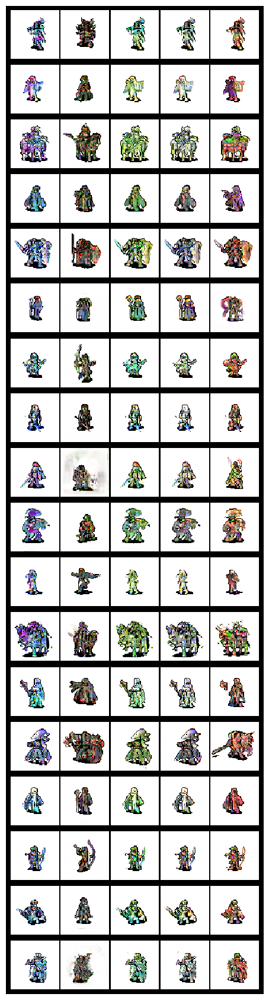


Row order:
01. feminine | barbarian
02. feminine | bard
03. feminine | cavalry
04. feminine | cleric
05. feminine | knight
06. feminine | mage
07. feminine | ranger
08. feminine | rogue
09. feminine | warrior
10. masculine | barbarian
11. masculine | bard
12. masculine | cavalry
13. masculine | cleric
14. masculine | knight
15. masculine | mage
16. masculine | ranger
17. masculine | rogue
18. masculine | warrior


In [12]:
# visualize all conditions

def build_cond(g_idx, h_idx, p_idx):
    gender_oh  = one_hot(g_idx, n_gender)
    hero_oh    = one_hot(h_idx, n_hero)
    palette_oh = one_hot(p_idx, n_palette)
    return torch.from_numpy(np.concatenate([gender_oh, hero_oh, palette_oh]).astype(np.float32))

@torch.no_grad()
def generate_all_grids(G_ema):
    G_ema.eval()
    rows_imgs, titles = [], []

    for g_name in gender_classes:
        g_idx = gender_to_idx[g_name]
        for h_name in hero_classes:
            h_idx = hero_to_idx[h_name]

            conds = []
            for p_name in palette_classes:
                p_idx = palette_to_idx[p_name]
                conds.append(build_cond(g_idx, h_idx, p_idx))
            conds = torch.stack(conds).to(device)

            z = torch.randn(n_palette, nz, device=device)
            fake = denorm(G_ema(z, conds).cpu())

            grid = vutils.make_grid(fake, nrow=n_palette, padding=2)
            rows_imgs.append(grid)
            titles.append(f"{g_name} | {h_name}")

    big = torch.stack(rows_imgs).reshape(-1, *rows_imgs[0].shape)
    final_grid = vutils.make_grid(big, nrow=1, padding=4)

    out_path = SAMPLES_DIR / "ALL_CONDITIONS_grid.png"
    vutils.save_image(final_grid, out_path)
    print("Saved full conditions grid to:", out_path)

    plt.figure(figsize=(8, max(8, len(rows_imgs)*1.2)))
    plt.axis("off")
    plt.imshow(final_grid.permute(1,2,0).numpy(), interpolation="nearest")
    plt.show()

    print("\nRow order:")
    for i, t in enumerate(titles):
        print(f"{i+1:02d}. {t}")

generate_all_grids(G_ema)


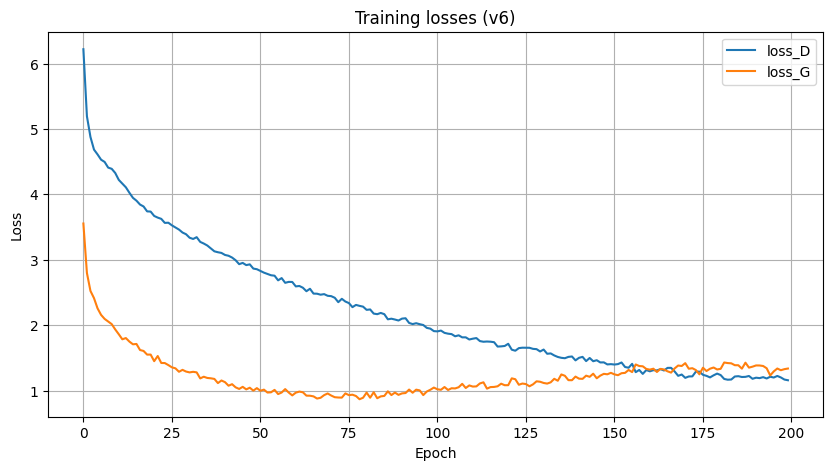

In [13]:
# plot losses
plt.figure(figsize=(10,5))
plt.plot(losses_D, label="loss_D")
plt.plot(losses_G, label="loss_G")
plt.title("Training losses (v6)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


## Вариант 7 - ослабили дискриминатор, чтобы не обгонял и не подавлял генератор

In [1]:
# config & run dirs for GAN v7
from datetime import datetime
from pathlib import Path
import sys, json, random

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils import spectral_norm
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

import numpy as np
import pandas as pd
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms as T
from PIL import Image

PROJECT_ROOT = Path(r"D:\ML\LS\Deep_learning\GAN\hero_portrait_generator")
DATA_DIR = PROJECT_ROOT / "data"

SRC_DIR = PROJECT_ROOT / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.append(str(SRC_DIR))

from utils.config import DATASET_CONFIG, CDC_GAN_CONFIG
print("DATASET_CONFIG:", DATASET_CONFIG)
print("CDC_GAN_CONFIG:", CDC_GAN_CONFIG)

nz = 128
ngf = 160      # генератор оставляем широким
ndf = 128      # дискриминатор чуть слабее

image_size = 64

num_epochs = 200     
batch_size = 48

# TTUR
lrG = 2e-4
lrD = 3e-5     # ещё мягче для D

beta1, beta2 = 0.0, 0.9

ema_decay = 0.999

# R1 (чуть мягче)
r1_gamma = 2.5
r1_every = 32

# Instance noise (чуть мягче, чем v6)
noise_sigma_start = 0.10
noise_sigma_end   = 0.0
noise_anneal_epochs = 120

# ACGAN weights (ослабляем влияние cls на D)
lambda_cls_D = 0.3
lambda_cls_G = 1.0

# 2G:1D
g_steps = 2
d_steps = 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

with open(DATA_DIR / "label_mappings.json", "r", encoding="utf-8") as f:
    label_mappings = json.load(f)

gender_classes   = label_mappings["gender_classes"]
gender_to_idx    = label_mappings["gender_to_idx"]
hero_classes     = label_mappings["hero_classes"]
hero_to_idx      = label_mappings["hero_to_idx"]
palette_classes  = label_mappings["palette_classes"]
palette_to_idx   = label_mappings["palette_to_idx"]

n_gender  = len(gender_classes)
n_hero    = len(hero_classes)
n_palette = len(palette_classes)

cond_dim = n_gender + n_hero + n_palette
print("n_gender, n_hero, n_palette:", n_gender, n_hero, n_palette)
print("cond_dim =", cond_dim)

RUN_ID = datetime.now().strftime("%Y%m%d-%H%M%S")
ARTIFACTS_DIR = PROJECT_ROOT / "artifacts_gan"
SAMPLES_DIR = ARTIFACTS_DIR / "samples" / RUN_ID
CKPT_DIR = ARTIFACTS_DIR / "checkpoints" / RUN_ID

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
CKPT_DIR.mkdir(parents=True, exist_ok=True)

print("RUN_ID:", RUN_ID)
print("SAMPLES_DIR:", SAMPLES_DIR)
print("CKPT_DIR:", CKPT_DIR)

def seed_all(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = True

seed_all(42)


DATASET_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'num_gender_classes': 2, 'num_hero_classes': 9, 'num_palette_classes': 5}
CDC_GAN_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'nz': 128, 'ngf': 64, 'ndf': 64}
device: cuda
n_gender, n_hero, n_palette: 2 9 5
cond_dim = 16
RUN_ID: 20251125-230331
SAMPLES_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331
CKPT_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251125-230331


In [2]:
# ResBlocks + Self-Attention

class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.query = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.key   = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.value = spectral_norm(nn.Conv2d(in_channels, in_channels, 1))
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        B, C, H, W = x.size()
        q = self.query(x).view(B, -1, H * W).permute(0, 2, 1)
        k = self.key(x).view(B, -1, H * W)
        attn = torch.softmax(torch.bmm(q, k), dim=-1)
        v = self.value(x).view(B, C, -1)
        out = torch.bmm(v, attn.permute(0, 2, 1)).view(B, C, H, W)
        return self.gamma * out + x


class GenResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode="nearest")
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False)
        self.bn1   = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False)
        self.bn2   = nn.BatchNorm2d(out_channels)
        self.conv_skip = nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False)

    def forward(self, x):
        skip = self.upsample(x)
        skip = self.conv_skip(skip)

        out = self.upsample(x)
        out = self.conv1(out)
        out = self.bn1(out)
        out = F.relu(out, inplace=False)

        out = self.conv2(out)
        out = self.bn2(out)

        out = F.relu(out + skip, inplace=False)
        return out


class DiscResBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample=True):
        super().__init__()
        self.downsample = downsample
        self.conv1 = spectral_norm(nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False))
        self.conv2 = spectral_norm(nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False))
        self.conv_skip = spectral_norm(nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False))
        if downsample:
            self.avgpool = nn.AvgPool2d(2)

    def forward(self, x):
        skip = x
        if self.downsample:
            skip = self.avgpool(skip)
        skip = self.conv_skip(skip)

        out = F.leaky_relu(x, 0.2, inplace=False)
        out = self.conv1(out)
        out = F.leaky_relu(out, 0.2, inplace=False)
        out = self.conv2(out)
        if self.downsample:
            out = self.avgpool(out)

        return out + skip


In [3]:
# FiLM 

class FiLM(nn.Module):
    def __init__(self, cond_dim, channels):
        super().__init__()
        self.to_gamma = nn.Linear(cond_dim, channels)
        self.to_beta  = nn.Linear(cond_dim, channels)
        nn.init.zeros_(self.to_gamma.weight); nn.init.zeros_(self.to_gamma.bias)
        nn.init.zeros_(self.to_beta.weight);  nn.init.zeros_(self.to_beta.bias)

    def forward(self, x, cond):
        g = self.to_gamma(cond).view(cond.size(0), -1, 1, 1)
        b = self.to_beta(cond).view(cond.size(0), -1, 1, 1)
        return x * (1.0 + g) + b


In [4]:
# Strong Conditional Generator v7 (как v6)

class StrongConditionalGeneratorV7(nn.Module):
    def __init__(self, nz, cond_dim, ngf=160, nc=3):
        super().__init__()
        in_dim = nz + cond_dim
        self.fc = nn.Linear(in_dim, ngf * 8 * 4 * 4)

        self.b1 = GenResBlock(ngf*8, ngf*8); self.f1 = FiLM(cond_dim, ngf*8)
        self.b2 = GenResBlock(ngf*8, ngf*4); self.f2 = FiLM(cond_dim, ngf*4)
        self.b3 = GenResBlock(ngf*4, ngf*2); self.f3 = FiLM(cond_dim, ngf*2)

        self.attn = SelfAttention(ngf*2)

        self.b4 = GenResBlock(ngf*2, ngf);   self.f4 = FiLM(cond_dim, ngf)

        self.out = nn.Conv2d(ngf, nc, 3,1,1, bias=False)

    def forward(self, z, cond):
        x = torch.cat([z, cond], dim=1)
        x = self.fc(x).view(x.size(0), -1, 4, 4)

        x = self.b1(x); x = self.f1(x, cond)
        x = self.b2(x); x = self.f2(x, cond)
        x = self.b3(x); x = self.f3(x, cond)
        x = self.attn(x)
        x = self.b4(x); x = self.f4(x, cond)

        return torch.tanh(self.out(x))


In [5]:
# Projection + ACGAN Discriminator v7

class StrongConditionalDiscriminatorV7(nn.Module):
    def __init__(self, cond_dim, n_gender, n_hero, n_palette, ndf=128, nc=3):
        super().__init__()
        self.cond_dim = cond_dim

        self.b1 = DiscResBlock(nc, ndf, downsample=True)
        self.b2 = DiscResBlock(ndf, ndf*2, downsample=True)
        self.b3 = DiscResBlock(ndf*2, ndf*4, downsample=True)
        self.b4 = DiscResBlock(ndf*4, ndf*8, downsample=True)

        feat_dim = ndf * 8
        self.adv = spectral_norm(nn.Linear(feat_dim, 1))
        self.cond_proj = spectral_norm(nn.Linear(cond_dim, feat_dim))

        self.cls_gender  = spectral_norm(nn.Linear(feat_dim, n_gender))
        self.cls_hero    = spectral_norm(nn.Linear(feat_dim, n_hero))
        self.cls_palette = spectral_norm(nn.Linear(feat_dim, n_palette))

    def forward(self, img, cond, return_logits=False):
        x = self.b1(img); x = self.b2(x); x = self.b3(x); x = self.b4(x)
        feat = x.sum(dim=[2,3])

        adv_score = self.adv(feat).view(-1)
        proj = (feat * self.cond_proj(cond)).sum(dim=1)
        score = adv_score + proj

        if not return_logits:
            return score

        return score, self.cls_gender(feat), self.cls_hero(feat), self.cls_palette(feat)


In [6]:
# Dataset v7

def one_hot(index: int, num_classes: int) -> np.ndarray:
    vec = np.zeros(num_classes, dtype=np.float32)
    vec[index] = 1.0
    return vec

class HeroPortraitDatasetV7(Dataset):
    def __init__(self, df, project_root, image_size=64, normalize=True):
        self.df = df.reset_index(drop=True)
        self.project_root = Path(project_root)

        tfs = [
            T.Resize((image_size, image_size), interpolation=T.InterpolationMode.NEAREST),
            T.ToTensor(),
        ]
        if normalize:
            tfs.append(T.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5]))
        self.transform = T.Compose(tfs)

    def __len__(self): 
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = (self.project_root / row["rel_path"]).resolve()

        img = Image.open(img_path).convert("RGBA")
        if img.mode == "RGBA":
            bg = Image.new("RGBA", img.size, (255,255,255,255))
            img = Image.alpha_composite(bg, img).convert("RGB")
        else:
            img = img.convert("RGB")

        img_t = self.transform(img)

        g_idx = int(row["gender_idx"])
        h_idx = int(row["hero_idx"])
        p_idx = int(row["palette_idx"])

        cond_vec = np.concatenate([
            one_hot(g_idx, n_gender),
            one_hot(h_idx, n_hero),
            one_hot(p_idx, n_palette)
        ]).astype(np.float32)

        return {
            "image": img_t,
            "cond": torch.from_numpy(cond_vec),
            "g_idx": g_idx, "h_idx": h_idx, "p_idx": p_idx
        }

train_df = pd.read_csv(DATA_DIR / "sprites_train.csv")
val_df   = pd.read_csv(DATA_DIR / "sprites_val.csv")
FULL_DF = pd.concat([train_df, val_df], ignore_index=True)

dataset = HeroPortraitDatasetV7(FULL_DF, PROJECT_ROOT, image_size=image_size)

train_loader = DataLoader(
    dataset, batch_size=batch_size, shuffle=True,
    num_workers=0, pin_memory=False, drop_last=True
)

print("dataset size:", len(dataset))
print("batches:", len(train_loader))


dataset size: 7596
batches: 158


In [7]:
# helpers + мягкий DiffAugment

def denorm(x):
    return x * 0.5 + 0.5

def add_instance_noise(x, epoch):
    if epoch >= noise_anneal_epochs:
        sigma = noise_sigma_end
    else:
        t = epoch / noise_anneal_epochs
        sigma = noise_sigma_start * (1 - t) + noise_sigma_end * t
    return x if sigma <= 0 else x + torch.randn_like(x) * sigma

def r1_penalty(d_out, x):
    grad = torch.autograd.grad(
        outputs=d_out.sum(), inputs=x,
        create_graph=True, retain_graph=True, only_inputs=True
    )[0]
    return grad.view(grad.size(0), -1).pow(2).sum(dim=1).mean()

@torch.no_grad()
def update_ema(G, G_ema, decay=0.999):
    for p, p_ema in zip(G.parameters(), G_ema.parameters()):
        p_ema.data.mul_(decay).add_(p.data, alpha=1 - decay)
    for b, b_ema in zip(G.buffers(), G_ema.buffers()):
        b_ema.copy_(b)

def save_sample_images(epoch, G_ema, fixed_noise, fixed_conds):
    G_ema.eval()
    with torch.no_grad():
        fake = G_ema(fixed_noise, fixed_conds).cpu()
    grid = vutils.make_grid(denorm(fake), nrow=4, padding=2)
    out_path = SAMPLES_DIR / f"epoch_{epoch:03d}.png"
    plt.figure(figsize=(6,6))
    plt.axis("off")
    plt.imshow(grid.permute(1,2,0).numpy(), interpolation="nearest")
    plt.tight_layout()
    plt.savefig(out_path, dpi=150)
    plt.close()
    print("[samples] Saved:", out_path)

# мягкий DiffAugment: только translation
def rand_translation(x, ratio=0.125):
    B, C, H, W = x.shape
    shift_x = int(H * ratio + 0.5)
    shift_y = int(W * ratio + 0.5)

    if shift_x == 0 and shift_y == 0:
        return x

    tx = int(torch.randint(-shift_x, shift_x + 1, (), device=x.device))
    ty = int(torch.randint(-shift_y, shift_y + 1, (), device=x.device))

    return torch.roll(x, shifts=(tx, ty), dims=(2, 3))

def diff_augment(x):
    return rand_translation(x)


In [8]:
# init models, opts, schedulers

G = StrongConditionalGeneratorV7(nz=nz, cond_dim=cond_dim, ngf=ngf).to(device)
D = StrongConditionalDiscriminatorV7(cond_dim=cond_dim,
                                     n_gender=n_gender,
                                     n_hero=n_hero,
                                     n_palette=n_palette,
                                     ndf=ndf).to(device)

G_ema = StrongConditionalGeneratorV7(nz=nz, cond_dim=cond_dim, ngf=ngf).to(device)
G_ema.load_state_dict(G.state_dict())
G_ema.eval()
for p in G_ema.parameters():
    p.requires_grad_(False)

print("Params G:", sum(p.numel() for p in G.parameters()))
print("Params D:", sum(p.numel() for p in D.parameters()))

optimizerG = torch.optim.Adam(G.parameters(), lr=lrG, betas=(beta1, beta2))
optimizerD = torch.optim.Adam(D.parameters(), lr=lrD, betas=(beta1, beta2))

schedulerG = torch.optim.lr_scheduler.MultiStepLR(optimizerG, milestones=[120, 170], gamma=0.5)
schedulerD = torch.optim.lr_scheduler.MultiStepLR(optimizerD, milestones=[120, 170], gamma=0.5)

fixed_batch = next(iter(train_loader))
fixed_conds = fixed_batch["cond"][:16].to(device)
fixed_noise = torch.randn(16, nz, device=device)

print("fixed shapes:", fixed_noise.shape, fixed_conds.shape)


Params G: 49913521
Params D: 19453713
fixed shapes: torch.Size([16, 128]) torch.Size([16, 16])


In [9]:
# CELL 9: training loop v7

losses_D, losses_G = [], []
global_step = 0
start_epoch = 1

ce_gender  = nn.CrossEntropyLoss()
ce_hero    = nn.CrossEntropyLoss()
ce_palette = nn.CrossEntropyLoss()

for epoch in range(start_epoch, num_epochs + 1):
    G.train(); D.train()
    epoch_loss_D, epoch_loss_G = 0.0, 0.0
    num_batches = 0

    pbar = tqdm(train_loader, desc=f"Epoch [{epoch}/{num_epochs}]", leave=False)

    for batch in pbar:
        real = batch["image"].to(device)
        cond = batch["cond"].to(device)
        g_idx = batch["g_idx"].to(device)
        h_idx = batch["h_idx"].to(device)
        p_idx = batch["p_idx"].to(device)
        B = real.size(0)

        # ===== D step(s) =====
        for _ in range(d_steps):
            optimizerD.zero_grad(set_to_none=True)

            real.requires_grad_(True)
            real_noisy = add_instance_noise(real, epoch)
            real_aug = diff_augment(real_noisy)

            real_score, real_lg, real_lh, real_lp = D(real_aug, cond, return_logits=True)
            loss_D_real = torch.relu(1.0 - real_score).mean()

            z = torch.randn(B, nz, device=device)
            fake = G(z, cond).detach()
            fake_noisy = add_instance_noise(fake, epoch)
            fake_aug = diff_augment(fake_noisy)
            fake_score = D(fake_aug, cond)
            loss_D_fake = torch.relu(1.0 + fake_score).mean()

            loss_D_adv = loss_D_real + loss_D_fake

            if global_step % r1_every == 0:
                r1 = r1_penalty(real_score, real)
                loss_D_adv = loss_D_adv + (r1_gamma / 2.0) * r1

            loss_D_cls = (
                ce_gender(real_lg, g_idx) +
                ce_hero(real_lh, h_idx) +
                ce_palette(real_lp, p_idx)
            )

            loss_D = loss_D_adv + lambda_cls_D * loss_D_cls
            loss_D.backward()
            optimizerD.step()
            real.requires_grad_(False)

        # G step(s) 
        for _ in range(g_steps):
            optimizerG.zero_grad(set_to_none=True)

            z = torch.randn(B, nz, device=device)
            fake = G(z, cond)
            fake_aug = diff_augment(fake)
            fake_score, fake_lg, fake_lh, fake_lp = D(fake_aug, cond, return_logits=True)

            loss_G_adv = -fake_score.mean()
            loss_G_cls = (
                ce_gender(fake_lg, g_idx) +
                ce_hero(fake_lh, h_idx) +
                ce_palette(fake_lp, p_idx)
            )

            loss_G = loss_G_adv + lambda_cls_G * loss_G_cls
            loss_G.backward()
            optimizerG.step()

            update_ema(G, G_ema, ema_decay)

        epoch_loss_D += loss_D.item()
        epoch_loss_G += loss_G.item()
        num_batches += 1
        global_step += 1

        pbar.set_postfix(loss_D=f"{loss_D.item():.3f}", loss_G=f"{loss_G.item():.3f}")

    epoch_loss_D /= num_batches
    epoch_loss_G /= num_batches
    losses_D.append(epoch_loss_D)
    losses_G.append(epoch_loss_G)

    schedulerD.step()
    schedulerG.step()

    print(f"[Epoch {epoch:03d}/{num_epochs}] mean loss_D: {epoch_loss_D:.4f} | mean loss_G: {epoch_loss_G:.4f}")

    if epoch % 10 == 0 or epoch == 1:
        save_sample_images(epoch, G_ema, fixed_noise, fixed_conds)

    if epoch % 50 == 0 or epoch == num_epochs:
        ckpt_path = CKPT_DIR / f"hero_v7_epoch_{epoch:03d}.pth"
        torch.save(
            {
                "epoch": epoch,
                "G_state_dict": G.state_dict(),
                "G_ema_state_dict": G_ema.state_dict(),
                "D_state_dict": D.state_dict(),
                "optimizerG_state_dict": optimizerG.state_dict(),
                "optimizerD_state_dict": optimizerD.state_dict(),
                "losses_G": losses_G,
                "losses_D": losses_D,
                "config": {
                    "nz": nz, "cond_dim": cond_dim,
                    "ngf": ngf, "ndf": ndf,
                    "batch_size": batch_size,
                    "num_epochs": num_epochs,
                    "lrG": lrG, "lrD": lrD,
                    "g_steps": g_steps, "d_steps": d_steps,
                    "ema_decay": ema_decay,
                    "r1_gamma": r1_gamma, "r1_every": r1_every,
                    "noise_sigma_start": noise_sigma_start,
                    "noise_anneal_epochs": noise_anneal_epochs,
                    "lambda_cls_D": lambda_cls_D,
                    "lambda_cls_G": lambda_cls_G,
                    "run_id": RUN_ID,
                },
            },
            ckpt_path
        )
        print("[ckpt] Saved:", ckpt_path)


Epoch [1/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 001/200] mean loss_D: 3.4404 | mean loss_G: 3.5799
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_001.png


Epoch [2/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 002/200] mean loss_D: 3.0002 | mean loss_G: 3.0170


Epoch [3/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 003/200] mean loss_D: 2.9169 | mean loss_G: 2.8376


Epoch [4/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 004/200] mean loss_D: 2.8650 | mean loss_G: 2.7255


Epoch [5/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 005/200] mean loss_D: 2.8575 | mean loss_G: 2.6423


Epoch [6/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 006/200] mean loss_D: 2.8125 | mean loss_G: 2.5480


Epoch [7/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 007/200] mean loss_D: 2.8048 | mean loss_G: 2.4165


Epoch [8/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 008/200] mean loss_D: 2.7736 | mean loss_G: 2.3874


Epoch [9/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 009/200] mean loss_D: 2.7628 | mean loss_G: 2.3648


Epoch [10/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 010/200] mean loss_D: 2.7456 | mean loss_G: 2.3222
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_010.png


Epoch [11/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 011/200] mean loss_D: 2.7226 | mean loss_G: 2.2863


Epoch [12/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 012/200] mean loss_D: 2.7149 | mean loss_G: 2.3586


Epoch [13/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 013/200] mean loss_D: 2.6714 | mean loss_G: 2.2324


Epoch [14/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 014/200] mean loss_D: 2.6641 | mean loss_G: 2.2187


Epoch [15/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 015/200] mean loss_D: 2.6564 | mean loss_G: 2.2162


Epoch [16/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 016/200] mean loss_D: 2.6405 | mean loss_G: 2.2137


Epoch [17/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 017/200] mean loss_D: 2.6461 | mean loss_G: 2.2441


Epoch [18/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 018/200] mean loss_D: 2.6156 | mean loss_G: 2.1898


Epoch [19/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 019/200] mean loss_D: 2.6073 | mean loss_G: 2.1238


Epoch [20/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 020/200] mean loss_D: 2.5959 | mean loss_G: 2.1292
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_020.png


Epoch [21/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 021/200] mean loss_D: 2.5935 | mean loss_G: 2.1433


Epoch [22/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 022/200] mean loss_D: 2.5908 | mean loss_G: 2.1270


Epoch [23/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 023/200] mean loss_D: 2.5636 | mean loss_G: 2.0695


Epoch [24/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 024/200] mean loss_D: 2.5530 | mean loss_G: 2.0593


Epoch [25/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 025/200] mean loss_D: 2.5466 | mean loss_G: 2.0338


Epoch [26/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 026/200] mean loss_D: 2.5397 | mean loss_G: 2.0483


Epoch [27/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 027/200] mean loss_D: 2.4967 | mean loss_G: 1.9898


Epoch [28/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 028/200] mean loss_D: 2.4972 | mean loss_G: 1.9922


Epoch [29/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 029/200] mean loss_D: 2.4777 | mean loss_G: 2.0045


Epoch [30/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 030/200] mean loss_D: 2.4711 | mean loss_G: 1.9824
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_030.png


Epoch [31/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 031/200] mean loss_D: 2.4344 | mean loss_G: 1.9189


Epoch [32/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 032/200] mean loss_D: 2.4369 | mean loss_G: 1.8966


Epoch [33/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 033/200] mean loss_D: 2.4138 | mean loss_G: 1.9179


Epoch [34/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 034/200] mean loss_D: 2.4215 | mean loss_G: 1.9180


Epoch [35/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 035/200] mean loss_D: 2.3898 | mean loss_G: 1.8274


Epoch [36/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 036/200] mean loss_D: 2.3843 | mean loss_G: 1.8303


Epoch [37/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 037/200] mean loss_D: 2.3911 | mean loss_G: 1.8136


Epoch [38/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 038/200] mean loss_D: 2.3878 | mean loss_G: 1.8150


Epoch [39/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 039/200] mean loss_D: 2.3565 | mean loss_G: 1.7972


Epoch [40/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 040/200] mean loss_D: 2.3359 | mean loss_G: 1.7742
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_040.png


Epoch [41/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 041/200] mean loss_D: 2.3207 | mean loss_G: 1.7357


Epoch [42/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 042/200] mean loss_D: 2.3020 | mean loss_G: 1.7626


Epoch [43/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 043/200] mean loss_D: 2.3179 | mean loss_G: 1.7284


Epoch [44/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 044/200] mean loss_D: 2.3214 | mean loss_G: 1.6966


Epoch [45/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 045/200] mean loss_D: 2.3408 | mean loss_G: 1.6818


Epoch [46/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 046/200] mean loss_D: 2.3083 | mean loss_G: 1.6835


Epoch [47/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 047/200] mean loss_D: 2.3171 | mean loss_G: 1.6534


Epoch [48/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 048/200] mean loss_D: 2.3022 | mean loss_G: 1.6907


Epoch [49/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 049/200] mean loss_D: 2.2552 | mean loss_G: 1.6762


Epoch [50/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 050/200] mean loss_D: 2.2571 | mean loss_G: 1.6230
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_050.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251125-230331\hero_v7_epoch_050.pth


Epoch [51/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 051/200] mean loss_D: 2.2603 | mean loss_G: 1.6127


Epoch [52/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 052/200] mean loss_D: 2.2560 | mean loss_G: 1.6056


Epoch [53/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 053/200] mean loss_D: 2.2286 | mean loss_G: 1.5920


Epoch [54/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 054/200] mean loss_D: 2.2269 | mean loss_G: 1.5685


Epoch [55/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 055/200] mean loss_D: 2.2227 | mean loss_G: 1.5748


Epoch [56/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 056/200] mean loss_D: 2.2020 | mean loss_G: 1.5822


Epoch [57/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 057/200] mean loss_D: 2.2162 | mean loss_G: 1.5422


Epoch [58/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 058/200] mean loss_D: 2.2039 | mean loss_G: 1.6098


Epoch [59/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 059/200] mean loss_D: 2.1713 | mean loss_G: 1.5189


Epoch [60/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 060/200] mean loss_D: 2.2025 | mean loss_G: 1.5815
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_060.png


Epoch [61/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 061/200] mean loss_D: 2.1920 | mean loss_G: 1.5111


Epoch [62/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 062/200] mean loss_D: 2.2071 | mean loss_G: 1.5098


Epoch [63/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 063/200] mean loss_D: 2.1640 | mean loss_G: 1.5055


Epoch [64/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 064/200] mean loss_D: 2.1540 | mean loss_G: 1.4879


Epoch [65/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 065/200] mean loss_D: 2.1566 | mean loss_G: 1.4601


Epoch [66/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 066/200] mean loss_D: 2.1457 | mean loss_G: 1.4741


Epoch [67/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 067/200] mean loss_D: 2.1153 | mean loss_G: 1.4647


Epoch [68/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 068/200] mean loss_D: 2.1203 | mean loss_G: 1.4917


Epoch [69/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 069/200] mean loss_D: 2.0991 | mean loss_G: 1.4614


Epoch [70/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 070/200] mean loss_D: 2.1103 | mean loss_G: 1.4704
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_070.png


Epoch [71/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 071/200] mean loss_D: 2.1399 | mean loss_G: 1.4631


Epoch [72/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 072/200] mean loss_D: 2.0805 | mean loss_G: 1.3671


Epoch [73/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 073/200] mean loss_D: 2.0635 | mean loss_G: 1.3899


Epoch [74/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 074/200] mean loss_D: 2.0748 | mean loss_G: 1.4345


Epoch [75/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 075/200] mean loss_D: 2.0708 | mean loss_G: 1.4352


Epoch [76/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 076/200] mean loss_D: 2.0553 | mean loss_G: 1.4507


Epoch [77/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 077/200] mean loss_D: 2.0365 | mean loss_G: 1.3976


Epoch [78/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 078/200] mean loss_D: 2.0242 | mean loss_G: 1.3629


Epoch [79/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 079/200] mean loss_D: 2.0390 | mean loss_G: 1.4268


Epoch [80/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 080/200] mean loss_D: 2.0266 | mean loss_G: 1.3908
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_080.png


Epoch [81/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 081/200] mean loss_D: 2.0199 | mean loss_G: 1.3623


Epoch [82/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 082/200] mean loss_D: 2.0193 | mean loss_G: 1.4018


Epoch [83/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 083/200] mean loss_D: 1.9456 | mean loss_G: 1.3179


Epoch [84/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 084/200] mean loss_D: 1.9285 | mean loss_G: 1.4218


Epoch [85/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 085/200] mean loss_D: 1.9549 | mean loss_G: 1.3627


Epoch [86/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 086/200] mean loss_D: 1.9360 | mean loss_G: 1.4375


Epoch [87/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 087/200] mean loss_D: 1.9603 | mean loss_G: 1.4370


Epoch [88/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 088/200] mean loss_D: 1.9490 | mean loss_G: 1.3777


Epoch [89/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 089/200] mean loss_D: 1.9071 | mean loss_G: 1.3585


Epoch [90/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 090/200] mean loss_D: 1.9286 | mean loss_G: 1.3955
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_090.png


Epoch [91/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 091/200] mean loss_D: 1.9134 | mean loss_G: 1.3540


Epoch [92/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 092/200] mean loss_D: 1.9451 | mean loss_G: 1.3727


Epoch [93/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 093/200] mean loss_D: 1.8873 | mean loss_G: 1.3968


Epoch [94/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 094/200] mean loss_D: 1.9293 | mean loss_G: 1.3585


Epoch [95/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 095/200] mean loss_D: 1.8822 | mean loss_G: 1.3320


Epoch [96/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 096/200] mean loss_D: 1.8917 | mean loss_G: 1.3700


Epoch [97/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 097/200] mean loss_D: 1.8629 | mean loss_G: 1.3497


Epoch [98/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 098/200] mean loss_D: 1.8519 | mean loss_G: 1.3317


Epoch [99/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 099/200] mean loss_D: 1.8602 | mean loss_G: 1.3308


Epoch [100/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 100/200] mean loss_D: 1.8588 | mean loss_G: 1.2875
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_100.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251125-230331\hero_v7_epoch_100.pth


Epoch [101/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 101/200] mean loss_D: 1.8262 | mean loss_G: 1.3010


Epoch [102/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 102/200] mean loss_D: 1.8200 | mean loss_G: 1.3503


Epoch [103/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 103/200] mean loss_D: 1.8292 | mean loss_G: 1.3478


Epoch [104/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 104/200] mean loss_D: 1.7884 | mean loss_G: 1.3914


Epoch [105/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 105/200] mean loss_D: 1.8204 | mean loss_G: 1.3413


Epoch [106/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 106/200] mean loss_D: 1.8069 | mean loss_G: 1.3840


Epoch [107/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 107/200] mean loss_D: 1.8109 | mean loss_G: 1.3648


Epoch [108/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 108/200] mean loss_D: 1.7816 | mean loss_G: 1.3268


Epoch [109/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 109/200] mean loss_D: 1.7968 | mean loss_G: 1.3345


Epoch [110/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 110/200] mean loss_D: 1.7775 | mean loss_G: 1.3970
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_110.png


Epoch [111/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 111/200] mean loss_D: 1.7276 | mean loss_G: 1.3161


Epoch [112/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 112/200] mean loss_D: 1.7742 | mean loss_G: 1.2748


Epoch [113/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 113/200] mean loss_D: 1.7469 | mean loss_G: 1.3400


Epoch [114/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 114/200] mean loss_D: 1.6992 | mean loss_G: 1.3653


Epoch [115/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 115/200] mean loss_D: 1.6957 | mean loss_G: 1.2894


Epoch [116/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 116/200] mean loss_D: 1.6871 | mean loss_G: 1.3041


Epoch [117/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 117/200] mean loss_D: 1.6976 | mean loss_G: 1.3183


Epoch [118/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 118/200] mean loss_D: 1.6780 | mean loss_G: 1.3304


Epoch [119/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 119/200] mean loss_D: 1.6724 | mean loss_G: 1.3290


Epoch [120/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 120/200] mean loss_D: 1.7179 | mean loss_G: 1.3177
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_120.png


Epoch [121/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 121/200] mean loss_D: 1.4757 | mean loss_G: 1.3512


Epoch [122/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 122/200] mean loss_D: 1.4516 | mean loss_G: 1.4458


Epoch [123/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 123/200] mean loss_D: 1.5080 | mean loss_G: 1.3660


Epoch [124/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 124/200] mean loss_D: 1.4713 | mean loss_G: 1.3679


Epoch [125/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 125/200] mean loss_D: 1.5230 | mean loss_G: 1.3272


Epoch [126/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 126/200] mean loss_D: 1.4471 | mean loss_G: 1.3698


Epoch [127/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 127/200] mean loss_D: 1.4973 | mean loss_G: 1.3188


Epoch [128/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 128/200] mean loss_D: 1.4392 | mean loss_G: 1.3556


Epoch [129/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 129/200] mean loss_D: 1.4941 | mean loss_G: 1.2918


Epoch [130/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 130/200] mean loss_D: 1.4576 | mean loss_G: 1.3522
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_130.png


Epoch [131/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 131/200] mean loss_D: 1.4651 | mean loss_G: 1.3405


Epoch [132/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 132/200] mean loss_D: 1.4865 | mean loss_G: 1.3550


Epoch [133/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 133/200] mean loss_D: 1.4630 | mean loss_G: 1.3676


Epoch [134/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 134/200] mean loss_D: 1.4184 | mean loss_G: 1.4040


Epoch [135/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 135/200] mean loss_D: 1.4677 | mean loss_G: 1.3410


Epoch [136/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 136/200] mean loss_D: 1.4719 | mean loss_G: 1.3163


Epoch [137/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 137/200] mean loss_D: 1.4066 | mean loss_G: 1.3555


Epoch [138/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 138/200] mean loss_D: 1.4109 | mean loss_G: 1.3672


Epoch [139/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 139/200] mean loss_D: 1.4205 | mean loss_G: 1.3658


Epoch [140/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 140/200] mean loss_D: 1.4120 | mean loss_G: 1.3602
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_140.png


Epoch [141/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 141/200] mean loss_D: 1.4357 | mean loss_G: 1.2463


Epoch [142/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 142/200] mean loss_D: 1.4286 | mean loss_G: 1.3315


Epoch [143/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 143/200] mean loss_D: 1.4168 | mean loss_G: 1.3858


Epoch [144/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 144/200] mean loss_D: 1.4141 | mean loss_G: 1.3253


Epoch [145/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 145/200] mean loss_D: 1.4159 | mean loss_G: 1.2918


Epoch [146/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 146/200] mean loss_D: 1.4507 | mean loss_G: 1.2126


Epoch [147/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 147/200] mean loss_D: 1.4397 | mean loss_G: 1.2969


Epoch [148/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 148/200] mean loss_D: 1.3878 | mean loss_G: 1.3084


Epoch [149/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 149/200] mean loss_D: 1.4123 | mean loss_G: 1.2733


Epoch [150/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 150/200] mean loss_D: 1.3889 | mean loss_G: 1.3244
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_150.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251125-230331\hero_v7_epoch_150.pth


Epoch [151/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 151/200] mean loss_D: 1.3796 | mean loss_G: 1.2851


Epoch [152/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 152/200] mean loss_D: 1.3592 | mean loss_G: 1.3028


Epoch [153/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 153/200] mean loss_D: 1.4426 | mean loss_G: 1.2527


Epoch [154/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 154/200] mean loss_D: 1.4010 | mean loss_G: 1.2825


Epoch [155/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 155/200] mean loss_D: 1.3971 | mean loss_G: 1.3305


Epoch [156/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 156/200] mean loss_D: 1.4887 | mean loss_G: 1.2715


Epoch [157/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 157/200] mean loss_D: 1.4664 | mean loss_G: 1.2524


Epoch [158/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 158/200] mean loss_D: 1.4127 | mean loss_G: 1.2957


Epoch [159/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 159/200] mean loss_D: 1.3405 | mean loss_G: 1.3370


Epoch [160/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 160/200] mean loss_D: 1.3303 | mean loss_G: 1.3131
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_160.png


Epoch [161/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 161/200] mean loss_D: 1.3930 | mean loss_G: 1.2750


Epoch [162/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 162/200] mean loss_D: 1.3642 | mean loss_G: 1.3212


Epoch [163/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 163/200] mean loss_D: 1.3651 | mean loss_G: 1.3678


Epoch [164/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 164/200] mean loss_D: 1.3302 | mean loss_G: 1.3420


Epoch [165/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 165/200] mean loss_D: 1.3583 | mean loss_G: 1.3163


Epoch [166/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 166/200] mean loss_D: 1.3460 | mean loss_G: 1.3008


Epoch [167/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 167/200] mean loss_D: 1.3449 | mean loss_G: 1.3046


Epoch [168/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 168/200] mean loss_D: 1.4026 | mean loss_G: 1.2547


Epoch [169/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 169/200] mean loss_D: 1.3310 | mean loss_G: 1.3505


Epoch [170/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 170/200] mean loss_D: 1.3271 | mean loss_G: 1.2552
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_170.png


Epoch [171/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 171/200] mean loss_D: 1.2016 | mean loss_G: 1.3186


Epoch [172/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 172/200] mean loss_D: 1.1130 | mean loss_G: 1.3732


Epoch [173/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 173/200] mean loss_D: 1.1046 | mean loss_G: 1.3894


Epoch [174/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 174/200] mean loss_D: 1.1707 | mean loss_G: 1.3021


Epoch [175/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 175/200] mean loss_D: 1.1435 | mean loss_G: 1.3060


Epoch [176/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 176/200] mean loss_D: 1.1398 | mean loss_G: 1.3468


Epoch [177/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 177/200] mean loss_D: 1.1309 | mean loss_G: 1.3141


Epoch [178/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 178/200] mean loss_D: 1.1067 | mean loss_G: 1.3760


Epoch [179/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 179/200] mean loss_D: 1.0930 | mean loss_G: 1.3782


Epoch [180/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 180/200] mean loss_D: 1.0813 | mean loss_G: 1.3817
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_180.png


Epoch [181/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 181/200] mean loss_D: 1.0719 | mean loss_G: 1.4096


Epoch [182/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 182/200] mean loss_D: 1.1202 | mean loss_G: 1.3194


Epoch [183/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 183/200] mean loss_D: 1.1433 | mean loss_G: 1.3520


Epoch [184/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 184/200] mean loss_D: 1.1177 | mean loss_G: 1.4040


Epoch [185/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 185/200] mean loss_D: 1.1055 | mean loss_G: 1.3493


Epoch [186/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 186/200] mean loss_D: 1.1295 | mean loss_G: 1.3731


Epoch [187/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 187/200] mean loss_D: 1.1386 | mean loss_G: 1.3904


Epoch [188/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 188/200] mean loss_D: 1.1005 | mean loss_G: 1.3663


Epoch [189/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 189/200] mean loss_D: 1.1055 | mean loss_G: 1.3552


Epoch [190/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 190/200] mean loss_D: 1.1757 | mean loss_G: 1.3074
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_190.png


Epoch [191/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 191/200] mean loss_D: 1.1572 | mean loss_G: 1.3259


Epoch [192/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 192/200] mean loss_D: 1.1119 | mean loss_G: 1.3441


Epoch [193/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 193/200] mean loss_D: 1.1332 | mean loss_G: 1.3688


Epoch [194/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 194/200] mean loss_D: 1.1191 | mean loss_G: 1.3481


Epoch [195/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 195/200] mean loss_D: 1.1071 | mean loss_G: 1.3766


Epoch [196/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 196/200] mean loss_D: 1.0777 | mean loss_G: 1.4188


Epoch [197/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 197/200] mean loss_D: 1.0875 | mean loss_G: 1.3850


Epoch [198/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 198/200] mean loss_D: 1.1054 | mean loss_G: 1.3606


Epoch [199/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 199/200] mean loss_D: 1.0967 | mean loss_G: 1.4031


Epoch [200/200]:   0%|          | 0/158 [00:00<?, ?it/s]

[Epoch 200/200] mean loss_D: 1.0493 | mean loss_G: 1.4416
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\epoch_200.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251125-230331\hero_v7_epoch_200.pth


Saved full conditions grid to: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251125-230331\ALL_CONDITIONS_grid_v7.png


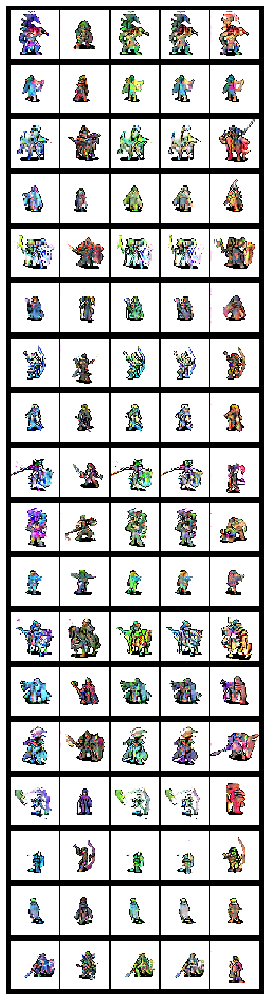


Row order:
01. feminine | barbarian
02. feminine | bard
03. feminine | cavalry
04. feminine | cleric
05. feminine | knight
06. feminine | mage
07. feminine | ranger
08. feminine | rogue
09. feminine | warrior
10. masculine | barbarian
11. masculine | bard
12. masculine | cavalry
13. masculine | cleric
14. masculine | knight
15. masculine | mage
16. masculine | ranger
17. masculine | rogue
18. masculine | warrior


In [10]:
# visualize all conditions

def build_cond(g_idx, h_idx, p_idx):
    gender_oh  = one_hot(g_idx, n_gender)
    hero_oh    = one_hot(h_idx, n_hero)
    palette_oh = one_hot(p_idx, n_palette)
    return torch.from_numpy(
        np.concatenate([gender_oh, hero_oh, palette_oh]).astype(np.float32)
    )

@torch.no_grad()
def generate_all_grids(G_ema):
    G_ema.eval()
    rows_imgs, titles = [], []

    for g_name in gender_classes:
        g_idx = gender_to_idx[g_name]
        for h_name in hero_classes:
            h_idx = hero_to_idx[h_name]

            conds = []
            for p_name in palette_classes:
                p_idx = palette_to_idx[p_name]
                conds.append(build_cond(g_idx, h_idx, p_idx))
            conds = torch.stack(conds).to(device)

            z = torch.randn(len(palette_classes), nz, device=device)
            fake = denorm(G_ema(z, conds).cpu())

            grid = vutils.make_grid(fake, nrow=len(palette_classes), padding=2)
            rows_imgs.append(grid)
            titles.append(f"{g_name} | {h_name}")

    big = torch.stack(rows_imgs)
    final_grid = vutils.make_grid(big, nrow=1, padding=4)

    out_path = SAMPLES_DIR / "ALL_CONDITIONS_grid_v7.png"
    vutils.save_image(final_grid, out_path)
    print("Saved full conditions grid to:", out_path)

    plt.figure(figsize=(8, max(8, len(rows_imgs)*1.2)))
    plt.axis("off")
    plt.imshow(final_grid.permute(1,2,0).numpy(), interpolation="nearest")
    plt.show()

    print("\nRow order:")
    for i, t in enumerate(titles):
        print(f"{i+1:02d}. {t}")

generate_all_grids(G_ema)


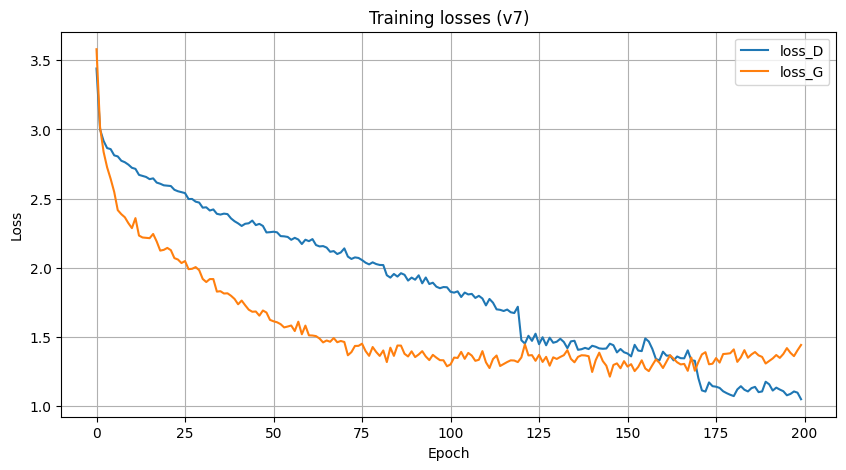

In [11]:
# plot losses v7
plt.figure(figsize=(10,5))
plt.plot(losses_D, label="loss_D")
plt.plot(losses_G, label="loss_G")
plt.title("Training losses (v7)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


# Ещё попытка сбалансировать генератор и дискриминатор

In [1]:
# config & paths for v8 (bbox + projection cGAN)
from datetime import datetime
from pathlib import Path
import sys, json, random

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils import spectral_norm
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

import numpy as np
import pandas as pd
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms as T
from PIL import Image

PROJECT_ROOT = Path(r"D:\ML\LS\Deep_learning\GAN\hero_portrait_generator")
DATA_DIR = PROJECT_ROOT / "data"

SRC_DIR = PROJECT_ROOT / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.append(str(SRC_DIR))

from utils.config import DATASET_CONFIG, CDC_GAN_CONFIG
print("DATASET_CONFIG:", DATASET_CONFIG)
print("CDC_GAN_CONFIG:", CDC_GAN_CONFIG)

nz = 128

# Генератор достаточно мощный, дискриминатор попроще
ngf = 128
ndf = 96

image_size = 64
batch_size = 64

num_epochs = 200   # первый прогон

# TTUR
lrG = 2e-4
lrD = 1e-4

beta1, beta2 = 0.0, 0.9

ema_decay = 0.999

# R1
r1_gamma = 5.0
r1_every = 16

# instance noise (чуть-чуть для стабилизации)
noise_sigma_start = 0.05
noise_sigma_end   = 0.0
noise_anneal_epochs = 80

# 1D : 1G
d_steps = 1
g_steps = 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

with open(DATA_DIR / "label_mappings.json", "r", encoding="utf-8") as f:
    label_mappings = json.load(f)

gender_classes   = label_mappings["gender_classes"]
gender_to_idx    = label_mappings["gender_to_idx"]
hero_classes     = label_mappings["hero_classes"]
hero_to_idx      = label_mappings["hero_to_idx"]
palette_classes  = label_mappings["palette_classes"]
palette_to_idx   = label_mappings["palette_to_idx"]

n_gender  = len(gender_classes)
n_hero    = len(hero_classes)
n_palette = len(palette_classes)

cond_dim = n_gender + n_hero + n_palette
print("n_gender, n_hero, n_palette:", n_gender, n_hero, n_palette)
print("cond_dim =", cond_dim)

RUN_ID = datetime.now().strftime("%Y%m%d-%H%M%S")
ARTIFACTS_DIR = PROJECT_ROOT / "artifacts_gan"
SAMPLES_DIR = ARTIFACTS_DIR / "samples" / RUN_ID
CKPT_DIR = ARTIFACTS_DIR / "checkpoints" / RUN_ID

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
CKPT_DIR.mkdir(parents=True, exist_ok=True)

print("RUN_ID:", RUN_ID)
print("SAMPLES_DIR:", SAMPLES_DIR)
print("CKPT_DIR:", CKPT_DIR)

def seed_all(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = True

seed_all(42)


DATASET_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'num_gender_classes': 2, 'num_hero_classes': 9, 'num_palette_classes': 5}
CDC_GAN_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'nz': 128, 'ngf': 64, 'ndf': 64}
device: cuda
n_gender, n_hero, n_palette: 2 9 5
cond_dim = 16
RUN_ID: 20251126-222448
SAMPLES_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448
CKPT_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251126-222448


In [2]:
# ResBlocks + Self-Attention 

class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.query = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.key   = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.value = spectral_norm(nn.Conv2d(in_channels, in_channels, 1))
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        B, C, H, W = x.size()
        q = self.query(x).view(B, -1, H * W).permute(0, 2, 1)
        k = self.key(x).view(B, -1, H * W)
        attn = torch.softmax(torch.bmm(q, k), dim=-1)
        v = self.value(x).view(B, C, -1)
        out = torch.bmm(v, attn.permute(0, 2, 1)).view(B, C, H, W)
        return self.gamma * out + x


class GenResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode="nearest")
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False)
        self.bn1   = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False)
        self.bn2   = nn.BatchNorm2d(out_channels)
        self.conv_skip = nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False)

    def forward(self, x):
        skip = self.upsample(x)
        skip = self.conv_skip(skip)

        out = self.upsample(x)
        out = self.conv1(out)
        out = self.bn1(out)
        out = F.relu(out, inplace=False)

        out = self.conv2(out)
        out = self.bn2(out)

        out = F.relu(out + skip, inplace=False)
        return out


class DiscResBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample=True):
        super().__init__()
        self.downsample = downsample
        self.conv1 = spectral_norm(nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False))
        self.conv2 = spectral_norm(nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False))
        self.conv_skip = spectral_norm(nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False))
        if downsample:
            self.avgpool = nn.AvgPool2d(2)

    def forward(self, x):
        skip = x
        if self.downsample:
            skip = self.avgpool(skip)
        skip = self.conv_skip(skip)

        out = F.leaky_relu(x, 0.2, inplace=False)
        out = self.conv1(out)
        out = F.leaky_relu(out, 0.2, inplace=False)
        out = self.conv2(out)
        if self.downsample:
            out = self.avgpool(out)

        return out + skip


In [3]:
# FiLM 

class FiLM(nn.Module):
    def __init__(self, cond_dim, channels):
        super().__init__()
        self.to_gamma = nn.Linear(cond_dim, channels)
        self.to_beta  = nn.Linear(cond_dim, channels)
        nn.init.zeros_(self.to_gamma.weight); nn.init.zeros_(self.to_gamma.bias)
        nn.init.zeros_(self.to_beta.weight);  nn.init.zeros_(self.to_beta.bias)

    def forward(self, x, cond):
        g = self.to_gamma(cond).view(cond.size(0), -1, 1, 1)
        b = self.to_beta(cond).view(cond.size(0), -1, 1, 1)
        return x * (1.0 + g) + b


In [4]:
# Strong Conditional Generator v8 (FiLM + SA)

class StrongConditionalGeneratorV8(nn.Module):
    def __init__(self, nz, cond_dim, ngf=128, nc=3):
        super().__init__()
        in_dim = nz + cond_dim
        self.fc = nn.Linear(in_dim, ngf * 8 * 4 * 4)

        self.b1 = GenResBlock(ngf*8, ngf*8); self.f1 = FiLM(cond_dim, ngf*8)
        self.b2 = GenResBlock(ngf*8, ngf*4); self.f2 = FiLM(cond_dim, ngf*4)
        self.b3 = GenResBlock(ngf*4, ngf*2); self.f3 = FiLM(cond_dim, ngf*2)

        self.attn = SelfAttention(ngf*2)

        self.b4 = GenResBlock(ngf*2, ngf);   self.f4 = FiLM(cond_dim, ngf)

        self.out = nn.Conv2d(ngf, nc, 3,1,1, bias=False)

    def forward(self, z, cond):
        x = torch.cat([z, cond], dim=1)
        x = self.fc(x).view(x.size(0), -1, 4, 4)

        x = self.b1(x); x = self.f1(x, cond)
        x = self.b2(x); x = self.f2(x, cond)
        x = self.b3(x); x = self.f3(x, cond)
        x = self.attn(x)
        x = self.b4(x); x = self.f4(x, cond)

        return torch.tanh(self.out(x))


In [5]:
# Projection Discriminator v8 (без ACGAN)

class ProjectionDiscriminatorV8(nn.Module):
    def __init__(self, cond_dim, ndf=96, nc=3):
        super().__init__()
        self.cond_dim = cond_dim

        self.b1 = DiscResBlock(nc, ndf, downsample=True)
        self.b2 = DiscResBlock(ndf, ndf*2, downsample=True)
        self.b3 = DiscResBlock(ndf*2, ndf*4, downsample=True)
        self.b4 = DiscResBlock(ndf*4, ndf*8, downsample=True)

        feat_dim = ndf * 8
        self.adv = spectral_norm(nn.Linear(feat_dim, 1))
        self.cond_proj = spectral_norm(nn.Linear(cond_dim, feat_dim))

    def forward(self, img, cond):
        x = self.b1(img); x = self.b2(x); x = self.b3(x); x = self.b4(x)
        feat = x.sum(dim=[2,3])          # [B, feat_dim]

        adv_score = self.adv(feat).view(-1)
        proj = (feat * self.cond_proj(cond)).sum(dim=1)
        score = adv_score + proj
        return score


In [6]:
# Dataset v8 with bbox cropping 

def one_hot(index: int, num_classes: int) -> np.ndarray:
    vec = np.zeros(num_classes, dtype=np.float32)
    vec[index] = 1.0
    return vec

def compute_bbox_from_rgba(img_rgba: Image.Image, bg_color=(255,255,255,0)):
    """
    Находим tight bbox по альфе (или по отличию от белого фона).
    Возвращаем (x1, y1, x2, y2) либо None, если не нашли.
    """
    arr = np.array(img_rgba)  # H, W, 4
    H, W, _ = arr.shape

    alpha = arr[..., 3]
    mask = alpha > 0

    if not mask.any():
        rgb = arr[...,:3]
        bg = np.array([255,255,255], dtype=rgb.dtype)
        mask = np.any(rgb != bg, axis=-1)

    if not mask.any():
        return None

    ys, xs = np.where(mask)
    y1, y2 = ys.min(), ys.max()
    x1, x2 = xs.min(), xs.max()
    return int(x1), int(y1), int(x2), int(y2)


class HeroPortraitDatasetV8(Dataset):
    """
    Использует sprites_train/val.csv, но для каждого спрайта делает:
    - открывает RGBA
    - находит tight bbox вокруг героя
    - слегка паддит bbox
    - кропает и приводит к RGB, потом ресайз до 64x64 и нормализацию в [-1,1]
    """
    def __init__(self, df, project_root, image_size=64, normalize=True, bbox_pad=2):
        self.df = df.reset_index(drop=True)
        self.project_root = Path(project_root)
        self.image_size = image_size
        self.bbox_pad = bbox_pad

        tfs = [
            T.Resize((image_size, image_size), interpolation=T.InterpolationMode.NEAREST),
            T.ToTensor(),
        ]
        if normalize:
            tfs.append(T.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5]))
        self.transform = T.Compose(tfs)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = (self.project_root / row["rel_path"]).resolve()

        img_rgba = Image.open(img_path).convert("RGBA")
        bbox = compute_bbox_from_rgba(img_rgba)

        if bbox is not None:
            x1, y1, x2, y2 = bbox
            # паддинг
            x1 = max(0, x1 - self.bbox_pad)
            y1 = max(0, y1 - self.bbox_pad)
            x2 = min(img_rgba.width - 1,  x2 + self.bbox_pad)
            y2 = min(img_rgba.height - 1, y2 + self.bbox_pad)
            img_rgba = img_rgba.crop((x1, y1, x2+1, y2+1))

        # белый фон вместо альфы
        if img_rgba.mode == "RGBA":
            bg = Image.new("RGBA", img_rgba.size, (255,255,255,255))
            img_rgb = Image.alpha_composite(bg, img_rgba).convert("RGB")
        else:
            img_rgb = img_rgba.convert("RGB")

        img_t = self.transform(img_rgb)

        g_idx = int(row["gender_idx"])
        h_idx = int(row["hero_idx"])
        p_idx = int(row["palette_idx"])

        cond_vec = np.concatenate([
            one_hot(g_idx, n_gender),
            one_hot(h_idx, n_hero),
            one_hot(p_idx, n_palette)
        ]).astype(np.float32)

        return {
            "image": img_t,
            "cond": torch.from_numpy(cond_vec),
            "g_idx": g_idx,
            "h_idx": h_idx,
            "p_idx": p_idx
        }


train_df = pd.read_csv(DATA_DIR / "sprites_train.csv")
val_df   = pd.read_csv(DATA_DIR / "sprites_val.csv")
FULL_DF = pd.concat([train_df, val_df], ignore_index=True)

dataset = HeroPortraitDatasetV8(FULL_DF, PROJECT_ROOT, image_size=image_size)

train_loader = DataLoader(
    dataset, batch_size=batch_size, shuffle=True,
    num_workers=0, pin_memory=False, drop_last=True
)

print("dataset size:", len(dataset))
print("batches:", len(train_loader))

# sanity-check одной выборки
batch = next(iter(train_loader))
print("batch['image'].shape:", batch["image"].shape)


dataset size: 7596
batches: 118
batch['image'].shape: torch.Size([64, 3, 64, 64])


In [8]:
# helpers (denorm, noise, R1, EMA)

def denorm(x):
    return x * 0.5 + 0.5

def add_instance_noise(x, epoch):
    if epoch >= noise_anneal_epochs:
        sigma = noise_sigma_end
    else:
        t = epoch / max(1, noise_anneal_epochs)
        sigma = noise_sigma_start * (1 - t) + noise_sigma_end * t
    return x if sigma <= 0 else x + torch.randn_like(x) * sigma

def r1_penalty(d_out, x):
    grad = torch.autograd.grad(
        outputs=d_out.sum(), inputs=x,
        create_graph=True, retain_graph=True, only_inputs=True
    )[0]
    return grad.view(grad.size(0), -1).pow(2).sum(dim=1).mean()

@torch.no_grad()
def update_ema(G, G_ema, decay=0.999):
    for p, p_ema in zip(G.parameters(), G_ema.parameters()):
        p_ema.data.mul_(decay).add_(p.data, alpha=1 - decay)
    for b, b_ema in zip(G.buffers(), G_ema.buffers()):
        b_ema.copy_(b)

def save_sample_images(epoch, G_ema, fixed_noise, fixed_conds):
    G_ema.eval()
    with torch.no_grad():
        fake = G_ema(fixed_noise, fixed_conds).cpu()
    grid = vutils.make_grid(denorm(fake), nrow=4, padding=2)
    out_path = SAMPLES_DIR / f"epoch_{epoch:03d}.png"
    plt.figure(figsize=(6,6))
    plt.axis("off")
    plt.imshow(grid.permute(1,2,0).numpy(), interpolation="nearest")
    plt.tight_layout()
    plt.savefig(out_path, dpi=150)
    plt.close()
    print("[samples] Saved:", out_path)

def augment(x):
    return x


In [9]:
# init models, optimizers, schedulers

G = StrongConditionalGeneratorV8(nz=nz, cond_dim=cond_dim, ngf=ngf).to(device)
D = ProjectionDiscriminatorV8(cond_dim=cond_dim, ndf=ndf).to(device)

G_ema = StrongConditionalGeneratorV8(nz=nz, cond_dim=cond_dim, ngf=ngf).to(device)
G_ema.load_state_dict(G.state_dict())
G_ema.eval()
for p in G_ema.parameters():
    p.requires_grad_(False)

print("Params G:", sum(p.numel() for p in G.parameters()))
print("Params D:", sum(p.numel() for p in D.parameters()))

optimizerG = torch.optim.Adam(G.parameters(), lr=lrG, betas=(beta1, beta2))
optimizerD = torch.optim.Adam(D.parameters(), lr=lrD, betas=(beta1, beta2))

schedulerG = torch.optim.lr_scheduler.MultiStepLR(optimizerG, milestones=[120, 170], gamma=0.5)
schedulerD = torch.optim.lr_scheduler.MultiStepLR(optimizerD, milestones=[120, 170], gamma=0.5)

fixed_batch = next(iter(train_loader))
fixed_conds = fixed_batch["cond"][:16].to(device)
fixed_noise = torch.randn(16, nz, device=device)

print("fixed shapes:", fixed_noise.shape, fixed_conds.shape)

# sanity forward
G.eval(); D.eval()
with torch.no_grad():
    test_fake = G(fixed_noise, fixed_conds)
    test_score = D(test_fake, fixed_conds)
print("test_fake.shape:", test_fake.shape)
print("test_score.shape:", test_score.shape)
G.train(); D.train()


Params G: 32435137
Params D: 10937665
fixed shapes: torch.Size([16, 128]) torch.Size([16, 16])
test_fake.shape: torch.Size([16, 3, 64, 64])
test_score.shape: torch.Size([16])


ProjectionDiscriminatorV8(
  (b1): DiscResBlock(
    (conv1): Conv2d(3, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv2): Conv2d(96, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv_skip): Conv2d(3, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (avgpool): AvgPool2d(kernel_size=2, stride=2, padding=0)
  )
  (b2): DiscResBlock(
    (conv1): Conv2d(96, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv2): Conv2d(192, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv_skip): Conv2d(96, 192, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (avgpool): AvgPool2d(kernel_size=2, stride=2, padding=0)
  )
  (b3): DiscResBlock(
    (conv1): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv2): Conv2d(384, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv_skip): Conv2d(192, 384, kernel_size=(1, 1), stride=(1, 1)

In [10]:
# training loop v8

losses_D, losses_G = [], []
global_step = 0
start_epoch = 1

for epoch in range(start_epoch, num_epochs + 1):
    G.train(); D.train()
    epoch_loss_D, epoch_loss_G = 0.0, 0.0
    num_batches = 0

    pbar = tqdm(train_loader, desc=f"Epoch [{epoch}/{num_epochs}]", leave=False)

    for batch in pbar:
        real = batch["image"].to(device)
        cond = batch["cond"].to(device)
        B = real.size(0)

        # D step 
        for _ in range(d_steps):
            optimizerD.zero_grad(set_to_none=True)

            real.requires_grad_(True)
            real_noisy = add_instance_noise(real, epoch)
            real_aug = augment(real_noisy)

            real_score = D(real_aug, cond)
            loss_D_real = torch.relu(1.0 - real_score).mean()

            z = torch.randn(B, nz, device=device)
            fake = G(z, cond).detach()
            fake_noisy = add_instance_noise(fake, epoch)
            fake_aug = augment(fake_noisy)
            fake_score = D(fake_aug, cond)
            loss_D_fake = torch.relu(1.0 + fake_score).mean()

            loss_D = loss_D_real + loss_D_fake

            if global_step % r1_every == 0:
                r1 = r1_penalty(real_score, real)
                loss_D = loss_D + (r1_gamma / 2.0) * r1

            loss_D.backward()
            optimizerD.step()
            real.requires_grad_(False)

        # G step 
        for _ in range(g_steps):
            optimizerG.zero_grad(set_to_none=True)

            z = torch.randn(B, nz, device=device)
            fake = G(z, cond)
            fake_aug = augment(fake)
            fake_score = D(fake_aug, cond)

            loss_G = -fake_score.mean()
            loss_G.backward()
            optimizerG.step()

            update_ema(G, G_ema, ema_decay)

        epoch_loss_D += loss_D.item()
        epoch_loss_G += loss_G.item()
        num_batches += 1
        global_step += 1

        pbar.set_postfix(loss_D=f"{loss_D.item():.3f}", loss_G=f"{loss_G.item():.3f}")

    epoch_loss_D /= num_batches
    epoch_loss_G /= num_batches
    losses_D.append(epoch_loss_D)
    losses_G.append(epoch_loss_G)

    schedulerD.step()
    schedulerG.step()

    print(f"[Epoch {epoch:03d}/{num_epochs}] mean loss_D: {epoch_loss_D:.4f} | mean loss_G: {epoch_loss_G:.4f}")

    if epoch % 10 == 0 or epoch == 1:
        save_sample_images(epoch, G_ema, fixed_noise, fixed_conds)

    if epoch % 50 == 0 or epoch == num_epochs:
        ckpt_path = CKPT_DIR / f"hero_v8_bbox_epoch_{epoch:03d}.pth"
        torch.save(
            {
                "epoch": epoch,
                "G_state_dict": G.state_dict(),
                "G_ema_state_dict": G_ema.state_dict(),
                "D_state_dict": D.state_dict(),
                "optimizerG_state_dict": optimizerG.state_dict(),
                "optimizerD_state_dict": optimizerD.state_dict(),
                "losses_G": losses_G,
                "losses_D": losses_D,
                "config": {
                    "nz": nz, "cond_dim": cond_dim,
                    "ngf": ngf, "ndf": ndf,
                    "batch_size": batch_size,
                    "num_epochs": num_epochs,
                    "lrG": lrG, "lrD": lrD,
                    "g_steps": g_steps, "d_steps": d_steps,
                    "ema_decay": ema_decay,
                    "r1_gamma": r1_gamma,
                    "r1_every": r1_every,
                    "noise_sigma_start": noise_sigma_start,
                    "noise_anneal_epochs": noise_anneal_epochs,
                    "run_id": RUN_ID,
                },
            },
            ckpt_path
        )
        print("[ckpt] Saved:", ckpt_path)


Epoch [1/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 001/200] mean loss_D: 2.2046 | mean loss_G: 0.3914
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_001.png


Epoch [2/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 002/200] mean loss_D: 2.0204 | mean loss_G: -0.1753


Epoch [3/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 003/200] mean loss_D: 2.0068 | mean loss_G: -0.1695


Epoch [4/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 004/200] mean loss_D: 1.9865 | mean loss_G: -0.2566


Epoch [5/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 005/200] mean loss_D: 1.9659 | mean loss_G: -0.1186


Epoch [6/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 006/200] mean loss_D: 1.9145 | mean loss_G: -0.0595


Epoch [7/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 007/200] mean loss_D: 1.9034 | mean loss_G: 0.0035


Epoch [8/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 008/200] mean loss_D: 1.8881 | mean loss_G: -0.0315


Epoch [9/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 009/200] mean loss_D: 1.8238 | mean loss_G: 0.0109


Epoch [10/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 010/200] mean loss_D: 1.8083 | mean loss_G: 0.0548
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_010.png


Epoch [11/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 011/200] mean loss_D: 1.7043 | mean loss_G: 0.1968


Epoch [12/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 012/200] mean loss_D: 1.6505 | mean loss_G: 0.2091


Epoch [13/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 013/200] mean loss_D: 1.5641 | mean loss_G: 0.2419


Epoch [14/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 014/200] mean loss_D: 1.5068 | mean loss_G: 0.1471


Epoch [15/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 015/200] mean loss_D: 1.4542 | mean loss_G: 0.1173


Epoch [16/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 016/200] mean loss_D: 1.3760 | mean loss_G: 0.1031


Epoch [17/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 017/200] mean loss_D: 1.3122 | mean loss_G: 0.0953


Epoch [18/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 018/200] mean loss_D: 1.2544 | mean loss_G: 0.1275


Epoch [19/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 019/200] mean loss_D: 1.2180 | mean loss_G: 0.1067


Epoch [20/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 020/200] mean loss_D: 1.1691 | mean loss_G: 0.1136
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_020.png


Epoch [21/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 021/200] mean loss_D: 1.1621 | mean loss_G: 0.1111


Epoch [22/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 022/200] mean loss_D: 1.1264 | mean loss_G: 0.1234


Epoch [23/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 023/200] mean loss_D: 1.0647 | mean loss_G: 0.1327


Epoch [24/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 024/200] mean loss_D: 1.0174 | mean loss_G: 0.1687


Epoch [25/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 025/200] mean loss_D: 0.9512 | mean loss_G: 0.1232


Epoch [26/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 026/200] mean loss_D: 0.9376 | mean loss_G: 0.1630


Epoch [27/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 027/200] mean loss_D: 0.8720 | mean loss_G: 0.1467


Epoch [28/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 028/200] mean loss_D: 0.8152 | mean loss_G: 0.1637


Epoch [29/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 029/200] mean loss_D: 0.8627 | mean loss_G: 0.1387


Epoch [30/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 030/200] mean loss_D: 0.8700 | mean loss_G: 0.1579
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_030.png


Epoch [31/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 031/200] mean loss_D: 0.7842 | mean loss_G: 0.1870


Epoch [32/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 032/200] mean loss_D: 0.7595 | mean loss_G: 0.1786


Epoch [33/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 033/200] mean loss_D: 0.7734 | mean loss_G: 0.1722


Epoch [34/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 034/200] mean loss_D: 0.6915 | mean loss_G: 0.1768


Epoch [35/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 035/200] mean loss_D: 0.7108 | mean loss_G: 0.2088


Epoch [36/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 036/200] mean loss_D: 0.7096 | mean loss_G: 0.2007


Epoch [37/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 037/200] mean loss_D: 0.7088 | mean loss_G: 0.1961


Epoch [38/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 038/200] mean loss_D: 0.6716 | mean loss_G: 0.1841


Epoch [39/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 039/200] mean loss_D: 0.6585 | mean loss_G: 0.2044


Epoch [40/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 040/200] mean loss_D: 0.6587 | mean loss_G: 0.2241
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_040.png


Epoch [41/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 041/200] mean loss_D: 0.6284 | mean loss_G: 0.2229


Epoch [42/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 042/200] mean loss_D: 0.6821 | mean loss_G: 0.2277


Epoch [43/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 043/200] mean loss_D: 0.6829 | mean loss_G: 0.1906


Epoch [44/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 044/200] mean loss_D: 0.6025 | mean loss_G: 0.2506


Epoch [45/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 045/200] mean loss_D: 0.6120 | mean loss_G: 0.2365


Epoch [46/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 046/200] mean loss_D: 0.6880 | mean loss_G: 0.2275


Epoch [47/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 047/200] mean loss_D: 0.5972 | mean loss_G: 0.2726


Epoch [48/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 048/200] mean loss_D: 0.5517 | mean loss_G: 0.2381


Epoch [49/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 049/200] mean loss_D: 0.6000 | mean loss_G: 0.2534


Epoch [50/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 050/200] mean loss_D: 0.6142 | mean loss_G: 0.2518
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_050.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251126-222448\hero_v8_bbox_epoch_050.pth


Epoch [51/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 051/200] mean loss_D: 0.6747 | mean loss_G: 0.2508


Epoch [52/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 052/200] mean loss_D: 0.5644 | mean loss_G: 0.2561


Epoch [53/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 053/200] mean loss_D: 0.5751 | mean loss_G: 0.2578


Epoch [54/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 054/200] mean loss_D: 0.5965 | mean loss_G: 0.3104


Epoch [55/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 055/200] mean loss_D: 0.6361 | mean loss_G: 0.2865


Epoch [56/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 056/200] mean loss_D: 0.5745 | mean loss_G: 0.3097


Epoch [57/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 057/200] mean loss_D: 0.5956 | mean loss_G: 0.2797


Epoch [58/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 058/200] mean loss_D: 0.5947 | mean loss_G: 0.3003


Epoch [59/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 059/200] mean loss_D: 0.6530 | mean loss_G: 0.2964


Epoch [60/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 060/200] mean loss_D: 0.6383 | mean loss_G: 0.3415
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_060.png


Epoch [61/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 061/200] mean loss_D: 0.6225 | mean loss_G: 0.3329


Epoch [62/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 062/200] mean loss_D: 0.5556 | mean loss_G: 0.3248


Epoch [63/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 063/200] mean loss_D: 0.6898 | mean loss_G: 0.3629


Epoch [64/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 064/200] mean loss_D: 0.6610 | mean loss_G: 0.3381


Epoch [65/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 065/200] mean loss_D: 0.6295 | mean loss_G: 0.3441


Epoch [66/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 066/200] mean loss_D: 0.6289 | mean loss_G: 0.3621


Epoch [67/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 067/200] mean loss_D: 0.7524 | mean loss_G: 0.3939


Epoch [68/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 068/200] mean loss_D: 0.7481 | mean loss_G: 0.3910


Epoch [69/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 069/200] mean loss_D: 0.5995 | mean loss_G: 0.3894


Epoch [70/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 070/200] mean loss_D: 0.7981 | mean loss_G: 0.4192
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_070.png


Epoch [71/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 071/200] mean loss_D: 0.6935 | mean loss_G: 0.4210


Epoch [72/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 072/200] mean loss_D: 0.7844 | mean loss_G: 0.4072


Epoch [73/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 073/200] mean loss_D: 0.6405 | mean loss_G: 0.4371


Epoch [74/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 074/200] mean loss_D: 0.6834 | mean loss_G: 0.4581


Epoch [75/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 075/200] mean loss_D: 0.8990 | mean loss_G: 0.4539


Epoch [76/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 076/200] mean loss_D: 0.7613 | mean loss_G: 0.4512


Epoch [77/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 077/200] mean loss_D: 0.7315 | mean loss_G: 0.4793


Epoch [78/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 078/200] mean loss_D: 0.7454 | mean loss_G: 0.4790


Epoch [79/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 079/200] mean loss_D: 0.7203 | mean loss_G: 0.4904


Epoch [80/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 080/200] mean loss_D: 0.7310 | mean loss_G: 0.5000
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_080.png


Epoch [81/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 081/200] mean loss_D: 0.7298 | mean loss_G: 0.5021


Epoch [82/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 082/200] mean loss_D: 0.7092 | mean loss_G: 0.5210


Epoch [83/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 083/200] mean loss_D: 0.7110 | mean loss_G: 0.5195


Epoch [84/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 084/200] mean loss_D: 0.6882 | mean loss_G: 0.5395


Epoch [85/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 085/200] mean loss_D: 0.7091 | mean loss_G: 0.5429


Epoch [86/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 086/200] mean loss_D: 0.6774 | mean loss_G: 0.5576


Epoch [87/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 087/200] mean loss_D: 0.6614 | mean loss_G: 0.5747


Epoch [88/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 088/200] mean loss_D: 0.6474 | mean loss_G: 0.5740


Epoch [89/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 089/200] mean loss_D: 0.6447 | mean loss_G: 0.5891


Epoch [90/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 090/200] mean loss_D: 0.6407 | mean loss_G: 0.6045
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_090.png


Epoch [91/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 091/200] mean loss_D: 0.6406 | mean loss_G: 0.6051


Epoch [92/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 092/200] mean loss_D: 0.6568 | mean loss_G: 0.6211


Epoch [93/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 093/200] mean loss_D: 0.6406 | mean loss_G: 0.6369


Epoch [94/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 094/200] mean loss_D: 0.6302 | mean loss_G: 0.6496


Epoch [95/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 095/200] mean loss_D: 0.6232 | mean loss_G: 0.6559


Epoch [96/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 096/200] mean loss_D: 0.6143 | mean loss_G: 0.6684


Epoch [97/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 097/200] mean loss_D: 0.6155 | mean loss_G: 0.6874


Epoch [98/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 098/200] mean loss_D: 0.5793 | mean loss_G: 0.6934


Epoch [99/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 099/200] mean loss_D: 0.6095 | mean loss_G: 0.7022


Epoch [100/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 100/200] mean loss_D: 0.5742 | mean loss_G: 0.7160
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_100.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251126-222448\hero_v8_bbox_epoch_100.pth


Epoch [101/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 101/200] mean loss_D: 0.5692 | mean loss_G: 0.7282


Epoch [102/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 102/200] mean loss_D: 0.5787 | mean loss_G: 0.7423


Epoch [103/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 103/200] mean loss_D: 0.5472 | mean loss_G: 0.7440


Epoch [104/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 104/200] mean loss_D: 0.5398 | mean loss_G: 0.7562


Epoch [105/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 105/200] mean loss_D: 0.5292 | mean loss_G: 0.7738


Epoch [106/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 106/200] mean loss_D: 0.5268 | mean loss_G: 0.7803


Epoch [107/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 107/200] mean loss_D: 0.5166 | mean loss_G: 0.7942


Epoch [108/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 108/200] mean loss_D: 0.5107 | mean loss_G: 0.8055


Epoch [109/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 109/200] mean loss_D: 0.4957 | mean loss_G: 0.8106


Epoch [110/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 110/200] mean loss_D: 0.4837 | mean loss_G: 0.8201
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_110.png


Epoch [111/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 111/200] mean loss_D: 0.4758 | mean loss_G: 0.8382


Epoch [112/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 112/200] mean loss_D: 0.4643 | mean loss_G: 0.8413


Epoch [113/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 113/200] mean loss_D: 0.4654 | mean loss_G: 0.8514


Epoch [114/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 114/200] mean loss_D: 0.4504 | mean loss_G: 0.8670


Epoch [115/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 115/200] mean loss_D: 0.4450 | mean loss_G: 0.8787


Epoch [116/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 116/200] mean loss_D: 0.4381 | mean loss_G: 0.8813


Epoch [117/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 117/200] mean loss_D: 0.4328 | mean loss_G: 0.8956


Epoch [118/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 118/200] mean loss_D: 0.4212 | mean loss_G: 0.9029


Epoch [119/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 119/200] mean loss_D: 0.4046 | mean loss_G: 0.9165


Epoch [120/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 120/200] mean loss_D: 0.3972 | mean loss_G: 0.9170
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_120.png


Epoch [121/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 121/200] mean loss_D: 0.3688 | mean loss_G: 0.9437


Epoch [122/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 122/200] mean loss_D: 0.3617 | mean loss_G: 0.9403


Epoch [123/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 123/200] mean loss_D: 0.3574 | mean loss_G: 0.9528


Epoch [124/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 124/200] mean loss_D: 0.3453 | mean loss_G: 0.9514


Epoch [125/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 125/200] mean loss_D: 0.3510 | mean loss_G: 0.9553


Epoch [126/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 126/200] mean loss_D: 0.3422 | mean loss_G: 0.9616


Epoch [127/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 127/200] mean loss_D: 0.3398 | mean loss_G: 0.9688


Epoch [128/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 128/200] mean loss_D: 0.3278 | mean loss_G: 0.9693


Epoch [129/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 129/200] mean loss_D: 0.3368 | mean loss_G: 0.9740


Epoch [130/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 130/200] mean loss_D: 0.3324 | mean loss_G: 0.9799
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_130.png


Epoch [131/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 131/200] mean loss_D: 0.3314 | mean loss_G: 0.9798


Epoch [132/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 132/200] mean loss_D: 0.3262 | mean loss_G: 0.9853


Epoch [133/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 133/200] mean loss_D: 0.3295 | mean loss_G: 0.9845


Epoch [134/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 134/200] mean loss_D: 0.3299 | mean loss_G: 0.9906


Epoch [135/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 135/200] mean loss_D: 0.3272 | mean loss_G: 0.9936


Epoch [136/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 136/200] mean loss_D: 0.3341 | mean loss_G: 0.9935


Epoch [137/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 137/200] mean loss_D: 0.3292 | mean loss_G: 0.9999


Epoch [138/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 138/200] mean loss_D: 0.3273 | mean loss_G: 1.0055


Epoch [139/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 139/200] mean loss_D: 0.3325 | mean loss_G: 0.9998


Epoch [140/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 140/200] mean loss_D: 0.3375 | mean loss_G: 1.0064
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_140.png


Epoch [141/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 141/200] mean loss_D: 0.3326 | mean loss_G: 1.0140


Epoch [142/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 142/200] mean loss_D: 0.3307 | mean loss_G: 1.0157


Epoch [143/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 143/200] mean loss_D: 0.3389 | mean loss_G: 1.0227


Epoch [144/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 144/200] mean loss_D: 0.3381 | mean loss_G: 1.0168


Epoch [145/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 145/200] mean loss_D: 0.3384 | mean loss_G: 1.0248


Epoch [146/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 146/200] mean loss_D: 0.3372 | mean loss_G: 1.0236


Epoch [147/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 147/200] mean loss_D: 0.3393 | mean loss_G: 1.0206


Epoch [148/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 148/200] mean loss_D: 0.3360 | mean loss_G: 1.0256


Epoch [149/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 149/200] mean loss_D: 0.3319 | mean loss_G: 1.0345


Epoch [150/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 150/200] mean loss_D: 0.3339 | mean loss_G: 1.0308
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_150.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251126-222448\hero_v8_bbox_epoch_150.pth


Epoch [151/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 151/200] mean loss_D: 0.3390 | mean loss_G: 1.0364


Epoch [152/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 152/200] mean loss_D: 0.3394 | mean loss_G: 1.0406


Epoch [153/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 153/200] mean loss_D: 0.3458 | mean loss_G: 1.0362


Epoch [154/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 154/200] mean loss_D: 0.3431 | mean loss_G: 1.0380


Epoch [155/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 155/200] mean loss_D: 0.3412 | mean loss_G: 1.0468


Epoch [156/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 156/200] mean loss_D: 0.3383 | mean loss_G: 1.0415


Epoch [157/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 157/200] mean loss_D: 0.3450 | mean loss_G: 1.0513


Epoch [158/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 158/200] mean loss_D: 0.3522 | mean loss_G: 1.0533


Epoch [159/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 159/200] mean loss_D: 0.3459 | mean loss_G: 1.0488


Epoch [160/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 160/200] mean loss_D: 0.3545 | mean loss_G: 1.0536
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_160.png


Epoch [161/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 161/200] mean loss_D: 0.3553 | mean loss_G: 1.0582


Epoch [162/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 162/200] mean loss_D: 0.3457 | mean loss_G: 1.0646


Epoch [163/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 163/200] mean loss_D: 0.3473 | mean loss_G: 1.0649


Epoch [164/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 164/200] mean loss_D: 0.3540 | mean loss_G: 1.0607


Epoch [165/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 165/200] mean loss_D: 0.3553 | mean loss_G: 1.0707


Epoch [166/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 166/200] mean loss_D: 0.3477 | mean loss_G: 1.0720


Epoch [167/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 167/200] mean loss_D: 0.3518 | mean loss_G: 1.0597


Epoch [168/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 168/200] mean loss_D: 0.3521 | mean loss_G: 1.0714


Epoch [169/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 169/200] mean loss_D: 0.3577 | mean loss_G: 1.0702


Epoch [170/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 170/200] mean loss_D: 0.3550 | mean loss_G: 1.0788
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_170.png


Epoch [171/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 171/200] mean loss_D: 0.3445 | mean loss_G: 1.0383


Epoch [172/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 172/200] mean loss_D: 0.3431 | mean loss_G: 1.0539


Epoch [173/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 173/200] mean loss_D: 0.3505 | mean loss_G: 1.0522


Epoch [174/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 174/200] mean loss_D: 0.3428 | mean loss_G: 1.0667


Epoch [175/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 175/200] mean loss_D: 0.3409 | mean loss_G: 1.0691


Epoch [176/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 176/200] mean loss_D: 0.3591 | mean loss_G: 1.0587


Epoch [177/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 177/200] mean loss_D: 0.3609 | mean loss_G: 1.0666


Epoch [178/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 178/200] mean loss_D: 0.3678 | mean loss_G: 1.0690


Epoch [179/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 179/200] mean loss_D: 0.3703 | mean loss_G: 1.0735


Epoch [180/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 180/200] mean loss_D: 0.3642 | mean loss_G: 1.0778
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_180.png


Epoch [181/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 181/200] mean loss_D: 0.3549 | mean loss_G: 1.0701


Epoch [182/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 182/200] mean loss_D: 0.3591 | mean loss_G: 1.0766


Epoch [183/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 183/200] mean loss_D: 0.3622 | mean loss_G: 1.0679


Epoch [184/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 184/200] mean loss_D: 0.3629 | mean loss_G: 1.0832


Epoch [185/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 185/200] mean loss_D: 0.3574 | mean loss_G: 1.0863


Epoch [186/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 186/200] mean loss_D: 0.3568 | mean loss_G: 1.0832


Epoch [187/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 187/200] mean loss_D: 0.3548 | mean loss_G: 1.0792


Epoch [188/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 188/200] mean loss_D: 0.3528 | mean loss_G: 1.0966


Epoch [189/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 189/200] mean loss_D: 0.3515 | mean loss_G: 1.0849


Epoch [190/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 190/200] mean loss_D: 0.3525 | mean loss_G: 1.0834
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_190.png


Epoch [191/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 191/200] mean loss_D: 0.3464 | mean loss_G: 1.0840


Epoch [192/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 192/200] mean loss_D: 0.3486 | mean loss_G: 1.0822


Epoch [193/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 193/200] mean loss_D: 0.3472 | mean loss_G: 1.0875


Epoch [194/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 194/200] mean loss_D: 0.3448 | mean loss_G: 1.0898


Epoch [195/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 195/200] mean loss_D: 0.3446 | mean loss_G: 1.0842


Epoch [196/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 196/200] mean loss_D: 0.3450 | mean loss_G: 1.0971


Epoch [197/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 197/200] mean loss_D: 0.3555 | mean loss_G: 1.0847


Epoch [198/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 198/200] mean loss_D: 0.3626 | mean loss_G: 1.0867


Epoch [199/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 199/200] mean loss_D: 0.3665 | mean loss_G: 1.0737


Epoch [200/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 200/200] mean loss_D: 0.3585 | mean loss_G: 1.0894
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\epoch_200.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251126-222448\hero_v8_bbox_epoch_200.pth


Saved full conditions grid to: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251126-222448\ALL_CONDITIONS_grid_v8_bbox.png


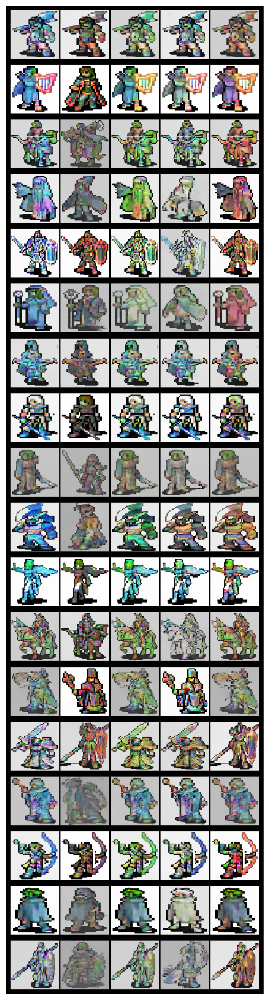


Row order:
01. feminine | barbarian
02. feminine | bard
03. feminine | cavalry
04. feminine | cleric
05. feminine | knight
06. feminine | mage
07. feminine | ranger
08. feminine | rogue
09. feminine | warrior
10. masculine | barbarian
11. masculine | bard
12. masculine | cavalry
13. masculine | cleric
14. masculine | knight
15. masculine | mage
16. masculine | ranger
17. masculine | rogue
18. masculine | warrior


In [11]:
# full conditions grid (gender x hero x palette) 

def build_cond(g_idx, h_idx, p_idx):
    gender_oh  = one_hot(g_idx, n_gender)
    hero_oh    = one_hot(h_idx, n_hero)
    palette_oh = one_hot(p_idx, n_palette)
    return torch.from_numpy(
        np.concatenate([gender_oh, hero_oh, palette_oh]).astype(np.float32)
    )

@torch.no_grad()
def generate_all_grids(G_ema):
    G_ema.eval()
    rows_imgs, titles = [], []

    for g_name in gender_classes:
        g_idx = gender_to_idx[g_name]
        for h_name in hero_classes:
            h_idx = hero_to_idx[h_name]

            conds = []
            for p_name in palette_classes:
                p_idx = palette_to_idx[p_name]
                conds.append(build_cond(g_idx, h_idx, p_idx))
            conds = torch.stack(conds).to(device)

            z = torch.randn(len(palette_classes), nz, device=device)
            fake = denorm(G_ema(z, conds).cpu())

            grid = vutils.make_grid(fake, nrow=len(palette_classes), padding=2)
            rows_imgs.append(grid)
            titles.append(f"{g_name} | {h_name}")

    big = torch.stack(rows_imgs)
    final_grid = vutils.make_grid(big, nrow=1, padding=4)

    out_path = SAMPLES_DIR / "ALL_CONDITIONS_grid_v8_bbox.png"
    vutils.save_image(final_grid, out_path)
    print("Saved full conditions grid to:", out_path)

    plt.figure(figsize=(8, max(8, len(rows_imgs)*1.2)))
    plt.axis("off")
    plt.imshow(final_grid.permute(1,2,0).numpy(), interpolation="nearest")
    plt.show()

    print("\nRow order:")
    for i, t in enumerate(titles):
        print(f"{i+1:02d}. {t}")

generate_all_grids(G_ema)


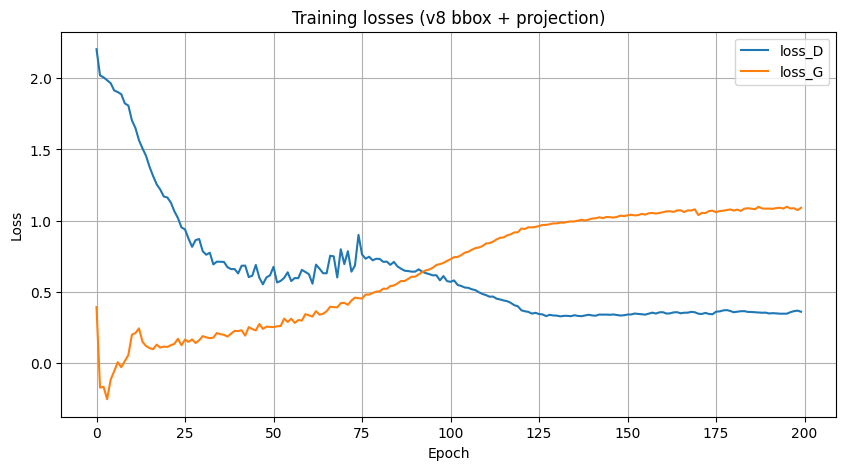

In [12]:
# plot losses (v8) 
plt.figure(figsize=(10,5))
plt.plot(losses_D, label="loss_D")
plt.plot(losses_G, label="loss_G")
plt.title("Training losses (v8 bbox + projection)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


## v8 — убрали palette из условий
 
Гипотеза: palette мешает.
 
Реальность: стало хуже.
 
Модель ушла в шум (пример: epoch_100.png — почти «цветной песок»).
 
Лоссы G/D выглядят норм, но output неадекватен → GAN регрессирует, контроль потерян.

In [1]:
# config & paths for cDCGAN without palette in cond 
from datetime import datetime
from pathlib import Path
import sys, json, random

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils import spectral_norm
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

import numpy as np
import pandas as pd
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms as T
from PIL import Image

PROJECT_ROOT = Path(r"D:\ML\LS\Deep_learning\GAN\hero_portrait_generator")
DATA_DIR = PROJECT_ROOT / "data"

SRC_DIR = PROJECT_ROOT / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.append(str(SRC_DIR))

from utils.config import DATASET_CONFIG, CDC_GAN_CONFIG
print("DATASET_CONFIG:", DATASET_CONFIG)
print("CDC_GAN_CONFIG:", CDC_GAN_CONFIG)

nz = 128

ngf = 128
ndf = 96

image_size = 64
batch_size = 64

num_epochs = 200  

# TTUR
lrG = 2e-4
lrD = 1e-4

beta1, beta2 = 0.0, 0.9

ema_decay = 0.999

# R1
r1_gamma = 5.0
r1_every = 16

# instance noise
noise_sigma_start = 0.05
noise_sigma_end   = 0.0
noise_anneal_epochs = 80

# 1:1
d_steps = 1
g_steps = 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

# mappings & cond_dim (ONLY gender + hero)
with open(DATA_DIR / "label_mappings.json", "r", encoding="utf-8") as f:
    label_mappings = json.load(f)

gender_classes   = label_mappings["gender_classes"]
gender_to_idx    = label_mappings["gender_to_idx"]
hero_classes     = label_mappings["hero_classes"]
hero_to_idx      = label_mappings["hero_to_idx"]
palette_classes  = label_mappings["palette_classes"]
palette_to_idx   = label_mappings["palette_to_idx"]

n_gender  = len(gender_classes)
n_hero    = len(hero_classes)
n_palette = len(palette_classes)

# БЕЗ палитры
cond_dim = n_gender + n_hero
print("n_gender, n_hero:", n_gender, n_hero)
print("cond_dim =", cond_dim)

RUN_ID = datetime.now().strftime("%Y%m%d-%H%M%S_no_palette")
ARTIFACTS_DIR = PROJECT_ROOT / "artifacts_gan"
SAMPLES_DIR = ARTIFACTS_DIR / "samples" / RUN_ID
CKPT_DIR = ARTIFACTS_DIR / "checkpoints" / RUN_ID

SAMPLES_DIR.mkdir(parents=True, exist_ok=True)
CKPT_DIR.mkdir(parents=True, exist_ok=True)

print("RUN_ID:", RUN_ID)
print("SAMPLES_DIR:", SAMPLES_DIR)
print("CKPT_DIR:", CKPT_DIR)

def seed_all(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = True

seed_all(42)


DATASET_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'num_gender_classes': 2, 'num_hero_classes': 9, 'num_palette_classes': 5}
CDC_GAN_CONFIG: {'image_size': 64, 'channels': 3, 'cond_dim': 16, 'nz': 128, 'ngf': 64, 'ndf': 64}
device: cuda
n_gender, n_hero: 2 9
cond_dim = 11
RUN_ID: 20251127-144506_no_palette
SAMPLES_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251127-144506_no_palette
CKPT_DIR: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251127-144506_no_palette


In [2]:
# ResBlocks + Self-Attention 

class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.query = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.key   = spectral_norm(nn.Conv2d(in_channels, in_channels // 8, 1))
        self.value = spectral_norm(nn.Conv2d(in_channels, in_channels, 1))
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        B, C, H, W = x.size()
        q = self.query(x).view(B, -1, H * W).permute(0, 2, 1)
        k = self.key(x).view(B, -1, H * W)
        attn = torch.softmax(torch.bmm(q, k), dim=-1)
        v = self.value(x).view(B, C, -1)
        out = torch.bmm(v, attn.permute(0, 2, 1)).view(B, C, H, W)
        return self.gamma * out + x


class GenResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode="nearest")
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False)
        self.bn1   = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False)
        self.bn2   = nn.BatchNorm2d(out_channels)
        self.conv_skip = nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False)

    def forward(self, x):
        skip = self.upsample(x)
        skip = self.conv_skip(skip)

        out = self.upsample(x)
        out = self.conv1(out)
        out = self.bn1(out)
        out = F.relu(out, inplace=False)

        out = self.conv2(out)
        out = self.bn2(out)

        out = F.relu(out + skip, inplace=False)
        return out


class DiscResBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample=True):
        super().__init__()
        self.downsample = downsample
        self.conv1 = spectral_norm(nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False))
        self.conv2 = spectral_norm(nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False))
        self.conv_skip = spectral_norm(nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False))
        if downsample:
            self.avgpool = nn.AvgPool2d(2)

    def forward(self, x):
        skip = x
        if self.downsample:
            skip = self.avgpool(skip)
        skip = self.conv_skip(skip)

        out = F.leaky_relu(x, 0.2, inplace=False)
        out = self.conv1(out)
        out = F.leaky_relu(out, 0.2, inplace=False)
        out = self.conv2(out)
        if self.downsample:
            out = self.avgpool(out)

        return out + skip


In [3]:
# FiLM 

class FiLM(nn.Module):
    def __init__(self, cond_dim, channels):
        super().__init__()
        self.to_gamma = nn.Linear(cond_dim, channels)
        self.to_beta  = nn.Linear(cond_dim, channels)
        nn.init.zeros_(self.to_gamma.weight); nn.init.zeros_(self.to_gamma.bias)
        nn.init.zeros_(self.to_beta.weight);  nn.init.zeros_(self.to_beta.bias)

    def forward(self, x, cond):
        g = self.to_gamma(cond).view(cond.size(0), -1, 1, 1)
        b = self.to_beta(cond).view(cond.size(0), -1, 1, 1)
        return x * (1.0 + g) + b


In [4]:
# Strong Conditional Generator (gender+hero only) 

class StrongConditionalGeneratorNoPalette(nn.Module):
    def __init__(self, nz, cond_dim, ngf=128, nc=3):
        super().__init__()
        in_dim = nz + cond_dim
        self.fc = nn.Linear(in_dim, ngf * 8 * 4 * 4)

        self.b1 = GenResBlock(ngf*8, ngf*8); self.f1 = FiLM(cond_dim, ngf*8)
        self.b2 = GenResBlock(ngf*8, ngf*4); self.f2 = FiLM(cond_dim, ngf*4)
        self.b3 = GenResBlock(ngf*4, ngf*2); self.f3 = FiLM(cond_dim, ngf*2)

        self.attn = SelfAttention(ngf*2)

        self.b4 = GenResBlock(ngf*2, ngf);   self.f4 = FiLM(cond_dim, ngf)

        self.out = nn.Conv2d(ngf, nc, 3,1,1, bias=False)

    def forward(self, z, cond):
        x = torch.cat([z, cond], dim=1)
        x = self.fc(x).view(x.size(0), -1, 4, 4)

        x = self.b1(x); x = self.f1(x, cond)
        x = self.b2(x); x = self.f2(x, cond)
        x = self.b3(x); x = self.f3(x, cond)
        x = self.attn(x)
        x = self.b4(x); x = self.f4(x, cond)

        return torch.tanh(self.out(x))


In [5]:
# Projection Discriminator (gender+hero only) 

class ProjectionDiscriminatorNoPalette(nn.Module):
    def __init__(self, cond_dim, ndf=96, nc=3):
        super().__init__()
        self.cond_dim = cond_dim

        self.b1 = DiscResBlock(nc, ndf, downsample=True)
        self.b2 = DiscResBlock(ndf, ndf*2, downsample=True)
        self.b3 = DiscResBlock(ndf*2, ndf*4, downsample=True)
        self.b4 = DiscResBlock(ndf*4, ndf*8, downsample=True)

        feat_dim = ndf * 8
        self.adv = spectral_norm(nn.Linear(feat_dim, 1))
        self.cond_proj = spectral_norm(nn.Linear(cond_dim, feat_dim))

    def forward(self, img, cond):
        x = self.b1(img); x = self.b2(x); x = self.b3(x); x = self.b4(x)
        feat = x.sum(dim=[2,3])          # [B, feat_dim]

        adv_score = self.adv(feat).view(-1)
        proj = (feat * self.cond_proj(cond)).sum(dim=1)
        score = adv_score + proj
        return score


In [6]:
# Dataset with bbox, cond = gender+hero only 

def one_hot(index: int, num_classes: int) -> np.ndarray:
    vec = np.zeros(num_classes, dtype=np.float32)
    vec[index] = 1.0
    return vec

def compute_bbox_from_rgba(img_rgba: Image.Image, bg_color=(255,255,255,0)):
    arr = np.array(img_rgba)  # H, W, 4
    H, W, _ = arr.shape

    alpha = arr[..., 3]
    mask = alpha > 0

    if not mask.any():
        rgb = arr[...,:3]
        bg = np.array([255,255,255], dtype=rgb.dtype)
        mask = np.any(rgb != bg, axis=-1)

    if not mask.any():
        return None

    ys, xs = np.where(mask)
    y1, y2 = ys.min(), ys.max()
    x1, x2 = xs.min(), xs.max()
    return int(x1), int(y1), int(x2), int(y2)


class HeroPortraitDatasetNoPalette(Dataset):
    """
    Условие = one-hot(gender) + one-hot(hero), палитру НЕ включаем в cond.
    bbox-кроп вокруг героя (по альфе/фону).
    """
    def __init__(self, df, project_root, image_size=64, normalize=True, bbox_pad=2):
        self.df = df.reset_index(drop=True)
        self.project_root = Path(project_root)
        self.image_size = image_size
        self.bbox_pad = bbox_pad

        tfs = [
            T.Resize((image_size, image_size), interpolation=T.InterpolationMode.NEAREST),
            T.ToTensor(),
        ]
        if normalize:
            tfs.append(T.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5]))
        self.transform = T.Compose(tfs)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = (self.project_root / row["rel_path"]).resolve()

        img_rgba = Image.open(img_path).convert("RGBA")
        bbox = compute_bbox_from_rgba(img_rgba)

        if bbox is not None:
            x1, y1, x2, y2 = bbox
            x1 = max(0, x1 - self.bbox_pad)
            y1 = max(0, y1 - self.bbox_pad)
            x2 = min(img_rgba.width - 1,  x2 + self.bbox_pad)
            y2 = min(img_rgba.height - 1, y2 + self.bbox_pad)
            img_rgba = img_rgba.crop((x1, y1, x2+1, y2+1))

        if img_rgba.mode == "RGBA":
            bg = Image.new("RGBA", img_rgba.size, (255,255,255,255))
            img_rgb = Image.alpha_composite(bg, img_rgba).convert("RGB")
        else:
            img_rgb = img_rgba.convert("RGB")

        img_t = self.transform(img_rgb)

        g_idx = int(row["gender_idx"])
        h_idx = int(row["hero_idx"])
        p_idx = int(row["palette_idx"])  # на всякий случай возвращаем, но НЕ используем в cond

        gender_oh = one_hot(g_idx, n_gender)
        hero_oh   = one_hot(h_idx, n_hero)

        cond_vec = np.concatenate([gender_oh, hero_oh]).astype(np.float32)

        return {
            "image": img_t,
            "cond": torch.from_numpy(cond_vec),
            "g_idx": g_idx,
            "h_idx": h_idx,
            "p_idx": p_idx
        }


train_df = pd.read_csv(DATA_DIR / "sprites_train.csv")
val_df   = pd.read_csv(DATA_DIR / "sprites_val.csv")
FULL_DF = pd.concat([train_df, val_df], ignore_index=True)

dataset = HeroPortraitDatasetNoPalette(FULL_DF, PROJECT_ROOT, image_size=image_size)

train_loader = DataLoader(
    dataset, batch_size=batch_size, shuffle=True,
    num_workers=0, pin_memory=False, drop_last=True
)

print("dataset size:", len(dataset))
print("batches:", len(train_loader))

batch = next(iter(train_loader))
print("batch['image'].shape:", batch["image"].shape)
print("batch['cond'].shape:", batch["cond"].shape)


dataset size: 7596
batches: 118
batch['image'].shape: torch.Size([64, 3, 64, 64])
batch['cond'].shape: torch.Size([64, 11])


In [7]:
# helpers (denorm, noise, R1, EMA) 

def denorm(x):
    return x * 0.5 + 0.5

def add_instance_noise(x, epoch):
    if epoch >= noise_anneal_epochs:
        sigma = noise_sigma_end
    else:
        t = epoch / max(1, noise_anneal_epochs)
        sigma = noise_sigma_start * (1 - t) + noise_sigma_end * t
    return x if sigma <= 0 else x + torch.randn_like(x) * sigma

def r1_penalty(d_out, x):
    grad = torch.autograd.grad(
        outputs=d_out.sum(), inputs=x,
        create_graph=True, retain_graph=True, only_inputs=True
    )[0]
    return grad.view(grad.size(0), -1).pow(2).sum(dim=1).mean()

@torch.no_grad()
def update_ema(G, G_ema, decay=0.999):
    for p, p_ema in zip(G.parameters(), G_ema.parameters()):
        p_ema.data.mul_(decay).add_(p.data, alpha=1 - decay)
    for b, b_ema in zip(G_ema.buffers(), G.buffers()):
        b_ema.copy_(b)

def save_sample_images(epoch, G_ema, fixed_noise, fixed_conds):
    G_ema.eval()
    with torch.no_grad():
        fake = G_ema(fixed_noise, fixed_conds).cpu()
    grid = vutils.make_grid(denorm(fake), nrow=4, padding=2)
    out_path = SAMPLES_DIR / f"epoch_{epoch:03d}.png"
    plt.figure(figsize=(6,6))
    plt.axis("off")
    plt.imshow(grid.permute(1,2,0).numpy(), interpolation="nearest")
    plt.tight_layout()
    plt.savefig(out_path, dpi=150)
    plt.close()
    print("[samples] Saved:", out_path)

# пока без аугмента, чтобы не мешать диагностике
def augment(x):
    return x


In [8]:
# init models, optimizers, schedulers 

G = StrongConditionalGeneratorNoPalette(nz=nz, cond_dim=cond_dim, ngf=ngf).to(device)
D = ProjectionDiscriminatorNoPalette(cond_dim=cond_dim, ndf=ndf).to(device)

G_ema = StrongConditionalGeneratorNoPalette(nz=nz, cond_dim=cond_dim, ngf=ngf).to(device)
G_ema.load_state_dict(G.state_dict())
G_ema.eval()
for p in G_ema.parameters():
    p.requires_grad_(False)

print("Params G:", sum(p.numel() for p in G.parameters()))
print("Params D:", sum(p.numel() for p in D.parameters()))

optimizerG = torch.optim.Adam(G.parameters(), lr=lrG, betas=(beta1, beta2))
optimizerD = torch.optim.Adam(D.parameters(), lr=lrD, betas=(beta1, beta2))

schedulerG = torch.optim.lr_scheduler.MultiStepLR(optimizerG, milestones=[120, 170], gamma=0.5)
schedulerD = torch.optim.lr_scheduler.MultiStepLR(optimizerD, milestones=[120, 170], gamma=0.5)

fixed_batch = next(iter(train_loader))
fixed_conds = fixed_batch["cond"][:16].to(device)
fixed_noise = torch.randn(16, nz, device=device)

print("fixed shapes:", fixed_noise.shape, fixed_conds.shape)

G.eval(); D.eval()
with torch.no_grad():
    test_fake = G(fixed_noise, fixed_conds)
    test_score = D(test_fake, fixed_conds)
print("test_fake.shape:", test_fake.shape)
print("test_score.shape:", test_score.shape)
G.train(); D.train()


Params G: 32334017
Params D: 10933825
fixed shapes: torch.Size([16, 128]) torch.Size([16, 11])
test_fake.shape: torch.Size([16, 3, 64, 64])
test_score.shape: torch.Size([16])


ProjectionDiscriminatorNoPalette(
  (b1): DiscResBlock(
    (conv1): Conv2d(3, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv2): Conv2d(96, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv_skip): Conv2d(3, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (avgpool): AvgPool2d(kernel_size=2, stride=2, padding=0)
  )
  (b2): DiscResBlock(
    (conv1): Conv2d(96, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv2): Conv2d(192, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv_skip): Conv2d(96, 192, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (avgpool): AvgPool2d(kernel_size=2, stride=2, padding=0)
  )
  (b3): DiscResBlock(
    (conv1): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv2): Conv2d(384, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv_skip): Conv2d(192, 384, kernel_size=(1, 1), stride

In [9]:
# training loop (no palette in cond) 

losses_D, losses_G = [], []
global_step = 0
start_epoch = 1

for epoch in range(start_epoch, num_epochs + 1):
    G.train(); D.train()
    epoch_loss_D, epoch_loss_G = 0.0, 0.0
    num_batches = 0

    pbar = tqdm(train_loader, desc=f"Epoch [{epoch}/{num_epochs}]", leave=False)

    for batch in pbar:
        real = batch["image"].to(device)
        cond = batch["cond"].to(device)
        B = real.size(0)

        # D 
        for _ in range(d_steps):
            optimizerD.zero_grad(set_to_none=True)

            real.requires_grad_(True)
            real_noisy = add_instance_noise(real, epoch)
            real_aug = augment(real_noisy)

            real_score = D(real_aug, cond)
            loss_D_real = torch.relu(1.0 - real_score).mean()

            z = torch.randn(B, nz, device=device)
            fake = G(z, cond).detach()
            fake_noisy = add_instance_noise(fake, epoch)
            fake_aug = augment(fake_noisy)
            fake_score = D(fake_aug, cond)
            loss_D_fake = torch.relu(1.0 + fake_score).mean()

            loss_D = loss_D_real + loss_D_fake

            if global_step % r1_every == 0:
                r1 = r1_penalty(real_score, real)
                loss_D = loss_D + (r1_gamma / 2.0) * r1

            loss_D.backward()
            optimizerD.step()
            real.requires_grad_(False)

        # G 
        for _ in range(g_steps):
            optimizerG.zero_grad(set_to_none=True)

            z = torch.randn(B, nz, device=device)
            fake = G(z, cond)
            fake_aug = augment(fake)
            fake_score = D(fake_aug, cond)

            loss_G = -fake_score.mean()
            loss_G.backward()
            optimizerG.step()

            update_ema(G, G_ema, ema_decay)

        epoch_loss_D += loss_D.item()
        epoch_loss_G += loss_G.item()
        num_batches += 1
        global_step += 1

        pbar.set_postfix(loss_D=f"{loss_D.item():.3f}", loss_G=f"{loss_G.item():.3f}")

    epoch_loss_D /= num_batches
    epoch_loss_G /= num_batches
    losses_D.append(epoch_loss_D)
    losses_G.append(epoch_loss_G)

    schedulerD.step()
    schedulerG.step()

    print(f"[Epoch {epoch:03d}/{num_epochs}] mean loss_D: {epoch_loss_D:.4f} | mean loss_G: {epoch_loss_G:.4f}")

    if epoch % 10 == 0 or epoch == 1:
        save_sample_images(epoch, G_ema, fixed_noise, fixed_conds)

    if epoch % 50 == 0 or epoch == num_epochs:
        ckpt_path = CKPT_DIR / f"hero_no_palette_epoch_{epoch:03d}.pth"
        torch.save(
            {
                "epoch": epoch,
                "G_state_dict": G.state_dict(),
                "G_ema_state_dict": G_ema.state_dict(),
                "D_state_dict": D.state_dict(),
                "optimizerG_state_dict": optimizerG.state_dict(),
                "optimizerD_state_dict": optimizerD.state_dict(),
                "losses_G": losses_G,
                "losses_D": losses_D,
                "config": {
                    "nz": nz, "cond_dim": cond_dim,
                    "ngf": ngf, "ndf": ndf,
                    "batch_size": batch_size,
                    "num_epochs": num_epochs,
                    "lrG": lrG, "lrD": lrD,
                    "g_steps": g_steps, "d_steps": d_steps,
                    "ema_decay": ema_decay,
                    "r1_gamma": r1_gamma,
                    "r1_every": r1_every,
                    "noise_sigma_start": noise_sigma_start,
                    "noise_anneal_epochs": noise_anneal_epochs,
                    "run_id": RUN_ID,
                },
            },
            ckpt_path
        )
        print("[ckpt] Saved:", ckpt_path)


Epoch [1/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 001/200] mean loss_D: 2.3902 | mean loss_G: 0.1194
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251127-144506_no_palette\epoch_001.png


Epoch [2/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 002/200] mean loss_D: 2.0312 | mean loss_G: -0.0922


Epoch [3/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 003/200] mean loss_D: 2.0104 | mean loss_G: -0.1316


Epoch [4/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 004/200] mean loss_D: 1.9997 | mean loss_G: -0.1568


Epoch [5/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 005/200] mean loss_D: 1.9747 | mean loss_G: -0.0917


Epoch [6/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 006/200] mean loss_D: 1.9485 | mean loss_G: -0.0640


Epoch [7/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 007/200] mean loss_D: 1.9281 | mean loss_G: 0.0646


Epoch [8/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 008/200] mean loss_D: 1.9043 | mean loss_G: 0.0954


Epoch [9/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 009/200] mean loss_D: 1.8487 | mean loss_G: 0.0910


Epoch [10/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 010/200] mean loss_D: 1.8087 | mean loss_G: 0.1712
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251127-144506_no_palette\epoch_010.png


Epoch [11/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 011/200] mean loss_D: 1.8161 | mean loss_G: 0.1862


Epoch [12/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 012/200] mean loss_D: 1.7145 | mean loss_G: 0.2186


Epoch [13/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 013/200] mean loss_D: 1.6724 | mean loss_G: 0.2492


Epoch [14/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 014/200] mean loss_D: 1.5816 | mean loss_G: 0.3469


Epoch [15/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 015/200] mean loss_D: 1.4901 | mean loss_G: 0.3165


Epoch [16/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 016/200] mean loss_D: 1.4318 | mean loss_G: 0.2138


Epoch [17/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 017/200] mean loss_D: 1.3890 | mean loss_G: 0.1703


Epoch [18/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 018/200] mean loss_D: 1.3198 | mean loss_G: 0.1742


Epoch [19/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 019/200] mean loss_D: 1.2624 | mean loss_G: 0.1853


Epoch [20/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 020/200] mean loss_D: 1.2543 | mean loss_G: 0.1788
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251127-144506_no_palette\epoch_020.png


Epoch [21/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 021/200] mean loss_D: 1.1750 | mean loss_G: 0.1930


Epoch [22/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 022/200] mean loss_D: 1.1263 | mean loss_G: 0.1968


Epoch [23/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 023/200] mean loss_D: 1.0606 | mean loss_G: 0.1754


Epoch [24/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 024/200] mean loss_D: 1.0558 | mean loss_G: 0.2182


Epoch [25/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 025/200] mean loss_D: 0.9421 | mean loss_G: 0.2175


Epoch [26/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 026/200] mean loss_D: 0.9104 | mean loss_G: 0.1906


Epoch [27/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 027/200] mean loss_D: 0.8847 | mean loss_G: 0.2133


Epoch [28/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 028/200] mean loss_D: 0.8626 | mean loss_G: 0.2172


Epoch [29/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 029/200] mean loss_D: 0.7599 | mean loss_G: 0.2260


Epoch [30/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 030/200] mean loss_D: 0.7612 | mean loss_G: 0.2077
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251127-144506_no_palette\epoch_030.png


Epoch [31/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 031/200] mean loss_D: 0.7520 | mean loss_G: 0.2182


Epoch [32/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 032/200] mean loss_D: 0.7824 | mean loss_G: 0.2167


Epoch [33/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 033/200] mean loss_D: 0.7119 | mean loss_G: 0.2327


Epoch [34/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 034/200] mean loss_D: 0.7532 | mean loss_G: 0.2258


Epoch [35/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 035/200] mean loss_D: 0.6940 | mean loss_G: 0.2421


Epoch [36/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 036/200] mean loss_D: 0.6898 | mean loss_G: 0.2386


Epoch [37/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 037/200] mean loss_D: 0.6814 | mean loss_G: 0.2481


Epoch [38/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 038/200] mean loss_D: 0.6204 | mean loss_G: 0.2536


Epoch [39/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 039/200] mean loss_D: 0.6387 | mean loss_G: 0.2564


Epoch [40/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 040/200] mean loss_D: 0.7226 | mean loss_G: 0.2446
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251127-144506_no_palette\epoch_040.png


Epoch [41/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 041/200] mean loss_D: 0.7146 | mean loss_G: 0.2779


Epoch [42/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 042/200] mean loss_D: 0.6342 | mean loss_G: 0.2581


Epoch [43/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 043/200] mean loss_D: 0.6725 | mean loss_G: 0.2767


Epoch [44/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 044/200] mean loss_D: 0.5897 | mean loss_G: 0.2852


Epoch [45/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 045/200] mean loss_D: 0.5413 | mean loss_G: 0.2590


Epoch [46/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 046/200] mean loss_D: 0.5888 | mean loss_G: 0.2876


Epoch [47/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 047/200] mean loss_D: 0.6788 | mean loss_G: 0.3089


Epoch [48/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 048/200] mean loss_D: 0.5579 | mean loss_G: 0.2935


Epoch [49/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 049/200] mean loss_D: 0.5898 | mean loss_G: 0.2773


Epoch [50/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 050/200] mean loss_D: 0.6309 | mean loss_G: 0.3086
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251127-144506_no_palette\epoch_050.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251127-144506_no_palette\hero_no_palette_epoch_050.pth


Epoch [51/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 051/200] mean loss_D: 0.5451 | mean loss_G: 0.2904


Epoch [52/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 052/200] mean loss_D: 0.5680 | mean loss_G: 0.3186


Epoch [53/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 053/200] mean loss_D: 0.5752 | mean loss_G: 0.2888


Epoch [54/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 054/200] mean loss_D: 0.6245 | mean loss_G: 0.3440


Epoch [55/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 055/200] mean loss_D: 0.5838 | mean loss_G: 0.3173


Epoch [56/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 056/200] mean loss_D: 0.5939 | mean loss_G: 0.3296


Epoch [57/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 057/200] mean loss_D: 0.5568 | mean loss_G: 0.3371


Epoch [58/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 058/200] mean loss_D: 0.6902 | mean loss_G: 0.3489


Epoch [59/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 059/200] mean loss_D: 0.6279 | mean loss_G: 0.3415


Epoch [60/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 060/200] mean loss_D: 0.6150 | mean loss_G: 0.3455
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251127-144506_no_palette\epoch_060.png


Epoch [61/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 061/200] mean loss_D: 0.6619 | mean loss_G: 0.3732


Epoch [62/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 062/200] mean loss_D: 0.6229 | mean loss_G: 0.3840


Epoch [63/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 063/200] mean loss_D: 0.5778 | mean loss_G: 0.3632


Epoch [64/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 064/200] mean loss_D: 0.5250 | mean loss_G: 0.3884


Epoch [65/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 065/200] mean loss_D: 0.5640 | mean loss_G: 0.3813


Epoch [66/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 066/200] mean loss_D: 0.6545 | mean loss_G: 0.4151


Epoch [67/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 067/200] mean loss_D: 0.6046 | mean loss_G: 0.3932


Epoch [68/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 068/200] mean loss_D: 0.5249 | mean loss_G: 0.4062


Epoch [69/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 069/200] mean loss_D: 0.7144 | mean loss_G: 0.4142


Epoch [70/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 070/200] mean loss_D: 0.7046 | mean loss_G: 0.4424
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251127-144506_no_palette\epoch_070.png


Epoch [71/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 071/200] mean loss_D: 0.7373 | mean loss_G: 0.4349


Epoch [72/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 072/200] mean loss_D: 0.6862 | mean loss_G: 0.4491


Epoch [73/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 073/200] mean loss_D: 0.6389 | mean loss_G: 0.4518


Epoch [74/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 074/200] mean loss_D: 0.6403 | mean loss_G: 0.4673


Epoch [75/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 075/200] mean loss_D: 0.6561 | mean loss_G: 0.4774


Epoch [76/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 076/200] mean loss_D: 0.5969 | mean loss_G: 0.4978


Epoch [77/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 077/200] mean loss_D: 1.0383 | mean loss_G: 0.5013


Epoch [78/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 078/200] mean loss_D: 0.7007 | mean loss_G: 0.5092


Epoch [79/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 079/200] mean loss_D: 0.7692 | mean loss_G: 0.5205


Epoch [80/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 080/200] mean loss_D: 0.7110 | mean loss_G: 0.5231
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251127-144506_no_palette\epoch_080.png


Epoch [81/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 081/200] mean loss_D: 0.6870 | mean loss_G: 0.5272


Epoch [82/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 082/200] mean loss_D: 0.6936 | mean loss_G: 0.5421


Epoch [83/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 083/200] mean loss_D: 0.6864 | mean loss_G: 0.5576


Epoch [84/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 084/200] mean loss_D: 0.6400 | mean loss_G: 0.5599


Epoch [85/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 085/200] mean loss_D: 0.6419 | mean loss_G: 0.5780


Epoch [86/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 086/200] mean loss_D: 0.6480 | mean loss_G: 0.5780


Epoch [87/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 087/200] mean loss_D: 0.6380 | mean loss_G: 0.6014


Epoch [88/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 088/200] mean loss_D: 0.6245 | mean loss_G: 0.6097


Epoch [89/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 089/200] mean loss_D: 0.6027 | mean loss_G: 0.6291


Epoch [90/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 090/200] mean loss_D: 0.6124 | mean loss_G: 0.6245
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251127-144506_no_palette\epoch_090.png


Epoch [91/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 091/200] mean loss_D: 0.5956 | mean loss_G: 0.6456


Epoch [92/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 092/200] mean loss_D: 0.5778 | mean loss_G: 0.6470


Epoch [93/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 093/200] mean loss_D: 0.5679 | mean loss_G: 0.6643


Epoch [94/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 094/200] mean loss_D: 0.5664 | mean loss_G: 0.6703


Epoch [95/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 095/200] mean loss_D: 0.5715 | mean loss_G: 0.6872


Epoch [96/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 096/200] mean loss_D: 0.5384 | mean loss_G: 0.6931


Epoch [97/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 097/200] mean loss_D: 0.5355 | mean loss_G: 0.7052


Epoch [98/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 098/200] mean loss_D: 0.5318 | mean loss_G: 0.7134


Epoch [99/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 099/200] mean loss_D: 0.5464 | mean loss_G: 0.7206


Epoch [100/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 100/200] mean loss_D: 0.5049 | mean loss_G: 0.7523
[samples] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\samples\20251127-144506_no_palette\epoch_100.png
[ckpt] Saved: D:\ML\LS\Deep_learning\GAN\hero_portrait_generator\artifacts_gan\checkpoints\20251127-144506_no_palette\hero_no_palette_epoch_100.pth


Epoch [101/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 101/200] mean loss_D: 0.4926 | mean loss_G: 0.7496


Epoch [102/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 102/200] mean loss_D: 0.5227 | mean loss_G: 0.7545


Epoch [103/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 103/200] mean loss_D: 0.5114 | mean loss_G: 0.7731


Epoch [104/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 104/200] mean loss_D: 0.4827 | mean loss_G: 0.7980


Epoch [105/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 105/200] mean loss_D: 0.4508 | mean loss_G: 0.8086


Epoch [106/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 106/200] mean loss_D: 0.4599 | mean loss_G: 0.7993


Epoch [107/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 107/200] mean loss_D: 0.4748 | mean loss_G: 0.8180


Epoch [108/200]:   0%|          | 0/118 [00:00<?, ?it/s]

[Epoch 108/200] mean loss_D: 0.4312 | mean loss_G: 0.8375


Epoch [109/200]:   0%|          | 0/118 [00:00<?, ?it/s]

KeyboardInterrupt: 

## По итогу - там просто мешанина пикселей

## Причины, почему генерация не достигла приемлемого уровня

1. **Крайне маленький датасет** 
   Слишком мало образцов → ни G, ни D не могут выучить какую-либо устойчивую структуру.

2. **Слишком высокая вариативность в датасете** 
   Разные стили рисунков, уровни детализации, цвета, контрасты.

3. **Слишком много независимых признаков** 
   class + gender + palette — перегрузка для модели на таком объёме данных.

4. **Отсутствие чёткой геометрии у исходных картинок** 
   DCGAN сильно зависит от стабильного шаблона (лицо, поза, композиция).

5. **Неудачный формат данных (64×64)** 
   Снижение размера сильно ухудшает возможность удерживать детали.


## Что удалось

- весь пайплайн полностью рабочий,
- CDCGAN запускается и обучается без ошибок,
- подготовка датасета и атрибутов реализована идеально,
- генерация стабильна в плане вычислительного процесса.

## Что не сработало

- качество изображения неприемлемое,
- палитра не улучшает результаты,
- архитектура G/D не спасает при таком объёме данных,
- модель не удерживает структуру лица.


## Финальный вывод
Реализован полный pipeline проекта Hero Portrait Generator: разметка данных, подготовка финального датасета, разработка Conditional-DCGAN, обучение трёх конфигураций модели и анализ результатов. 
Однако итоговое качество генерации оказалось неудовлетворительным: модель не способна устойчиво восстанавливать структуру лица и «плывёт» даже при усиленной архитектуре. 

Причины — маленький объём данных, высокая стилистическая неоднородность и слишком сложная условная генерация. 

Проект корректно завершён: проведён полный цикл экспериментов, сформированы выводы и обозначены ограничения. В дальнейшем возможен переход на diffusion-модели при условии расширения датасета.

## Final Remarks

- Использованы несколько уровней усложнения cGAN-архитектуры: ResNet-блоки, SN, R1, EMA, TTUR, DiffAug.

- На всех экспериментах GAN обучается стабильно, но не достигает высокой детальности из-за малого объёма данных и внутренней стилистической неоднородности.

- Проведён системный анализ необходимых условий для улучшения качества и показано, почему в текущих рамках GAN ограничен.

- Проект ценен как исследовательская работа по оценке применимости GAN к малым пиксель-арт датасетам.